In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import arabic_reshaper
from bidi.algorithm import get_display
import math

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
train_data = pd.read_csv("train.csv")
test_data = pd.read_csv("test.csv")

In [3]:
def show_description(df, sample_ = None):

    if sample_ == None : 
        for idx, desc in df.description.items():
            print(desc, end = "\n" + "-" * 30 + "\n")
            print(idx)
    else : 
         for idx, desc in df.description.sample(sample_).items():
              print(desc, end = "\n" + "-" * 30 + "\n")
              print(idx)

In [4]:
def per_text(text):
    reshaped_text = arabic_reshaper.reshape(text)    # correct its shape
    return get_display(reshaped_text)

In [5]:
train_data

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price
0,فروش آپارتمان,73.0,منطقه 12 محله الهیه خیابان الهیه,متر امیریه/سند آماده/آسانسور پارکینگ/فول\r\...,36.373776,59.475820,11 سال ساخت,1,2.0,"2,200,000,000 تومان"
1,فروش آپارتمان,100.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,آپارتمان متر/فول/خوش نقشه/فرامرز\r\nباسلام\...,36.327670,59.548380,7 سال ساخت,1,2.0,"4,800,000,000 تومان"
2,فروش آپارتمان,140.0,منطقه 9 محله هنرستان خیابان هاشمیه,متر در هاشمیه\r\n⚜️⚜️⚜️کارگزاری املاک هورا...,36.310605,59.504477,تازه ساز,2,2.0,"10,200,000,000 تومان"
3,فروش آپارتمان,65.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متری ویرانی \r\nسلام آپارتمان ...,36.400540,59.388382,6 سال ساخت,4,1.0,"870,000,000 تومان"
4,فروش آپارتمان,200.0,منطقه 12 محله الهیه خیابان الهیه,/ متر*همکف*فول* مترحیاط باامکانات کامل\r\...,36.373776,59.475820,تازه ساز,همکف,3.0,"5,350,000,000 تومان"
...,...,...,...,...,...,...,...,...,...,...
48116,فروش آپارتمان,110.0,منطقه 12 محله الهیه خیابان الهیه,اپارتمان متری سه نبش(تهاتر)\r\nتوجه!!!!!!...,36.371452,59.484620,4 سال ساخت,3,2.0,"4,100,000,000 تومان"
48117,فروش آپارتمان,140.0,منطقه 9 محله هنرستان خیابان هفت تیر,متر ، خواب ، هفت تیر ، بازسازی شده\r...,36.319780,59.494770,15 سال ساخت,1,2.0,"5,500,000,000 تومان"
48118,فروش آپارتمان,130.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,(( مــِـتر رَفـیـعـی ))\r\n❄️❄️❄️❄️❄️❄️❄️❄...,36.349873,59.488426,4 سال ساخت,2,3.0,"4,100,000,000 تومان"
48119,فروش آپارتمان,85.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,آپارتمان متری دوخواب\r\n متری \nشمالی\nد...,36.327670,59.548380,13 سال ساخت,3,2.0,"3,200,000,000 تومان"


In [6]:
test_data.shape

(4610, 10)

In [7]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48121 entries, 0 to 48120
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   type          48121 non-null  object 
 1   area          48121 non-null  float64
 2   neighborhood  48120 non-null  object 
 3   description   45838 non-null  object 
 4   latitude      48120 non-null  float64
 5   longitude     48120 non-null  float64
 6   age           47649 non-null  object 
 7   floor         48121 non-null  object 
 8   bedrooms      48119 non-null  float64
 9   price         48121 non-null  object 
dtypes: float64(4), object(6)
memory usage: 3.7+ MB


In [8]:
def msv_percentage(df):
    msv_per = pd.DataFrame({"percentage" : (df.isna().sum().sort_values(ascending = False) / df.shape[0]) * 100, 
    "count" : df.isna().sum().sort_values(ascending = False)})
    return msv_per

In [9]:
msv_percentage(train_data)

,percentage,count
description,4.744290,2283
age,0.980861,472
bedrooms,0.004156,2
neighborhood,0.002078,1
latitude,0.002078,1
longitude,0.002078,1
type,0.000000,0
area,0.000000,0
floor,0.000000,0
price,0.000000,0


In [10]:
train_data.describe()

,area,latitude,longitude,bedrooms
count,48121.000000,48120.000000,48120.000000,48119.000000
mean,166.271241,36.330968,59.529667,2.280929
std,2096.815156,0.034520,0.054514,0.966589
min,0.000000,34.929853,58.863373,0.000000
25%,85.000000,36.310605,59.475820,2.000000
50%,112.000000,36.327540,59.517400,2.000000
75%,156.000000,36.363948,59.571770,3.000000
max,300000.000000,36.528536,60.525852,12.000000


In [11]:
train_data.describe(include="object")

,type,neighborhood,description,age,floor,price
count,48121,48120,45838,47649,48121,48121
unique,2,272,45118,39,25,2862
top,فروش آپارتمان,منطقه 12 محله الهیه خیابان الهیه,معاوضه با ویلایی,تازه ساز,همکف,0 تومان
freq,43048,10681,21,15111,9716,1923


In [12]:
train_data.age.value_counts()

age
تازه ساز         15111
1 سال ساخت        4026
12 سال ساخت       2287
2 سال ساخت        2249
7 سال ساخت        2039
6 سال ساخت        1866
17 سال ساخت       1733
5 سال ساخت        1576
4 سال ساخت        1498
14 سال ساخت       1386
3 سال ساخت        1383
10 سال ساخت       1366
8 سال ساخت        1256
9 سال ساخت        1192
11 سال ساخت       1154
16 سال ساخت       1093
15 سال ساخت       1057
13 سال ساخت        970
22 سال ساخت        913
30 سال ساخت        818
20 سال ساخت        458
18 سال ساخت        451
19 سال ساخت        359
27 سال ساخت        321
21 سال ساخت        318
31 سال ساخت        149
24 سال ساخت        134
26 سال ساخت        118
25 سال ساخت        110
23 سال ساخت        109
29 سال ساخت         83
28 سال ساخت         55
1402 سال ساخت        3
40 سال ساخت          3
98 سال ساخت          1
1387 سال ساخت        1
1401 سال ساخت        1
38 سال ساخت          1
41 سال ساخت          1
Name: count, dtype: int64

In [13]:
def to_age(x):
    if isinstance(x, str):
        if "تازه" in x :
            return 0
        else :
            k = x.split()[0]
            return abs(int(k) - 1402) if len(k) > 3 else int(k)
    return x

In [14]:
train_data.age = train_data.age.apply(to_age)

In [15]:
train_data.loc[train_data.age == 98, "age"] = 4

In [16]:
train_data.floor.value_counts()

floor
همکف    9716
3       9240
2       9065
1       8090
4       6542
5       3409
6       1585
7        222
8         76
9         52
10        30
-1        23
11        19
-130      11
12        10
13         5
20         5
16         5
14         5
18         3
15         2
21         2
17         2
30         1
22         1
Name: count, dtype: int64

In [17]:
train_data[train_data.floor == "همکف"]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price
4,فروش آپارتمان,200.0,منطقه 12 محله الهیه خیابان الهیه,/ متر*همکف*فول* مترحیاط باامکانات کامل\r\...,36.373776,59.475820,0.0,همکف,3.0,"5,350,000,000 تومان"
5,فروش ویلایی,1000.0,منطقه 12 محله الهیه خیابان امیریه,متر چهار فصل داخل مجتمع\r\n☑️چهار فصل خیا...,36.476097,59.407570,6.0,همکف,4.0,"25,000,000,000 تومان"
7,فروش آپارتمان,151.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,تقاطع استادیوسفی حجاب/همکف درب مستقل/بازسازی\...,36.360020,59.517400,15.0,همکف,2.0,"3,300,000,000 تومان"
17,فروش ویلایی,60.0,منطقه 9 محله رضاشهر خیابان رضاشهر,ویلایی متر زمین متربنا\r\nخانه سوبلکس ...,36.291030,59.537860,2.0,همکف,2.0,"4,900,000,000 تومان"
19,فروش ویلایی,470.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,فروش ساختمان تجاری با دربند مغازه خیابان جن...,36.272780,59.602730,30.0,همکف,5.0,"200,000,000,000 تومان"
...,...,...,...,...,...,...,...,...,...,...
48106,فروش ویلایی,145.0,منطقه 8 محله چهارراه لشکر خیابان بلوار امام خ...,ویلایی متری دوبلکس/ دو نبش/ امام خمینی\r...,36.288100,59.600600,1.0,همکف,2.0,"11,000,000,000 تومان"
48110,فروش ویلایی,90.0,منطقه 3 محله گاز خیابان رسالت,خانه دوطبقه سفت کاری شده فروشی\r\nسلام دوستان...,36.303140,59.633800,NaN,همکف,2.0,"800,000,000 تومان"
48111,فروش ویلایی,250.0,منطقه 11 محله دانشجو خیابان فارغ التحصیلان,ویلایی٢٨٠ متری/دندانپزشکان/\r\n⚜️مسکن سراسری ...,36.341128,59.470517,18.0,همکف,5.0,"12,800,000,000 تومان"
48113,فروش آپارتمان,75.0,منطقه 2 محله شهدا خیابان عبادی,آپارتمان دو خواب . چراغچی\r\nآپارتمان فروشی...,36.301770,59.608440,0.0,همکف,2.0,"1,100,000,000 تومان"


In [18]:
train_data.floor = train_data.floor.apply(lambda x : 0 if "همکف" in x else x).astype(int)

In [19]:
train_data[train_data.floor == -1]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price
227,فروش آپارتمان,155.0,منطقه 2 محله کوی امیرالمومنین خیابان ولیعصر,میلان متری حاشیه ملک متر,36.204212,59.662045,0.0,-1,3.0,"3,720,000,000 تومان"
2735,فروش آپارتمان,75.0,منطقه 2 محله هدایت خیابان هنرور,پله گود,36.323220,59.606620,0.0,-1,2.0,"1,200,000,000 تومان"
3671,فروش آپارتمان,68.0,منطقه 2 محله هدایت خیابان ابوطالب,پله گود,36.318450,59.587680,15.0,-1,1.0,"2,040,000,000 تومان"
6665,فروش آپارتمان,45.0,منطقه 2 محله هدایت خیابان کریمی,همکف متر، یک خواب \r\nکریمی ، سر دونبش\r\...,36.320690,59.600580,1.0,-1,1.0,"1,160,000,000 تومان"
8546,فروش آپارتمان,100.0,منطقه 11 محله دانشجو خیابان وکیل آباد فرداز 27,پله گود,36.326080,59.507990,11.0,-1,1.0,"1,200,000,000 تومان"
8837,فروش آپارتمان,68.0,منطقه 2 محله هدایت خیابان ایثارگران,پله گود,36.326877,59.619993,12.0,-1,1.0,"1,600,000,000 تومان"
10984,فروش آپارتمان,85.0,منطقه 9 محله آب و برق خیابان صیاد شیرازی,راه جدا/ پله گود/پانسیون دارد,36.332341,59.485542,16.0,-1,1.0,"800,000,000 تومان"
13845,فروش آپارتمان,65.0,منطقه 10 محله قاسم آباد خیابان شهید راستی,پله گود,36.362247,59.510600,7.0,-1,1.0,"1,260,000,000 تومان"
20764,فروش آپارتمان,81.0,منطقه 9 محله رضاشهر خیابان زیتون,پله گود,36.283097,59.508573,11.0,-1,2.0,"1,450,000,000 تومان"
22036,فروش آپارتمان,200.0,منطقه 2 محله شهدا خیابان هاشمی نژاد,پله گود,36.301280,59.614650,5.0,-1,3.0,"5,200,000,000 تومان"


In [20]:
train_data[(train_data.floor == -1) & (train_data.description.str.contains("همکف"))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price
6665,فروش آپارتمان,45.0,منطقه 2 محله هدایت خیابان کریمی,همکف متر، یک خواب \r\nکریمی ، سر دونبش\r\...,36.32069,59.60058,1.0,-1,1.0,"1,160,000,000 تومان"
46851,فروش آپارتمان,45.0,منطقه 2 محله هدایت خیابان کریمی,متر، یک خواب\r\nهمکف، کف سرامیک\r\nگرمایش ا...,36.32069,59.60058,4.0,-1,1.0,"1,150,000,000 تومان"


In [21]:
train_data.loc[(train_data.floor == -1) & (train_data.description.str.contains("همکف")), "floor"] = 0

In [22]:
floor_out_data = train_data[(train_data.floor == -130 )]
floor_out_data

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price
5862,فروش آپارتمان,1920.0,منطقه 7 محله 17 شهریور خیابان هفده شهریور,هتل آپارتمان صفر نزدیک حرم\r\nبه نام خدا\n\n⚜...,36.276045,59.617282,0.0,-130,5.0,"50,000,000,000 تومان"
9938,فروش آپارتمان,340.0,منطقه 1 محله بعثت خیابان کوهسنگی,آپارتمان متر برج باران\r\nبرند باران \n\n...,36.287180,59.574720,1.0,-130,4.0,0 تومان
14547,فروش آپارتمان,330.0,منطقه 9 محله هنرستان خیابان هنرستان,برج پنت هاوس متر\r\n✅محمد بیداری - مسکن بی...,36.313811,59.500077,0.0,-130,4.0,"48,000,000,000 تومان"
19332,فروش آپارتمان,85.0,منطقه 12 محله الهیه خیابان الهیه,متر . فول واحدی رحمانیه سند آماده تک برگ\r...,36.376953,59.459780,2.0,-130,2.0,"2,690,000,000 تومان"
19868,فروش آپارتمان,250.0,منطقه 1 محله بعثت خیابان کوهسنگی,آپارتمان متر برج الیزه\r\nبرج سفارشی با ...,36.287180,59.574720,1.0,-130,3.0,0 تومان
22666,فروش آپارتمان,3627.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,متر هتل فروشی\r\n متر زمین در دو ساخت...,36.272780,59.602730,7.0,-130,5.0,"320,000,000,000 تومان"
23124,فروش آپارتمان,142.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,پیش فروش آپارتمان خوابه گل اندیشه و شریعتی\r...,36.272780,59.602730,0.0,-130,3.0,"1,111,111,111 تومان"
27906,فروش آپارتمان,200.0,منطقه 1 محله سجاد خیابان فلسطین,متراستانه‌شرقی غربی اتاق\r\nمعاوضه‌‌یافرو...,36.308098,59.562786,16.0,-130,2.0,"14,000,000,000 تومان"
30583,فروش آپارتمان,180.0,منطقه 9 محله هنرستان خیابان هاشمیه,آپارتمان متر برج باران\r\nمتفاوت و خاص \n...,36.310605,59.504477,1.0,-130,3.0,0 تومان
37678,فروش آپارتمان,140.0,منطقه 12 محله الهیه خیابان الهیه,متر دو واحدی برنددرجه یک منطقه\r\nبا سلام\...,36.373776,59.475820,0.0,-130,3.0,"5,100,000,000 تومان"


In [23]:
# for desc in train_data[(train_data.floor == -130 )]["description"]:
#     print(desc, end = "\n" + "-" * 30 + "\n")  

In [24]:
train_data.drop(train_data.loc[train_data.floor == -130, "floor"].index, inplace=True)

In [25]:
# train_data[train_data.floor > 13]

### neighborhood

In [26]:
train_data[train_data.neighborhood.isna()]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price
38252,فروش آپارتمان,75.0,NaN,محل کریمی -آسانسور در طبقه-اشکاف-حمام مستر-...,NaN,NaN,7.0,3,1.0,"1,450,000,000 تومان"


In [27]:
train_data.dropna(subset = "neighborhood", inplace=True)

In [28]:
train_data.neighborhood.value_counts()

neighborhood
منطقه 12 محله الهیه  خیابان الهیه               10679
منطقه 10 محله قاسم آباد  خیابان قاسم آباد        3942
منطقه 11 محله آزاد شهر  خیابان آزادشهر           2343
منطقه 8 محله چهارراه لشکر  خیابان امام رضا       1969
منطقه 9 محله هنرستان  خیابان هاشمیه              1777
                                                ...  
منطقه 1 محله احمد آباد  خیابان مولوی(سناباد)        1
منطقه 11 محله دانشجو  خیابان پژوهش                  1
منطقه 12 محله الهیه  خیابان مهدیه                   1
منطقه 1 محله بعثت  خیابان محتشمی                    1
منطقه 1 محله احمد آباد  خیابان پاستور               1
Name: count, Length: 272, dtype: int64

In [29]:
train_data["region"] =  train_data.neighborhood.dropna().apply(lambda x : (x[:x.find("محله")].replace("منطقه", "").strip()))
train_data["neighbor"] = train_data.neighborhood.dropna().apply(lambda x : (x[x.find("محله") : x.find("خیابان")].replace("محله", "").strip()))
train_data["street"] =  train_data.neighborhood.dropna().apply(lambda x : (x[x.find("خیابان") : ].replace("خیابان", "").strip()))

In [30]:
# def return_correct_format(x):
#     return x.apply(lambda k : per_text(k))
# train_data[["neighbor", "street"]] = train_data[[ "neighbor", "street"]].apply(return_correct_format)

In [31]:
# def return_correct_format(x):
#     return x.apply(lambda k : per_text(k))

In [32]:
# train_data[["neighbor", "street"]] = train_data[[ "neighbor", "street"]].apply(return_correct_format)

In [33]:
train_data.head()

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
0,فروش آپارتمان,73.0,منطقه 12 محله الهیه خیابان الهیه,متر امیریه/سند آماده/آسانسور پارکینگ/فول\r\...,36.373776,59.475820,11.0,1,2.0,"2,200,000,000 تومان",12,الهیه,الهیه
1,فروش آپارتمان,100.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,آپارتمان متر/فول/خوش نقشه/فرامرز\r\nباسلام\...,36.327670,59.548380,7.0,1,2.0,"4,800,000,000 تومان",2,فرامرز عباسی,فرامرز عباسی
2,فروش آپارتمان,140.0,منطقه 9 محله هنرستان خیابان هاشمیه,متر در هاشمیه\r\n⚜️⚜️⚜️کارگزاری املاک هورا...,36.310605,59.504477,0.0,2,2.0,"10,200,000,000 تومان",9,هنرستان,هاشمیه
3,فروش آپارتمان,65.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متری ویرانی \r\nسلام آپارتمان ...,36.400540,59.388382,6.0,4,1.0,"870,000,000 تومان",12,الهیه,الهیه
4,فروش آپارتمان,200.0,منطقه 12 محله الهیه خیابان الهیه,/ متر*همکف*فول* مترحیاط باامکانات کامل\r\...,36.373776,59.475820,0.0,0,3.0,"5,350,000,000 تومان",12,الهیه,الهیه


In [34]:
train_data.region.value_counts().keys()

Index(['12', '9', '1', '2', '11', '10', '8', '4 و 5', '7', '3', '6'], dtype='object', name='region')

In [35]:
train_data.region.value_counts().keys()[7]

'4 و 5'

In [36]:
train_data.loc[train_data.region == "4 و 5", "region"] = 4

In [37]:
train_data.region = train_data.region.astype(int)

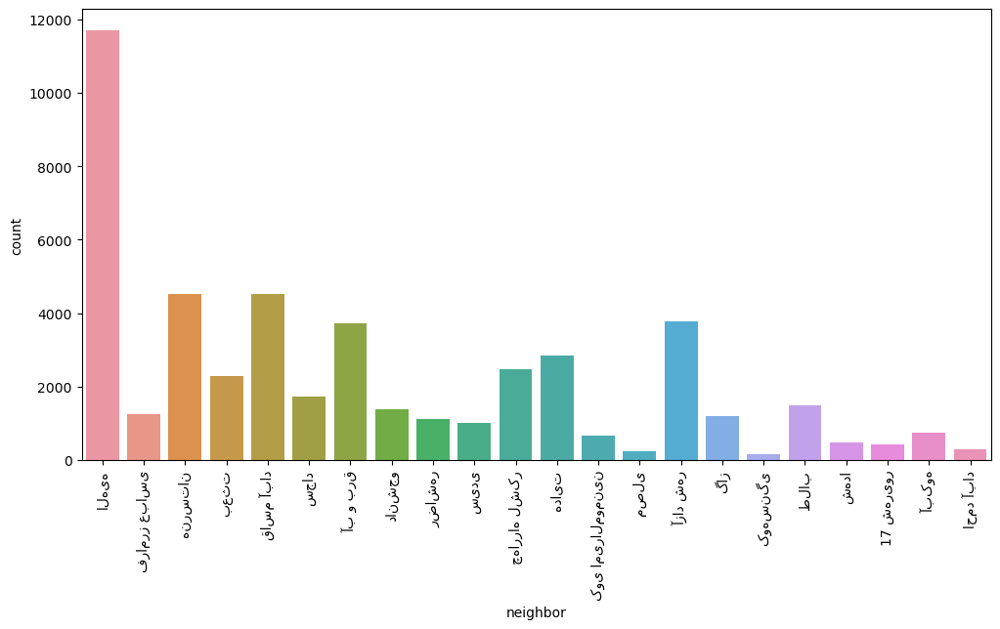

In [38]:
plt.figure(figsize = (12,6))
sns.countplot(x = "neighbor", data = train_data)
plt.xticks(rotation = 90)
plt.show()

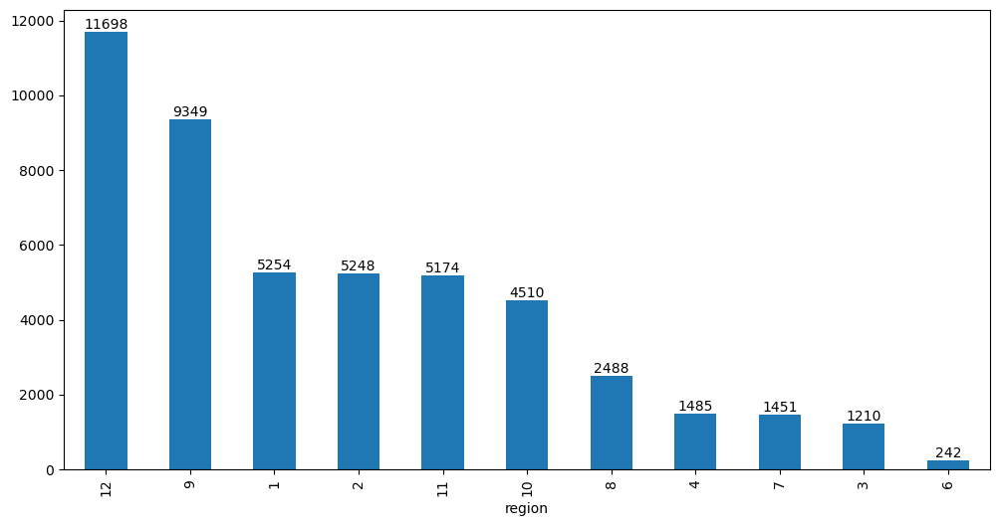

In [39]:
plt.figure(figsize = (12,6))
ax = train_data.region.value_counts().sort_values(ascending=False).iloc[:30].plot.bar()
for cont in ax.containers :
    ax.bar_label(cont)
plt.xticks(rotation = 90)
plt.show()

### latitude & longitude

<Axes: xlabel='longitude', ylabel='latitude'>

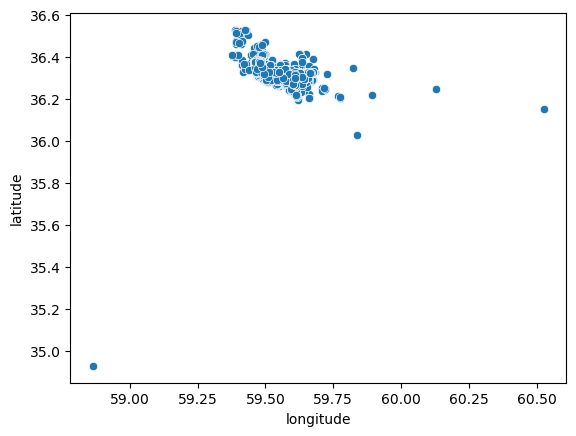

In [40]:
sns.scatterplot(data=train_data, x = "longitude", y = "latitude")

In [41]:
train_data.loc[train_data.latitude.nsmallest(1).index]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
18524,فروش آپارتمان,145.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,متری جلال طبقه تک واحدی از فول\r\n☘️ درو...,34.929853,58.863373,17.0,4,3.0,"4,950,000,000 تومان",11,آزاد شهر,آزادشهر


In [42]:
jalal_street = train_data[(train_data.street == "آزادشهر") & (train_data.description.notna()) & (train_data.description.str.contains("جلال"))]

In [43]:
lat_mod, long_mod = jalal_street.latitude.value_counts().index[0], jalal_street.longitude.value_counts().index[0]
lat_mod,long_mod

(36.32754, 59.52752)

In [44]:
train_data.loc[train_data.latitude.nsmallest(1).index, ["latitude", "longitude"]] = lat_mod,long_mod

<Axes: xlabel='longitude', ylabel='latitude'>

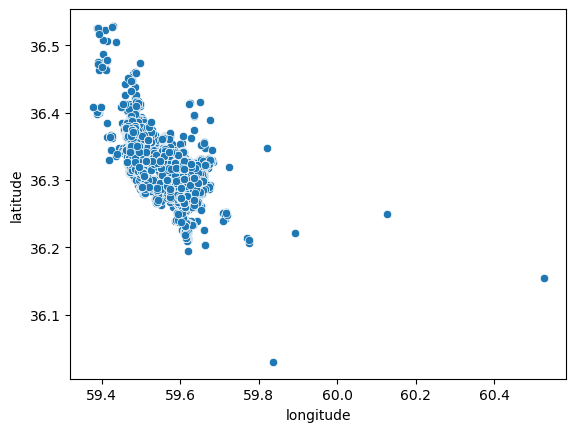

In [45]:
sns.scatterplot(data=train_data, x = "longitude", y = "latitude")

In [46]:
train_data.latitude.nsmallest(2)

4707     36.030048
32687    36.154324
Name: latitude, dtype: float64

In [47]:
train_data.loc[train_data.latitude.nsmallest(1).index]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
4707,فروش آپارتمان,180.0,منطقه 9 محله هنرستان خیابان کوثر جنوبی,متر کوثر شمالی / صفر / تکواحدی\r\n☎️مسکن ...,36.030048,59.836034,0.0,4,3.0,"11,550,000,000 تومان",9,هنرستان,کوثر جنوبی


In [48]:
kosar_jonobi_neighborhood = train_data[(train_data.neighborhood.str.contains("کوثر جنوبی")) & (train_data.description.notna()) & (train_data.description.str.contains("کوثر جنوبی"))]

In [49]:
lat_mod, long_mod = kosar_jonobi_neighborhood.latitude.value_counts().index[0], kosar_jonobi_neighborhood.longitude.value_counts().index[0]
lat_mod,long_mod

(36.30632229765302, 59.50754560098833)

In [50]:
train_data.loc[train_data.latitude.nsmallest(1).index, ["latitude", "longitude"]] =  lat_mod, long_mod

In [51]:
# train_data[(train_data.neighborhood.str.contains("کوثر شمالی"))]

In [52]:
# train_data[(train_data.neighborhood.str.contains("کوثر جنوبی")) & (train_data.description.notna()) & (train_data.description.str.contains("کوثر شمالی"))]

<Axes: xlabel='longitude', ylabel='latitude'>

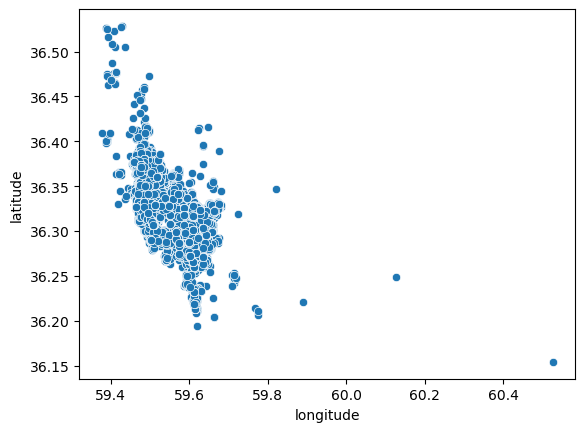

In [53]:
sns.scatterplot(data=train_data, x = "longitude", y = "latitude")

In [54]:
train_data.loc[train_data.latitude.nsmallest(1).index]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
32687,فروش ویلایی,250.0,منطقه 9 محله رضاشهر خیابان باهنر,متر زمین متر زیربنا خوابه. مزداوند. ...,36.154324,60.525852,22.0,0,2.0,"400,000,000 تومان",9,رضاشهر,باهنر


In [55]:
print(train_data.loc[train_data.latitude.nsmallest(1).index]["description"].iloc[0])

     متر زمین    متر زیربنا   خوابه. مزداوند. سرخس
منزل واقع در شهر مزداوند    کیلومتری مشهد. بین راه مشهد و سرخس. اب و هوای یلاقی.بالکن دارد - سال ساخت      -    خواب   :               - پارکینگ دارد - انباری دارد - جهت ساختمان : شمالی -  


In [56]:
train_data.drop(train_data.latitude.nsmallest(1).index, inplace=True)

<Axes: xlabel='longitude', ylabel='latitude'>

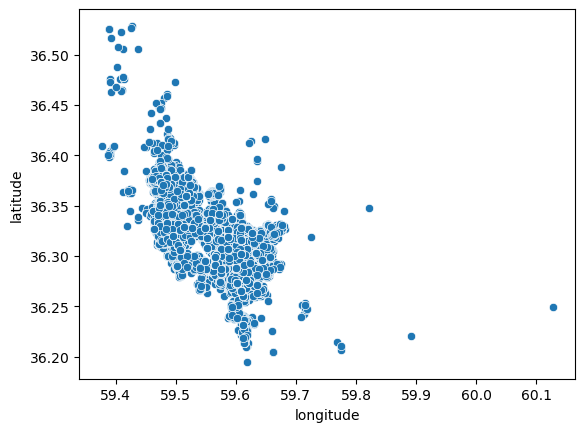

In [57]:
sns.scatterplot(data=train_data, x = "longitude", y = "latitude")

In [58]:

train_data.loc[train_data.longitude.nlargest(7).index]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
47696,فروش ویلایی,100.0,منطقه 9 محله رضاشهر خیابان باهنر,خانه فروشی میامی\r\nسلام خانه فروشی نزدیک اما...,36.248910,60.127060,12.0,0,2.0,"700,000,000 تومان",9,رضاشهر,باهنر
3175,فروش ویلایی,100.0,منطقه 9 محله رضاشهر خیابان باهنر,خانه متر زمین \r\nامتیاز تکمیل خواب ت...,36.220737,59.891020,30.0,0,2.0,"1,000,000,000 تومان",9,رضاشهر,باهنر
38441,فروش آپارتمان,170.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,متری/اول زیباشهر/صفر تحویل/مارکدار/سفیر نش...,36.347416,59.821930,0.0,4,3.0,"7,400,000,000 تومان",11,آزاد شهر,آزادشهر
4972,فروش آپارتمان,85.0,منطقه 9 محله رضاشهر خیابان باهنر,آپارتمان شیک و جدید\r\nبا تشکر از عوامل دیوار...,36.210033,59.774790,0.0,3,2.0,"1,250,000,000 تومان",9,رضاشهر,باهنر
18152,فروش آپارتمان,100.0,منطقه 9 محله رضاشهر خیابان باهنر,واحد متری به صورت یکجاوجدافروخته میشود\r\n...,36.206844,59.774654,NaN,1,2.0,"2,000,000,000 تومان",9,رضاشهر,باهنر
32686,فروش ویلایی,100.0,منطقه 9 محله رضاشهر خیابان باهنر,یک واحد طبقه دوم راه جدا\r\nطبقه دوم راه جدا ...,36.210785,59.774544,3.0,0,1.0,"1,250,000,000 تومان",9,رضاشهر,باهنر
8409,فروش آپارتمان,75.0,منطقه 9 محله رضاشهر خیابان باهنر,اپارتمان متر دو خواب شهرک رضوی\r\n متر \...,36.214203,59.768536,6.0,1,2.0,"1,100,000,000 تومان",9,رضاشهر,باهنر


In [59]:
train_data.loc[train_data.longitude.nlargest(1).index]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
47696,فروش ویلایی,100.0,منطقه 9 محله رضاشهر خیابان باهنر,خانه فروشی میامی\r\nسلام خانه فروشی نزدیک اما...,36.24891,60.12706,12.0,0,2.0,"700,000,000 تومان",9,رضاشهر,باهنر


In [60]:
print(train_data.loc[train_data.longitude.nlargest(1).index]["description"].iloc[0])

 خانه فروشی میامی
سلام خانه فروشی نزدیک امامزاده یحیی درموقعیتی مکانی مناسب دارای امتیازات کامل.حیاط ماشین رو دارای یک خواب پذیرایی آشپزخانه وانباری..سال ساخت      -    خواب   :               - پارکینگ دارد - انباری دارد - بالکن ندارد - سند : قول‌نامه‌ای -  


In [61]:
train_data.drop(train_data.longitude.nlargest(1).index, inplace=True)

In [62]:
train_data.loc[train_data.longitude.nlargest(1).index]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
3175,فروش ویلایی,100.0,منطقه 9 محله رضاشهر خیابان باهنر,خانه متر زمین \r\nامتیاز تکمیل خواب ت...,36.220737,59.89102,30.0,0,2.0,"1,000,000,000 تومان",9,رضاشهر,باهنر


In [63]:
bahonar_street = train_data[(train_data.street == "باهنر")]

In [64]:
lat_mod, long_mod = bahonar_street.latitude.value_counts().index[0], bahonar_street.longitude.value_counts().index[0]
lat_mod,long_mod

(36.31525603250135, 59.52550015586471)

In [65]:
train_data.loc[train_data.longitude.nlargest(1).index, ["latitude", "longitude"]] =  lat_mod, long_mod

In [66]:
train_data.loc[train_data.longitude.nlargest(1).index]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
38441,فروش آپارتمان,170.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,متری/اول زیباشهر/صفر تحویل/مارکدار/سفیر نش...,36.347416,59.82193,0.0,4,3.0,"7,400,000,000 تومان",11,آزاد شهر,آزادشهر


In [67]:
azad_shahr_street = train_data[(train_data.street == "آزادشهر")]

In [68]:
lat_mod, long_mod = azad_shahr_street.latitude.value_counts().index[0], azad_shahr_street.longitude.value_counts().index[0]
lat_mod,long_mod

(36.32754, 59.52752)

In [69]:
train_data.loc[train_data.longitude.nlargest(1).index, ["latitude", "longitude"]] =  lat_mod, long_mod

<Axes: xlabel='longitude', ylabel='latitude'>

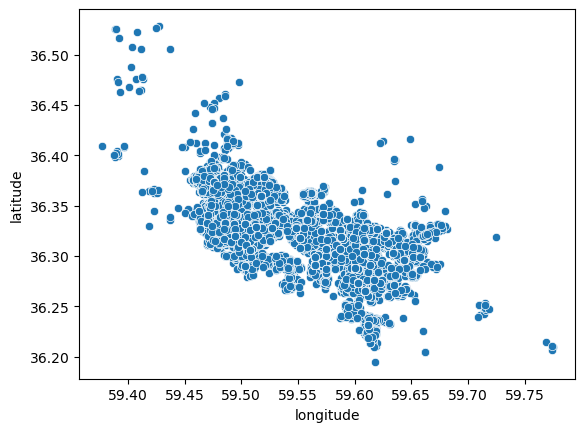

In [70]:
sns.scatterplot(data=train_data, x = "longitude", y = "latitude")

In [71]:
train_data.loc[train_data.longitude.nlargest(4).index]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
4972,فروش آپارتمان,85.0,منطقه 9 محله رضاشهر خیابان باهنر,آپارتمان شیک و جدید\r\nبا تشکر از عوامل دیوار...,36.210033,59.774790,0.0,3,2.0,"1,250,000,000 تومان",9,رضاشهر,باهنر
18152,فروش آپارتمان,100.0,منطقه 9 محله رضاشهر خیابان باهنر,واحد متری به صورت یکجاوجدافروخته میشود\r\n...,36.206844,59.774654,NaN,1,2.0,"2,000,000,000 تومان",9,رضاشهر,باهنر
32686,فروش ویلایی,100.0,منطقه 9 محله رضاشهر خیابان باهنر,یک واحد طبقه دوم راه جدا\r\nطبقه دوم راه جدا ...,36.210785,59.774544,3.0,0,1.0,"1,250,000,000 تومان",9,رضاشهر,باهنر
8409,فروش آپارتمان,75.0,منطقه 9 محله رضاشهر خیابان باهنر,اپارتمان متر دو خواب شهرک رضوی\r\n متر \...,36.214203,59.768536,6.0,1,2.0,"1,100,000,000 تومان",9,رضاشهر,باهنر


In [72]:
train_data[(train_data.description.notna()) & (train_data.description.str.contains("شهرک رضوی"))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
8409,فروش آپارتمان,75.0,منطقه 9 محله رضاشهر خیابان باهنر,اپارتمان متر دو خواب شهرک رضوی\r\n متر \...,36.214203,59.768536,6.0,1,2.0,"1,100,000,000 تومان",9,رضاشهر,باهنر
17981,فروش ویلایی,210.0,منطقه 9 محله رضاشهر خیابان باهنر,یک دستگاه خونه ویلایی متر بازسازی شده\r\n...,36.315256,59.525500,7.0,0,2.0,"2,100,000,000 تومان",9,رضاشهر,باهنر
32686,فروش ویلایی,100.0,منطقه 9 محله رضاشهر خیابان باهنر,یک واحد طبقه دوم راه جدا\r\nطبقه دوم راه جدا ...,36.210785,59.774544,3.0,0,1.0,"1,250,000,000 تومان",9,رضاشهر,باهنر


In [73]:
train_data.drop(train_data.longitude.nlargest(4).index, inplace=True)

In [74]:
train_data.loc[train_data.longitude.nlargest(1).index]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
19619,فروش ویلایی,106.0,منطقه 3 محله گاز خیابان طبرسی شمالی,زمین متری قلفتی\r\nسلام زمین متری شترک ...,36.319027,59.724964,NaN,0,0.0,"690,000,000 تومان",3,گاز,طبرسی شمالی


In [75]:
lat_mod, long_mod = bahonar_street.latitude.value_counts().index[0], bahonar_street.longitude.value_counts().index[0]
lat_mod,long_mod

(36.31525603250135, 59.52550015586471)

In [76]:
train_data.loc[train_data.longitude.nlargest(14).index[1:], ["latitude", "longitude"]] =  lat_mod, long_mod

<Axes: xlabel='longitude', ylabel='latitude'>

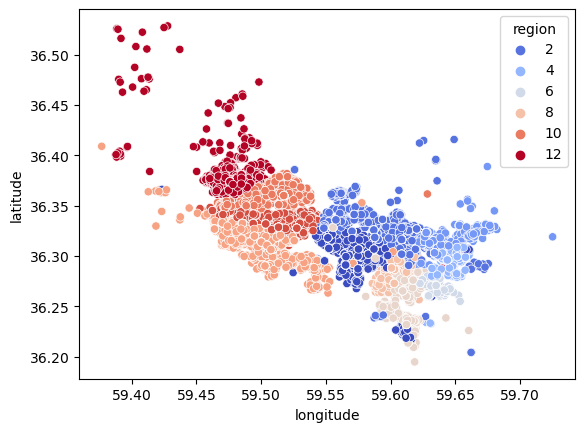

In [77]:
sns.scatterplot(data=train_data, x = "longitude", y = "latitude", hue = "region", palette = "coolwarm")

In [78]:
koy_amir_neighbor = train_data[(train_data.neighbor == "کوی امیرالمومنین") & (train_data.street == "ولیعصر") & (train_data.latitude > 36.25)].iloc[[0]]

In [79]:
lat_mod, long_mod = koy_amir_neighbor.latitude.iloc[0], koy_amir_neighbor.longitude.iloc[0]
lat_mod,long_mod

(36.339455, 59.580868)

In [80]:
train_data.loc[(train_data.latitude < 36.25) & (train_data.region == 2), ["latitude", "longitude"]] =  lat_mod, long_mod

In [81]:
train_data.drop(train_data[(train_data.latitude > 36.45) & (train_data.longitude < 59.44)].index, inplace=True)

In [82]:
train_data.drop(train_data[(train_data.longitude < 59.40)].index, inplace=True)

In [83]:
street_name_lat_long = train_data[(train_data.longitude > 59.6) & (train_data.latitude > 36.35)].street.unique()

In [84]:
for s in street_name_lat_long :
    street_data = train_data[train_data.street == s]
    lat, long = street_data.latitude.value_counts().index[0],  street_data.longitude.value_counts().index[0]
    train_data.loc[(train_data.longitude > 59.6) & (train_data.latitude > 36.35) & (train_data.street == s), ["latitude", "longitude"]] = lat, long

In [85]:
boronsi_aprt_street = train_data.loc[(train_data.street.str.contains("برونسی"))]
lat, long =  boronsi_aprt_street.latitude.value_counts().index[0],  boronsi_aprt_street.longitude.value_counts().index[0]
lat,long

(36.32676539888356, 59.46392572398653)

In [86]:
train_data.loc[(train_data.longitude < 59.43) & (train_data.type.str.contains("ویلایی") == False) & (train_data.street == "برونسی"), ["latitude", "longitude"]] = lat, long

In [87]:
train_data.drop(train_data[(train_data.longitude < 59.43) & (train_data.type.str.contains("ویلایی"))].index, inplace=True)

In [88]:
tabr_shomali_aprt_street = train_data.loc[(train_data.street.str.contains("طبرسی شمالی"))]
lat, long =  tabr_shomali_aprt_street.latitude.value_counts().index[0],  tabr_shomali_aprt_street.longitude.value_counts().index[0]
lat,long

(36.32321, 59.62739)

In [89]:
train_data.loc[(train_data.longitude > 59.70) &  (train_data.street == "طبرسی شمالی"), ["latitude", "longitude"]] = lat, long

In [90]:
askarie_street = train_data[train_data.street == "میدان عسگریه"]

In [91]:
lat, long =  askarie_street.latitude.value_counts().index[0],  askarie_street.longitude.value_counts().index[0]
lat,long

(36.29929, 59.65132)

In [92]:
train_data[(train_data.longitude > 59.60) & (train_data.latitude < 36.25) & (train_data.region == 4)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
3877,فروش ویلایی,75.0,منطقه 4 و 5 محله طلاب خیابان میدان عسگریه,خانه ویلایی متری .\r\nخانه ویلایی متری \n...,36.234108,59.627163,7.0,0,2.0,"1,900,000,000 تومان",4,طلاب,میدان عسگریه
14091,فروش آپارتمان,75.0,منطقه 4 و 5 محله طلاب خیابان میدان عسگریه,آپارتمان متری طبقه همکف\r\nآپارتمان متر...,36.232777,59.630833,0.0,0,2.0,"1,200,000,000 تومان",4,طلاب,میدان عسگریه
34386,فروش آپارتمان,75.0,منطقه 4 و 5 محله طلاب خیابان میدان عسگریه,قولنامه ای دو خواب و پشت بام اختصاصی\r\nآیفون...,36.233380,59.630695,NaN,3,2.0,"1,300,000,000 تومان",4,طلاب,میدان عسگریه
41018,فروش آپارتمان,75.0,منطقه 4 و 5 محله طلاب خیابان میدان عسگریه,آپارتمان نیمه اماده\r\nبا سلام آپارتمان طبقه ...,36.232765,59.631035,0.0,2,1.0,"740,000,000 تومان",4,طلاب,میدان عسگریه
44894,فروش آپارتمان,75.0,منطقه 4 و 5 محله طلاب خیابان میدان عسگریه,آپارتمان تازه ساز متر\r\nآپارتمان تازه ساز...,36.233300,59.630500,NaN,0,2.0,"1,240,000,000 تومان",4,طلاب,میدان عسگریه


In [93]:
train_data.loc[(train_data.longitude > 59.60) & (train_data.latitude < 36.25) & (train_data.region == 4), ["latitude", "longitude"]] = lat, long

In [94]:
train_data[(train_data.longitude < 59.43)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
17450,فروش آپارتمان,126.0,منطقه 1 محله احمد آباد خیابان دانشگاه,NaN,36.366146,59.423466,1.0,4,2.0,"2,770,000,000 تومان",1,احمد آباد,دانشگاه


In [95]:
daneshgah_street = train_data[(train_data.street == "دانشگاه")]

In [96]:
train_data.loc[(train_data.longitude < 59.43), ["latitude", "longitude"]] =  daneshgah_street.latitude.value_counts().index[0],  daneshgah_street.longitude.value_counts().index[0]

+  They are out of mashhad

### __area__

In [97]:
train_data.area.describe()

count     48068.000000
mean        165.821574
std        2097.724765
min           0.000000
25%          85.000000
50%         112.000000
75%         156.000000
max      300000.000000
Name: area, dtype: float64

<Axes: ylabel='Density'>

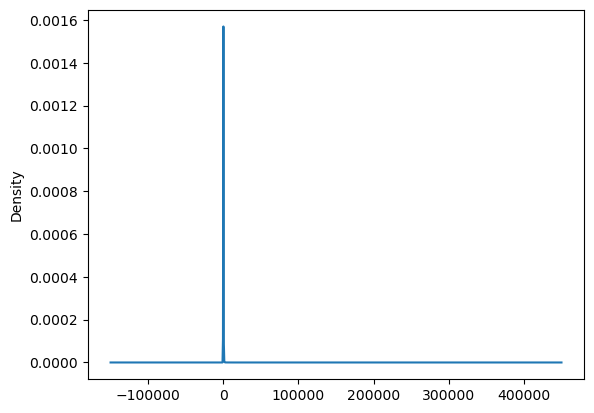

In [98]:
train_data.area.plot.kde()

In [99]:
train_data[train_data.area == 0].price.value_counts()

price
0 تومان                   551
توافقی                     56
2,790,000,000 تومان         1
7,000,000,000 تومان         1
5,616,000,000 تومان         1
2,700,000,000 تومان         1
2,000,000,000 تومان         1
2,590,000,000 تومان         1
1,900,000,000 تومان         1
Name: count, dtype: int64

### __Price__

In [100]:
train_data.price

0         2,200,000,000 تومان   
1         4,800,000,000 تومان   
2        10,200,000,000 تومان   
4         5,350,000,000 تومان   
6         5,200,000,000 تومان   
                  ...           
48116     4,100,000,000 تومان   
48117     5,500,000,000 تومان   
48118     4,100,000,000 تومان   
48119     3,200,000,000 تومان   
48120                 0 تومان   
Name: price, Length: 48068, dtype: object

In [101]:
train_data.price.value_counts()

price
0 تومان                    1919
3,500,000,000 تومان         742
3,000,000,000 تومان         729
4,000,000,000 تومان         600
2,500,000,000 تومان         600
                           ... 
4,307,000,000 تومان           1
6,314,000,000 تومان           1
7,670,000,000 تومان           1
33,600,000,000 تومان          1
35,700,000,000 تومان          1
Name: count, Length: 2861, dtype: int64

In [102]:
train_data[train_data.price.str.strip() == "0 تومان"]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
55,فروش آپارتمان,0.0,منطقه 2 محله کوی امیرالمومنین خیابان کوی امیر...,سه خواب/صفر/فول\r\nبا سلام \nآپارتمان واقع در...,36.341250,59.571770,0.0,0,0.0,0 تومان,2,کوی امیرالمومنین,کوی امیرالمومنین
59,فروش آپارتمان,0.0,منطقه 12 محله الهیه خیابان الهیه,متری-روژان-سه نبش\r\nبا سلام\nواحد در حال ...,36.378821,59.462804,0.0,0,0.0,0 تومان,12,الهیه,الهیه
73,فروش آپارتمان,125.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,مترى سروش جلال بین مهران و اموزگار\r\nدرو...,36.327540,59.527520,0.0,0,0.0,0 تومان,11,آزاد شهر,آزادشهر
83,فروش آپارتمان,160.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,متری*انتهای فرامرز\r\n متری سه خواب\nم...,36.346940,59.557926,0.0,0,0.0,0 تومان,2,فرامرز عباسی,فرامرز عباسی
120,فروش آپارتمان,0.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,سید رضی تک واحدی\r\n.\n ...,36.328550,59.513390,0.0,0,0.0,0 تومان,11,آزاد شهر,فرهنگ
...,...,...,...,...,...,...,...,...,...,...,...,...,...
48073,فروش آپارتمان,500.0,منطقه 9 محله رضاشهر خیابان رضاشهر,مشارکت درساخت مترشمالی رضاشهر\r\nقابل توجه...,36.288372,59.540913,0.0,0,0.0,0 تومان,9,رضاشهر,رضاشهر
48074,فروش آپارتمان,200.0,منطقه 12 محله الهیه خیابان الهیه,متر تک واحدی مدرن بدون مشابه\r\nالهیه - \n...,36.373776,59.475820,0.0,0,0.0,0 تومان,12,الهیه,الهیه
48086,فروش آپارتمان,100.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,متر پیش فروش ادیب \r\n** بنام خدای مهربا...,36.360020,59.517400,0.0,0,0.0,0 تومان,10,قاسم آباد,قاسم آباد
48091,فروش آپارتمان,125.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان پیش‌فروش متری رحمانیه \r\nباسلام ...,36.373776,59.475820,0.0,0,0.0,0 تومان,12,الهیه,الهیه


In [103]:
train_data[train_data.price.str.strip() == "0 تومان"].nunique()

type               2
area             154
neighborhood      75
description     1906
latitude         325
longitude        323
age                4
floor              6
bedrooms           5
price              1
region            11
neighbor          22
street            75
dtype: int64

In [104]:
for desc in train_data[train_data.price.str.strip() == "0 تومان"]["description"].sample(5):
    print(desc, end = "\n" + "--" * 30 + "\n")

 پیش فروش   متری رحمانیه 
عرض ادب 

پیش فروش  ماه دیگر تحویل 
متریال عالی 
برند منطقه 
رحمانیه   یا میثاق    
کابینت چوب 
مشاعات تمام سنگ 
نما ساختمان سنگ عباس آباد 
ورودی     
تحویل سند    میلیون 
_____________
ورودی کمتر موجود میباشد 
________
جهت بازدید  واحد های مشابه تماس حاصل فرمایید
_____________
آدرس دفتر 
محمدیه    روبروی هاشمی رفسنجانی   /  املاک چاردیواری 
کارشناس امور ملکی مهندس شورگشتی 
______________ 
------------------------------------------------------------
 ویلایی     متر سجاد تریبلکس صفر
   متر زمین 

    متر زیربنا تریبلکس 

صفر لوکس ولاکچری 

نقشه ونورگیر بسیار عالی 

با مجموعه آبی فعال 

سالن ورزشی تجهیز شده 

تالار ضیافت 

حیاط و روف گاردن فضا سازی شده 

دارای تراسهای بزرگ قابل چیدمان 

آسانسور داخل واحد

خوابهای    متری بزرگ همراه با کلوزت 

سیستم روشنایی و امنیت کاملا هوشمند و حرفه ای

قابل معاوضه با ویلایی وآپارتمان 


(لطفا بدون واسطه)سال ساخت      - +   خواب   : توافقی - پارکینگ دارد - انباری دارد - بالکن دارد -  
-------------------------------------------

In [105]:
train_data[(train_data.price.str.strip() == "0 تومان") &  (train_data.description.str.contains("مشارکت|پیش|فروش|پیش فروش|صفر|تحویل|معاوضه|تهاتر") == False)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
708,فروش آپارتمان,120.0,منطقه 1 محله بعثت خیابان رضا,اپارتمان متری/ واحد داخل یک مجتمع\r\nکار...,36.291085,59.565186,0.0,0,0.0,0 تومان,1,بعثت,رضا
1292,فروش آپارتمان,100.0,منطقه 1 محله بعثت خیابان رضا,آپارتمان متر جنوبی رضاشهر\r\n سازنده بنا...,36.291085,59.565186,0.0,0,0.0,0 تومان,1,بعثت,رضا
1605,فروش آپارتمان,170.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,متر ** اوایل جلال **\r\n**** کارگزاری امل...,36.328550,59.513390,0.0,0,0.0,0 تومان,11,آزاد شهر,فرهنگ
1677,فروش آپارتمان,110.0,منطقه 12 محله الهیه خیابان الهیه,متری محمدیه \r\nلوکیشن بلوک الهیه _محمد...,36.373776,59.475820,0.0,0,0.0,0 تومان,12,الهیه,الهیه
1688,فروش آپارتمان,100.0,منطقه 12 محله الهیه خیابان الهیه,متری فقط امروز و فردا\r\nاول مجیدیه \nسه ...,36.373776,59.475820,0.0,0,0.0,0 تومان,12,الهیه,الهیه
...,...,...,...,...,...,...,...,...,...,...,...,...,...
45670,فروش آپارتمان,99.0,منطقه 12 محله الهیه خیابان امیریه,اپارتمان متری /تقویه\r\n☑️ کابینت چوب ، گاز...,36.380667,59.484676,0.0,0,0.0,0 تومان,12,الهیه,امیریه
46192,فروش آپارتمان,165.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,بلوار امامت /دو ممر /پلان مهندسی و متفاوت ...,36.336877,59.537678,0.0,0,0.0,0 تومان,11,آزاد شهر,آزادشهر
46646,فروش آپارتمان,85.0,منطقه 12 محله الهیه خیابان الهیه,اپارتمان متری برند حاشیه بولوار\r\nاپارتما...,36.373776,59.475820,0.0,0,0.0,0 تومان,12,الهیه,الهیه
47108,فروش آپارتمان,105.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,متری بلوار شریعتی فول\r\nبا سلام درود ...,36.360020,59.517400,0.0,0,0.0,0 تومان,10,قاسم آباد,قاسم آباد


In [106]:
train_data[(train_data.price.str.strip() == "0 تومان") &  (train_data.description.str.contains("تهاتر|مشارکت|معاوضه") == False)].iloc[:, -2].value_counts()

neighbor
الهیه               521
آزاد شهر            202
قاسم آباد           107
هنرستان              79
بعثت                 74
چهارراه لشکر         61
آب و برق             54
دانشجو               47
طلاب                 43
هدایت                38
فرامرز عباسی         34
سجاد                 29
سیدی                 26
رضاشهر               22
کوی امیرالمومنین     20
آبکوه                14
گاز                  12
احمد آباد             8
شهدا                  7
17 شهریور             7
مصلی                  4
کوهسنگی               3
Name: count, dtype: int64

In [107]:
for desc in train_data[(train_data.price.str.strip() == "0 تومان") &  (train_data.description.str.contains("مشارکت|پیش|فروش|پیش فروش|صفر|تحویل|معاوضه|تهاتر"))]["description"].sample(5):
    print(desc, end = "\n" + "--" * 30 + "\n")

     متر در حاشیه بلوار شاهد با شرایط مناسب
با سلام
    متر   خوابه با عرض   
سازه بتن و سقف ها وافل بدون هیچ گونه ستونی در وسط واحد آپارتمان
نمونه کارهای سازنده در هفت تیر و صارمی و دانش آموز و صیاد شیرازی و منطقه الهیه و قاسم اباد هم به تعداد زیاد
عرصه ملک     متر در شش طبقه و دوازده واحد
بدون هیچ مغازه و تجاری یعنی کاملا مسکونی
بین شاهد    و چهارراه راه آهن
تحویل   ماه اینده
متریال و نصبیجات فول و تکمیل
سهم العرصه هم انتقال داده میشود
با واحد کوچک هم معاوضه میشود
با تشکر 
------------------------------------------------------------
 اپارتمان     متری پیش فروش حسابی شمالی
با سلام و عرض ادب 
پیش فروش یک واحد اپارتمان     متری دو خواب
واقع در حسابی شمالی
_____________________________
✔️ حاشیه خیابان    متری
✔️ برند مطرح منطقه 
✔️  طبقه   واحد
✔️ طبقه سوم | جهت ملک شمالی واحد رو به آفتاب
✔️ کف سرامیک  ×   | کابینت چوب
✔️ نصبیجات کامل 
✖️پیش پرداخت:  .   (قابل مذاکره)
‼️  .    همزمان با تحویل آپارتمان و سند ‼️
[[نمونه کار تحویلی جهت بازدید موجود است]]
❗️وکالت محضری از سهم العرصه ❗️
‌( کل

In [108]:
train_data[(train_data.price.str.contains('توافقی'))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
300,فروش آپارتمان,92.0,منطقه 9 محله هنرستان خیابان هاشمیه,هاشمیه ، متر ، طبقه اول و دوم\r\nدو وا...,36.310605,59.504477,0.0,0,0.0,توافقی,9,هنرستان,هاشمیه
400,فروش آپارتمان,270.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,متردونبش مشارکت درساخت*شاهد تراکم زیاد*ساز...,36.360020,59.517400,0.0,0,0.0,توافقی,10,قاسم آباد,قاسم آباد
1354,فروش آپارتمان,0.0,منطقه 3 محله گاز خیابان طبرسی شمالی,پیش فروش، سفت کاری\r\nبا عرض سلام خدمت دوستان...,36.323210,59.627390,0.0,0,0.0,توافقی,3,گاز,طبرسی شمالی
1460,فروش آپارتمان,0.0,منطقه 2 محله هدایت خیابان ابوطالب,پیش فروش\r\nباسلام\nپیش فروش واحد های متری...,36.363956,59.562523,0.0,0,0.0,توافقی,2,هدایت,ابوطالب
1503,فروش آپارتمان,0.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,مشارکت‌درساخت‌‌یا‌فروش\r\nسلام‌خونه‌ویلای‌کلن...,36.272780,59.602730,0.0,0,0.0,توافقی,8,چهارراه لشکر,امام رضا
...,...,...,...,...,...,...,...,...,...,...,...,...,...
44777,فروش آپارتمان,115.0,منطقه 12 محله الهیه خیابان الهیه,واحد متری اقدسیه\r\nواحد متری \nخوش ن...,36.373776,59.475820,0.0,0,0.0,توافقی,12,الهیه,الهیه
44902,فروش آپارتمان,52.0,منطقه 7 محله سیدی خیابان کوشش,پیش فروش آپارتمان متری یک خواب\r\nملک واقع د...,36.239372,59.603916,0.0,0,0.0,توافقی,7,سیدی,کوشش
45593,فروش آپارتمان,93.0,منطقه 3 محله گاز خیابان طبرسی شمالی,آپارتمان متری .طبرسی .\r\nآپارتمان متری...,36.319794,59.660206,0.0,0,0.0,توافقی,3,گاز,طبرسی شمالی
46056,فروش آپارتمان,0.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,پیش فروش اپارتمان\r\nباسلام آپارتمان پیش فروش...,36.272780,59.602730,0.0,0,0.0,توافقی,8,چهارراه لشکر,امام رضا


In [109]:
train_data[(train_data.price.str.contains('توافقی')) &  (train_data.description.str.contains("مشارکت|پیش|فروش|تحویل|معاوضه") == False)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
8343,فروش آپارتمان,65.0,منطقه 3 محله گاز خیابان طبرسی شمالی,امتیاز ساخت متر پشت بام طبقه ی دوم روی همکف...,36.323210,59.627390,0.0,0,0.0,توافقی,3,گاز,طبرسی شمالی
10541,فروش آپارتمان,0.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,آپارتمان صفر جلال برند\r\nمتریال درجه یک \nتخ...,36.328550,59.513390,0.0,0,0.0,توافقی,11,آزاد شهر,فرهنگ
12142,فروش آپارتمان,0.0,منطقه 1 محله سجاد خیابان بهارستان,آپارتمان تمام اسکلت با شناژ\r\nهوایی خالی ...,36.321465,59.554749,0.0,0,0.0,توافقی,1,سجاد,بهارستان
16605,فروش آپارتمان,0.0,منطقه 1 محله بعثت خیابان کوهسنگی,آپارتمان شش طبقه به سبک کانکریت پرس و پنت هاو...,36.275745,59.566936,0.0,0,0.0,توافقی,1,بعثت,کوهسنگی
28387,فروش آپارتمان,108.0,منطقه 12 محله الهیه خیابان الهیه,حاشیه رحمانیه متر ، متری / / \r\nآ...,36.373577,59.465595,0.0,0,0.0,توافقی,12,الهیه,الهیه
36094,فروش آپارتمان,250.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,یک زمین متری در قاسم آباد\r\nبه یک انبوه ...,36.360020,59.517400,0.0,0,0.0,توافقی,10,قاسم آباد,قاسم آباد
42398,فروش آپارتمان,0.0,منطقه 3 محله گاز خیابان طبرسی شمالی,ملک فوق طبقه \r\nتقریبا متر می باشد,36.323210,59.627390,0.0,0,0.0,توافقی,3,گاز,طبرسی شمالی
47039,فروش آپارتمان,0.0,منطقه 3 محله گاز خیابان رسالت,راهنمایی برای خرید زمین برا مِغازه\r\nسلام خد...,36.303140,59.633800,0.0,0,0.0,توافقی,3,گاز,رسالت


In [110]:
for desc in train_data[(train_data.price.str.contains('توافقی')) &  (train_data.description.str.contains("مشارکت|پیش|فروش|تحویل|معاوضه"))]["description"].sample(5):
    print(desc, end = "\n" + "--" * 30 + "\n")

 آپارتمان نوساز
آپارتمان    متر
نوساز طبقه اول پله  .  
کولر گازی و پکیج آیفون تصویری نور مخفی کاغذ دیواری با طرح دلخواه درب ضد سرقت 
ابوطالب شمالی محمدزاده یک نزدیک حاشیه اصلی
منطقه ای آینده دار و رو به پیشرفت نزدیک بازار و پمپ بنزین و ایستگاه اتوبوس
از کل مبلغ نصف الان نصف هم موقع تحویل   ماه دیگه 
تخفیف خوب پای قولنامه چک صیادی هم قابل قبول
    هم رهن میکنن 
------------------------------------------------------------
 پیش فروش آپارتمان     متر تک واحدی دو خواب فول
( پیش فروش)آپارتمان دو خوابه 
تک واحدی 
  متر حاشیه 
خوش نقشه
موقعیت مکانی خوب 
نما سنگ درجه یک 
کابینت ام دی اف 
آسانسور
پارکینگ 
تراس
نورگیر عالی
گرمایش از کف 
پکیج 
شیرآلات اهرمی
هود
توالت فرنگی
خواب مستر
آهن اصفهان سنگین 
دیوار برشی 
سقف کامپوزیت 
شخصی ساز
متری    م 
لطفا بدون واسطه تماس بگیرید 
------------------------------------------------------------
 هوای   یا روهمکف فروش .   متری در برسی شمالی  
طبقه چهارم روهمکف قطعه ی دوم از سر نبش بهترین جای طبرسی   .نزدیک ب همه چی و همه جا حاشیه ی متر نورگیر عالی ب علته کم 

In [111]:
for desc in train_data[(train_data.age == 0) & (train_data.price != "توافقی")]["description"].sample(5):
    print(desc, end = "\n" + "--" * 30 + "\n")

    متری/ واحدی-رحمانیه
✔️ شاهسون 
 ✔️ شاهسون 

 ⚜️ مسکن پاژ⚜️
——————————————————
✔️ عکس اگهی واقعی میباشد✔️

واحد    متری بسیار شیک - نبش 
 کم واحد -  واحدی 

بهترین بلوار الهیه(رحمانیه)
حاشیه بلوار اصلی-پذیرای بزرگ
پنجره های قدی کف تا سقف-تمام نور گیر
هر  خواب نور گیر- مستر دار

نما شیک - نور پردازی شده- امکانات تمام فول

متریال و مشاعات عالی- 

نزدیک به تمام اماکانت خرید و رفاهی

✅موارد مشابه در قیمت و متراژ مختلف موجود است
______________________________
بازدید با هماهنگی: شاهسونسال ساخت      -    خواب   :                 - طبقه   - آسانسور دارد - پارکینگ دارد - انباری دارد -  
------------------------------------------------------------
    متری بزرگمهر سجاد
سلام 
 طبقه   واحد 
منفی  و هکمف پارکینگ 
سند اماده 
دو خواب نور گیر 
پلان نقشه بی نقص 
موقعیت جنوبی 
طراحی نئو کلاسیک 
تراس قابل نشیمن 
کلید موجود 
بی واسطه 
دبیر 
اطلاعات بیشتر تماس 
چت پاسخگو نیستمسال ساخت      -    خواب   :                  - طبقه   - آسانسور دارد - پارکینگ دارد - انباری دارد -  
---------------------------

In [112]:
train_data[train_data.price.str.contains('توافقی')].nunique()

type              1
area             43
neighborhood     38
description     130
latitude         69
longitude        69
age               1
floor             1
bedrooms          1
price             1
region           11
neighbor         17
street           38
dtype: int64

In [113]:
for desc in train_data[train_data.price.str.contains('توافقی')]["description"].sample(5):
    print(desc, end = "\n" + "--" * 30 + "\n")

 اپارتمان     متری  خواب امیریه   
امکانات عالی
     وام
تحویل برج  
امکانات رفاهی.پارک.هایپر مارکت... 
------------------------------------------------------------
 پیش فروش   % نزدیک حرم
باسلام

پیش فروش 
  %
  %
  %

نزدیک حرم 

سازنده معتبر 

تضمین تعهدات به وسیله وکالت از زمین ،چک کل مبلغ  ،قولنامه هولوگرام دار و....

یاعلی 
------------------------------------------------------------
 پیش فروش آپارتمان   متری دوخوابه
با سلام پیش فروش آپارتمان   متری واقع درامام خمینی    باپارکینگ آسانسور دوخوابه  متر حاشیه بامتریال روز 
------------------------------------------------------------
 اپارتمان ١٠٠ متری رباط طرق پارکینگ اسانسور
پیش فروش اپارتمان ١٠٠ متری 
اسکلت اهن ١٦ اصفهان
کف شناژ ١*١
پارکینگ و اسانسور
تحویل برج ١٢ 
نما سنگ
طبقه اول روی همکف
بهترین کوچه رباط طرق
توی مرحله سفت کاری
قیمت ١،٤٠٠
٦٠٪؜ پرادخت اولیه
معاوضه با خودرو 
------------------------------------------------------------
 پیشفروش واحداواپارتمانی مشهدمقدس
سلام.فروش فوری یک واحد طبقه دوم روبه نماسرسه نبش   متری به متراژ

In [114]:
k = train_data[(train_data.age == 0) & (train_data.price.str.strip() != "0 تومان") & (train_data.price.str.strip() != "توافقی")]
k.shape

(13083, 13)

In [115]:
 k[(k.description.notna()) & (k.description.str.contains("واگذاری"))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
462,فروش آپارتمان,170.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,متر صفر/مدرن و مجلل/جنوبی/فرصت خرید/سیدرضی...,36.334480,59.520480,0.0,6,3.0,"8,840,000,000 تومان",11,آزاد شهر,فرهنگ
894,فروش آپارتمان,127.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,متر سلطنتی مهندسی ساز متریال روز\r\n⭐⭐⭐از ...,36.360020,59.517400,0.0,4,3.0,"4,000,000,000 تومان",10,قاسم آباد,قاسم آباد
938,فروش آپارتمان,100.0,منطقه 12 محله الهیه خیابان الهیه,خواب* واحدی* نبش* الهیه\r\n⬛️◼️◾️مسکن ش...,36.369972,59.486730,0.0,1,2.0,"3,000,000,000 تومان",12,الهیه,الهیه
942,فروش آپارتمان,120.0,منطقه 2 محله کوی امیرالمومنین خیابان فدک,آپارتمان متری فول تک واحدی صفر\r\nواحد دار...,36.343246,59.571995,0.0,4,2.0,"2,550,000,000 تومان",2,کوی امیرالمومنین,فدک
1157,فروش آپارتمان,170.0,منطقه 9 محله هنرستان خیابان هفت تیر,واگذاری یا معاوضه/ نیروی هوایی\r\nمخصوص شیک پ...,36.319780,59.494770,0.0,4,3.0,"10,000,000,000 تومان",9,هنرستان,هفت تیر
...,...,...,...,...,...,...,...,...,...,...,...,...,...
46809,فروش آپارتمان,315.0,منطقه 1 محله سجاد خیابان سجاد,متر سجاد شاهکار\r\n✔️ ساختمان شخصی ساز با...,36.318036,59.551475,0.0,3,4.0,"35,300,000,000 تومان",1,سجاد,سجاد
46883,فروش آپارتمان,150.0,منطقه 12 محله الهیه خیابان الهیه,متر / صفر / سر نبش غرق نور / بدون مشرف\r\...,36.373776,59.475820,0.0,2,3.0,"5,100,000,000 تومان",12,الهیه,الهیه
46997,فروش آپارتمان,125.0,منطقه 12 محله الهیه خیابان الهیه,متری/حاشیه خیابان/محمدیه\r\n*کارگزاری بزر...,36.373776,59.475820,0.0,3,2.0,"4,200,000,000 تومان",12,الهیه,الهیه
47473,فروش آپارتمان,320.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,متر سجاد سوپر امپریال .متریال اروپایی خ...,36.272780,59.602730,0.0,2,4.0,"27,000,000,000 تومان",8,چهارراه لشکر,امام رضا


In [116]:
for desc in   k[(k.description.notna()) & (k.description.str.contains("واگذاری"))]["description"].sample(5):
    print(desc, end = "\n" + "--" * 30 + "\n")

 آپارتمان    متری نوساز (چراغچی  / )
با سلام
لطفا توضیحات رو با دقت بخونید.
آپارتمان فروشی    متر.
   خوابه،
طبقه اول.
دو نبش.
نوساز صفر
تخلیه
قولنامه ای
کابینت ام دی اف ملامینه
هود
گاز رو میزی
کمد دیواری
تراس
درب ضد سرقت
کف ها سرامیک
کاغذ دیواری
در صورت کمبود وجه ما     میلیون قابلیت واگذاری به رهن کامل را دارا می باشد.
همکاران عزیز لطفا تماس نگیرند.
جهت هماهنگی و بازدید
نبش هدایت **************************ر عضو رسمی اتحادیه املاک مشهد
عضویت:    
مشاور شما هستم در خرید،فروش،رهن و اجاره
مشارکت در ساخت
از اعتماد شما سپاسگزارم.سال ساخت      -    خواب   :                 - طبقه   از   - آسانسور ندارد - پارکینگ ندارد - انباری ندارد - تعداد واحد در طبقه   - سند : قول‌نامه‌ای -  
------------------------------------------------------------
     متری/  خواب رویایی/حاشیه خیابان
*کارگزاری بزرگ رویا*
*جامع ترین فایلینگ در منطقه*

⭐️سرمایه گذاری مطمئن همراه با مشاوره تخصصی⭐️

⭐️هر نوع ملکی که بخواهید متناسب با سلیقه شما فقط تماس بگیرید⭐️


--------------------------------
مشخصات ملک:
⚡️حاشیه خیاب

In [117]:
other_price_data = train_data[(train_data.price.str.strip() == "0 تومان") | (train_data.price.str.strip() == "توافقی")]

In [118]:
train_data = train_data.drop(other_price_data.index)

In [119]:
train_data.price = train_data.price.apply(lambda pr : pr.strip()[:-5].replace(',','')).astype(float)

In [120]:
train_data[train_data.area == 0]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
14518,فروش آپارتمان,0.0,منطقه 11 محله دانشجو خیابان صدف,متر خواب\r\nدرود\nبنده مالک هستم\n متر صد...,36.333390,59.495752,14.0,2,2.0,2.790000e+09,11,دانشجو,صدف
18651,فروش آپارتمان,0.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,آپارتمان امامت \r\nآپارتمان با نور گیری عالی...,36.327540,59.527520,18.0,2,3.0,7.000000e+09,11,آزاد شهر,آزادشهر
30918,فروش آپارتمان,0.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متر سه خواب یه خواب دارای مستر\r\...,36.373776,59.475820,5.0,2,3.0,5.616000e+09,12,الهیه,الهیه
33334,فروش آپارتمان,0.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,آپارتمان شخصی ساز فول\r\nخونه فول بازسازی درج...,36.372743,59.504568,12.0,2,2.0,2.700000e+09,10,قاسم آباد,قاسم آباد
35074,فروش آپارتمان,0.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,آپارتمان متر دوخواب\r\nآپارتمان متر ...,36.360020,59.517400,9.0,3,2.0,2.000000e+09,10,قاسم آباد,قاسم آباد
42969,فروش آپارتمان,0.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متر .دو خواب .\r\nآپارتمان از موق...,36.373776,59.475820,10.0,6,2.0,2.590000e+09,12,الهیه,الهیه
46485,فروش آپارتمان,0.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,آپارتمان متر دو خوابه\r\nآپارتمان تا خرداد...,36.349464,59.470745,10.0,0,2.0,1.900000e+09,10,قاسم آباد,قاسم آباد


In [121]:
train_data.drop(train_data[train_data.area == 0].index, inplace=True)

<Axes: xlabel='price'>

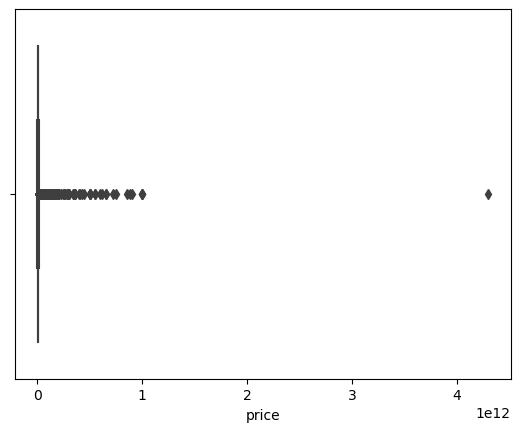

In [122]:
sns.boxplot(x = "price", data = train_data)

<Axes: xlabel='area', ylabel='price'>

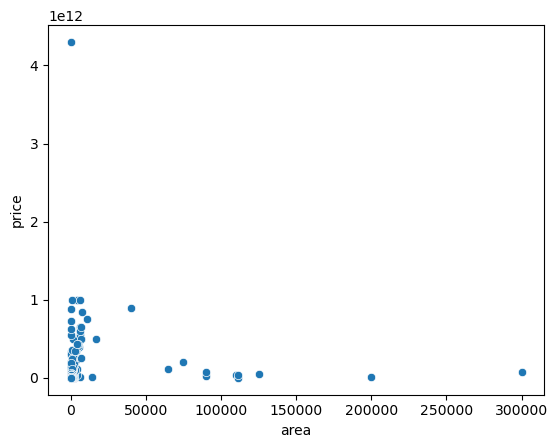

In [123]:
sns.scatterplot(x = "area", y = "price", data = train_data)

In [124]:
train_data.price.describe()

count    4.601200e+04
mean     6.780867e+09
std      2.709026e+10
min      1.111111e+06
25%      2.650000e+09
50%      3.900000e+09
75%      6.600000e+09
max      4.300000e+12
Name: price, dtype: float64

In [125]:
train_data.price.quantile(0.9),train_data.price.quantile(0.99)

(11500000000.0, 45000000000.0)

# -

In [126]:
train_data[train_data.price > train_data.price.quantile(0.999)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
19,فروش ویلایی,470.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,فروش ساختمان تجاری با دربند مغازه خیابان جن...,36.272780,59.602730,30.0,0,5.0,2.000000e+11,8,چهارراه لشکر,امام رضا
1980,فروش ویلایی,2500.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,ویلایی متر حاشیه صارمی\r\n متر \nسند...,36.272780,59.602730,17.0,0,3.0,2.500000e+11,8,چهارراه لشکر,امام رضا
3113,فروش آپارتمان,155.0,منطقه 1 محله بعثت خیابان رضا,مترنوساز فول\r\nسلام \n متر\nطبقه دوم \n...,36.291085,59.565186,0.0,2,3.0,7.250000e+11,1,بعثت,رضا
3475,فروش آپارتمان,5500.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,هتل ستاره بهره برداری نشده/نزدیک حرم ومراکزخر...,36.272780,59.602730,0.0,8,5.0,3.950000e+11,8,چهارراه لشکر,امام رضا
4684,فروش ویلایی,1600.0,منطقه 9 محله هنرستان خیابان هاشمیه,ویلایی پروانه دار اوایل هاشمیه\r\nبنام خداوند...,36.310605,59.504477,0.0,0,0.0,5.000000e+11,9,هنرستان,هاشمیه
5796,فروش آپارتمان,40000.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,فروش هتل ستاره بنام مشهد/سندملکی/کارشناسی\r\n...,36.272780,59.602730,11.0,6,5.0,9.000000e+11,8,چهارراه لشکر,امام رضا
6905,فروش آپارتمان,6900.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,فروش هتل ستاره/نزدیک حرم/سندملکی/دونبش\r\n*کا...,36.272780,59.602730,4.0,7,5.0,5.000000e+11,8,چهارراه لشکر,امام رضا
7626,فروش آپارتمان,6000.0,منطقه 3 محله گاز خیابان طبرسی جنوبی,هتل ستاره نزدیک ب حرم امام رضا\r\n متر ز...,36.301040,59.636330,0.0,8,5.0,5.500000e+11,3,گاز,طبرسی جنوبی
9504,فروش آپارتمان,170.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,آپارتمان متری خوابه / صفر / جلال\r\nباس...,36.327540,59.527520,0.0,1,3.0,8.840000e+11,11,آزاد شهر,آزادشهر
12270,فروش آپارتمان,6100.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,هتل خیابان امام رضا(ع) واحدی صفر\r\n✅اعتم...,36.272780,59.602730,0.0,12,5.0,6.500000e+11,8,چهارراه لشکر,امام رضا


<Axes: xlabel='neighbor'>

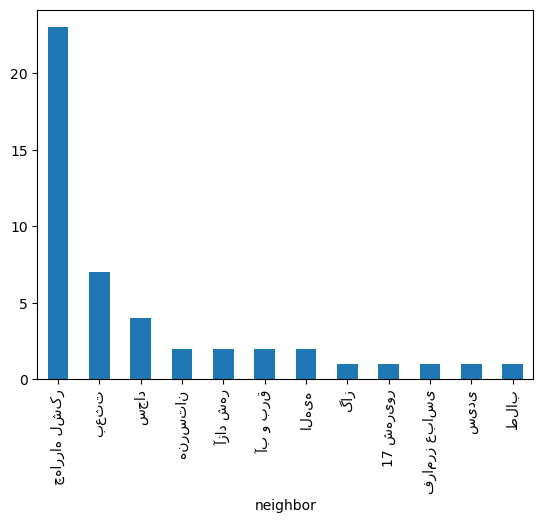

In [127]:
train_data[train_data.price > train_data.price.quantile(0.999)].neighbor.value_counts().plot.bar()

In [128]:
hotel_commercial_data = train_data[(train_data.price > train_data.price.quantile(0.999)) & (train_data.description.notna()) & (train_data.description.str.contains("تجاری|هتل"))]
hotel_commercial_data.shape

(27, 13)

<Axes: xlabel='neighbor'>

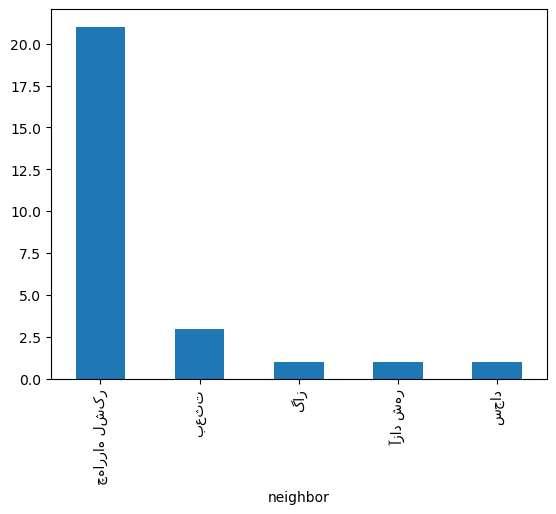

In [129]:
hotel_commercial_data.neighbor.value_counts().plot.bar()

In [130]:
train_data = train_data.drop(hotel_commercial_data.index)

In [131]:
train_data.drop(train_data.price.nlargest(1).index, inplace=True)

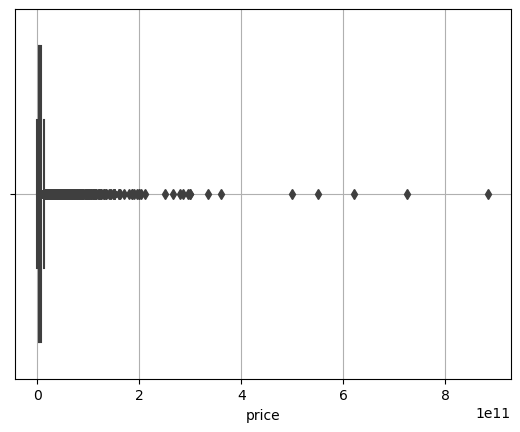

In [132]:
sns.boxplot(x = "price", data = train_data)
plt.grid()

<Axes: xlabel='price', ylabel='Density'>

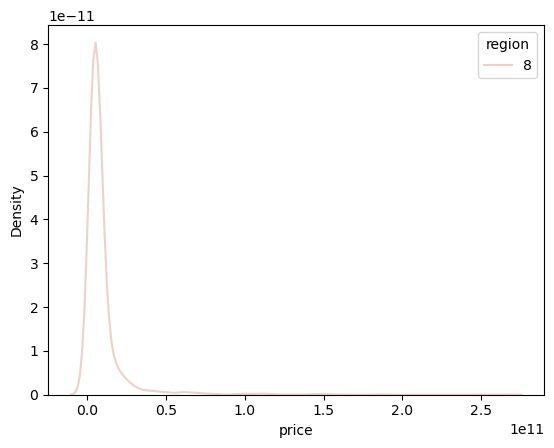

In [133]:
sns.kdeplot(x = "price", hue = "region", data = train_data[train_data.region == 8])

<Axes: xlabel='type', ylabel='price'>

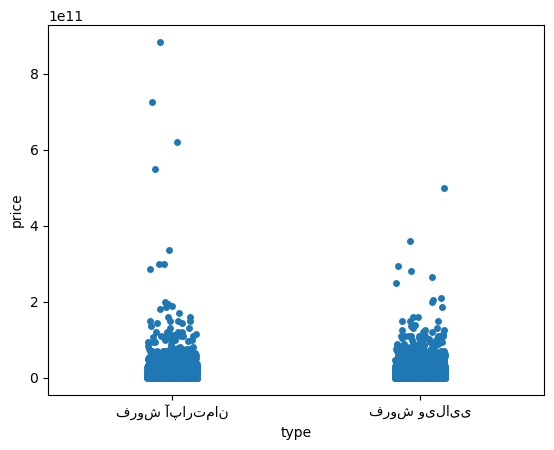

In [134]:
sns.stripplot(x = "type", y = "price", data = train_data)

<Axes: xlabel='region', ylabel='price'>

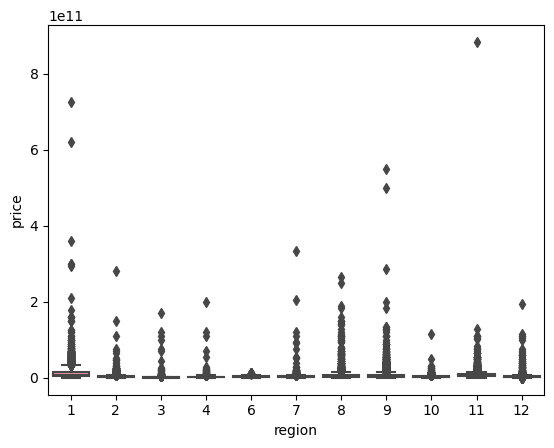

In [135]:
sns.boxplot(x = "region", y = "price", data = train_data)

In [136]:
train_data[train_data.price > 4e11]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
3113,فروش آپارتمان,155.0,منطقه 1 محله بعثت خیابان رضا,مترنوساز فول\r\nسلام \n متر\nطبقه دوم \n...,36.291085,59.565186,0.0,2,3.0,7.250000e+11,1,بعثت,رضا
4684,فروش ویلایی,1600.0,منطقه 9 محله هنرستان خیابان هاشمیه,ویلایی پروانه دار اوایل هاشمیه\r\nبنام خداوند...,36.310605,59.504477,0.0,0,0.0,5.000000e+11,9,هنرستان,هاشمیه
9504,فروش آپارتمان,170.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,آپارتمان متری خوابه / صفر / جلال\r\nباس...,36.327540,59.527520,0.0,1,3.0,8.840000e+11,11,آزاد شهر,آزادشهر
23208,فروش آپارتمان,120.0,منطقه 9 محله آب و برق خیابان برونسی,فروش آپارتمان/ متری/ اوایل فرهنگ/فول\r\n⚜️...,36.326765,59.463926,16.0,2,2.0,5.500000e+11,9,آب و برق,برونسی
40789,فروش آپارتمان,104.0,منطقه 1 محله بعثت خیابان کوهسنگی,NaN,36.287180,59.574720,7.0,1,2.0,6.200000e+11,1,بعثت,کوهسنگی


In [137]:
train_data.groupby("type")["price"].describe(percentiles=[.9])

,count,mean,std,min,50%,90%,max
type,,,,,,,
فروش آپارتمان,40962.0,5.377165e+09,1.009541e+10,6000000.0,3.747500e+09,9.300000e+09,8.840000e+11
فروش ویلایی,5022.0,1.466762e+10,2.071746e+10,1111111.0,8.000000e+09,3.200000e+10,5.000000e+11


<Axes: xlabel='region', ylabel='area'>

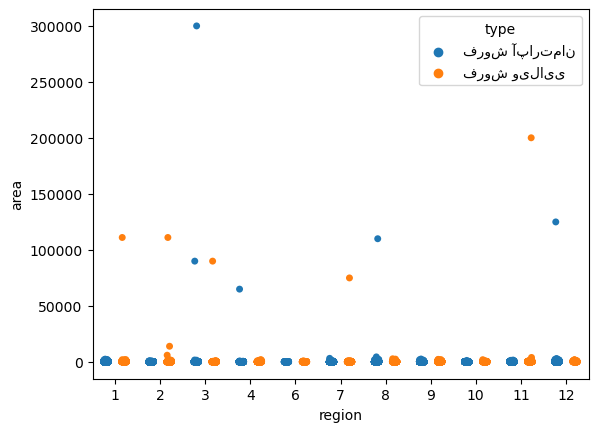

In [138]:
sns.stripplot(x = "region", y = "area", data = train_data, hue = "type", dodge=True)

In [139]:
train_data[train_data.area > 50000]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
4232,فروش آپارتمان,110000.0,منطقه 8 محله چهارراه لشکر خیابان بلوار امام خ...,آپارتمان متری عدل خمینی\r\nخونه بسیار تمیز...,36.288100,59.600600,11.0,2,2.0,4.000000e+10,8,چهارراه لشکر,بلوار امام خمینی
7208,فروش ویلایی,111111.0,منطقه 2 محله هدایت خیابان ابوطالب,مغازه و انباری\r\nجهت تماس با شماره داخل تصوی...,36.318450,59.587680,NaN,0,0.0,1.950000e+09,2,هدایت,ابوطالب
15554,فروش آپارتمان,300000.0,منطقه 3 محله گاز خیابان گاز,آپارتمان طبقه\r\nآپارتمان طبقه .طبقه اول را...,36.315080,59.632800,9.0,0,1.0,7.000000e+10,3,گاز,گاز
19754,فروش آپارتمان,65000.0,منطقه 4 و 5 محله طلاب خیابان مفتح,اپارتمان متری طبقه اول\r\nاپارتمان متری ...,36.296030,59.643700,0.0,1,1.0,1.200000e+11,4,طلاب,مفتح
20716,فروش آپارتمان,125000.0,منطقه 12 محله الهیه خیابان الهیه,اپارتمان متری در محمدیه\r\nتوضیحات زنگ بزن...,36.373776,59.475820,1.0,6,2.0,4.500000e+10,12,الهیه,الهیه
22079,فروش ویلایی,75000.0,منطقه 7 محله سیدی خیابان کوشش,خانه ویلایی\r\n متری دردوطبقه مجزامناسب دوخ...,36.265280,59.609260,0.0,0,3.0,2.040000e+11,7,سیدی,کوشش
28675,فروش ویلایی,111111.0,منطقه 1 محله بعثت خیابان رضا,*ویلایی با تجاری / حاشیه پیروزی / رضاشهر\r\n﷽...,36.291085,59.565186,14.0,0,5.0,3.900000e+10,1,بعثت,رضا
34554,فروش آپارتمان,90000.0,منطقه 3 محله گاز خیابان طبرسی شمالی,فروش هوای طبقه سوم خانه اپارتمانی\r\nخانه فوق...,36.323210,59.627390,NaN,3,0.0,2.700000e+10,3,گاز,طبرسی شمالی
44961,فروش ویلایی,200125.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,مترزمین متربنا شمالی تراکم متوسط آزادشه...,36.327540,59.527520,21.0,0,2.0,1.200000e+10,11,آزاد شهر,آزادشهر
46519,فروش ویلایی,90000.0,منطقه 3 محله گاز خیابان رسالت,خانه دوطبقه سفت کاری شده فروشی\r\nسلام خانه د...,36.303140,59.633800,NaN,0,2.0,7.500000e+10,3,گاز,رسالت


In [140]:
train_data.drop(train_data[train_data.area > 50000].index, inplace=True)

<Axes: xlabel='region', ylabel='area'>

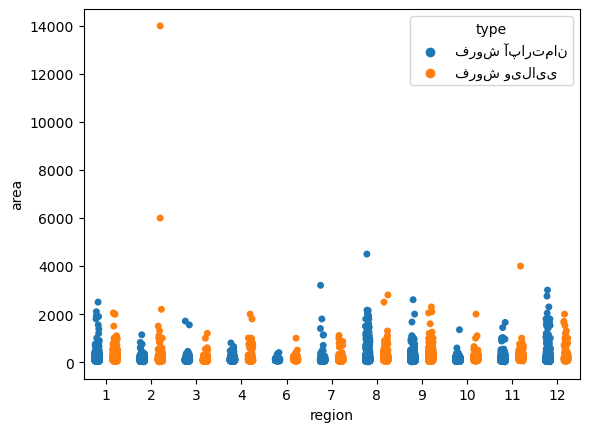

In [141]:
sns.stripplot(x = "region", y = "area", data = train_data, hue = "type", dodge=True)

<Axes: xlabel='longitude', ylabel='latitude'>

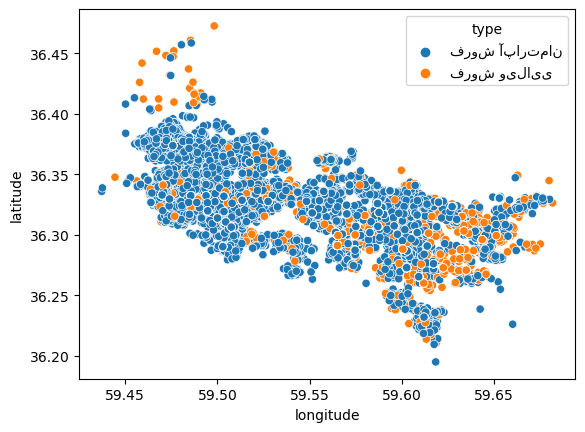

In [142]:
sns.scatterplot(x = "longitude", y = "latitude", hue = "type", data = train_data)

In [143]:
train_data[(train_data.street == "برونسی") & (train_data.area > 1500)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
4038,فروش ویلایی,2100.0,منطقه 9 محله آب و برق خیابان برونسی,فروش ویلادر کوهساران(هتل سحاب)\r\nبا سلام \n\...,36.326765,59.463926,14.0,0,4.0,3.150000e+10,9,آب و برق,برونسی
8033,فروش ویلایی,2050.0,منطقه 9 محله آب و برق خیابان برونسی,مجتمع سازمان آب (گلستان) ویلایی\r\nباسلام،\n ...,36.326765,59.463926,17.0,0,2.0,1.390000e+10,9,آب و برق,برونسی
15130,فروش ویلایی,2300.0,منطقه 9 محله آب و برق خیابان برونسی,بوستان/ متر/کوچه نسترن/معاوضه\r\nبا سلام\n...,36.326765,59.463926,6.0,0,3.0,1.800000e+10,9,آب و برق,برونسی
32053,فروش آپارتمان,2000.0,منطقه 9 محله آب و برق خیابان برونسی,متر کوهساران\r\nدپارتمان املاک خانی\n ...,36.326765,59.463926,0.0,0,4.0,2.000000e+10,9,آب و برق,برونسی


<Axes: xlabel='type', ylabel='area'>

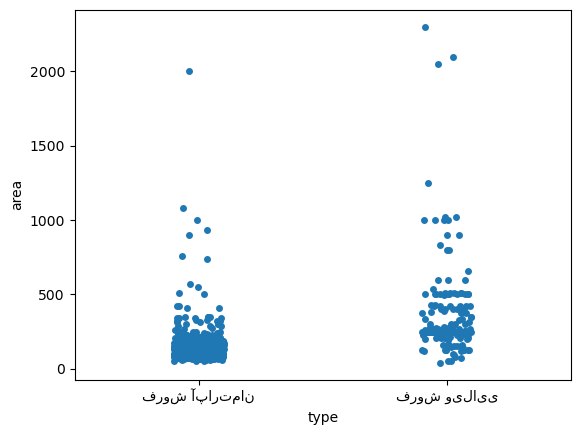

In [144]:
sns.stripplot(data = train_data[train_data.street == "برونسی"] , x = "type", y = "area")

<Axes: >

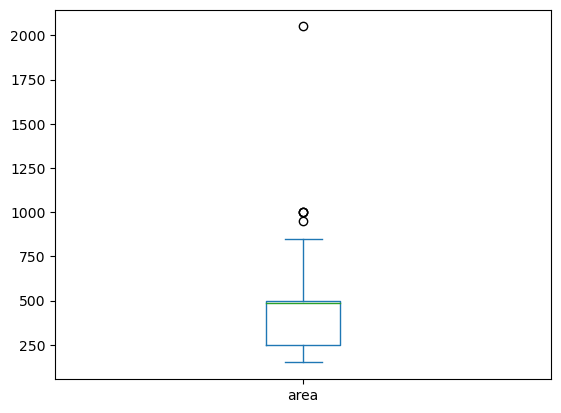

In [145]:
train_data[(train_data.street == "سجاد") & (train_data.type.str.contains("ویلا"))].area.plot.box()

<Axes: >

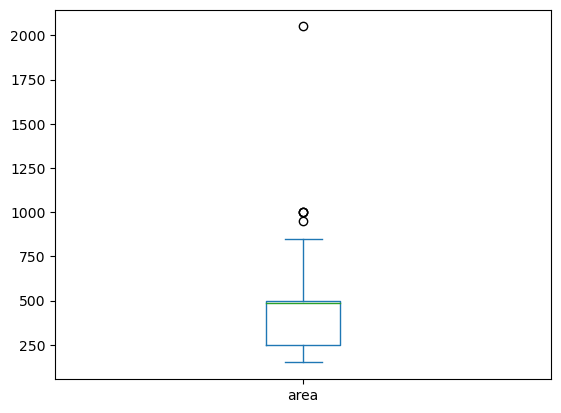

In [146]:
train_data[(train_data.street == "سجاد") & (train_data.type.str.contains("ویلا"))].area.plot.box()

In [147]:
train_data[(train_data.area > 2000) & (train_data.area < 3000)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
713,فروش آپارتمان,2300.0,منطقه 12 محله الهیه خیابان الهیه,فروش واحد آپارتمان یک جا و تهاتر\r\nسلام و ...,36.373776,59.475820,0.0,5,5.0,1.111111e+10,12,الهیه,الهیه
1980,فروش ویلایی,2500.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,ویلایی متر حاشیه صارمی\r\n متر \nسند...,36.272780,59.602730,17.0,0,3.0,2.500000e+11,8,چهارراه لشکر,امام رضا
4038,فروش ویلایی,2100.0,منطقه 9 محله آب و برق خیابان برونسی,فروش ویلادر کوهساران(هتل سحاب)\r\nبا سلام \n\...,36.326765,59.463926,14.0,0,4.0,3.150000e+10,9,آب و برق,برونسی
6873,فروش ویلایی,2050.0,منطقه 1 محله سجاد خیابان سجاد,ویلایی،سازمان آب(گلستان) سه راه فردوسی عطار خ...,36.318036,59.551475,16.0,0,2.0,1.385000e+10,1,سجاد,سجاد
8033,فروش ویلایی,2050.0,منطقه 9 محله آب و برق خیابان برونسی,مجتمع سازمان آب (گلستان) ویلایی\r\nباسلام،\n ...,36.326765,59.463926,17.0,0,2.0,1.390000e+10,9,آب و برق,برونسی
10165,فروش ویلایی,2800.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,ویلائی خ امام رضا متر سند ملکی دونبش\r\n...,36.272780,59.602730,26.0,0,3.0,1.400000e+11,8,چهارراه لشکر,امام رضا
10914,فروش آپارتمان,2150.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,متر آپارتمان بصورت یکجا/خ امام رضا پـارس...,36.272780,59.602730,0.0,6,5.0,1.612500e+11,8,چهارراه لشکر,امام رضا
13319,فروش آپارتمان,2750.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان یکجا متر زیربنا صفر سند آماده\r...,36.373776,59.475820,0.0,3,3.0,1.150000e+11,12,الهیه,الهیه
14177,فروش آپارتمان,2600.0,منطقه 9 محله هنرستان خیابان هاشمیه,یکجا متر قصر فاخر بنامنحصر ویو ابدی وکیل ...,36.310605,59.504477,0.0,7,5.0,2.860000e+11,9,هنرستان,هاشمیه
15049,فروش آپارتمان,2100.0,منطقه 1 محله بعثت خیابان رضا,آپارتمان واحدی متر زمین فروش یک جا\r\n✔...,36.291085,59.565186,0.0,6,5.0,1.500000e+11,1,بعثت,رضا


In [148]:
# for idx, desc in train_data[(train_data.area > 2000) & (train_data.area < 3000)].description.items() :
#     print(desc, end = "\n" + "-" * 30 + "\n")
#     print(idx)

In [149]:
train_data.drop(train_data[(train_data.area > 2000) & (train_data.area < 3000)].drop(10165).index, inplace=True)

<Axes: >

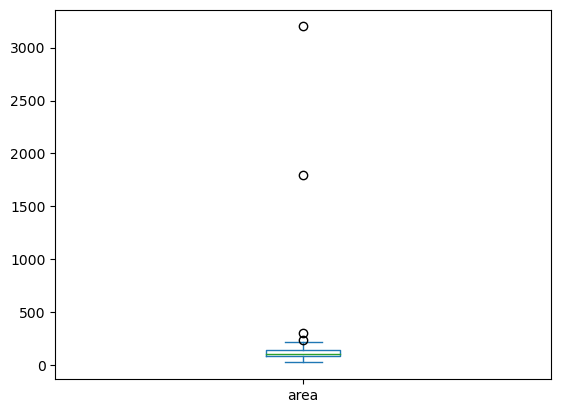

In [150]:
train_data[(train_data.street == "هفده شهریور") & (train_data.type.str.contains("تمان"))].area.plot.box()

In [151]:
train_data[train_data.area > 3000]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
334,فروش آپارتمان,3200.0,منطقه 7 محله 17 شهریور خیابان هفده شهریور,ساختمان در طبقه واحد\r\n شهریو شمالی طبقه...,36.276045,59.617282,1.0,5,2.0,9.500000e+10,7,17 شهریور,هفده شهریور
10038,فروش ویلایی,6000.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,متر شهرک نوبنیاد بهاران.انتهای خین عرب\r\...,36.327670,59.548380,4.0,0,4.0,1.200000e+10,2,فرامرز عباسی,فرامرز عباسی
17627,فروش ویلایی,4000.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,ویلا شهرک گلستان\r\nویلا شهرک گلستان نرسیده ب...,36.328550,59.513390,3.0,0,2.0,3.200000e+10,11,آزاد شهر,فرهنگ
27979,فروش آپارتمان,4500.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,فروش مجموعه واحدی/نوساز/محدوده حرم/مجلل\r\n*...,36.272780,59.602730,0.0,10,5.0,1.100000e+11,8,چهارراه لشکر,امام رضا
42920,فروش ویلایی,14000.0,منطقه 2 محله هدایت خیابان ابوطالب,زمین متری مجتمعی با آب فروان و سند ملکی...,36.318450,59.587680,1.0,0,0.0,9.800000e+09,2,هدایت,ابوطالب


In [152]:
train_data.drop(train_data[train_data.area > 3000].index, inplace=True)

<Axes: xlabel='region', ylabel='area'>

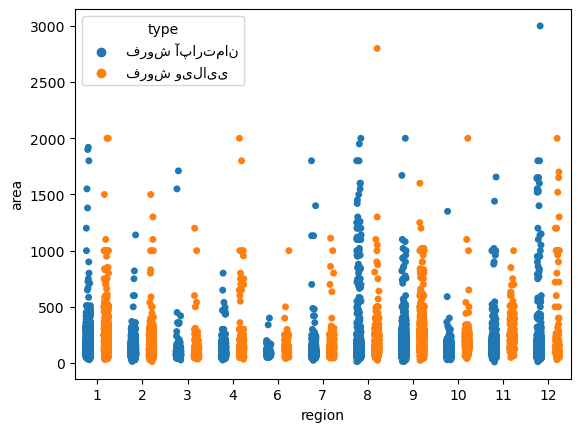

In [153]:
sns.stripplot(x = "region", y = "area", data = train_data, hue = "type", dodge=True)

In [154]:
train_data[train_data.area > 2000]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
10165,فروش ویلایی,2800.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,ویلائی خ امام رضا متر سند ملکی دونبش\r\n...,36.272780,59.60273,26.0,0,3.0,1.400000e+11,8,چهارراه لشکر,امام رضا
36908,فروش آپارتمان,3000.0,منطقه 12 محله الهیه خیابان الهیه,واحد آپارتمان /یکجا/الهیه\r\nدرود فراوان\n...,36.373776,59.47582,0.0,6,2.0,1.050000e+11,12,الهیه,الهیه


In [155]:
# train_data[(train_data.description.notna()) & (train_data.description.str.contains("هتل|هتل آپارتمان"))]

<Axes: xlabel='type', ylabel='area'>

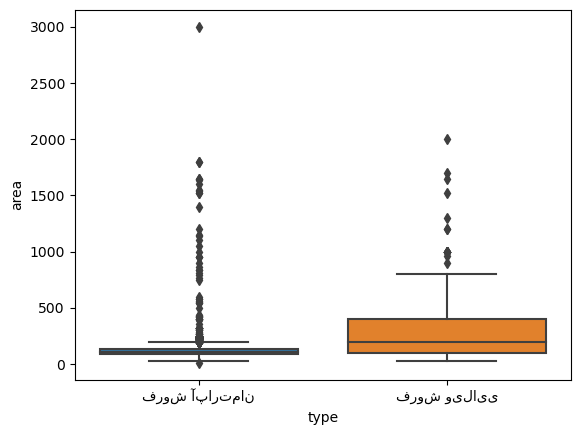

In [156]:
sns.boxplot(data = train_data[train_data.region == 12], x = "type", y = "area" )

In [157]:
train_data[train_data.region == 12].describe()

,area,latitude,longitude,age,floor,bedrooms,price,region
count,10994.000000,10994.000000,10994.000000,10956.000000,10994.000000,10994.000000,1.099400e+04,10994.0
mean,119.338712,36.374274,59.476390,3.440398,2.828816,2.256776,3.837428e+09,12.0
std,87.850740,0.005012,0.005961,4.513078,1.511406,0.557290,3.729627e+09,0.0
min,12.000000,36.284940,59.450157,0.000000,0.000000,0.000000,2.670000e+07,12.0
25%,90.000000,36.373776,59.475820,0.000000,2.000000,2.000000,2.750000e+09,12.0
50%,106.000000,36.373776,59.475820,1.000000,3.000000,2.000000,3.400000e+09,12.0
75%,135.000000,36.373776,59.475820,6.000000,4.000000,3.000000,4.350000e+09,12.0
max,3000.000000,36.472813,59.642033,31.000000,13.000000,5.000000,1.950000e+11,12.0


In [158]:
train_data[(train_data.type.str.contains("تمان"))  ].area.describe(percentiles = [.9, 0.75, .99, .999])

count    40947.000000
mean       125.084924
std         82.019618
min         10.000000
50%        110.000000
75%        150.000000
90%        180.000000
99%        336.540000
99.9%     1250.000000
max       3000.000000
Name: area, dtype: float64

<Axes: >

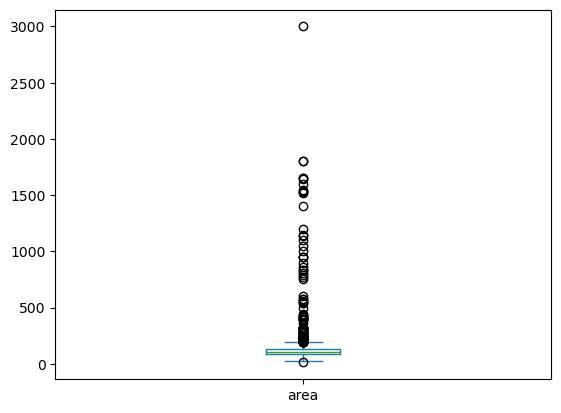

In [159]:
train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان"))].area.plot.box()

In [160]:
train_data.drop(train_data[(train_data.area >= 1000) &  (train_data.type.str.contains("تمان")) & 
                (train_data.description.notna()) & (train_data.description.str.contains("هتل|هتل آپارتمان|مجموعه|مجتمع"))].index,
               inplace=True)

In [161]:
train_data.drop(train_data[(train_data.area > 400) &  (train_data.type.str.contains("تمان")) & 
                (train_data.description.notna()) & (train_data.description.str.contains("هتل|هتل آپارتمان")) & 
                (train_data.description.str.contains("هتلینگ|پنت هوس") == False)].index,
                inplace=True)

In [162]:
train_data.drop(train_data[(train_data.area > 300) &  (train_data.type.str.contains("تمان")) & 
                (train_data.description.notna()) & (train_data.description.str.contains("هتل|هتل آپارتمان")) & (train_data.region==8)].index,
                inplace=True)

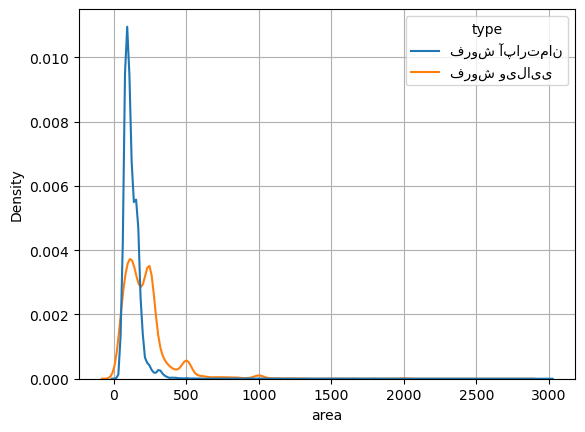

In [163]:
sns.kdeplot(x = "area", hue = "type", data = train_data, common_norm=False)
plt.grid()

# Regions

<Axes: xlabel='area', ylabel='price'>

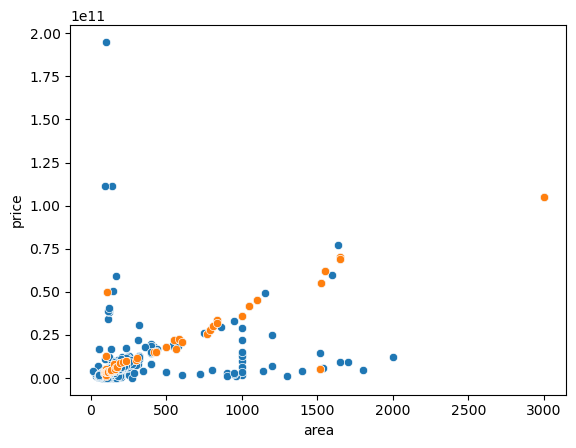

In [164]:
sns.scatterplot(x = "area", y = "price", data = train_data[(train_data.region == 12) ])
sns.scatterplot(x = "area", y = "price", data = train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.description.notna()) & (train_data.description.str.contains("یک جا|یکجا|فروش یکجا|واحد یکجا"))].sort_values("area"))

In [165]:
train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.description.notna()) & (train_data.description.str.contains("یک جا|یکجا|فروش یکجا|واحد یکجا"))].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
36342,فروش آپارتمان,90.0,منطقه 12 محله الهیه خیابان الهیه,/ متری/چهار واحدیکجا در یک ساختمان\r\n✅کارگ...,36.370346,59.483696,0.0,2,2.0,3.150000e+09,12,الهیه,الهیه
33201,فروش آپارتمان,90.0,منطقه 12 محله الهیه خیابان الهیه,واحدآپارتمان و مترالهیه*دریک ساختمان*،تها...,36.373776,59.475820,0.0,2,2.0,3.150000e+09,12,الهیه,الهیه
45457,فروش آپارتمان,95.0,منطقه 12 محله الهیه خیابان الهیه,واحد آپارتمان یک جا فروش میرسد\r\n✅هر طبقه ...,36.373776,59.475820,0.0,2,2.0,3.700000e+09,12,الهیه,الهیه
13139,فروش آپارتمان,95.0,منطقه 12 محله الهیه خیابان الهیه,متر فلاحی صفر فول امکانات\r\nبا سلام و در...,36.373776,59.475820,0.0,2,2.0,3.200000e+09,12,الهیه,الهیه
610,فروش آپارتمان,100.0,منطقه 12 محله الهیه خیابان امیریه,اپارتمان و متر دردوطبقه تعداد اتاق \r\n...,36.412330,59.496820,NaN,0,2.0,1.300000e+09,12,الهیه,امیریه
35624,فروش آپارتمان,100.0,منطقه 12 محله الهیه خیابان الهیه,واحدی دربست یکجا\r\nبا سلام و احترام\n و...,36.373776,59.475820,0.0,2,3.0,5.000000e+09,12,الهیه,الهیه
34957,فروش آپارتمان,100.0,منطقه 12 محله الهیه خیابان الهیه,واحدآپارتمان متری بصورت یکجا الهیه\r\nبا س...,36.373776,59.475820,0.0,3,2.0,1.290000e+10,12,الهیه,الهیه
32892,فروش آپارتمان,100.0,منطقه 12 محله الهیه خیابان الهیه,متر صفر دو نبش معاوضه با زمین\r\nصفر کلید...,36.373776,59.475820,1.0,3,2.0,3.500000e+09,12,الهیه,الهیه
13121,فروش آپارتمان,100.0,منطقه 12 محله الهیه خیابان الهیه,متری خواب،کم واحد،برند منطقه،نقدو معاوضه ....,36.373776,59.475820,0.0,1,5.0,1.890000e+09,12,الهیه,الهیه
13101,فروش آپارتمان,101.0,منطقه 12 محله الهیه خیابان الهیه,متر بدون‌مشرف / دو‌واحد یکجا/ صفر\r\nبسم ...,36.373776,59.475820,0.0,3,2.0,3.700000e+09,12,الهیه,الهیه


In [166]:
# show_description(train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.description.notna()) & (train_data.description.str.contains("یک جا|یکجا|فروش یکجا|واحد یکجا"))].head())

### یکجا

In [167]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.description.notna()) & (train_data.description.str.contains("یک جا|یکجا|فروش یکجا|واحد یکجا"))].index,
               inplace=True)

+ they are not in the same concept of what the (type) feature say 

In [168]:
train_data.describe()

,area,latitude,longitude,age,floor,bedrooms,price,region
count,45668.000000,45668.000000,45668.000000,45208.000000,45668.000000,45666.000000,4.566800e+04,45668.000000
mean,132.664697,36.331004,59.529665,7.160038,2.384952,2.370911,6.183254e+09,7.939476
std,87.191823,0.033304,0.053805,7.731568,1.762551,0.844761,1.115714e+10,3.986935
min,10.000000,36.194744,59.437214,0.000000,-1.000000,0.000000,1.111111e+06,1.000000
25%,86.000000,36.310605,59.475820,0.000000,1.000000,2.000000,2.640000e+09,4.000000
50%,112.000000,36.327540,59.517400,5.000000,2.000000,2.000000,3.900000e+09,9.000000
75%,155.000000,36.362122,59.571770,12.000000,4.000000,3.000000,6.550000e+09,11.000000
max,2800.000000,36.472813,59.681915,41.000000,30.000000,12.000000,8.840000e+11,12.000000


In [169]:
train_data.bedrooms.value_counts()

bedrooms
2.0     23757
3.0     14253
1.0      4260
4.0      1833
5.0      1255
0.0       290
6.0        12
8.0         2
12.0        2
11.0        1
7.0         1
Name: count, dtype: int64

In [170]:
train_data[train_data.bedrooms > 5]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
2491,فروش آپارتمان,405.0,منطقه 9 محله رضاشهر خیابان سرافرازان,همکف متر / اول / سوم متر / چهارم د...,36.290086,59.502946,NaN,3,8.0,1.150000e+10,9,رضاشهر,سرافرازان
3310,فروش آپارتمان,600.0,منطقه 2 محله کوی امیرالمومنین خیابان فدک,سند مادر دارد/واحد مشابه موجود/ واحد مت...,36.346612,59.571430,0.0,3,12.0,1.600000e+10,2,کوی امیرالمومنین,فدک
4242,فروش آپارتمان,380.0,منطقه 9 محله هنرستان خیابان هاشمیه,طبقه و دو واحد متری باهم برای فروش/واح...,36.310605,59.504477,0.0,3,6.0,1.976000e+10,9,هنرستان,هاشمیه
5664,فروش آپارتمان,310.0,منطقه 10 محله قاسم آباد خیابان حسابی شمالی,فعلا با قولنامه واگذار میشود/ طبقه و باه...,36.359831,59.504036,0.0,5,6.0,1.131500e+10,10,قاسم آباد,حسابی شمالی
12873,فروش آپارتمان,284.0,منطقه 10 محله قاسم آباد خیابان امامیه,دو واحد متری باهم واگذار میشود,36.362476,59.515076,2.0,2,6.0,9.798000e+09,10,قاسم آباد,امامیه
16600,فروش آپارتمان,480.0,منطقه 1 محله آبکوه خیابان شجریان (ارشاد سابق),واگذاری دو واحد متری,36.317244,59.570239,0.0,7,8.0,2.640000e+10,1,آبکوه,شجریان (ارشاد سابق)
20626,فروش آپارتمان,330.0,منطقه 9 محله رضاشهر خیابان پیروزی فرد (از 1تا...,فعلا با قولنامه واگذار میگردد./ دو طبقه اول و...,36.306673,59.509152,0.0,1,6.0,1.892500e+10,9,رضاشهر,پیروزی فرد (از 1تا31 و زوج2تا30)
20746,فروش آپارتمان,591.0,منطقه 10 محله قاسم آباد خیابان فلاحی,واگذاری واحد باهم /اول دوم چهارم ...,36.357170,59.489020,0.0,4,11.0,1.900000e+10,10,قاسم آباد,فلاحی
23990,فروش آپارتمان,161.0,منطقه 8 محله چهارراه لشکر خیابان سرشور,NaN,36.284209,59.605362,29.0,1,6.0,5.790000e+09,8,چهارراه لشکر,سرشور
25551,فروش آپارتمان,280.0,منطقه 11 محله آزاد شهر خیابان دانش آموز,دو واحد متری باهم واگذار میشود,36.332609,59.511662,16.0,3,6.0,1.200000e+10,11,آزاد شهر,دانش آموز


In [171]:
train_data.drop(train_data[train_data.bedrooms > 5].index, inplace=True)

the desc say that sell more than 1 house which is out of our analysis

#### aprt

<Axes: >

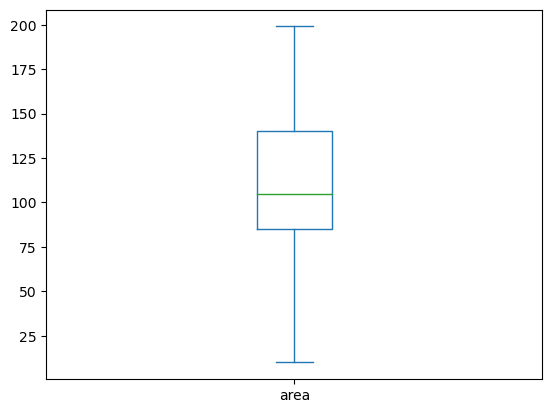

In [172]:
train_data[train_data.area < 200].area.plot.box()

In [173]:
train_data.area.quantile(.001)

36.649

<Axes: >

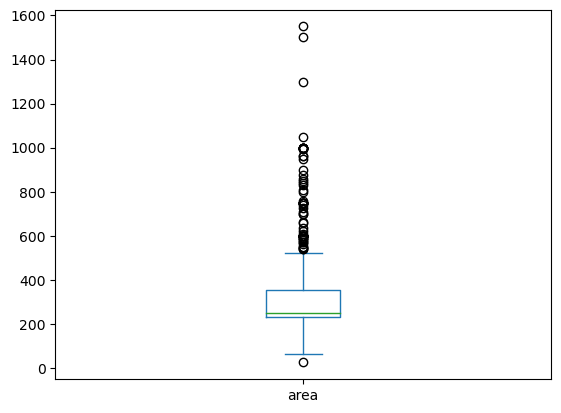

In [174]:
train_data[train_data.bedrooms == 5].area.plot.box()

<Axes: xlabel='bedrooms', ylabel='area'>

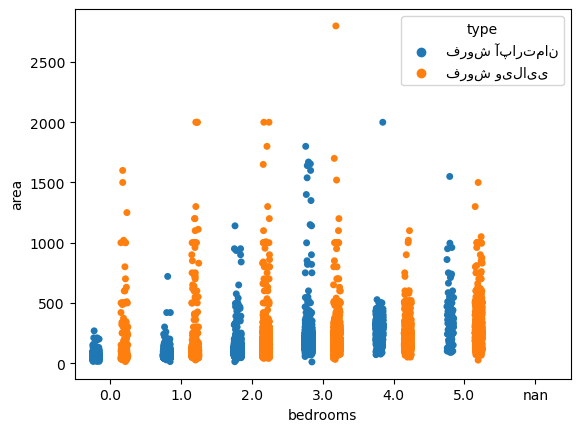

In [175]:
sns.stripplot(x = "bedrooms", y = "area", data = train_data, hue = "type", dodge=True)

In [176]:
train_data[(train_data.area < 40) & (train_data.bedrooms >=3)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
11849,فروش ویلایی,31.0,منطقه 2 محله هدایت خیابان عبدالمطلب,مسکونی و تجاری\r\n متر عرصه . متر حاشیه ب...,36.317990,59.607300,22.0,0,3.0,1.150000e+10,2,هدایت,عبدالمطلب
19230,فروش ویلایی,25.0,منطقه 9 محله هنرستان خیابان هاشمیه,اوایل هاشمیه/دوبلکس /ویلایی\r\nبهترین لوکیشن\...,36.310605,59.504477,12.0,0,5.0,3.200000e+10,9,هنرستان,هاشمیه
45823,فروش آپارتمان,10.0,منطقه 11 محله دانشجو خیابان دانشجو,متر اوایل دانشجو صفر\r\nتک واحدی \nمتریال ...,36.331839,59.503510,0.0,1,3.0,8.700000e+09,11,دانشجو,دانشجو


In [177]:
train_data.drop(train_data[(train_data.area < 40) & (train_data.bedrooms >=3)].index, inplace=True)

+ they are noise

In [178]:
train_data[(train_data.area < 20)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
215,فروش آپارتمان,15.0,منطقه 9 محله آب و برق خیابان صابر,راه جدا,36.311730,59.473980,12.0,0,0.0,2.700000e+08,9,آب و برق,صابر
1317,فروش آپارتمان,14.0,منطقه 9 محله آب و برق خیابان صیاد شیرازی,سوییت متری\r\nانتهای صیاد شیرازی\nانتهای صا...,36.332341,59.485542,22.0,1,0.0,2.300000e+08,9,آب و برق,صیاد شیرازی
4911,فروش آپارتمان,14.0,منطقه 2 محله هدایت خیابان هنرور,واحد یا سویت یا دفتر کار\r\nسلام وقت بخیر یه...,36.323220,59.606620,0.0,0,0.0,5.000000e+08,2,هدایت,هنرور
29850,فروش ویلایی,13.0,منطقه 2 محله هدایت خیابان ابوطالب,زمین ملکی ویلایی اپارتمان درسه طبقه مناسب دفت...,36.318450,59.587680,1.0,0,0.0,1.450000e+09,2,هدایت,ابوطالب
38801,فروش آپارتمان,13.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,سهم از هتل تهاتر با \r\n سهم از هتل نرجس ...,36.290470,59.616177,0.0,2,1.0,2.800000e+08,8,چهارراه لشکر,امام رضا
46077,فروش آپارتمان,12.0,منطقه 12 محله الهیه خیابان الهیه,لوکیشن اوایل رحمانیه\r\nواحد صفر\nخوش نقشه\nب...,36.373776,59.475820,2.0,4,2.0,4.000000e+09,12,الهیه,الهیه


In [179]:
# show_description(train_data[(train_data.area < 20)])

In [180]:
train_data.drop(train_data[(train_data.area < 20) & (train_data.price > 4e8)].index, inplace=True)

+ they are tejari or other things which do not make sense

<Axes: xlabel='type', ylabel='price'>

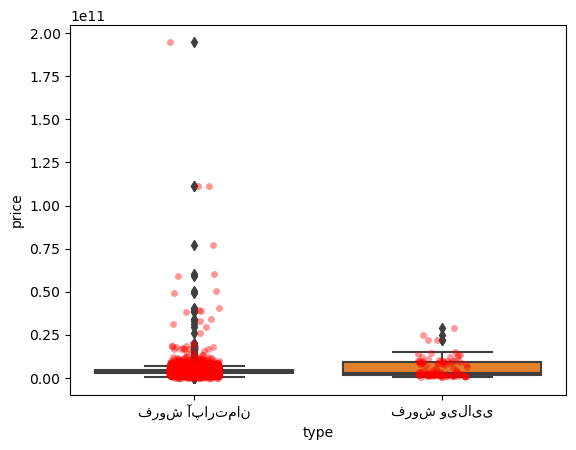

In [181]:
sns.boxplot(data = train_data[(train_data.region == 12)], x = "type", y = "price")
sns.stripplot(data = train_data[(train_data.region == 12) ], x = "type", y = "price", color = "r", alpha = .4)


In [182]:
# show_description(train_data[(train_data.area < 50) & (train_data.bedrooms >=3)])

In [183]:
train_data[(train_data.area < 50) & (train_data.description.notna()) & (train_data.description.str.contains("سوییت|سوئیت"))].sort_values("area", ascending=False)

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
21055,فروش آپارتمان,45.0,منطقه 9 محله آب و برق خیابان صیاد شیرازی,یک واحد همکف واقع در صیاد شیرازی \r\nباسلام...,36.332341,59.485542,0.0,0,1.0,1.300000e+09,9,آب و برق,صیاد شیرازی
27910,فروش آپارتمان,45.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,سوئیت متری / بازسازی / خ امام رضا\r\n_____...,36.272780,59.602730,10.0,2,0.0,1.250000e+09,8,چهارراه لشکر,امام رضا
22116,فروش آپارتمان,43.0,منطقه 2 محله فرامرز عباسی خیابان جانباز,سوئیت متری راه جدا\r\nبا سلام و عرض ادب و ...,36.335880,59.557710,1.0,0,0.0,1.100000e+09,2,فرامرز عباسی,جانباز
26783,فروش آپارتمان,40.0,منطقه 2 محله هدایت خیابان مطهری شمالی,متر سوئیت همکف راه جدا\r\nآپارتمان همکف را...,36.316310,59.608390,5.0,0,0.0,9.000000e+08,2,هدایت,مطهری شمالی
3953,فروش آپارتمان,40.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,سوئیت صفر \r\nهمه ما خادم الرضاییم.. \n✓تا...,36.272780,59.602730,0.0,3,0.0,9.300000e+08,8,چهارراه لشکر,امام رضا
16569,فروش آپارتمان,40.0,منطقه 7 محله سیدی خیابان صبا(شهید اصلانی),آپارتمان متر\r\nبا سلام \nآپارتمان حدودا ...,36.231836,59.612124,2.0,0,0.0,7.500000e+08,7,سیدی,صبا(شهید اصلانی)
30885,فروش ویلایی,40.0,منطقه 2 محله کوی امیرالمومنین خیابان خیام شمالی,سوئیت دربست متری\r\nسوئیت نقلی مناسب برای ...,36.341526,59.605476,NaN,0,0.0,6.500000e+08,2,کوی امیرالمومنین,خیام شمالی
22878,فروش آپارتمان,40.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,متر/ دقیقه تا حرم/ سند دار\r\nسوییت م...,36.272780,59.602730,11.0,3,0.0,8.500000e+08,8,چهارراه لشکر,امام رضا
2984,فروش آپارتمان,40.0,منطقه 2 محله هدایت خیابان مطهری شمالی,سوئیت متری ، طبقه چهارم ، قولنامه\r\nدرود\n...,36.316310,59.608390,0.0,4,1.0,6.500000e+08,2,هدایت,مطهری شمالی
21149,فروش آپارتمان,38.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,فروش سوئیت در جوار حرم\r\nسوئیت شیک و نقلی حا...,36.272780,59.602730,16.0,2,0.0,2.500000e+09,8,چهارراه لشکر,امام رضا


In [184]:
train_data[(train_data.description.notna()) & (train_data.description.str.contains("پله گود"))].groupby(["type"]).floor.nunique()

type
فروش آپارتمان    3
فروش ویلایی      1
Name: floor, dtype: int64

In [185]:
# pele_god_vila = train_data[(train_data.description.notna()) & (train_data.description.str.contains("پله گود")) & (train_data.type.str.contains("ویلایی"))].sort_values("price")
# pele_god_vila.tail()

In [186]:
# train_data.drop(pele_god_vila.price.nlargest(1).index, inplace=True)

+ ************ check check check ************

+ this is noise 

In [187]:
train_data["seet"] = 0
train_data.loc[(train_data.description.notna()) & (train_data.description.str.contains("سویت|سوییت|سوئیت")), "seet"] = 1

In [188]:
train_data.seet.value_counts()

seet
0    45357
1      287
Name: count, dtype: int64

<Axes: xlabel='area', ylabel='Density'>

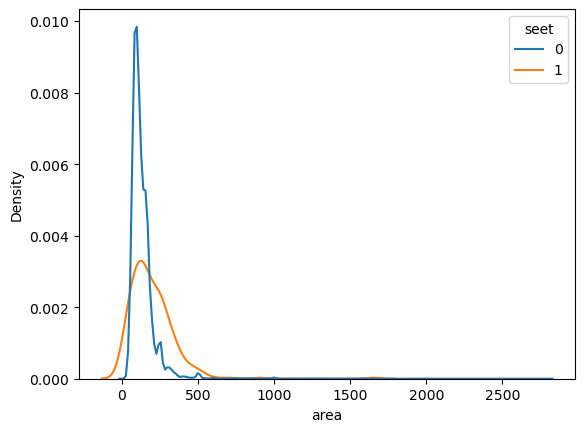

In [189]:
sns.kdeplot(x = "area", hue = "seet", data = train_data, common_norm=False)

<Axes: xlabel='neighbor'>

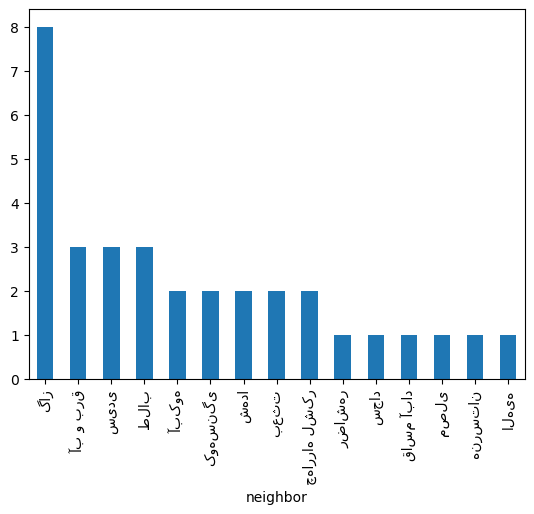

In [190]:
train_data[(train_data.area < 50) & (train_data.description.notna()) & (train_data.description.str.contains("سویت|سوییت|سوئیت") == False) & (train_data.type.str.contains("ویلایی"))].neighbor.value_counts().plot.bar()

<Axes: xlabel='area', ylabel='Density'>

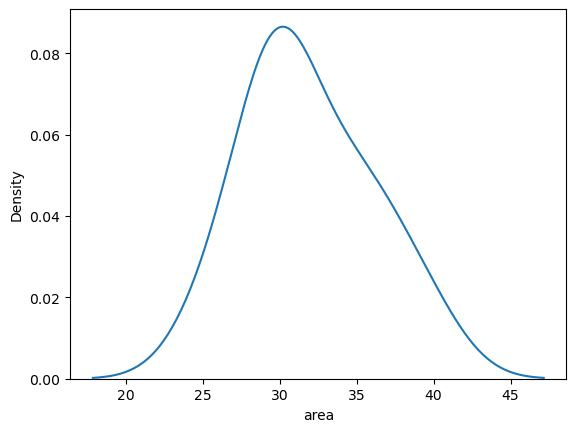

In [191]:
sns.kdeplot(x = "area",data =  train_data[(train_data.area < 40) & (train_data.description.notna()) & (train_data.description.str.contains("سویت|سوییت|سوئیت") == False) & (train_data.type.str.contains("ویلایی"))])

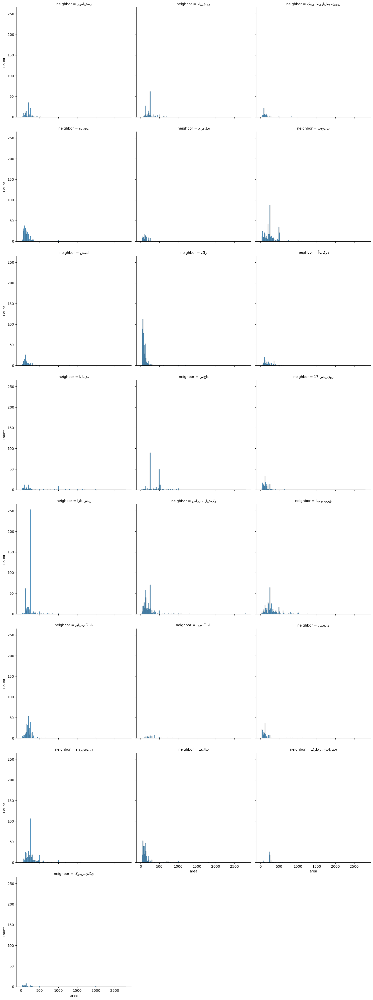

In [192]:
sns.displot(x = "area", data = train_data[train_data.type.str.contains("ویلایی")], col = "neighbor", col_wrap=3)

In [193]:
# train_data[(train_data.description.notna()) & (train_data.type.str.contains("ویلایی")) & (train_data.description.str.contains("سهطبقه|چهارطبقه|دوطبقه|چهار طبقه|تریبلکس|سه طبقه|دو طبقه|سوبلکس|دوبلکس")) & (train_data.area < 50)].sort_values("price")

In [194]:
# train_data.drop(train_data[(train_data.description.notna()) & (train_data.type.str.contains("ویلایی")) & (train_data.description.str.contains("سهطبقه|چهارطبقه|دوطبقه|چهار طبقه|تریبلکس|سه طبقه|دو طبقه|سوبلکس|دوبلکس")) & 
# (train_data.area < 50)].index,inplace = True)

+ soeet and not soeet more than 2 floors and the area less than 90

#### Bedrooms == 0

<Axes: xlabel='area', ylabel='price'>

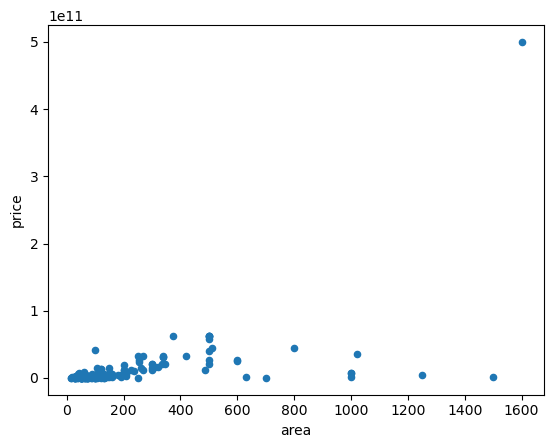

In [195]:
train_data[train_data.bedrooms == 0].plot.scatter(x = "area", y = "price")

In [196]:
bed_0_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.bedrooms == 0)]

In [197]:
bed_0_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.bedrooms == 0)]

In [198]:
bed_0_aprt.shape

(136, 14)

In [199]:
bed_0_aprt[(bed_0_aprt.description.notna()) & (bed_0_aprt.description.str.contains("سویت|سوییت|سوئیت") == False)].shape

(102, 14)

In [200]:
bed_0_aprt[(bed_0_aprt.description.notna()) & (bed_0_aprt.description.str.contains("هوایی|هوای"))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
1853,فروش آپارتمان,50.0,منطقه 2 محله کوی امیرالمومنین خیابان کوی امیر...,ملک هوایی بفروش میرسد,36.341250,59.571770,0.0,3,0.0,3.600000e+08,2,کوی امیرالمومنین,کوی امیرالمومنین,0
4317,فروش آپارتمان,85.0,منطقه 3 محله گاز خیابان فاطمیه,مترهوایی\r\nسلام خدمت دوستان مترهوایی طبق...,36.314380,59.626030,4.0,4,0.0,4.000000e+08,3,گاز,فاطمیه,0
5054,فروش آپارتمان,85.0,منطقه 2 محله هدایت خیابان مطهری شمالی,آپارتمان متر ، هوایی ، مطهری شمالی \r\nد...,36.315220,59.604370,0.0,4,0.0,7.500000e+08,2,هدایت,مطهری شمالی,0
11864,فروش آپارتمان,130.0,منطقه 9 محله آب و برق خیابان شقایق(منطقه 9),ملک هوایی / تراکم کم,36.313110,59.483840,30.0,1,0.0,9.750000e+08,9,آب و برق,شقایق(منطقه 9),0
15053,فروش آپارتمان,100.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,متر هوایی اندیشه \r\nباسلام واحترام\n ...,36.360020,59.517400,15.0,3,0.0,1.100000e+09,10,قاسم آباد,قاسم آباد,0
19841,فروش آپارتمان,90.0,منطقه 7 محله سیدی خیابان کوشش,هوایی متری\r\nباسلام خدمت عزیزان دوتا هوایی...,36.265280,59.609260,0.0,4,0.0,5.000000e+08,7,سیدی,کوشش,0
20389,فروش آپارتمان,130.0,منطقه 9 محله آب و برق خیابان فکوری زوج(از2تا...,ملک هوایی میباشد,36.313550,59.491280,NaN,1,0.0,1.000000e+09,9,آب و برق,فکوری زوج(از2تا18)فرد(1تا15),0
20855,فروش آپارتمان,60.0,منطقه 2 محله شهدا خیابان عبادی,آپارتمان در چراغچی هوایاش تا\r\nسلام هوایی...,36.301770,59.608440,0.0,2,0.0,2.550000e+08,2,شهدا,عبادی,0
22104,فروش آپارتمان,100.0,منطقه 4 و 5 محله طلاب خیابان مفتح,متر هوایی چهارراه گاز\r\nطبقه اول متر ح...,36.296030,59.643700,NaN,1,0.0,4.000000e+08,4,طلاب,مفتح,0
22731,فروش آپارتمان,160.0,منطقه 2 محله هدایت خیابان ایثارگران,ملک هوایی است,36.326877,59.619993,0.0,4,0.0,1.300000e+09,2,هدایت,ایثارگران,0


In [201]:
havaee_melk = bed_0_aprt[(bed_0_aprt.description.notna()) & (bed_0_aprt.description.str.contains("هووای|هوایی"))]

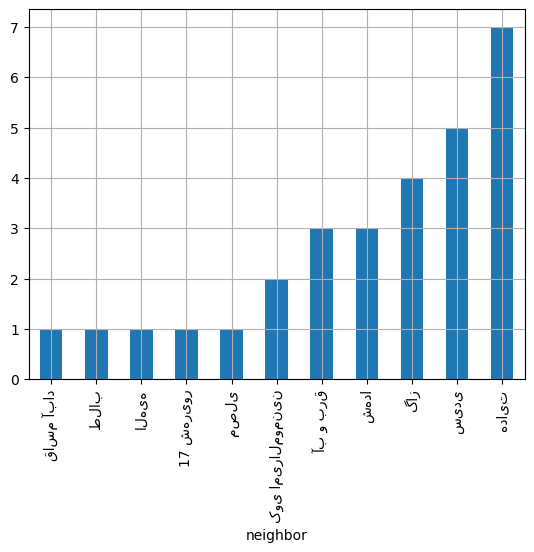

In [202]:
havaee_melk.neighbor.value_counts().sort_values().plot.bar(grid = True)
plt.show()

In [203]:
train_data.drop(havaee_melk.index, inplace=True)

In [204]:
bed_0_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.bedrooms == 0)]

In [205]:
bed_0_aprt[(bed_0_aprt.description.notna()) & (bed_0_aprt.description.str.contains("سویت|سوییت|سوئیت") == False) & 
(bed_0_aprt.description.str.contains("یک خواب|دو خواب|دوخواب|سه خواب|سه خواب|دو  خواب"))].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
17583,فروش آپارتمان,40.0,منطقه 9 محله آب و برق خیابان لادن,واحد مترط شیک لادن معاوضه..\r\nدرود\nلادن ...,36.329591,59.474027,10.0,1,0.0,8.900000e+08,9,آب و برق,لادن,0
33796,فروش آپارتمان,55.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,آپارتمان متری یوسفیه\r\nآپارتمان متری ی...,36.360020,59.517400,1.0,4,0.0,6.500000e+08,10,قاسم آباد,قاسم آباد,0
31569,فروش آپارتمان,60.0,منطقه 2 محله هدایت خیابان مطهری شمالی,اپارتمان متری یک خواب طبقه همکف\r\n☫﷽☫ \n ...,36.316310,59.608390,7.0,0,0.0,1.150000e+09,2,هدایت,مطهری شمالی,0
9921,فروش آپارتمان,65.0,منطقه 2 محله کوی امیرالمومنین خیابان توس,v/ملک-فروشی- -متری- \r\n فروش فوری ا...,36.385721,59.525791,0.0,0,0.0,5.200000e+08,2,کوی امیرالمومنین,توس,0
31801,فروش آپارتمان,105.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متری ، امیریه ،\r\nآپارتمان ...,36.373776,59.475820,11.0,3,0.0,1.980000e+09,12,الهیه,الهیه,0
41195,فروش آپارتمان,115.0,منطقه 12 محله الهیه خیابان الهیه,متر ، آرامش ، الهیه \r\nتوضیحات\n\nدرود...,36.373776,59.475820,0.0,3,0.0,3.000000e+09,12,الهیه,الهیه,0
18706,فروش آپارتمان,130.0,منطقه 4 و 5 محله طلاب خیابان مفتح,آپارتمان متری/فول/تکواحدی/سندار مفتح \r\n...,36.296030,59.643700,0.0,0,0.0,3.500000e+09,4,طلاب,مفتح,0


In [206]:
# bed_0_aprt[(bed_0_aprt.description.notna()) & (bed_0_aprt.description.str.contains("سویت|سوییت|سوئیت") == False) & 
# (bed_0_aprt.description.str.contains("بدون اتاق خواب|بدون اتاق|بدون خواب"))].sort_values("area")

In [207]:
bed_0_aprt[(bed_0_aprt.description.notna()) & (bed_0_aprt.description.str.contains("سویت|سوییت|سوئیت") == False) & (bed_0_aprt.description.str.contains("مغازه")) ].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
21444,فروش آپارتمان,27.0,منطقه 3 محله گاز خیابان طبرسی شمالی,فروش آپارتمان\r\nیک آپارتمان متری که واسه ...,36.323210,59.627390,2.0,0,0.0,6.000000e+06,3,گاز,طبرسی شمالی,0
10365,فروش آپارتمان,30.0,منطقه 2 محله هدایت خیابان ایثارگران,مغازه متری ایثارگران \r\n متر\n متر حاش...,36.326877,59.619993,1.0,0,0.0,1.020000e+09,2,هدایت,ایثارگران,0
10642,فروش آپارتمان,43.0,منطقه 12 محله الهیه خیابان الهیه,فروش و تهاتر مغازه تجاری لوکیشین قوی\r\nمغازه...,36.373776,59.475820,2.0,0,0.0,7.000000e+09,12,الهیه,الهیه,0
28351,فروش آپارتمان,46.0,منطقه 10 محله قاسم آباد خیابان اندیشه,/ همکف مغازه,36.373221,59.520987,1.0,1,0.0,1.800000e+09,10,قاسم آباد,اندیشه,0
25874,فروش آپارتمان,70.0,منطقه 2 محله هدایت خیابان بزرگراه شهید چراغچی,راه جدا/ همکف مغازه,36.346847,59.555395,13.0,1,0.0,2.000000e+09,2,هدایت,بزرگراه شهید چراغچی,0
40995,فروش آپارتمان,100.0,منطقه 2 محله هدایت خیابان عبدالمطلب,دو واحد متری با هم واگذار میشود/همکف مغازه...,36.317990,59.607300,18.0,2,0.0,2.100000e+09,2,هدایت,عبدالمطلب,0


In [208]:
bed_0_aprt[(bed_0_aprt.description.notna()) & (bed_0_aprt.description.str.contains("سویت|سوییت|سوئیت") == False) & (bed_0_aprt.description.str.contains("اداره|دفتر کار|مغازه")) ]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
4331,فروش آپارتمان,190.0,منطقه 1 محله سجاد خیابان سجاد,متری، مناسب اداری و دفتر کار، بلوار سجاد\...,36.318036,59.551475,15.0,0,0.0,4.500000e+09,1,سجاد,سجاد,0
10365,فروش آپارتمان,30.0,منطقه 2 محله هدایت خیابان ایثارگران,مغازه متری ایثارگران \r\n متر\n متر حاش...,36.326877,59.619993,1.0,0,0.0,1.020000e+09,2,هدایت,ایثارگران,0
10642,فروش آپارتمان,43.0,منطقه 12 محله الهیه خیابان الهیه,فروش و تهاتر مغازه تجاری لوکیشین قوی\r\nمغازه...,36.373776,59.475820,2.0,0,0.0,7.000000e+09,12,الهیه,الهیه,0
21444,فروش آپارتمان,27.0,منطقه 3 محله گاز خیابان طبرسی شمالی,فروش آپارتمان\r\nیک آپارتمان متری که واسه ...,36.323210,59.627390,2.0,0,0.0,6.000000e+06,3,گاز,طبرسی شمالی,0
23088,فروش آپارتمان,30.0,منطقه 2 محله هدایت خیابان مطهری شمالی,اپارتمان هم کف راه جدا سرنبش\r\nاپارتمان خاص ...,36.316310,59.608390,1.0,0,0.0,9.600000e+08,2,هدایت,مطهری شمالی,0
24355,فروش آپارتمان,53.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,مناسب برای دفتر کار / راه جدا,36.327670,59.548380,12.0,0,0.0,2.900000e+09,2,فرامرز عباسی,فرامرز عباسی,0
25874,فروش آپارتمان,70.0,منطقه 2 محله هدایت خیابان بزرگراه شهید چراغچی,راه جدا/ همکف مغازه,36.346847,59.555395,13.0,1,0.0,2.000000e+09,2,هدایت,بزرگراه شهید چراغچی,0
28351,فروش آپارتمان,46.0,منطقه 10 محله قاسم آباد خیابان اندیشه,/ همکف مغازه,36.373221,59.520987,1.0,1,0.0,1.800000e+09,10,قاسم آباد,اندیشه,0
40995,فروش آپارتمان,100.0,منطقه 2 محله هدایت خیابان عبدالمطلب,دو واحد متری با هم واگذار میشود/همکف مغازه...,36.317990,59.607300,18.0,2,0.0,2.100000e+09,2,هدایت,عبدالمطلب,0


In [209]:
train_data.drop(bed_0_aprt[(bed_0_aprt.description.notna()) & (bed_0_aprt.description.str.contains("سویت|سوییت|سوئیت") == False) & (bed_0_aprt.description.str.contains("اداره|دفتر کار|مغازه")) ].index,
               inplace=True)

In [210]:
bed_0_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.bedrooms == 0)]

In [211]:
test_data[test_data.bedrooms == 0]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price
106,فروش آپارتمان,73.0,منطقه 2 محله کوی امیرالمومنین خیابان خیام شمالی,آپارتمان متری موقیت مکانی\r\nارادت قیمت با...,36.324510,59.570100,8,2,0,NaN
530,فروش ویلایی,60.0,منطقه 3 محله گاز خیابان گاز,خانه ی ویلایی دو طبقه\r\nخانه ویلایی دو طبقه ...,36.315080,59.632800,22,0,0,NaN
694,فروش ویلایی,200.0,منطقه 1 محله کوهسنگی خیابان بهشتی,یک زمین کلنگی به مساحت متر\r\nیک زمین ...,36.283478,59.574820,30,0,0,NaN
1085,فروش آپارتمان,55.0,منطقه 3 محله گاز خیابان طبرسی شمالی,آپارتمان متری شیک\r\nسلام آپارتمان متری ت...,36.323210,59.627390,6,2,0,NaN
1455,فروش آپارتمان,89.0,منطقه 9 محله هنرستان خیابان هنرستان,متر هنرستان \r\nحاشیه متری \nطبقه دوم \n...,36.313811,59.500077,15,2,0,NaN
2397,فروش آپارتمان,68.0,منطقه 3 محله گاز خیابان طبرسی شمالی,سفت کاری طبقه رو پیلوت\r\nیه واحد طبقه سوم ...,36.323210,59.627390,0,3,0,NaN
2650,فروش آپارتمان,50.0,منطقه 7 محله سیدی خیابان کوشش,آپارتمان بدون خواب\r\nیک واحد آپارتمان طبق...,36.265280,59.609260,4,0,0,NaN
2907,فروش آپارتمان,35.0,منطقه 1 محله سجاد خیابان بهارستان,آپارتمان متری همکف\r\nیه واحد آپارتمان ...,36.221430,59.610306,12,0,0,NaN
2923,فروش ویلایی,154.0,منطقه 4 و 5 محله طلاب خیابان مفتح,ویلایی مترکوچه مختص ملک\r\nفروش فوری...سال...,36.296030,59.643700,30,0,0,NaN
3249,فروش ویلایی,30.0,منطقه 2 محله شهدا خیابان عبادی,ویلایی نقلی، مترزمین، متربنا،سه راهی فاطمیه...,36.301770,59.608440,16,0,0,NaN


In [212]:
bed_0_aprt[(bed_0_aprt.description.notna()) & (bed_0_aprt.description.str.contains("سویت|سوییت|سوئیت") == False) & (bed_0_aprt.area > 80)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
2847,فروش آپارتمان,110.0,منطقه 2 محله هدایت خیابان ابوطالب,آپارتمان/ متر/به صورت دورقاب\r\n↙️عسگری هست...,36.318450,59.587680,0.0,4,0.0,8.000000e+08,2,هدایت,ابوطالب,0
28521,فروش آپارتمان,100.0,منطقه 7 محله سیدی خیابان کوشش,v/فروش-ملک- متر- \r\n,36.265280,59.609260,0.0,0,0.0,1.000000e+09,7,سیدی,کوشش,0
319,فروش آپارتمان,85.0,منطقه 2 محله هدایت خیابان مطهری شمالی,آپارتمان دور قاب\r\nبا سلام \n\nواحد اپارت...,36.316310,59.608390,0.0,3,0.0,1.170000e+09,2,هدایت,مطهری شمالی,0
31801,فروش آپارتمان,105.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متری ، امیریه ،\r\nآپارتمان ...,36.373776,59.475820,11.0,3,0.0,1.980000e+09,12,الهیه,الهیه,0
39045,فروش آپارتمان,150.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,متر+ متر حیاط ممرجدا شریعتی سنددار\r\n ...,36.360020,59.517400,19.0,0,0.0,2.200000e+09,10,قاسم آباد,قاسم آباد,0
11971,فروش آپارتمان,210.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,واحد متری آپارتمان معاوضه بااتوبوس\r\nیک وا...,36.327670,59.548380,0.0,0,0.0,2.450000e+09,2,فرامرز عباسی,فرامرز عباسی,0
41195,فروش آپارتمان,115.0,منطقه 12 محله الهیه خیابان الهیه,متر ، آرامش ، الهیه \r\nتوضیحات\n\nدرود...,36.373776,59.475820,0.0,3,0.0,3.000000e+09,12,الهیه,الهیه,0
18706,فروش آپارتمان,130.0,منطقه 4 و 5 محله طلاب خیابان مفتح,آپارتمان متری/فول/تکواحدی/سندار مفتح \r\n...,36.296030,59.643700,0.0,0,0.0,3.500000e+09,4,طلاب,مفتح,0
2647,فروش آپارتمان,135.0,منطقه 12 محله الهیه خیابان الهیه,متر ،رحمانیه ، تک واحدی\r\n««کارگزاری امل...,36.373776,59.475820,4.0,3,0.0,4.600000e+09,12,الهیه,الهیه,0
14584,فروش آپارتمان,210.0,منطقه 12 محله الهیه خیابان امیریه,زمین حاشیه کاظمیه سجادیه \r\nبا سلام\n\...,36.380667,59.484676,0.0,0,0.0,5.600000e+09,12,الهیه,امیریه,0


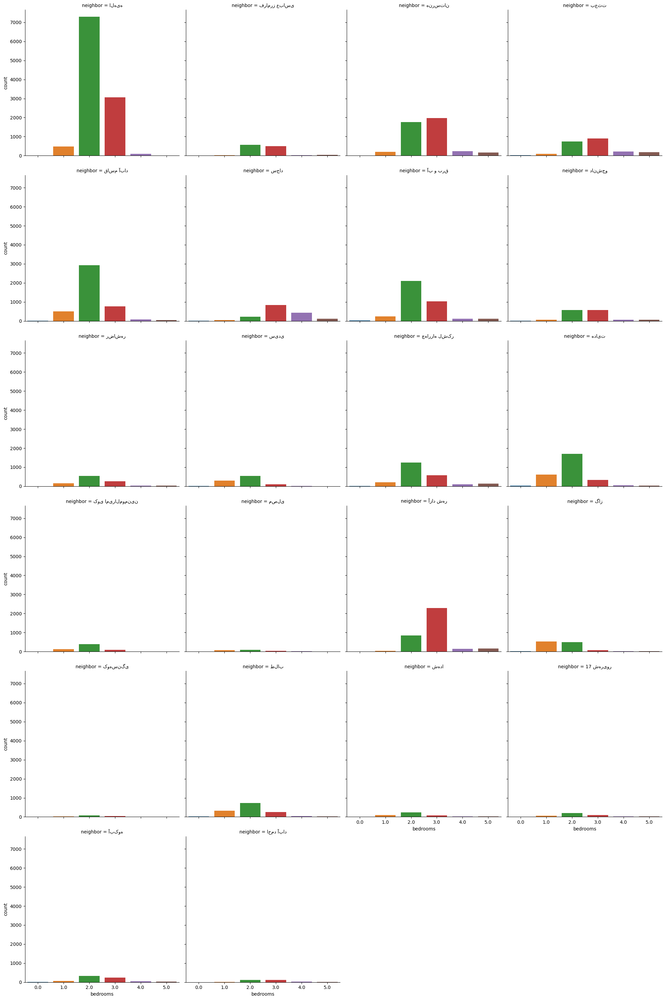

In [213]:
sns.catplot(x = "bedrooms", kind="count", data = train_data, col = "neighbor", col_wrap=4)

In [214]:
bed_0_aprt[(bed_0_aprt.description.notna()) & (bed_0_aprt.description.str.contains("سویت|سوییت|سوئیت") == False) & (bed_0_aprt.area > 80)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
319,فروش آپارتمان,85.0,منطقه 2 محله هدایت خیابان مطهری شمالی,آپارتمان دور قاب\r\nبا سلام \n\nواحد اپارت...,36.316310,59.608390,0.0,3,0.0,1.170000e+09,2,هدایت,مطهری شمالی,0
2647,فروش آپارتمان,135.0,منطقه 12 محله الهیه خیابان الهیه,متر ،رحمانیه ، تک واحدی\r\n««کارگزاری امل...,36.373776,59.475820,4.0,3,0.0,4.600000e+09,12,الهیه,الهیه,0
2847,فروش آپارتمان,110.0,منطقه 2 محله هدایت خیابان ابوطالب,آپارتمان/ متر/به صورت دورقاب\r\n↙️عسگری هست...,36.318450,59.587680,0.0,4,0.0,8.000000e+08,2,هدایت,ابوطالب,0
4743,فروش آپارتمان,268.0,منطقه 1 محله بعثت خیابان احمدآباد,v/منزل-کلنگی -متر- \r\n پنج راه سنا...,36.299350,59.565440,0.0,0,0.0,3.200000e+10,1,بعثت,احمدآباد,0
11065,فروش آپارتمان,200.0,منطقه 8 محله چهارراه لشکر خیابان بلوار امام خ...,اپارتمان متر پاسداران\r\nاپارتمان نما حرم ...,36.287380,59.598476,0.0,9,0.0,1.200000e+10,8,چهارراه لشکر,بلوار امام خمینی,0
11971,فروش آپارتمان,210.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,واحد متری آپارتمان معاوضه بااتوبوس\r\nیک وا...,36.327670,59.548380,0.0,0,0.0,2.450000e+09,2,فرامرز عباسی,فرامرز عباسی,0
14584,فروش آپارتمان,210.0,منطقه 12 محله الهیه خیابان امیریه,زمین حاشیه کاظمیه سجادیه \r\nبا سلام\n\...,36.380667,59.484676,0.0,0,0.0,5.600000e+09,12,الهیه,امیریه,0
18706,فروش آپارتمان,130.0,منطقه 4 و 5 محله طلاب خیابان مفتح,آپارتمان متری/فول/تکواحدی/سندار مفتح \r\n...,36.296030,59.643700,0.0,0,0.0,3.500000e+09,4,طلاب,مفتح,0
28521,فروش آپارتمان,100.0,منطقه 7 محله سیدی خیابان کوشش,v/فروش-ملک- متر- \r\n,36.265280,59.609260,0.0,0,0.0,1.000000e+09,7,سیدی,کوشش,0
31801,فروش آپارتمان,105.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متری ، امیریه ،\r\nآپارتمان ...,36.373776,59.475820,11.0,3,0.0,1.980000e+09,12,الهیه,الهیه,0


In [215]:
train_data.drop(bed_0_aprt[(bed_0_aprt.description.notna()) & (bed_0_aprt.description.str.contains("سویت|سوییت|سوئیت") == False) & (bed_0_aprt.area > 80)].index,
               inplace = True)

In [216]:
bed_0_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.bedrooms == 0)]

In [217]:
bed_0_vila.shape

(152, 14)

In [218]:
bed_0_vila[(bed_0_vila.description.notna()) & (bed_0_vila.seet == 0) & (bed_0_vila.description.notna()) & (bed_0_vila.description.str.contains("هوایی|هوای"))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
590,فروش ویلایی,120.0,منطقه 2 محله هدایت خیابان ابوطالب,متر هوایی ابوطالب\r\nسلام\n متری هوایی...,36.31845,59.58768,0.0,0,0.0,6.100000e+08,2,هدایت,ابوطالب,0
7767,فروش ویلایی,140.0,منطقه 3 محله گاز خیابان رسالت,سر سه نبش رسالت هوایی متر\r\nسلام ...,36.30314,59.63380,0.0,0,0.0,7.500000e+08,3,گاز,رسالت,0
39774,فروش ویلایی,50.0,منطقه 3 محله گاز خیابان طبرسی شمالی,هوایی متری آماده ساخت\r\nیک هوایی متری ...,36.32321,59.62739,0.0,0,0.0,2.500000e+08,3,گاز,طبرسی شمالی,0
43263,فروش ویلایی,70.0,منطقه 3 محله گاز خیابان طبرسی شمالی,هوایی طبقه فروشی\r\nباسلام ملک واقع شده در طب...,36.32321,59.62739,15.0,0,0.0,1.000000e+09,3,گاز,طبرسی شمالی,0


In [219]:
train_data.drop(bed_0_vila[(bed_0_vila.description.notna()) & (bed_0_vila.seet == 0) & (bed_0_vila.description.notna()) & (bed_0_vila.description.str.contains("هوایی|هوای"))].index,
               inplace=True)

In [220]:
bed_0_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.bedrooms == 0)]

In [221]:
bed_0_vila[(bed_0_vila.description.notna()) & (bed_0_vila.seet == 0)].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
37564,فروش ویلایی,30.0,منطقه 12 محله الهیه خیابان سجادیه,واحد نقلی متری در واحد\r\n طبقه باهم م...,36.287740,59.641006,22.0,0,0.0,1.350000e+09,12,الهیه,سجادیه,0
2531,فروش ویلایی,30.0,منطقه 9 محله آب و برق خیابان صیاد شیرازی,زیر بنا متر طرح دوبلکس دربست\r\nانتهای صیا...,36.332341,59.485542,14.0,0,0.0,5.000000e+08,9,آب و برق,صیاد شیرازی,0
18335,فروش ویلایی,30.0,منطقه 1 محله سجاد خیابان بهارستان,خانه ویلایی در دوطبقه متراژ \r\nبا سلام خان...,36.226456,59.603893,27.0,0,0.0,1.600000e+09,1,سجاد,بهارستان,0
35441,فروش ویلایی,30.0,منطقه 2 محله شهدا خیابان عبادی,ویلایی نقلی، مترزمین متربنا،سه راهی فاطمیه\...,36.301770,59.608440,15.0,0,0.0,9.000000e+08,2,شهدا,عبادی,0
22635,فروش ویلایی,35.0,منطقه 4 و 5 محله طلاب خیابان مفتح,ویلایی نقلی حاشیه رسالت\r\n متر زیر بنا دوب...,36.296030,59.643700,20.0,0,0.0,1.550000e+09,4,طلاب,مفتح,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6914,فروش ویلایی,1000.0,منطقه 9 محله آب و برق خیابان برونسی,زمین متری شهرک گلستان سه راه فردوسی حاشیه...,36.326765,59.463926,0.0,0,0.0,8.000000e+09,9,آب و برق,برونسی,0
47458,فروش ویلایی,1020.0,منطقه 9 محله آب و برق خیابان برونسی,متر زمین دو نبش تراکم زیاد وکیل آباد\r\n...,36.326765,59.463926,0.0,0,0.0,3.500000e+10,9,آب و برق,برونسی,0
13764,فروش ویلایی,1250.0,منطقه 9 محله آب و برق خیابان برونسی,متر داخل شهرک اختصاصی خیابان پارمیدا چها...,36.326765,59.463926,22.0,0,0.0,4.500000e+09,9,آب و برق,برونسی,0
12771,فروش ویلایی,1500.0,منطقه 2 محله هدایت خیابان عبدالمطلب,زمین در زشک\r\nخانه در حال ساخت همراه با درخت...,36.317990,59.607300,0.0,0,0.0,7.500000e+08,2,هدایت,عبدالمطلب,0


In [222]:
# train_data.select_dtypes("number").corr()

In [223]:
bed_0_vila[(bed_0_vila.description.notna()) & (bed_0_vila.seet == 0) & (bed_0_vila.area > 70) & (bed_0_vila.description.str.contains("زمین"))].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
11392,فروش ویلایی,100.0,منطقه 3 محله گاز خیابان رسالت,زمین خالی\r\n متر زمین خالی واقعا در ر...,36.303140,59.633800,NaN,0,0.0,7.500000e+08,3,گاز,رسالت,0
19619,فروش ویلایی,106.0,منطقه 3 محله گاز خیابان طبرسی شمالی,زمین متری قلفتی\r\nسلام زمین متری شترک ...,36.323210,59.627390,NaN,0,0.0,6.900000e+08,3,گاز,طبرسی شمالی,0
31634,فروش ویلایی,117.0,منطقه 1 محله آبکوه خیابان کلاهدوز,زمین اسکلت با پروانه\r\nفروش فوری\nفقط نقدی،غ...,36.299940,59.574790,0.0,0,0.0,6.200000e+09,1,آبکوه,کلاهدوز,0
46180,فروش ویلایی,120.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,ویلایی جلال قبل مهران متر دونبش پروانه دار...,36.327540,59.527520,30.0,0,0.0,1.350000e+10,11,آزاد شهر,آزادشهر,0
42389,فروش ویلایی,120.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,سیدرضی متر دونبش با سقف پروانه تهاتر با وا...,36.333500,59.520240,24.0,0,0.0,1.400000e+10,11,آزاد شهر,فرهنگ,0
23278,فروش ویلایی,146.0,منطقه 2 محله شهدا خیابان عبادی,متر زمین طبقه فاصله تا حرم دقیقه\r\nکوچه...,36.306790,59.606724,18.0,0,0.0,4.000000e+09,2,شهدا,عبادی,0
44200,فروش ویلایی,150.0,منطقه 4 و 5 محله طلاب خیابان مفتح,متر باپروانه مفتح \r\nیک قطعه زمین با متر...,36.296030,59.643700,30.0,0,0.0,6.500000e+09,4,طلاب,مفتح,0
22333,فروش ویلایی,150.0,منطقه 12 محله الهیه خیابان امیریه,خانه با نقشه بدون ستون\r\nزمین فوق کلا مت...,36.472813,59.498264,NaN,0,0.0,8.000000e+08,12,الهیه,امیریه,0
7360,فروش ویلایی,180.0,منطقه 2 محله هدایت خیابان ابوطالب,انبار ونمایشگاه\r\nسلام متراژزمین متر که ...,36.354710,59.558720,9.0,0,0.0,4.770000e+09,2,هدایت,ابوطالب,0
40704,فروش ویلایی,190.0,منطقه 12 محله الهیه خیابان امیریه,زمین در مجتمع ویلایی\r\nزمین متردوممردرمحی...,36.412304,59.459846,28.0,0,0.0,1.100000e+09,12,الهیه,امیریه,0


In [224]:
train_data.drop(bed_0_vila[(bed_0_vila.description.notna()) & (bed_0_vila.seet == 0) & (bed_0_vila.area > 70) & (bed_0_vila.description.str.contains("زمین"))].index, inplace=True)

In [225]:
bed_0_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.bedrooms == 0)]

In [226]:
train_data[(train_data.type.str.contains("ویلایی")) & (train_data.description.notna())].bedrooms.value_counts()

bedrooms
2.0    1294
5.0    1175
3.0     882
4.0     793
1.0     706
0.0     108
Name: count, dtype: int64

<Axes: xlabel='bedrooms', ylabel='area'>

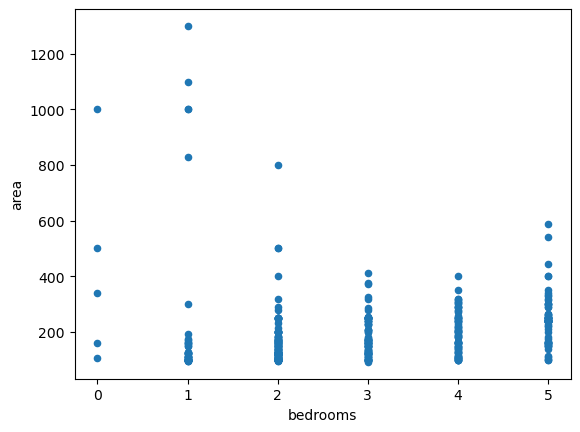

In [227]:
train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 2) & (train_data.seet == 0 ) & (train_data.area > 90)].plot.scatter(y = "area", x = "bedrooms")

In [228]:
bed_0_vila[bed_0_vila.area > 90].age.std(), train_data[(train_data.type.str.contains("ویلایی")) & (train_data.area > 90) & (train_data.bedrooms != 0)].age.std()

(11.189280584559492, 8.771613994287213)

In [229]:
train_data[(train_data.type.str.contains("ویلا")) & (train_data.description.notna()) & (train_data.seet == 0) & (train_data.area > 90) & (train_data.bedrooms != 0)].sort_values("area").head(10)

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
33732,فروش ویلایی,92.0,منطقه 2 محله هدایت خیابان عبدالمطلب,فروش منزل ویلائی سند ششدانگ ملکی در متر بن...,36.317990,59.607300,22.0,0,3.0,2.300000e+09,2,هدایت,عبدالمطلب,0
41507,فروش ویلایی,94.0,منطقه 2 محله شهدا خیابان کامیاب,ویلایی متری مجلسی نزدیک حرم ابراهیمی مسلم\...,36.302190,59.630490,30.0,0,1.0,2.750000e+09,2,شهدا,کامیاب,0
7364,فروش ویلایی,95.0,منطقه 8 محله چهارراه لشکر خیابان بلوار امام خ...,ویلایی طبقه بازسازی صفر تاصد خ ثامن\r\nسلام...,36.288100,59.600600,25.0,0,2.0,6.200000e+09,8,چهارراه لشکر,بلوار امام خمینی,0
1130,فروش ویلایی,95.0,منطقه 7 محله 17 شهریور خیابان هفده شهریور,متر زمین در سه طبقه از همکف\r\nطبقه اول ه...,36.276045,59.617282,17.0,0,4.0,7.500000e+09,7,17 شهریور,هفده شهریور,0
17955,فروش ویلایی,95.0,منطقه 9 محله آب و برق خیابان برونسی,متر زمین متر بنا شمالی تراکم زیاد وکیل آ...,36.326765,59.463926,10.0,0,3.0,7.000000e+09,9,آب و برق,برونسی,0
7591,فروش ویلایی,95.0,منطقه 2 محله کوی امیرالمومنین خیابان خیام شمالی,فروش خانه ویلایی دوطبقه\r\nمنزل فوق واقع در خ...,36.324510,59.570100,9.0,0,2.0,1.850000e+09,2,کوی امیرالمومنین,خیام شمالی,0
21823,فروش ویلایی,95.0,منطقه 3 محله گاز خیابان رسالت,فروش حیاط ویلایی رسالت‌همت آباد\r\nسلام عرض ا...,36.303140,59.633800,5.0,0,1.0,8.600000e+08,3,گاز,رسالت,0
13863,فروش ویلایی,95.0,منطقه 2 محله هدایت خیابان مطهری شمالی,ویلایی متر دوطبقه*سندششدانگ ملکی*\r\n✳️کار...,36.316310,59.608390,29.0,0,3.0,2.250000e+09,2,هدایت,مطهری شمالی,0
32790,فروش ویلایی,95.0,منطقه 4 و 5 محله طلاب خیابان مفتح,ویلایی\r\n✅سه طبقه ویلایی مستقل \n✅میلان پهن ...,36.296030,59.643700,7.0,0,5.0,5.800000e+09,4,طلاب,مفتح,0
46906,فروش ویلایی,95.0,منطقه 11 محله دانشجو خیابان صدف,ویلایی دانگ تراکمزیادمیلان متراسکلت آهن بلوا...,36.340256,59.495407,16.0,0,2.0,7.250000e+09,11,دانشجو,صدف,0


<Axes: xlabel='area', ylabel='Density'>

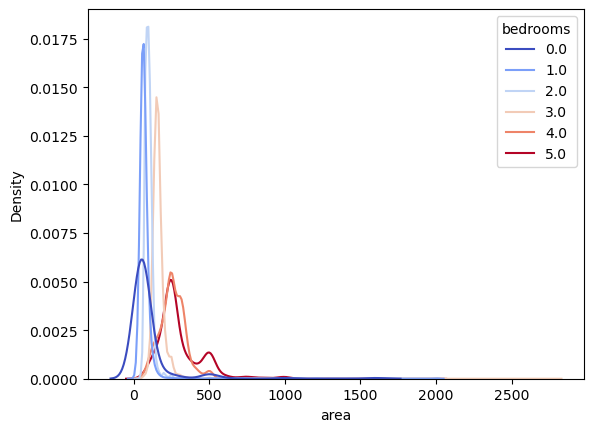

In [230]:
sns.kdeplot(x = "area", hue = "bedrooms", data = train_data, palette="coolwarm", common_norm=False)

In [231]:
test_data[test_data.bedrooms == 0]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price
106,فروش آپارتمان,73.0,منطقه 2 محله کوی امیرالمومنین خیابان خیام شمالی,آپارتمان متری موقیت مکانی\r\nارادت قیمت با...,36.324510,59.570100,8,2,0,NaN
530,فروش ویلایی,60.0,منطقه 3 محله گاز خیابان گاز,خانه ی ویلایی دو طبقه\r\nخانه ویلایی دو طبقه ...,36.315080,59.632800,22,0,0,NaN
694,فروش ویلایی,200.0,منطقه 1 محله کوهسنگی خیابان بهشتی,یک زمین کلنگی به مساحت متر\r\nیک زمین ...,36.283478,59.574820,30,0,0,NaN
1085,فروش آپارتمان,55.0,منطقه 3 محله گاز خیابان طبرسی شمالی,آپارتمان متری شیک\r\nسلام آپارتمان متری ت...,36.323210,59.627390,6,2,0,NaN
1455,فروش آپارتمان,89.0,منطقه 9 محله هنرستان خیابان هنرستان,متر هنرستان \r\nحاشیه متری \nطبقه دوم \n...,36.313811,59.500077,15,2,0,NaN
2397,فروش آپارتمان,68.0,منطقه 3 محله گاز خیابان طبرسی شمالی,سفت کاری طبقه رو پیلوت\r\nیه واحد طبقه سوم ...,36.323210,59.627390,0,3,0,NaN
2650,فروش آپارتمان,50.0,منطقه 7 محله سیدی خیابان کوشش,آپارتمان بدون خواب\r\nیک واحد آپارتمان طبق...,36.265280,59.609260,4,0,0,NaN
2907,فروش آپارتمان,35.0,منطقه 1 محله سجاد خیابان بهارستان,آپارتمان متری همکف\r\nیه واحد آپارتمان ...,36.221430,59.610306,12,0,0,NaN
2923,فروش ویلایی,154.0,منطقه 4 و 5 محله طلاب خیابان مفتح,ویلایی مترکوچه مختص ملک\r\nفروش فوری...سال...,36.296030,59.643700,30,0,0,NaN
3249,فروش ویلایی,30.0,منطقه 2 محله شهدا خیابان عبادی,ویلایی نقلی، مترزمین، متربنا،سه راهی فاطمیه...,36.301770,59.608440,16,0,0,NaN


In [232]:
bed_0_vila[(bed_0_vila.description.notna()) & (bed_0_vila.seet == 0) & (bed_0_vila.area > 200)].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
21436,فروش ویلایی,250.0,منطقه 9 محله رضاشهر خیابان باهنر,متر/شمالی/عرض \r\nاول باهنر \nویژه ویلای...,36.315256,59.525500,15.0,0,0.0,3.200000e+10,9,رضاشهر,باهنر,0
32815,فروش ویلایی,250.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,ویلایی قبل معلم یا معاوضه\r\n متر ویلایی\n...,36.327540,59.527520,21.0,0,0.0,2.050000e+07,11,آزاد شهر,آزادشهر,0
38478,فروش ویلایی,253.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,*متر * امامت فرد قبل اموزگار با پروانه جنو...,36.335133,59.541332,31.0,0,0.0,2.390000e+10,11,آزاد شهر,آزادشهر,0
27797,فروش ویلایی,255.0,منطقه 9 محله هنرستان خیابان هاشمیه,ویلایی جنوبی حاشیه وکیل اباد نزدیک مترو هفت ...,36.310605,59.504477,22.0,0,0.0,2.600000e+10,9,هنرستان,هاشمیه,0
42012,فروش ویلایی,340.0,منطقه 2 محله هدایت خیابان عبدالمطلب,ملک تجاری مسکونی دو کله ششدانگ\r\n✅حاشیه بلوا...,36.317990,59.607300,30.0,0,0.0,3.100000e+10,2,هدایت,عبدالمطلب,0
2371,فروش ویلایی,500.0,منطقه 1 محله بعثت خیابان احمدآباد,متر با پروانه اول رضا\r\nدرود و عرض ادب\n...,36.299350,59.565440,27.0,0,0.0,6.200000e+10,1,بعثت,احمدآباد,0
21387,فروش ویلایی,500.0,منطقه 9 محله آب و برق خیابان برونسی,ویلایی متری با پروانه/حاشیه وکیل آباد\r\n...,36.326765,59.463926,31.0,0,0.0,6.300000e+10,9,آب و برق,برونسی,0
29340,فروش ویلایی,500.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,ویلایی متری/بدون بنا/قابل تهاتر دونبش\r\nکا...,36.327670,59.548380,21.0,0,0.0,2.700000e+10,2,فرامرز عباسی,فرامرز عباسی,0
37864,فروش ویلایی,500.0,منطقه 9 محله آب و برق خیابان برونسی,ویلایی متری با پروانه/حاشیه وکیل آباد\r\n...,36.326765,59.463926,31.0,0,0.0,6.300000e+10,9,آب و برق,برونسی,0
44127,فروش ویلایی,500.0,منطقه 1 محله بعثت خیابان احمدآباد,ویلایی متری ناصر خسرو\r\nسلام\nویلایی ...,36.299350,59.565440,22.0,0,0.0,5.800000e+10,1,بعثت,احمدآباد,0


In [233]:
train_data.drop(bed_0_vila[(bed_0_vila.description.notna()) & (bed_0_vila.seet == 0) & (bed_0_vila.area > 200)].index, inplace=True)

In [234]:
train_data[(train_data.type.str.contains("ویلایی")) & (train_data.bedrooms == 0) & (train_data.seet == 0)].groupby(["region"])["bedrooms"].count() / train_data.shape[0]

region
1     0.000351
2     0.000176
3     0.000307
4     0.000483
6     0.000044
7     0.000351
8     0.000088
9     0.000088
11    0.000044
12    0.000044
Name: bedrooms, dtype: float64

#### meaningless regions in price : 

In [235]:
train_data.region.value_counts().sort_index()

region
1      4990
2      5029
3      1153
4      1403
6       231
7      1359
8      2307
9      8984
10     4352
11     4798
12    10930
Name: count, dtype: int64

In [236]:
train_data.price.describe()

count    4.553600e+04
mean     6.154903e+09
std      1.089354e+10
min      1.111111e+06
25%      2.650000e+09
50%      3.900000e+09
75%      6.530625e+09
max      8.840000e+11
Name: price, dtype: float64

<Axes: xlabel='area', ylabel='price'>

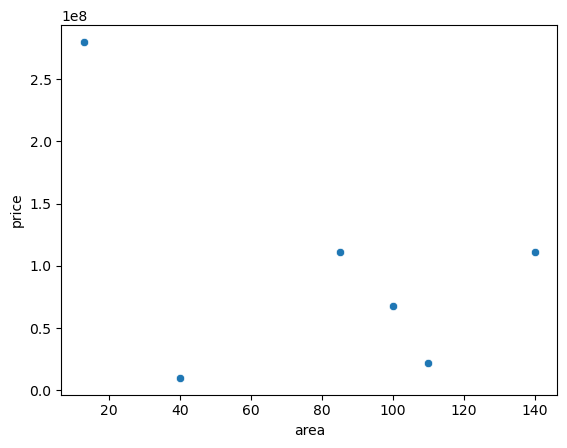

In [237]:
sns.scatterplot(x = "area", y = "price",data = train_data[(train_data.type.str.contains("تمان")) & (train_data.street == "امام رضا") & (train_data.price < 5e8)])

In [238]:
train_data.region.value_counts().sort_index().index

Index([1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12], dtype='int64', name='region')

In [239]:
train_data[(train_data.type.str.contains("تمان")) & (train_data.price <= 2e8)].region.value_counts()

region
12    19
9     18
11    16
1     15
2     15
4      9
7      6
10     5
3      5
8      5
Name: count, dtype: int64

In [240]:
train_data[(train_data.type.str.contains("تمان")) & (train_data.price <= 2e8)].describe()

,area,latitude,longitude,age,floor,bedrooms,price,region,seet
count,113.000000,113.000000,113.000000,107.000000,113.000000,113.000000,1.130000e+02,113.000000,113.000000
mean,128.513274,36.322744,59.545794,5.448598,2.778761,2.380531,7.965440e+07,7.026549,0.017699
std,51.546982,0.032843,0.058308,6.827019,1.791520,0.698450,4.245357e+07,4.150000,0.132443
min,40.000000,36.239393,59.463926,0.000000,0.000000,1.000000,1.000000e+07,1.000000,0.000000
25%,92.000000,36.299350,59.494380,0.000000,2.000000,2.000000,3.500000e+07,2.000000,0.000000
50%,115.000000,36.318450,59.527520,2.000000,3.000000,2.000000,1.000000e+08,9.000000,0.000000
75%,150.000000,36.336350,59.602730,9.000000,4.000000,3.000000,1.111111e+08,11.000000,0.000000
max,300.000000,36.385721,59.663293,30.000000,11.000000,5.000000,2.000000e+08,12.000000,1.000000


<Axes: xlabel='price', ylabel='Count'>

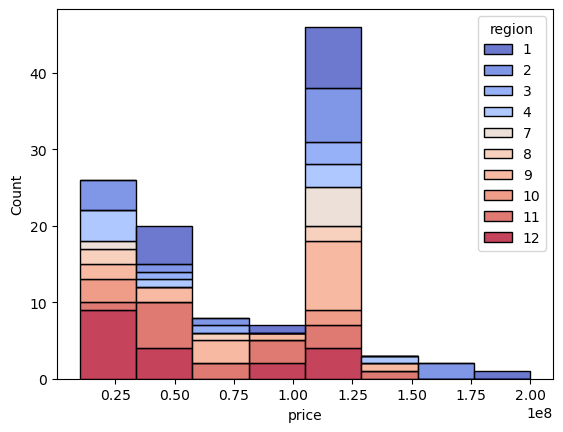

In [241]:
sns.histplot(data = train_data[(train_data.type.str.contains("تمان")) & (train_data.price <= 2e8)].sort_values("price"), x = "price", hue = "region", palette="coolwarm", multiple="stack")

In [242]:
train_data[(train_data.type.str.contains("تمان")) & (train_data.price <= 2e8)].sort_values("price").head(60)

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
37316,فروش آپارتمان,40.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,آپارتمان متری تا حدود متری\r\nباسلام یک ...,36.272780,59.602730,6.0,2,1.0,10000000.0,8,چهارراه لشکر,امام رضا,0
15710,فروش آپارتمان,60.0,منطقه 4 و 5 محله طلاب خیابان میدان عسگریه,واحدفروشی متری همکف مشهد فلکه جوادالائمه\r\...,36.299290,59.651320,1.0,0,2.0,14500006.0,4,طلاب,میدان عسگریه,0
12417,فروش آپارتمان,85.0,منطقه 2 محله هدایت خیابان موسوی قوچانی,فروش آپارتمان دو خوابه\r\n_بلوار موسوی قوچانی...,36.325810,59.586920,0.0,3,2.0,18500000.0,2,هدایت,موسوی قوچانی,0
15224,فروش آپارتمان,92.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,آپارتمان متر همکف\r\nهمکف متر\nدارای ...,36.327540,59.527520,16.0,0,2.0,20000000.0,11,آزاد شهر,آزادشهر,0
12576,فروش آپارتمان,100.0,منطقه 2 محله کوی امیرالمومنین خیابان کوی امیر...,طبقه آسانسوردار کوی امیر\r\nاملاک مسعود\nکد ...,36.341250,59.571770,6.0,5,2.0,22000000.0,2,کوی امیرالمومنین,کوی امیرالمومنین,0
1490,فروش آپارتمان,85.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,دو واحد آپارتمان متر خواب دریک ساختمان.\r...,36.360020,59.517400,4.0,2,2.0,22222222.0,10,قاسم آباد,قاسم آباد,0
17503,فروش آپارتمان,110.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,آپارتمان خیابان امام رضا نزدیک به حاشیه\r\nلو...,36.272780,59.602730,0.0,3,2.0,22222222.0,8,چهارراه لشکر,امام رضا,0
1909,فروش آپارتمان,100.0,منطقه 2 محله هدایت خیابان هدایت,اپارتمان فروشی متراژ متر پیامبر اعظم \r...,36.336350,59.593670,0.0,3,2.0,23000000.0,2,هدایت,هدایت,0
24851,فروش آپارتمان,78.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,آپارتمان خوابه شریعتی \r\nبا سلام\n متر...,36.353470,59.495605,15.0,2,2.0,24180000.0,10,قاسم آباد,قاسم آباد,0
44456,فروش آپارتمان,91.0,منطقه 4 و 5 محله طلاب خیابان مفتح,اپارتمان متر دو خواب\r\nآپارتمان تابرج رهن ...,36.296030,59.643700,8.0,3,2.0,24500000.0,4,طلاب,مفتح,0


In [243]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.price <= 2e8)].index, inplace=True)

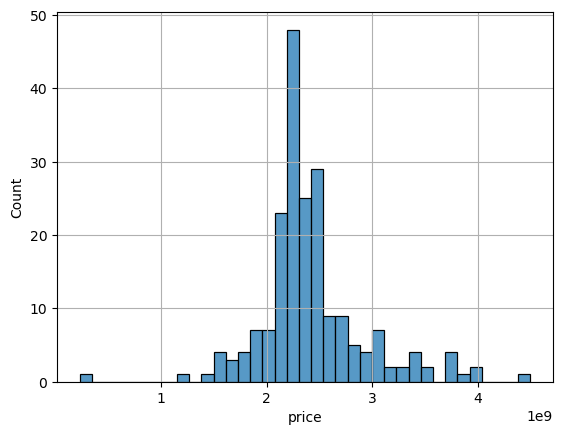

In [244]:
sns.histplot(x = "price", data = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 12) & (train_data.age == 10) ])
plt.grid()

In [245]:
train_data[(train_data.type.str.contains("تمان")) &  (train_data.price < 4e8) ].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
38801,فروش آپارتمان,13.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,سهم از هتل تهاتر با \r\n سهم از هتل نرجس ...,36.290470,59.616177,0.0,2,1.0,280000000.0,8,چهارراه لشکر,امام رضا,0
1317,فروش آپارتمان,14.0,منطقه 9 محله آب و برق خیابان صیاد شیرازی,سوییت متری\r\nانتهای صیاد شیرازی\nانتهای صا...,36.332341,59.485542,22.0,1,0.0,230000000.0,9,آب و برق,صیاد شیرازی,1
215,فروش آپارتمان,15.0,منطقه 9 محله آب و برق خیابان صابر,راه جدا,36.311730,59.473980,12.0,0,0.0,270000000.0,9,آب و برق,صابر,0
38708,فروش آپارتمان,45.0,منطقه 3 محله گاز خیابان طبرسی شمالی,آپارتمان شیک و نقلی و صفر\r\nیک واحد نوساز .ا...,36.323210,59.627390,NaN,4,1.0,320000000.0,3,گاز,طبرسی شمالی,0
28501,فروش آپارتمان,50.0,منطقه 3 محله گاز خیابان طبرسی شمالی,خونه دوطبقه متری طبقه بالا\r\nباسلام خسته ...,36.323210,59.627390,12.0,2,1.0,330000000.0,3,گاز,طبرسی شمالی,0
17591,فروش آپارتمان,50.0,منطقه 3 محله گاز خیابان رسالت,منزل دوبلکس متری* متربالا مترپایین\r\nبا...,36.303140,59.633800,6.0,0,2.0,285000000.0,3,گاز,رسالت,0
19214,فروش آپارتمان,50.0,منطقه 3 محله گاز خیابان طبرسی شمالی,آپارتمان هوایی، متری، طبقه سوم، طبرسی\r\nبا...,36.323210,59.627390,0.0,3,1.0,240000000.0,3,گاز,طبرسی شمالی,0
24270,فروش آپارتمان,55.0,منطقه 3 محله گاز خیابان طبرسی شمالی,هوای طبقه اول بالا همکف میلان متری\r\nهوای ط...,36.323210,59.627390,3.0,1,0.0,285000000.0,3,گاز,طبرسی شمالی,0
21330,فروش آپارتمان,60.0,منطقه 2 محله شهدا خیابان عبادی,آپارتمان متری باهوایی درچراغچی \r\nسلام آپار...,36.301770,59.608440,7.0,1,1.0,290000000.0,2,شهدا,عبادی,0
30080,فروش آپارتمان,63.0,منطقه 3 محله گاز خیابان طبرسی شمالی,آپارتمان هوایی متر، طبقه ،طبرسی\r\nباسلام...,36.323210,59.627390,0.0,4,1.0,220000000.0,3,گاز,طبرسی شمالی,0


In [246]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.price <= 4e8)].iloc[1:].index, inplace=True)

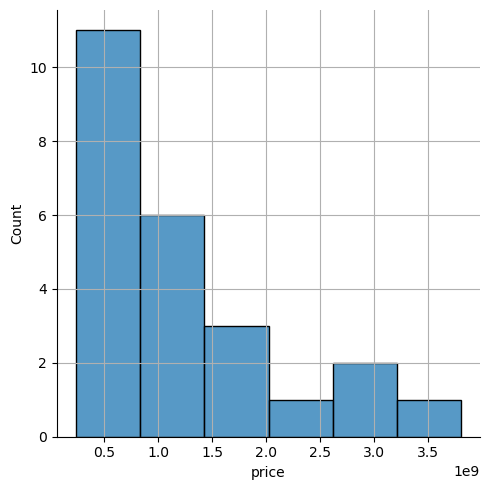

In [247]:
sns.displot(x = "price", data = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 3) & (train_data.age == 2) ])
plt.grid()

In [248]:
train_data[(train_data.type.str.contains("ویلایی")) & (train_data.price < 3e8)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
22108,فروش ویلایی,150.0,منطقه 6 محله مصلی خیابان کارمندان,خریدارملک در کارمندان\r\nمایل به معاوضه با آپ...,36.267352,59.645822,30.0,0,1.0,1111111.0,6,مصلی,کارمندان,0
18137,فروش ویلایی,55.0,منطقه 3 محله گاز خیابان گاز,متر ویلایی داخل کوچه\r\n متر ویلایی مسلم...,36.315080,59.632800,9.0,0,1.0,11111111.0,3,گاز,گاز,0
36795,فروش ویلایی,156.0,منطقه 7 محله سیدی خیابان کوشش,خانه ویلایی دوممر\r\nخانه ویلایی دوممر ازیک ط...,36.265280,59.609260,29.0,0,2.0,22222222.0,7,سیدی,کوشش,0
10257,فروش ویلایی,60.0,منطقه 6 محله مصلی خیابان کارمندان,خانه ویلایی رستمی\r\nدوطبقه مجزا، کولر آبی ، ...,36.267352,59.645822,9.0,0,1.0,27000000.0,6,مصلی,کارمندان,0
23057,فروش ویلایی,840.0,منطقه 9 محله آب و برق خیابان صیاد شیرازی,تهاتر ویلا با مجتمع - متر\r\nتهاتر با یک ...,36.325523,59.479862,30.0,0,2.0,40000000.0,9,آب و برق,صیاد شیرازی,0
17453,فروش ویلایی,265.0,منطقه 2 محله شهدا خیابان عبادی,ملک کلنلی میباشد واستانه وتوافقی برای\r\nدرصو...,36.302103,59.612779,30.0,0,5.0,55000000.0,2,شهدا,عبادی,0
741,فروش ویلایی,70.0,منطقه 2 محله هدایت خیابان موسوی قوچانی,فقط معاوضه با ویلایی\r\nسلام علیکم\nبا احترام...,36.325810,59.586920,6.0,0,1.0,55555555.0,2,هدایت,موسوی قوچانی,0
31128,فروش ویلایی,150.0,منطقه 6 محله مصلی خیابان شیرودی,متر ویلایی جنوبی ده متر حاشیه\r\nویلایی ...,36.272680,59.622610,31.0,0,3.0,61000000.0,6,مصلی,شیرودی,0
7836,فروش ویلایی,286.0,منطقه 3 محله گاز خیابان رسالت,منزل ویلایی متر\r\nسلام ویلایی متر حا...,36.303140,59.633800,27.0,0,5.0,75000000.0,3,گاز,رسالت,0
34902,فروش ویلایی,90.0,منطقه 3 محله گاز خیابان رسالت,منزل ویلای متر حیاط ماشین رو رسالت \r\nس...,36.303140,59.633800,4.0,0,1.0,80000000.0,3,گاز,رسالت,0


In [249]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.price < 3e8)].index, inplace=True)

(array([461.,   3.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   2.]),
 array([3.50000e+08, 1.23150e+10, 2.42800e+10, 3.62450e+10, 4.82100e+10,
        6.01750e+10, 7.21400e+10, 8.41050e+10, 9.60700e+10, 1.08035e+11,
        1.20000e+11]),
 <BarContainer object of 10 artists>)

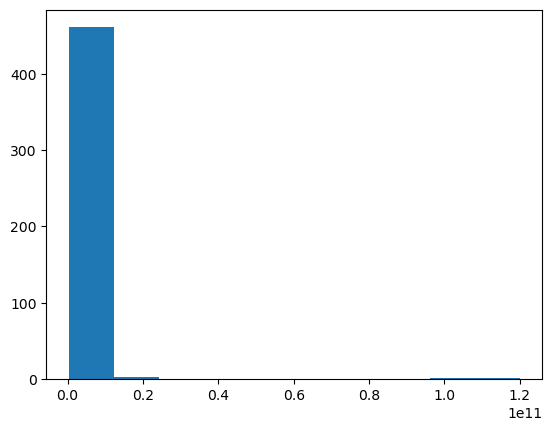

In [250]:
plt.hist("price", data = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 3)])

###### -----------------------------------

<Axes: xlabel='area', ylabel='Density'>

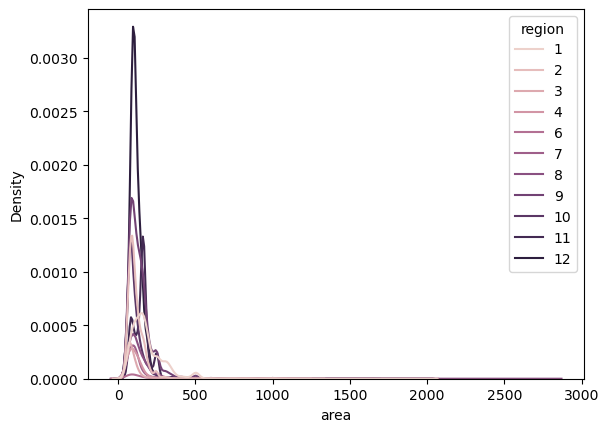

In [251]:
sns.kdeplot(x = "area", data = train_data, hue = "region")

In [252]:
train_data[(train_data.type.str.contains("تمان")) & (train_data.description.notna()) & (train_data.description.str.contains("یک جا|یکجا|فروش یکجا|واحد یکجا") )]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [253]:
def plot_area_price(main_df, sub_df):
    
    sns.scatterplot(x = "area", y = "price", data = main_df)
    sns.scatterplot(x = "area", y = "price", data = sub_df)
    

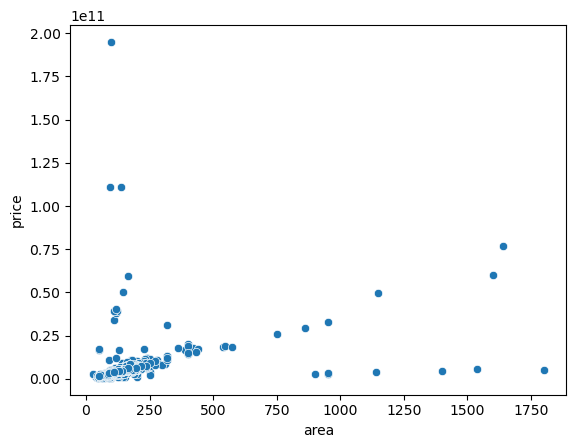

In [254]:
plot_area_price(train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان"))], 
               train_data[(train_data.type.str.contains("تمان")) & (train_data.description.notna()) & (train_data.description.str.contains("یک جا|یکجا|فروش یکجا|واحد یکجا") ) & (train_data.region == 12)])

In [255]:
# train_data[(train_data.type.str.contains("تمان")) & (train_data.description.notna()) & (train_data.description.str.contains("یک جا|یکجا|فروش یکجا|واحد یکجا") ) & (train_data.region == 12)].sort_values("price")

+ must be checked ****************

In [256]:
# train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.description.notna()) & (train_data.description.str.contains("یک جا|یکجا|فروش یکجا|واحد یکجا") )].index,
#                inplace=True)

In [257]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.floor > 0)].index, inplace = True)

## 12

In [258]:
region_12_aprt = train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان"))]

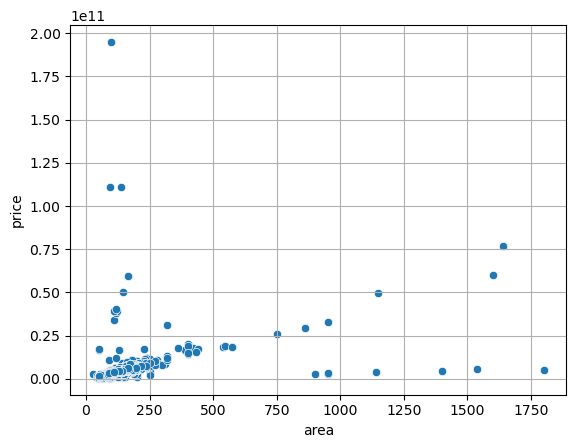

In [259]:
sns.scatterplot(x = "area", y = "price", data = region_12_aprt)
plt.grid()

### ---

In [260]:
region_12_aprt[ (region_12_aprt.area > 600)].sort_values(by = "area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
19668,فروش آپارتمان,750.0,منطقه 12 محله الهیه خیابان الهیه,معاوضه واحد با زمین / بدون مشرف روف گاردن\r\n...,36.373776,59.475820,0.0,2,3.0,2.600000e+10,12,الهیه,الهیه,0
29361,فروش آپارتمان,860.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متری مجموعه واحدی سند آماده\r\nب...,36.373776,59.475820,0.0,5,5.0,2.960000e+10,12,الهیه,الهیه,0
31683,فروش آپارتمان,900.0,منطقه 12 محله الهیه خیابان الهیه,متری دوخواب\r\nباسلام واحترام\nواحدفوق مت...,36.373776,59.475820,5.0,3,2.0,2.750000e+09,12,الهیه,الهیه,0
14784,فروش آپارتمان,950.0,منطقه 12 محله الهیه خیابان الهیه,واحد آپارتمان دربست الهیه\r\nیک مجموعه واح...,36.373776,59.475820,0.0,5,5.0,3.300000e+10,12,الهیه,الهیه,0
29693,فروش آپارتمان,950.0,منطقه 12 محله الهیه خیابان الهیه,متر صفر با وام آماده\r\nهوالرزاق \n\nبا...,36.373970,59.475350,0.0,3,2.0,2.500000e+09,12,الهیه,الهیه,0
43138,فروش آپارتمان,950.0,منطقه 12 محله الهیه خیابان الهیه,متر/ میلیون وام/ واحدی\r\n. ➖➖➖➖...,36.373776,59.475820,2.0,2,2.0,3.100000e+09,12,الهیه,الهیه,0
1867,فروش آپارتمان,1140.0,منطقه 12 محله الهیه خیابان الهیه,متر/ میلیون وام اماده/اول الهیه\r\n. ...,36.373776,59.475820,3.0,2,2.0,4.100000e+09,12,الهیه,الهیه,0
16873,فروش آپارتمان,1150.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان واحد *کلی متر*اول الهبه\r\nنام...,36.367157,59.486412,0.0,5,3.0,4.950000e+10,12,الهیه,الهیه,0
8954,فروش آپارتمان,1400.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متری/ خواب/سندآماده/مناسب خرید\r...,36.373776,59.475820,2.0,4,3.0,4.200000e+09,12,الهیه,الهیه,0
27506,فروش آپارتمان,1539.0,منطقه 12 محله الهیه خیابان الهیه,١٥٣مترى فول امکانات برند\r\nسلام و احترام خدم...,36.373776,59.475820,2.0,1,3.0,5.500000e+09,12,الهیه,الهیه,0


In [261]:
region_12_aprt[(region_12_aprt.area < 500) & (region_12_aprt.price > .25e11)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
4150,فروش آپارتمان,165.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان تک واحدی کلا واحدمحمدیه \r\n⚡مسکن س...,36.366684,59.475088,0.0,3,3.0,5.920000e+10,12,الهیه,الهیه,0
10041,فروش آپارتمان,110.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متر خواب نور با مستر در منطقه ال...,36.373776,59.475820,0.0,5,2.0,3.400000e+10,12,الهیه,الهیه,0
12028,فروش آپارتمان,117.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان ، فول ، در الهیه\r\n⭕مسکن بزرگان\n❌م...,36.373776,59.475820,2.0,1,2.0,3.800000e+10,12,الهیه,الهیه,0
12086,فروش آپارتمان,137.0,منطقه 12 محله الهیه خیابان امیریه,اپارتمان متر خواب تک واحدی\r\n متر ت...,36.380667,59.484676,0.0,1,3.0,1.111111e+11,12,الهیه,امیریه,0
18215,فروش آپارتمان,122.0,منطقه 12 محله الهیه خیابان الهیه,متری سند آماده خوابه الهیه\r\n*********...,36.373776,59.475820,4.0,5,3.0,3.930000e+10,12,الهیه,الهیه,0
20534,فروش آپارتمان,110.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متری دو خوابه\r\n✨واحد خاص منطقه...,36.373776,59.475820,0.0,5,2.0,3.900000e+10,12,الهیه,الهیه,0
25112,فروش آپارتمان,120.0,منطقه 12 محله الهیه خیابان الهیه,متر/سازه برند /لوکیشن اوایل رحمانیه\r\nمسک...,36.373776,59.475820,0.0,1,3.0,4.044000e+10,12,الهیه,الهیه,0
27227,فروش آپارتمان,96.0,منطقه 12 محله الهیه خیابان الهیه,مترصفر شخصی ساز فول هشت واحدی اقدسیه \r\n...,36.373776,59.475820,0.0,1,2.0,1.111111e+11,12,الهیه,الهیه,0
27897,فروش آپارتمان,320.0,منطقه 12 محله الهیه خیابان الهیه,ناصرخسرو/ متری/ خواب\r\n️️️ مشاور املاک د...,36.373776,59.475820,0.0,5,3.0,3.100000e+10,12,الهیه,الهیه,0
44846,فروش آپارتمان,145.0,منطقه 12 محله الهیه خیابان الهیه,فروش آپارتمان متری فول امکانات\r\nسلام احت...,36.373776,59.475820,1.0,3,3.0,5.046000e+10,12,الهیه,الهیه,0


In [262]:
train_data.drop([46403, 12086,27227, 27897], inplace=True)
train_data.drop([29361,14784,16873,16927], inplace=True)

In [263]:
train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان"))  & (train_data.area >= 440) ].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
13159,فروش آپارتمان,440.0,منطقه 12 محله الهیه خیابان الهیه,چهارطبقه تک واحدی معاوضه با ویلایی در قاسم‌آب...,36.373776,59.47582,0.0,4,5.0,1.700000e+10,12,الهیه,الهیه,0
2102,فروش آپارتمان,540.0,منطقه 12 محله الهیه خیابان الهیه,واحد آپارتمان مدرن و هوشمند*فول متریال*الهیه...,36.373776,59.47582,0.0,2,2.0,1.829000e+10,12,الهیه,الهیه,0
11924,فروش آپارتمان,545.0,منطقه 12 محله الهیه خیابان الهیه,متراژ از یک ساختمان ، تهاتر با زمین ملکی\...,36.373776,59.47582,1.0,5,3.0,1.900000e+10,12,الهیه,الهیه,0
25856,فروش آپارتمان,575.0,منطقه 12 محله الهیه خیابان الهیه,واحد متری/قابل تهاتر با زمین متری\r\n...,36.373776,59.47582,0.0,3,2.0,1.840000e+10,12,الهیه,الهیه,0
19668,فروش آپارتمان,750.0,منطقه 12 محله الهیه خیابان الهیه,معاوضه واحد با زمین / بدون مشرف روف گاردن\r\n...,36.373776,59.47582,0.0,2,3.0,2.600000e+10,12,الهیه,الهیه,0
31683,فروش آپارتمان,900.0,منطقه 12 محله الهیه خیابان الهیه,متری دوخواب\r\nباسلام واحترام\nواحدفوق مت...,36.373776,59.47582,5.0,3,2.0,2.750000e+09,12,الهیه,الهیه,0
29693,فروش آپارتمان,950.0,منطقه 12 محله الهیه خیابان الهیه,متر صفر با وام آماده\r\nهوالرزاق \n\nبا...,36.373970,59.47535,0.0,3,2.0,2.500000e+09,12,الهیه,الهیه,0
43138,فروش آپارتمان,950.0,منطقه 12 محله الهیه خیابان الهیه,متر/ میلیون وام/ واحدی\r\n. ➖➖➖➖...,36.373776,59.47582,2.0,2,2.0,3.100000e+09,12,الهیه,الهیه,0
1867,فروش آپارتمان,1140.0,منطقه 12 محله الهیه خیابان الهیه,متر/ میلیون وام اماده/اول الهیه\r\n. ...,36.373776,59.47582,3.0,2,2.0,4.100000e+09,12,الهیه,الهیه,0
8954,فروش آپارتمان,1400.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متری/ خواب/سندآماده/مناسب خرید\r...,36.373776,59.47582,2.0,4,3.0,4.200000e+09,12,الهیه,الهیه,0


In [264]:
train_data.loc[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.area > 500) & (train_data.bedrooms <= 3)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
1867,فروش آپارتمان,1140.0,منطقه 12 محله الهیه خیابان الهیه,متر/ میلیون وام اماده/اول الهیه\r\n. ...,36.373776,59.47582,3.0,2,2.0,4.100000e+09,12,الهیه,الهیه,0
2102,فروش آپارتمان,540.0,منطقه 12 محله الهیه خیابان الهیه,واحد آپارتمان مدرن و هوشمند*فول متریال*الهیه...,36.373776,59.47582,0.0,2,2.0,1.829000e+10,12,الهیه,الهیه,0
5067,فروش آپارتمان,1800.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متری/برند/سند اماده/سرمایه گذاری\...,36.373776,59.47582,0.0,2,3.0,4.820000e+09,12,الهیه,الهیه,0
8954,فروش آپارتمان,1400.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متری/ خواب/سندآماده/مناسب خرید\r...,36.373776,59.47582,2.0,4,3.0,4.200000e+09,12,الهیه,الهیه,0
11924,فروش آپارتمان,545.0,منطقه 12 محله الهیه خیابان الهیه,متراژ از یک ساختمان ، تهاتر با زمین ملکی\...,36.373776,59.47582,1.0,5,3.0,1.900000e+10,12,الهیه,الهیه,0
19668,فروش آپارتمان,750.0,منطقه 12 محله الهیه خیابان الهیه,معاوضه واحد با زمین / بدون مشرف روف گاردن\r\n...,36.373776,59.47582,0.0,2,3.0,2.600000e+10,12,الهیه,الهیه,0
25856,فروش آپارتمان,575.0,منطقه 12 محله الهیه خیابان الهیه,واحد متری/قابل تهاتر با زمین متری\r\n...,36.373776,59.47582,0.0,3,2.0,1.840000e+10,12,الهیه,الهیه,0
26965,فروش آپارتمان,1640.0,منطقه 12 محله الهیه خیابان الهیه,متر آپارتمان/ الهیه/ تهاتر با زمین\r\nبا ...,36.373776,59.47582,0.0,5,3.0,7.700000e+10,12,الهیه,الهیه,0
27506,فروش آپارتمان,1539.0,منطقه 12 محله الهیه خیابان الهیه,١٥٣مترى فول امکانات برند\r\nسلام و احترام خدم...,36.373776,59.47582,2.0,1,3.0,5.500000e+09,12,الهیه,الهیه,0
29693,فروش آپارتمان,950.0,منطقه 12 محله الهیه خیابان الهیه,متر صفر با وام آماده\r\nهوالرزاق \n\nبا...,36.373970,59.47535,0.0,3,2.0,2.500000e+09,12,الهیه,الهیه,0


In [265]:
train_data.loc[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.area > 500)  & (train_data.price < 1e10), "area"] /=10

In [266]:
train_data.loc[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.area < 330) & (train_data.price > .25e11), "price"] /= 10

In [267]:
train_data.loc[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.area > 500) & (train_data.bedrooms <= 3) , ["area", "price"]] /= 10

In [268]:
# train_data = train_data.drop(train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.area >= 500) & (train_data.bedrooms >3) ].index)

In [269]:
# train_data.drop(train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان"))  & (train_data.area >= 440) ].index, inplace=True)

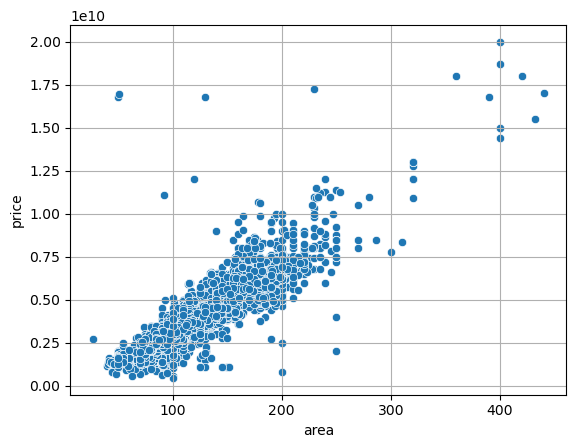

In [270]:
sns.scatterplot(x = "area", y = "price", data = train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان"))])
plt.grid()

In [271]:
train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.price > 1.3e10)].sort_values("price", ascending=False)

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
6463,فروش آپارتمان,400.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متر/صفر دوبلکس/سازه مدرن\r\nبنام...,36.373776,59.475820,0.0,5,4.0,2.000000e+10,12,الهیه,الهیه,0
20899,فروش آپارتمان,400.0,منطقه 12 محله الهیه خیابان الهیه,متری تک واحدی با مجموعه آبی اول رحمانیه\r...,36.373776,59.475820,0.0,4,5.0,1.870000e+10,12,الهیه,الهیه,0
1198,فروش آپارتمان,420.0,منطقه 12 محله الهیه خیابان الهیه,خواب / تاپ لوکیشن/ شاه نشین\r\n⭐ مسکن سراسر...,36.373776,59.475820,0.0,5,5.0,1.800000e+10,12,الهیه,الهیه,0
36836,فروش آپارتمان,360.0,منطقه 12 محله الهیه خیابان الهیه,متر دوبلکس/تاپ لوکیشن رحمانیه/شخصی\r\nبنام...,36.373776,59.475820,0.0,6,4.0,1.800000e+10,12,الهیه,الهیه,0
39473,فروش آپارتمان,230.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متر/هتلینگ،برج/ویو ابدی وکیل آباد\...,36.373776,59.475820,0.0,13,3.0,1.725000e+10,12,الهیه,الهیه,0
13159,فروش آپارتمان,440.0,منطقه 12 محله الهیه خیابان الهیه,چهارطبقه تک واحدی معاوضه با ویلایی در قاسم‌آب...,36.373776,59.475820,0.0,4,5.0,1.700000e+10,12,الهیه,الهیه,0
28068,فروش آپارتمان,51.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متری ششدانگ سرمایه گذاری\r\nباسلام...,36.363160,59.466297,16.0,0,1.0,1.695000e+10,12,الهیه,الهیه,0
2366,فروش آپارتمان,130.0,منطقه 12 محله الهیه خیابان الهیه,معاوضه آپارتمانی در تهران با سه واحد در مشهد\...,36.373776,59.475820,8.0,2,3.0,1.680000e+10,12,الهیه,الهیه,0
3868,فروش آپارتمان,50.0,منطقه 12 محله الهیه خیابان الهیه,متر شیک اول سجادیه شش دانگ\r\nسرامیک. ...,36.373776,59.475820,16.0,1,1.0,1.680000e+10,12,الهیه,الهیه,0
11652,فروش آپارتمان,390.0,منطقه 12 محله الهیه خیابان الهیه,واحد هوشمند و مدرن/تاپ لوکیشن رحمانیه\r\n●م...,36.373776,59.475820,0.0,4,2.0,1.679000e+10,12,الهیه,الهیه,0


In [272]:
train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.price > 1e10) & (train_data.area < 150)].sort_values("area", ascending=False)

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
2366,فروش آپارتمان,130.0,منطقه 12 محله الهیه خیابان الهیه,معاوضه آپارتمانی در تهران با سه واحد در مشهد\...,36.373776,59.475820,8.0,2,3.0,1.680000e+10,12,الهیه,الهیه,0
28168,فروش آپارتمان,120.0,منطقه 12 محله الهیه خیابان امیریه,نبش مجهز جنوبی .\r\nتوسعه مسکن (دیماس)\n((ف...,36.380667,59.484676,0.0,0,2.0,1.200000e+10,12,الهیه,امیریه,0
14600,فروش آپارتمان,92.0,منطقه 12 محله الهیه خیابان الهیه,فروش یا معاوضه محمدیه \r\nواحد متری \nفول...,36.373776,59.475820,5.0,1,2.0,1.111111e+10,12,الهیه,الهیه,0
28068,فروش آپارتمان,51.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متری ششدانگ سرمایه گذاری\r\nباسلام...,36.363160,59.466297,16.0,0,1.0,1.695000e+10,12,الهیه,الهیه,0
3868,فروش آپارتمان,50.0,منطقه 12 محله الهیه خیابان الهیه,متر شیک اول سجادیه شش دانگ\r\nسرامیک. ...,36.373776,59.475820,16.0,1,1.0,1.680000e+10,12,الهیه,الهیه,0


In [273]:
train_data.drop(train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.price > 1e10) & (train_data.area < 150)].index, inplace=True)

In [274]:
train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.price > .25e10) & (train_data.area < 50)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
42886,فروش آپارتمان,27.0,منطقه 12 محله الهیه خیابان الهیه,متر صفر مجیدیه فول امکانات\r\n⬛◼◾ مسکن ...,36.373776,59.47582,1.0,3,2.0,2.700000e+09,12,الهیه,الهیه,0


In [275]:
# show_description(train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.price > .25e10) & (train_data.area < 50)])

In [276]:
train_data.drop(train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.price > .25e10) & (train_data.area < 50)].index , inplace=True)

In [277]:
train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.price < 9e8) & (train_data.age < 5)].sort_values(by = "price", ascending=False)

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
361,فروش آپارتمان,65.0,منطقه 12 محله الهیه خیابان امیریه,متر/ واحدی/منزل‌آباد\r\nسلام و احترام\nلطفا...,36.380667,59.484676,0.0,2,1.0,820000000.0,12,الهیه,امیریه,0
35883,فروش آپارتمان,70.0,منطقه 12 محله الهیه خیابان امیریه,آپارتمان متر زیربنا دوخوابه\r\nیک واحد آپا...,36.431793,59.474650,0.0,0,2.0,650000000.0,12,الهیه,امیریه,0
40041,فروش آپارتمان,90.0,منطقه 12 محله الهیه خیابان امیریه,v/اپارتمان- متری- \r\n اپارتمان سفت ...,36.380667,59.484676,0.0,0,1.0,600000000.0,12,الهیه,امیریه,0
45920,فروش آپارتمان,63.0,منطقه 12 محله الهیه خیابان امیریه,اپارتمان متری خواب\r\nاپارتمان متری طب...,36.446400,59.474518,3.0,2,1.0,580000000.0,12,الهیه,امیریه,0


In [278]:
veyrani_data = train_data[(train_data.description.notna()) & (train_data.description.str.contains("ویرانی"))]

In [279]:
veyrani_data

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
317,فروش ویلایی,346.0,منطقه 12 محله الهیه خیابان الهیه,خانه ویلایی سند دار\r\nسلام \nخانه ویلایی در ...,36.373776,59.475820,11.0,0,2.0,4.000000e+09,12,الهیه,الهیه,0
1856,فروش آپارتمان,75.0,منطقه 11 محله دانشجو خیابان نمایشگاه,متری یکخواب\r\nنور خوب\nمحیط آرام\nهوای پاک...,36.345145,59.462374,0.0,1,1.0,1.000000e+09,11,دانشجو,نمایشگاه,0
3006,فروش آپارتمان,200.0,منطقه 12 محله الهیه خیابان الهیه,هوایی آپارتمان متری ویرانی\r\nباسلام زمین ...,36.373776,59.475820,NaN,4,3.0,8.000000e+08,12,الهیه,الهیه,0
3412,فروش آپارتمان,75.0,منطقه 12 محله الهیه خیابان الهیه,متر / یک خواب / ویرانی / قابل تهاتر\r\nبنام...,36.373776,59.475820,0.0,1,1.0,9.200000e+08,12,الهیه,الهیه,0
6500,فروش آپارتمان,101.0,منطقه 12 محله الهیه خیابان الهیه,خونه دربست متری دوخواب\r\n●⁦⚜️⁩■ کارگزاری ...,36.373776,59.475820,1.0,0,2.0,1.900000e+09,12,الهیه,الهیه,0
8389,فروش آپارتمان,50.0,منطقه 9 محله آب و برق خیابان برونسی,آپارتمان ویرانی \r\nطبقه همکف مرحله نازک کار...,36.326765,59.463926,NaN,0,1.0,5.200000e+08,9,آب و برق,برونسی,0
9859,فروش آپارتمان,85.0,منطقه 9 محله آب و برق خیابان برونسی,ویرانی*فروش یکواحد آپارتمان تکمیل،هوایی متر...,36.326765,59.463926,2.0,3,1.0,5.100000e+08,9,آب و برق,برونسی,0
13328,فروش آپارتمان,65.0,منطقه 9 محله آب و برق خیابان برونسی,منزل واقع در ویرانی-خیابان بزرگ و موقعیت\r\nب...,36.326765,59.463926,11.0,0,1.0,9.200000e+08,9,آب و برق,برونسی,0
15796,فروش ویلایی,280.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,فروش خونه ویلایی ویرانی \r\nفروش فوری زیر ق...,36.272780,59.602730,1.0,0,2.0,2.900000e+09,8,چهارراه لشکر,امام رضا,0
19576,فروش ویلایی,900.0,منطقه 9 محله آب و برق خیابان برونسی,ویلا دوبلکس صفر ویرانی \r\nسلام و عرض ادب \n...,36.326765,59.463926,0.0,0,4.0,1.100000e+10,9,آب و برق,برونسی,1


<Axes: xlabel='neighbor'>

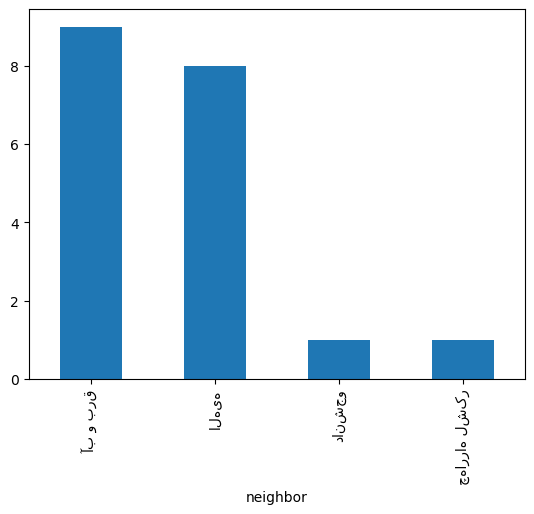

In [280]:
veyrani_data.neighbor.value_counts().plot.bar()

In [281]:
train_data.drop(veyrani_data.index, inplace=True)

In [282]:
train_data

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
0,فروش آپارتمان,73.0,منطقه 12 محله الهیه خیابان الهیه,متر امیریه/سند آماده/آسانسور پارکینگ/فول\r\...,36.373776,59.475820,11.0,1,2.0,2.200000e+09,12,الهیه,الهیه,0
1,فروش آپارتمان,100.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,آپارتمان متر/فول/خوش نقشه/فرامرز\r\nباسلام\...,36.327670,59.548380,7.0,1,2.0,4.800000e+09,2,فرامرز عباسی,فرامرز عباسی,0
2,فروش آپارتمان,140.0,منطقه 9 محله هنرستان خیابان هاشمیه,متر در هاشمیه\r\n⚜️⚜️⚜️کارگزاری املاک هورا...,36.310605,59.504477,0.0,2,2.0,1.020000e+10,9,هنرستان,هاشمیه,0
4,فروش آپارتمان,200.0,منطقه 12 محله الهیه خیابان الهیه,/ متر*همکف*فول* مترحیاط باامکانات کامل\r\...,36.373776,59.475820,0.0,0,3.0,5.350000e+09,12,الهیه,الهیه,0
6,فروش آپارتمان,120.0,منطقه 1 محله بعثت خیابان کوهسنگی,آپارتمان متری اکبری خیابان کوهسنگی\r\nکار...,36.287180,59.574720,10.0,4,2.0,5.200000e+09,1,بعثت,کوهسنگی,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48115,فروش آپارتمان,110.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,متر / حاشیه فرهنگ / سال ساخت\r\nباسلام\nم...,36.328550,59.513390,4.0,4,2.0,5.100000e+09,11,آزاد شهر,فرهنگ,0
48116,فروش آپارتمان,110.0,منطقه 12 محله الهیه خیابان الهیه,اپارتمان متری سه نبش(تهاتر)\r\nتوجه!!!!!!...,36.371452,59.484620,4.0,3,2.0,4.100000e+09,12,الهیه,الهیه,0
48117,فروش آپارتمان,140.0,منطقه 9 محله هنرستان خیابان هفت تیر,متر ، خواب ، هفت تیر ، بازسازی شده\r...,36.319780,59.494770,15.0,1,2.0,5.500000e+09,9,هنرستان,هفت تیر,0
48118,فروش آپارتمان,130.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,(( مــِـتر رَفـیـعـی ))\r\n❄️❄️❄️❄️❄️❄️❄️❄...,36.349873,59.488426,4.0,2,3.0,4.100000e+09,10,قاسم آباد,قاسم آباد,0


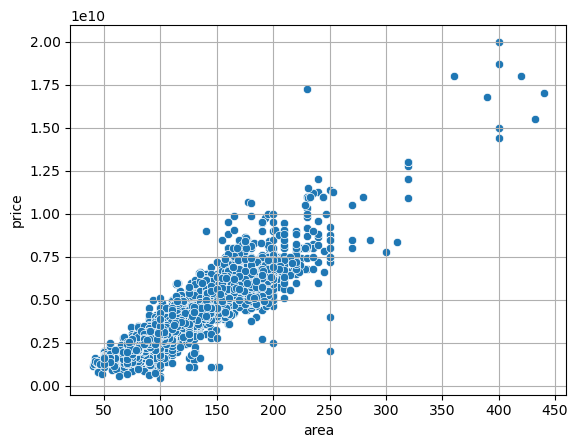

In [283]:
sns.scatterplot(x = "area", y = "price", data = train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان"))])
plt.grid()

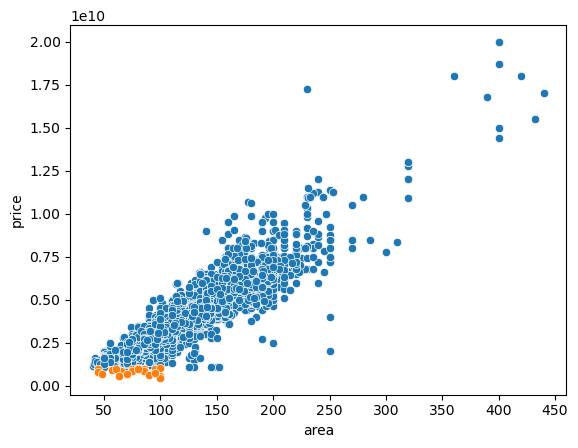

In [284]:
plot_area_price(train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان"))],
               train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.price <= 1e9) ])

In [285]:
train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.price <= 1e9) & (train_data.age > 10)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
41413,فروش آپارتمان,48.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متر،یک خوابه،باوام اوراق مسکن\r\nبا...,36.373776,59.475820,16.0,0,1.0,690000000.0,12,الهیه,الهیه,0
42084,فروش آپارتمان,95.0,منطقه 12 محله الهیه خیابان امیریه,آپارتمان متری ،یک خوابه امتیازات جدا\r\n م...,36.411747,59.492863,12.0,1,1.0,750000000.0,12,الهیه,امیریه,0
5946,فروش آپارتمان,45.0,منطقه 12 محله الهیه خیابان سجادیه,آپارتمان متری یک خواب مناسب زوج\r\nجای پارک ...,36.284940,59.642033,11.0,2,1.0,780000000.0,12,الهیه,سجادیه,0
31601,فروش آپارتمان,45.0,منطقه 12 محله الهیه خیابان الهیه,سند دانگ متری تک خواب وبازسازی کامل درسجادیه...,36.373776,59.475820,21.0,3,1.0,800000000.0,12,الهیه,الهیه,0
15344,فروش آپارتمان,45.0,منطقه 12 محله الهیه خیابان الهیه,متری/ خواب/حاشیه بلوار اصلی\r\nبه نام خدا\n...,36.373776,59.475820,14.0,3,1.0,950000000.0,12,الهیه,الهیه,0


In [286]:
# show_description(train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.price <= 1e9) ].sort_values("price"))

In [287]:
# train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.price <= 1e9) & (train_data.age == 0)]

In [288]:
# train_data.drop(train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.price <= 1e9) ].index, inplace=True)

+ Check

In [289]:
train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان"))].describe()

,area,latitude,longitude,age,floor,bedrooms,price,region,seet
count,10791.000000,10791.000000,10791.000000,10760.000000,10791.000000,10791.000000,1.079100e+04,10791.0,10791.000000
mean,113.467121,36.374163,59.476297,3.401301,2.850524,2.255583,3.649595e+09,12.0,0.001946
std,34.946994,0.003804,0.005028,4.437200,1.492083,0.538861,1.426297e+09,0.0,0.044073
min,40.000000,36.284940,59.450157,0.000000,0.000000,1.000000,4.500000e+08,12.0,0.000000
25%,90.000000,36.373776,59.475820,0.000000,2.000000,2.000000,2.750000e+09,12.0,0.000000
50%,106.000000,36.373776,59.475820,1.000000,3.000000,2.000000,3.400000e+09,12.0,0.000000
75%,132.000000,36.373776,59.475820,6.000000,4.000000,3.000000,4.300000e+09,12.0,0.000000
max,440.000000,36.458714,59.642033,27.000000,13.000000,5.000000,2.000000e+10,12.0,1.000000


In [290]:
train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان"))].bedrooms.value_counts()

bedrooms
2.0    7226
3.0    3031
1.0     448
4.0      83
5.0       3
Name: count, dtype: int64

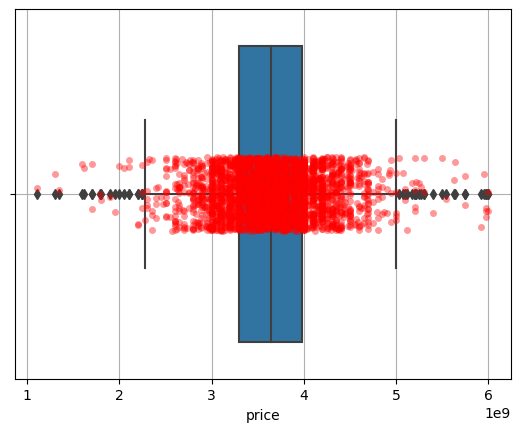

In [291]:
sns.boxplot(x = "price", data = train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.area > 100) & (train_data.area < 130)])
sns.stripplot(x = "price", data = train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & (train_data.area > 100) & (train_data.area < 130)], color = "red",
             alpha = .4)
plt.grid()

### other_aprt

In [292]:
region_12_aprt = train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان"))]

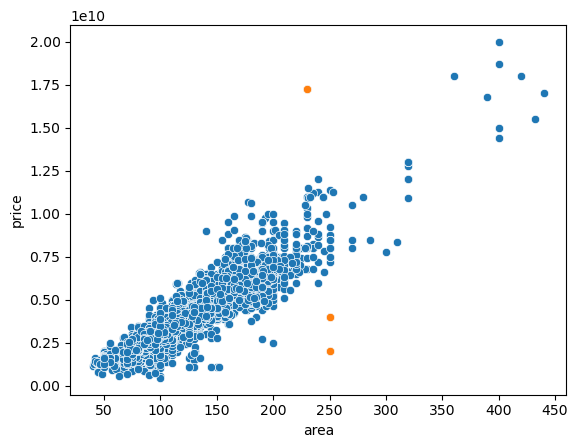

In [293]:
plot_area_price(region_12_aprt,
region_12_aprt[(((region_12_aprt.price < .5e10) & (region_12_aprt.area > 200)) | ((region_12_aprt.price > 1.5e10) & (region_12_aprt.area < 250)))])

In [294]:
region_12_aprt[(((region_12_aprt.price < .5e10) & (region_12_aprt.area > 200)) | ((region_12_aprt.price > 1.5e10) & (region_12_aprt.area < 250)))].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
15321,فروش آپارتمان,250.0,منطقه 12 محله الهیه خیابان امیریه,آپارتمان دارای طبقه هر طبقه واحد متریمیباش...,36.403970,59.463875,NaN,1,2.0,2.000000e+09,12,الهیه,امیریه,0
4892,فروش آپارتمان,250.0,منطقه 12 محله الهیه خیابان الهیه,متر، اول مجیدیه\r\nبا سلام و ارادت\n⚜️پیش...,36.373776,59.475820,0.0,6,3.0,4.000000e+09,12,الهیه,الهیه,0
39473,فروش آپارتمان,230.0,منطقه 12 محله الهیه خیابان الهیه,آپارتمان متر/هتلینگ،برج/ویو ابدی وکیل آباد\...,36.373776,59.475820,0.0,13,3.0,1.725000e+10,12,الهیه,الهیه,0


In [295]:
train_data.drop(train_data[(train_data.region == 12) & (train_data.type.str.contains("تمان")) & 
                (((train_data.price < .5e10) & (train_data.area > 200)) | ((train_data.price > 1.5e10) & (train_data.area < 250)))].index, inplace=True)

### vilaee elahie

In [296]:
region_12_vilaee = train_data[(train_data.region == 12) & (train_data.type.str.contains("ویلایی"))]

<Axes: xlabel='area', ylabel='price'>

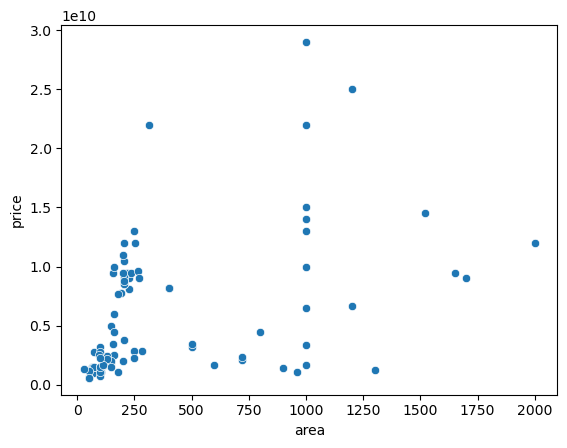

In [297]:
sns.scatterplot(x = "area", y = "price", data = region_12_vilaee)

#### --- 

In [298]:
# train_data[(train_data.type.str.contains("ویلا")) & (train_data.description.notna()) & (train_data.description.str.contains("باغ"))].neighbor.value_counts().plot.bar()

In [299]:
region_12_vilaee[(region_12_vilaee.area > 1500)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
13324,فروش ویلایی,1520.0,منطقه 12 محله الهیه خیابان الهیه,کاشی فیروزه متر ویلا\r\nباغ ویلا استثنای...,36.373776,59.475820,4.0,0,3.0,1.450000e+10,12,الهیه,الهیه,0
14762,فروش ویلایی,2000.0,منطقه 12 محله الهیه خیابان امیریه,شهرک گلستان ، دوهزار متر شش دانگ ، فروش معاوض...,36.426163,59.457787,19.0,0,1.0,1.200000e+10,12,الهیه,امیریه,0
26179,فروش ویلایی,1700.0,منطقه 12 محله الهیه خیابان امیریه,حدود مترزمین سندتک برگ\r\nفروش نقدی یا مع...,36.380667,59.484676,6.0,0,3.0,9.000000e+09,12,الهیه,امیریه,0
39375,فروش ویلایی,1650.0,منطقه 12 محله الهیه خیابان الهیه,متر زمین / متر بنا / یا معاوضه\r\nقا...,36.373776,59.475820,5.0,0,2.0,9.500000e+09,12,الهیه,الهیه,1


In [300]:
train_data.drop(region_12_vilaee[(region_12_vilaee.area > 1500)].index, inplace=True)

+ the addresses are out of mashhad in the desc

In [301]:
region_12_vilaee = train_data[(train_data.region == 12) & (train_data.type.str.contains("ویلایی"))]

<Axes: xlabel='longitude', ylabel='latitude'>

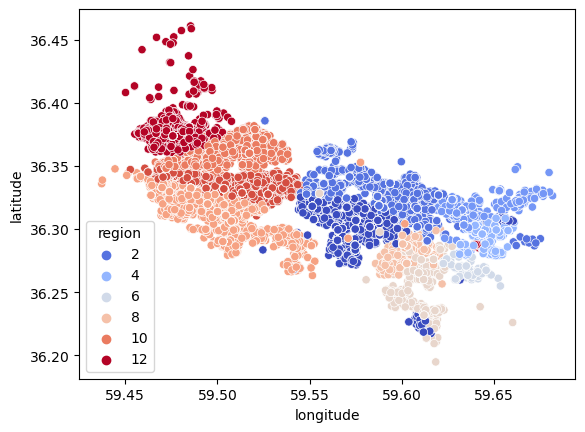

In [302]:
sns.scatterplot(x = "longitude", y = "latitude", data = train_data, hue = "region",palette="coolwarm")

<Axes: xlabel='longitude', ylabel='latitude'>

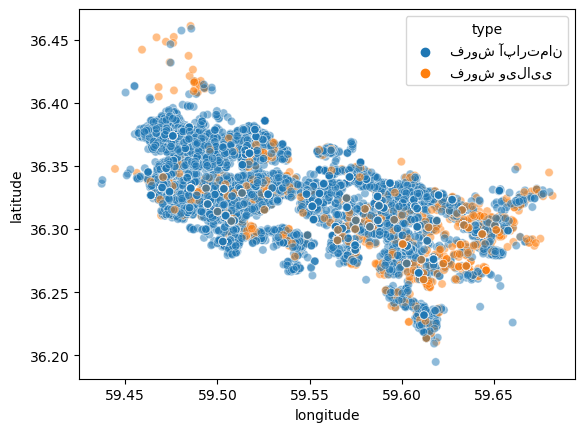

In [303]:
sns.scatterplot(x = "longitude", y = "latitude", data = train_data, hue = "type", alpha = .5)

<Axes: xlabel='longitude', ylabel='latitude'>

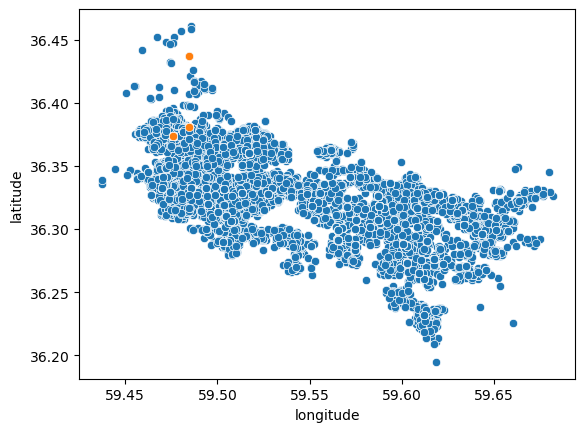

In [304]:
sns.scatterplot(x = "longitude", y = "latitude", data = train_data)
sns.scatterplot(x = "longitude", y = "latitude", data = train_data.loc[region_12_vilaee[(region_12_vilaee.area > 1000)].index])

<Axes: xlabel='area', ylabel='price'>

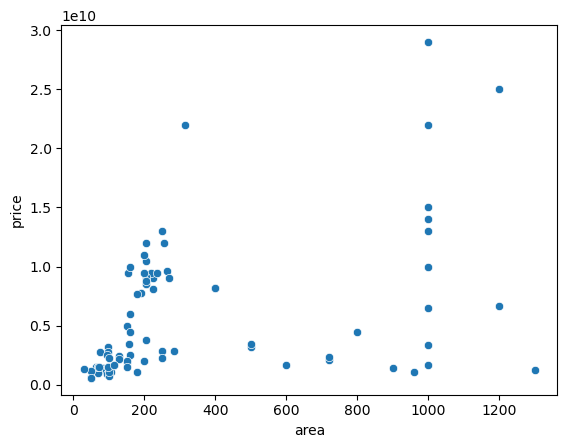

In [305]:
sns.scatterplot(x = "area", y = "price", data = region_12_vilaee)

In [306]:
region_12_vilaee[(region_12_vilaee.area > 300)].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
43202,فروش ویلایی,314.0,منطقه 12 محله الهیه خیابان الهیه,سه‌نبش‌تهاتر با واحد+ متر\r\nسلام و احترام...,36.373776,59.475820,18.0,0,3.0,2.200000e+10,12,الهیه,الهیه,0
6023,فروش ویلایی,400.0,منطقه 12 محله الهیه خیابان الهیه,ویلای ( تهاتر با آپارتمان )\r\nقابل توجه ساز...,36.373776,59.475820,2.0,0,3.0,8.200000e+09,12,الهیه,الهیه,0
39200,فروش ویلایی,400.0,منطقه 12 محله الهیه خیابان الهیه,ویلای ( تهاتر با آپارتمان )\r\nقابل توجه ساز...,36.373776,59.475820,2.0,0,3.0,8.200000e+09,12,الهیه,الهیه,0
24599,فروش ویلایی,500.0,منطقه 12 محله الهیه خیابان الهیه,ویلا شیک چهارفصل متر\r\nبا سلام \n\nباغ و...,36.373776,59.475820,3.0,0,2.0,3.200000e+09,12,الهیه,الهیه,0
29452,فروش ویلایی,500.0,منطقه 12 محله الهیه خیابان الهیه,ویلا متر خواب*فول امکانات سندآماده*حاشیه خی...,36.374714,59.471510,4.0,0,2.0,3.500000e+09,12,الهیه,الهیه,0
27769,فروش ویلایی,600.0,منطقه 12 محله الهیه خیابان الهیه,متر ، پیچ ساغروان ، استخر داخل\r\nامتیازا...,36.373776,59.475820,5.0,0,1.0,1.700000e+09,12,الهیه,الهیه,0
2346,فروش ویلایی,720.0,منطقه 12 محله الهیه خیابان الهیه,ویلا اول بازمرگان\r\nاول جاده بازمرگان عسکریه...,36.373776,59.475820,0.0,0,1.0,2.100000e+09,12,الهیه,الهیه,0
31547,فروش ویلایی,720.0,منطقه 12 محله الهیه خیابان الهیه,ویلا\r\nویلای شیک ونوساز مترملکی ،دارای ...,36.373776,59.475820,NaN,0,1.0,2.400000e+09,12,الهیه,الهیه,0
26757,فروش ویلایی,800.0,منطقه 12 محله الهیه خیابان امیریه,ویلای متری کیلومتری شهر پیامبراعظم \r\n♦️...,36.409810,59.476430,10.0,0,2.0,4.500000e+09,12,الهیه,امیریه,0
39384,فروش ویلایی,900.0,منطقه 12 محله الهیه خیابان الهیه,متر ویلایی شیر حصار/سند ملکی/نگهبانی سا...,36.373776,59.475820,2.0,0,1.0,1.400000e+09,12,الهیه,الهیه,0


In [307]:
train_data.drop(region_12_vilaee[(region_12_vilaee.area > 300)].index, inplace=True)

In [308]:
region_12_vilaee = train_data[(train_data.region == 12) & (train_data.type.str.contains("ویلایی"))]

In [309]:
region_12_vilaee.sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
37564,فروش ویلایی,30.0,منطقه 12 محله الهیه خیابان سجادیه,واحد نقلی متری در واحد\r\n طبقه باهم م...,36.287740,59.641006,22.0,0,0.0,1.350000e+09,12,الهیه,سجادیه,0
46990,فروش ویلایی,50.0,منطقه 12 محله الهیه خیابان امیریه,خونه ویلایی متری تخلیه می‌باشد\r\nویلایی ...,36.409267,59.487070,11.0,0,1.0,5.900000e+08,12,الهیه,امیریه,0
36442,فروش ویلایی,50.0,منطقه 12 محله الهیه خیابان امیریه,خانه ویلای\r\nباسلام خانه در خواج ربیع بهمن ...,36.380667,59.484676,4.0,0,0.0,6.000000e+08,12,الهیه,امیریه,0
21261,فروش ویلایی,50.0,منطقه 12 محله الهیه خیابان امیریه,ویلای متری\r\nخیابان بهارستان حاشیه خیابان ...,36.417355,59.490960,7.0,0,1.0,7.000000e+08,12,الهیه,امیریه,0
37227,فروش ویلایی,50.0,منطقه 12 محله الهیه خیابان امیریه,ویلایی واقع در منزلاباد\r\nملک واقع در منزلا...,36.380667,59.484676,1.0,0,2.0,1.200000e+09,12,الهیه,امیریه,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110,فروش ویلایی,250.0,منطقه 12 محله الهیه خیابان امیریه,ویلاتازه ساخت فروشی\r\nبه نام خدا\nسلام\nویلا...,36.380667,59.484676,NaN,0,1.0,2.850000e+09,12,الهیه,امیریه,0
31330,فروش ویلایی,255.0,منطقه 12 محله الهیه خیابان الهیه,ویلایی متر شاهد معاوضه با اپارتمان\r\n...,36.361328,59.523231,17.0,0,4.0,1.200000e+10,12,الهیه,الهیه,0
15133,فروش ویلایی,264.0,منطقه 12 محله الهیه خیابان الهیه,ویلایی متر / سه طبقه / جاهد شهر\r\nباسلام...,36.373776,59.475820,10.0,0,5.0,9.600000e+09,12,الهیه,الهیه,0
23908,فروش ویلایی,270.0,منطقه 12 محله الهیه خیابان الهیه,ویلایی متر متر زیربنا حاشیه متر\r\n...,36.364338,59.474100,13.0,0,3.0,9.000000e+09,12,الهیه,الهیه,0


#### other

In [310]:
region_12_vilaee = train_data[(train_data.region == 12) & (train_data.type.str.contains("ویلایی"))]

In [311]:
region_12_vilaee[(region_12_vilaee.area > 155) & (region_12_vilaee.price < .3e10)].sort_values("price").iloc[0]

type                                                  فروش ویلایی
area                                                        180.0
neighborhood                   منطقه 12 محله الهیه  خیابان امیریه
description      خانه ویلایی فول VIP\r\nبا سلام خدمت دوستان \n...
latitude                                                36.451821
longitude                                               59.466966
age                                                           7.0
floor                                                           0
bedrooms                                                      2.0
price                                                1111111111.0
region                                                         12
neighbor                                                    الهیه
street                                                     امیریه
seet                                                            0
Name: 43149, dtype: object

In [312]:
region_12_vilaee[(region_12_vilaee.area <= 50)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
21261,فروش ویلایی,50.0,منطقه 12 محله الهیه خیابان امیریه,ویلای متری\r\nخیابان بهارستان حاشیه خیابان ...,36.417355,59.490960,7.0,0,1.0,7.000000e+08,12,الهیه,امیریه,0
36442,فروش ویلایی,50.0,منطقه 12 محله الهیه خیابان امیریه,خانه ویلای\r\nباسلام خانه در خواج ربیع بهمن ...,36.380667,59.484676,4.0,0,0.0,6.000000e+08,12,الهیه,امیریه,0
37227,فروش ویلایی,50.0,منطقه 12 محله الهیه خیابان امیریه,ویلایی واقع در منزلاباد\r\nملک واقع در منزلا...,36.380667,59.484676,1.0,0,2.0,1.200000e+09,12,الهیه,امیریه,0
37564,فروش ویلایی,30.0,منطقه 12 محله الهیه خیابان سجادیه,واحد نقلی متری در واحد\r\n طبقه باهم م...,36.287740,59.641006,22.0,0,0.0,1.350000e+09,12,الهیه,سجادیه,0
46990,فروش ویلایی,50.0,منطقه 12 محله الهیه خیابان امیریه,خونه ویلایی متری تخلیه می‌باشد\r\nویلایی ...,36.409267,59.487070,11.0,0,1.0,5.900000e+08,12,الهیه,امیریه,0


In [313]:
train_data.drop(train_data[(train_data.region == 12) & (train_data.type.str.contains("ویلایی")) & 
(train_data.area <= 50)].index,inplace = True)

In [314]:
train_data.drop(train_data[(train_data.region == 12) & (train_data.type.str.contains("ویلایی")) & 
(train_data.area > 155) & (train_data.price < .3e10)].sort_values("price").iloc[:1].index,inplace = True)

### --

In [315]:
train_data[["price", "area"]].describe()

,price,area
count,4.528000e+04,45280.000000
mean,6.157544e+09,131.322533
std,1.083309e+10,79.703964
min,2.700000e+08,15.000000
25%,2.650000e+09,85.000000
50%,3.900000e+09,112.000000
75%,6.550000e+09,155.000000
max,8.840000e+11,2800.000000


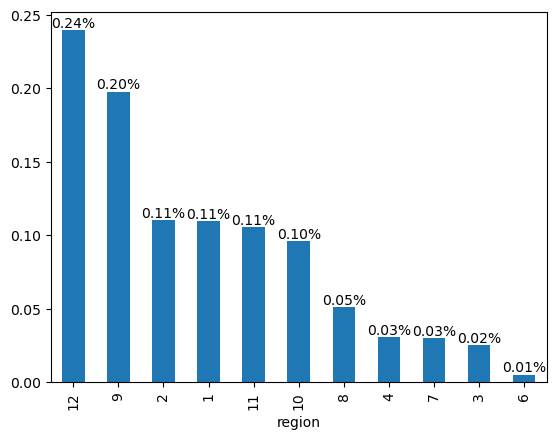

In [316]:
ax = (train_data.region.value_counts().sort_values(ascending=False) / train_data.shape[0]).plot.bar()
for cont in ax.containers :
    ax.bar_label(cont, fmt = "%.2f%%")
plt.show()

In [317]:
train_data[(train_data.type.str.contains("تمان"))].groupby(["region"])[["area", "price"]].mean()

,area,price
region,,
1,166.534853,1.088830e+10
2,107.844881,3.187234e+09
3,88.558912,1.641482e+09
4,107.024164,2.926164e+09
6,96.220339,2.802025e+09
7,100.646887,3.087584e+09
8,118.960296,6.060803e+09
9,127.237777,6.117888e+09
10,97.923972,2.871899e+09


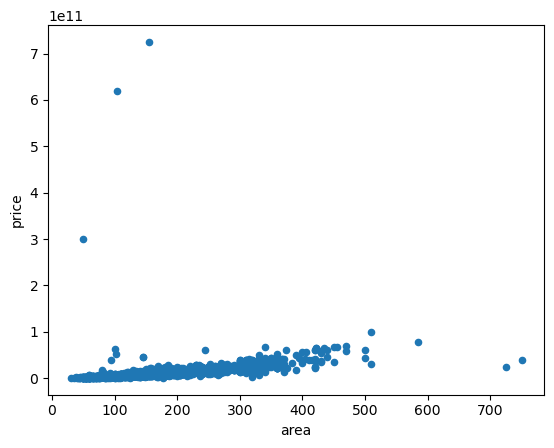

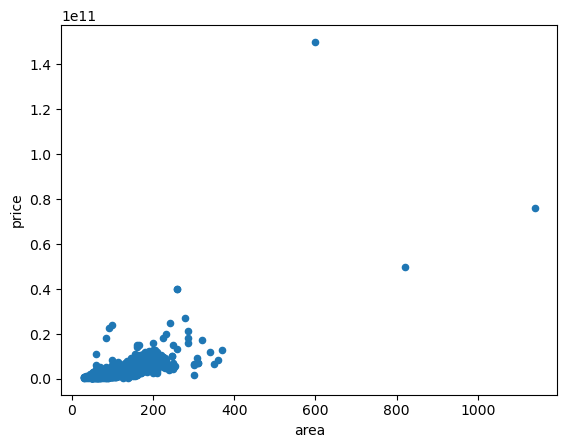

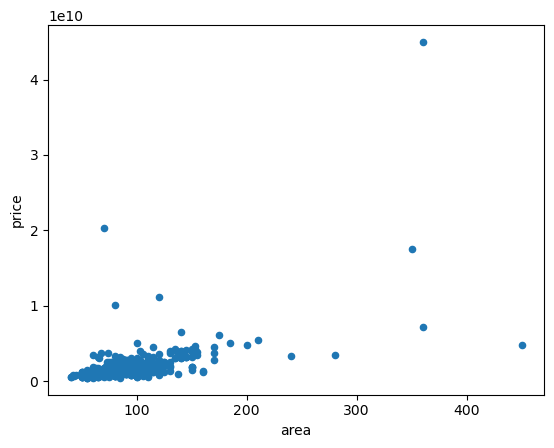

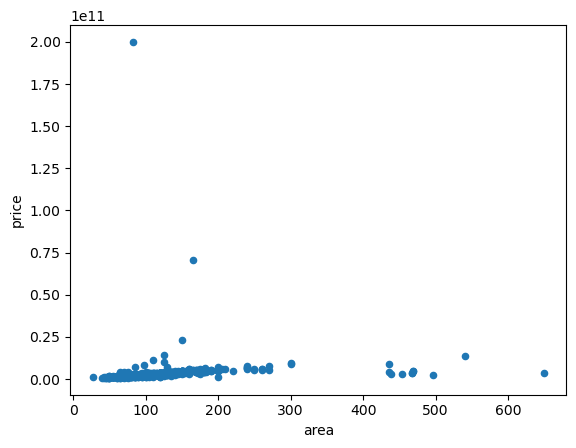

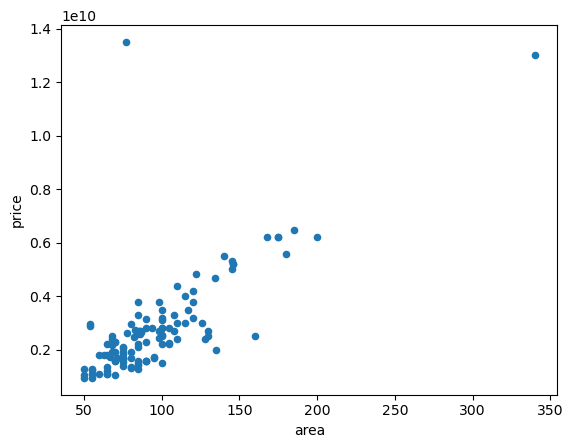

...

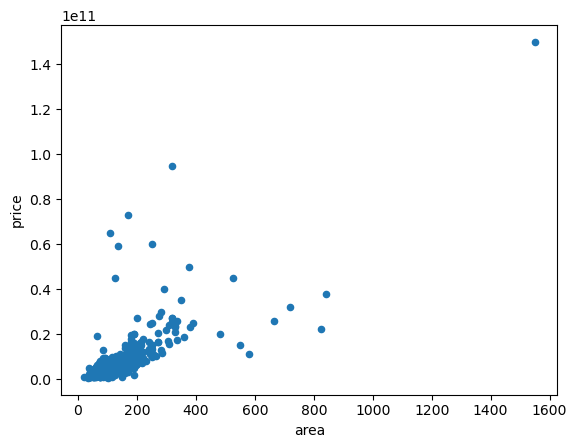

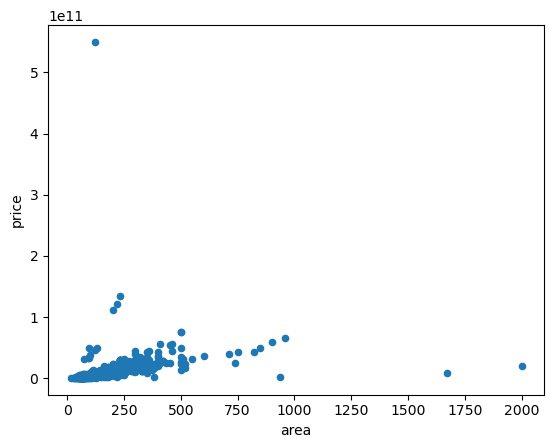

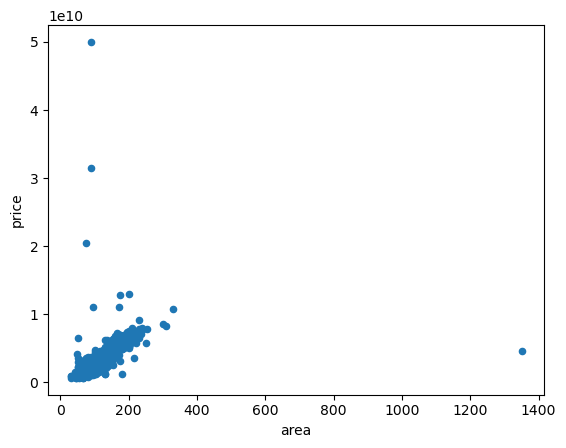

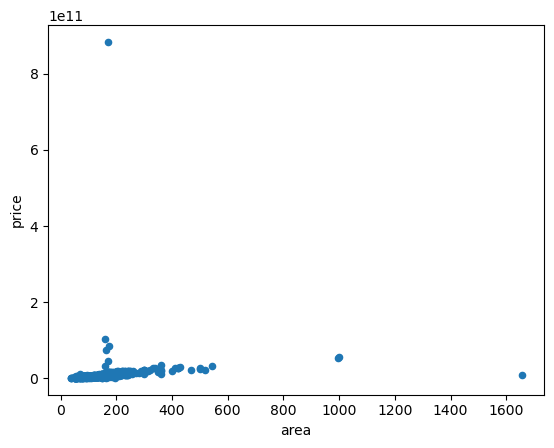

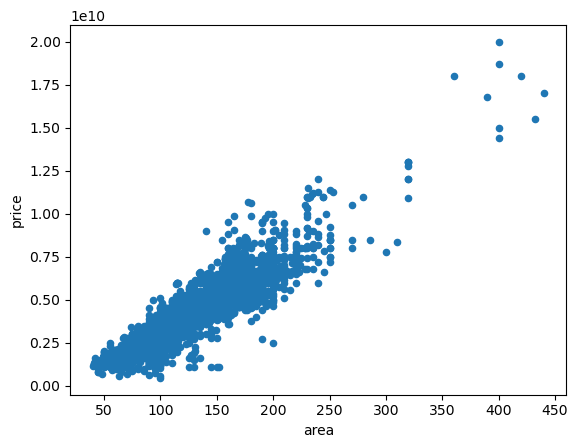

In [318]:
train_data[(train_data.type.str.contains("تمان"))].groupby(["region"])[["area", "price"]].plot.scatter(x = "area", y = "price")
plt.show()

## 1

In [319]:
region_1_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 1)]  

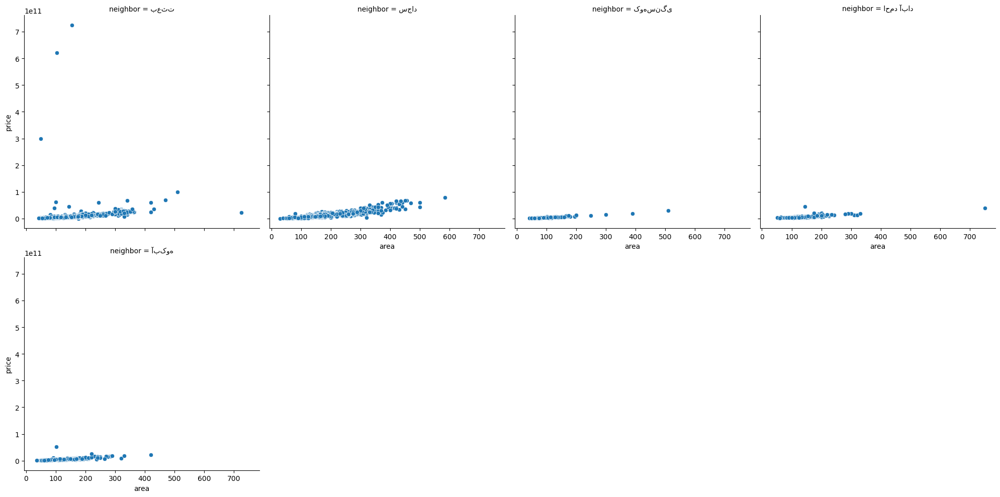

In [320]:
sns.relplot(x = "area", y = "price", data = region_1_aprt, col = "neighbor", col_wrap=4)

In [321]:
# region_1_aprt[(region_1_aprt.neighbor.str.contains(""))]

### ---

In [322]:
region_1_aprt[(region_1_aprt.price > 2e11) | (region_1_aprt.area >= 600) | ((region_1_aprt.price > .4e11) & (region_1_aprt.neighbor.str.contains("احمد آباد|آبکوه"))) ]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
3113,فروش آپارتمان,155.0,منطقه 1 محله بعثت خیابان رضا,مترنوساز فول\r\nسلام \n متر\nطبقه دوم \n...,36.291085,59.565186,0.0,2,3.0,7.250000e+11,1,بعثت,رضا,0
3302,فروش آپارتمان,725.0,منطقه 1 محله بعثت خیابان رضا,فروش یا معاوضه مجموعه مستقل واحدی / رضاشهر\r...,36.291085,59.565186,0.0,5,5.0,2.300000e+10,1,بعثت,رضا,0
10912,فروش آپارتمان,102.0,منطقه 1 محله آبکوه خیابان مطهری جنوبی,آپارتمان صفر دو خواب\r\nآپارتمان متری...,36.303707,59.593350,NaN,1,2.0,5.200000e+10,1,آبکوه,مطهری جنوبی,0
15079,فروش آپارتمان,145.0,منطقه 1 محله احمد آباد خیابان راهنمایی,آپارتمان متری سه خواب (گلچهره )\r\n.........,36.300470,59.567800,30.0,1,3.0,4.500000e+10,1,احمد آباد,راهنمایی,0
24277,فروش آپارتمان,750.0,منطقه 1 محله احمد آباد خیابان سناباد,خوشگل واحد صفر مجموعه\r\n❎❎❎با سلام\n❎❎❎ ...,36.301760,59.582740,1.0,5,5.0,4.000000e+10,1,احمد آباد,سناباد,0
25946,فروش آپارتمان,50.0,منطقه 1 محله بعثت خیابان کوهسنگی,اپارتمان پزشکی اداری داروخانه و مطب ازمایشگاه...,36.287180,59.574720,NaN,1,1.0,3.000000e+11,1,بعثت,کوهسنگی,0
40789,فروش آپارتمان,104.0,منطقه 1 محله بعثت خیابان کوهسنگی,NaN,36.287180,59.574720,7.0,1,2.0,6.200000e+11,1,بعثت,کوهسنگی,0


<Axes: xlabel='type', ylabel='price'>

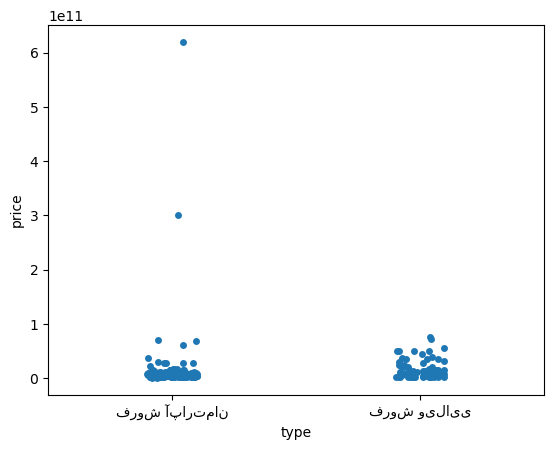

In [323]:
sns.stripplot(x = "type", y = "price", data = train_data[ (train_data.street == "کوهسنگی")])

In [324]:
region_1_aprt[(region_1_aprt.price > 2e11) | (region_1_aprt.area > 1750)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
3113,فروش آپارتمان,155.0,منطقه 1 محله بعثت خیابان رضا,مترنوساز فول\r\nسلام \n متر\nطبقه دوم \n...,36.291085,59.565186,0.0,2,3.0,7.250000e+11,1,بعثت,رضا,0
25946,فروش آپارتمان,50.0,منطقه 1 محله بعثت خیابان کوهسنگی,اپارتمان پزشکی اداری داروخانه و مطب ازمایشگاه...,36.287180,59.574720,NaN,1,1.0,3.000000e+11,1,بعثت,کوهسنگی,0
40789,فروش آپارتمان,104.0,منطقه 1 محله بعثت خیابان کوهسنگی,NaN,36.287180,59.574720,7.0,1,2.0,6.200000e+11,1,بعثت,کوهسنگی,0


In [325]:
# show_description(region_1_aprt[(region_1_aprt.price > 2e11) | (region_1_aprt.area > 700) ])

In [326]:
train_data.drop(region_1_aprt[(region_1_aprt.price > 2e11) | (region_1_aprt.area >= 600) | ((region_1_aprt.price > .4e11) & (region_1_aprt.neighbor.str.contains("احمد آباد|آبکوه"))) ].index, inplace=True)

### other

In [327]:
region_1_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 1)]  

In [328]:
region_1_aprt[(region_1_aprt.neighbor.str.contains("سجاد")) &  (region_1_aprt.price > 1.5e10) & (region_1_aprt.area< 100)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
37996,فروش آپارتمان,80.0,منطقه 1 محله سجاد خیابان ملک اباد,آپارتمان متری کیش تهاتر با مشهد\r\nبه نام ...,36.302869,59.559283,0.0,10,1.0,1.840000e+10,1,سجاد,ملک اباد,0


In [329]:
# show_description(region_1_aprt[(region_1_aprt.neighbor.str.contains("آبکوه")) &   (region_1_aprt.area > 400)].sort_values("price"))

<Axes: ylabel='Frequency'>

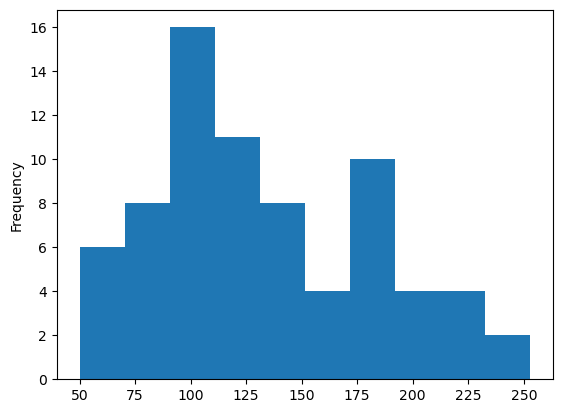

In [330]:
test_data[(test_data.neighborhood.str.contains("آبکوه"))].area.plot.hist()

In [331]:
region_1_aprt[(region_1_aprt.neighbor.str.contains("احمد")) &  (region_1_aprt.price > 1.5e10) & (region_1_aprt.area < 220)].sort_values("price").iloc[1:]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
14833,فروش آپارتمان,200.0,منطقه 1 محله احمد آباد خیابان کفایی,NaN,36.296106,59.585213,0.0,5,3.0,2.000000e+10,1,احمد آباد,کفایی,0
45695,فروش آپارتمان,175.0,منطقه 1 محله احمد آباد خیابان سناباد,متر حیاط,36.301760,59.582740,30.0,0,4.0,2.000000e+10,1,احمد آباد,سناباد,0


In [332]:
# region_1_aprt[(region_1_aprt.neighbor.str.contains("بعثت")) & ((region_1_aprt.price > .38e11) | (region_1_aprt.area > 400))].sort_values("price")

In [333]:
# region_1_aprt[(region_1_aprt.neighbor.str.contains("بعثت")) & (region_1_aprt.price < .03e11) & (region_1_aprt.area > 150)].sort_values("price")

In [334]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 1) & 
                (train_data.neighbor.str.contains("بعثت")) & (((train_data.price > .38e11) | (train_data.area > 400)) | ((train_data.price < .03e11) & (train_data.area > 150)))].index,
                inplace = True)

In [335]:
region_1_aprt[(region_1_aprt.neighbor.str.contains("کوهسنگی")) &  (region_1_aprt.area > 500)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
2468,فروش آپارتمان,510.0,منطقه 1 محله کوهسنگی خیابان بهشتی,مجموعه واحدی در خیابان بهشتی/جنوبی\r\nکارشن...,36.283478,59.57482,8.0,3,3.0,3.000000e+10,1,کوهسنگی,بهشتی,0


In [336]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 1) & 
                (train_data.neighbor.str.contains("کوهسنگی")) & ((train_data.area > 500))].index, inplace=True)

In [337]:
region_1_aprt[(region_1_aprt.neighbor.str.contains("سجاد")) &  (region_1_aprt.area > 500)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
33655,فروش آپارتمان,585.0,منطقه 1 محله سجاد خیابان سجاد,کلنگی،سجاد با طبقه بنای قابل نشیمن\r\nسلام\n...,36.318036,59.551475,27.0,3,5.0,7.800000e+10,1,سجاد,سجاد,0


In [338]:
region_1_aprt[(region_1_aprt.neighbor.str.contains("سجاد")) &  (region_1_aprt.area > 300) & (region_1_aprt.price < .03e11)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
42667,فروش آپارتمان,320.0,منطقه 1 محله سجاد خیابان سجاد,اپارتمان متری سوپر مدرن در سجاد\r\nبا سلا...,36.318036,59.551475,0.0,4,4.0,2.800000e+09,1,سجاد,سجاد,0


In [339]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 1) & 
                (train_data.neighbor.str.contains("سجاد")) & ((train_data.area > 500) | ( (train_data.area > 300) & (train_data.price < .03e11)))].index, inplace=True)

In [340]:
region_1_aprt[(region_1_aprt.neighbor.str.contains("آبکوه")) &  (region_1_aprt.price > 2.2e10) ].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
46002,فروش آپارتمان,220.0,منطقه 1 محله آبکوه خیابان مطهری جنوبی,واحد معاوضه با ملک\r\nجنوبی تک واحدی سرامی...,36.30735,59.59593,7.0,3,3.0,2.500000e+10,1,آبکوه,مطهری جنوبی,0


In [341]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 1) & 
                (train_data.neighbor.str.contains("آبکوه")) & (train_data.price > 2.2e10)].index, inplace=True)

In [342]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 1) & 
                (train_data.neighbor.str.contains("احمد")) &  (train_data.price > 1.5e10) & (train_data.area < 220)].iloc[1:].index, inplace=True)

In [343]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 1) & 
                (train_data.neighbor.str.contains("سجاد")) &  (train_data.price > 1.5e10) & (train_data.area< 100)].index, inplace=True)

## 2

In [344]:
region_2_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 2)]  

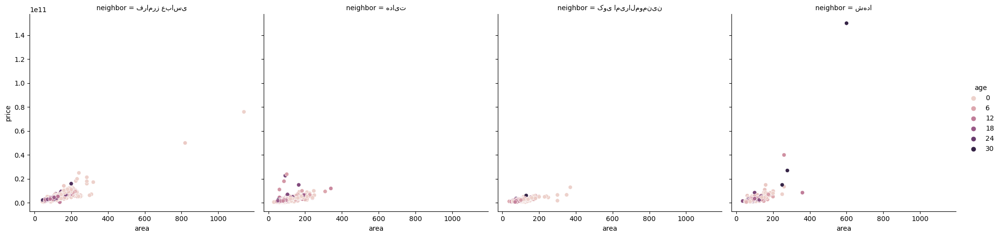

In [345]:
sns.relplot(x = "area", y = "price", data = region_2_aprt, col = "neighbor", col_wrap=4, hue = "age")

### ---

In [346]:
region_2_aprt[(region_2_aprt.price > .33e11) | (region_2_aprt.area > 400) ]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
2412,فروش آپارتمان,820.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,آپارتمان متری در طبقه کامل\r\nآپارتمان ...,36.327670,59.548380,1.0,3,3.0,5.000000e+10,2,فرامرز عباسی,فرامرز عباسی,0
5434,فروش آپارتمان,260.0,منطقه 2 محله شهدا خیابان کامیاب,هتل اپارتمان نزدیک به حرم\r\n: : .فروش هتل اپ...,36.306610,59.619040,9.0,5,5.0,4.000000e+10,2,شهدا,کامیاب,1
9669,فروش آپارتمان,600.0,منطقه 2 محله شهدا خیابان شیرازی,مهمانپذیر متراژ سند ملک تا واحد اتاق\...,36.290985,59.614327,30.0,5,5.0,1.500000e+11,2,شهدا,شیرازی,0
28276,فروش آپارتمان,260.0,منطقه 2 محله شهدا خیابان کامیاب,هتل اپارتمان نزدیک به حرم\r\n: : .فروش هتل اپ...,36.306610,59.619040,9.0,5,5.0,4.000000e+10,2,شهدا,کامیاب,1
45055,فروش آپارتمان,1140.0,منطقه 2 محله فرامرز عباسی خیابان جانباز,فروش متر آپارتمان صفر فول اول جانباز\r\n...,36.335880,59.557710,0.0,5,3.0,7.600000e+10,2,فرامرز عباسی,جانباز,0


In [347]:
# show_description(region_2_aprt[(region_2_aprt.price > .33e11) | (region_2_aprt.area > 600) ])

In [348]:
train_data.drop(region_2_aprt[((region_2_aprt.price > 2.5e10) & (region_2_aprt.neighbor.str.contains("شهدا"))) | ((region_2_aprt.price > 1e10) & (region_2_aprt.area < 200) & (region_2_aprt.neighbor.str.contains("هدایت"))) 
| ((region_2_aprt.price > .33e11) | (region_2_aprt.area > 400))].index, inplace=True)

+ hotel

### other

In [349]:
region_2_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 2)]  

In [350]:
# train_data[(train_data.description.notna()) & (train_data.description.str.contains("دونبش|نبش"))]

In [351]:
region_2_aprt[(region_2_aprt.neighbor.str.contains("فرا")) & ((region_2_aprt.area >= 300) | (region_2_aprt.price > 2.4e10))].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
47714,فروش آپارتمان,300.0,منطقه 2 محله فرامرز عباسی خیابان جانباز,خواب،گرمایش ازکف،سردونبش،هاشیه جانباز \r\nبا...,36.33588,59.55771,0.0,6,4.0,6.300000e+09,2,فرامرز عباسی,جانباز,0
39216,فروش آپارتمان,310.0,منطقه 2 محله فرامرز عباسی خیابان جانباز,متر خواب ویو جانباز آفتابگیر پارکینگ اخ...,36.33588,59.55771,0.0,7,4.0,7.130000e+09,2,فرامرز عباسی,جانباز,0
34423,فروش آپارتمان,310.0,منطقه 2 محله فرامرز عباسی خیابان جانباز,آپارتمان متری/تک واحدی/ خواب/حاشیه ملک \r...,36.33588,59.55771,0.0,7,4.0,7.280000e+09,2,فرامرز عباسی,جانباز,0
5160,فروش آپارتمان,320.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,آپارتمان متری خواب مستر ابتدای فرامرزعب...,36.32767,59.54838,0.0,4,4.0,1.728000e+10,2,فرامرز عباسی,فرامرز عباسی,0
15319,فروش آپارتمان,242.0,منطقه 2 محله فرامرز عباسی خیابان بلوار فردوسی,v/یک-باب-منزل-کلنگی-در-خیابان-ثمانه-بلوار-فرد...,36.32485,59.56050,0.0,0,2.0,2.500000e+10,2,فرامرز عباسی,بلوار فردوسی,0


In [352]:
# region_2_aprt[(region_2_aprt.neighbor.str.contains("فرا")) & (region_2_aprt.area > 200) & (region_2_aprt.area < 250)].sort_values("price")

In [353]:
region_2_aprt[(region_2_aprt.neighbor.str.contains("کوی")) & (region_2_aprt.area > 250)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
8676,فروش آپارتمان,300.0,منطقه 2 محله کوی امیرالمومنین خیابان توس,v/خانه- -متری- \r\n میدان معراج انت...,36.385721,59.525791,0.0,0,1.0,1.800000e+09,2,کوی امیرالمومنین,توس,0
21043,فروش آپارتمان,300.0,منطقه 2 محله کوی امیرالمومنین خیابان فدک,سوبلکس متر فول امکانات\r\nآپارتمان\nسوبلکس...,36.342050,59.574530,0.0,6,4.0,6.600000e+09,2,کوی امیرالمومنین,فدک,0
15144,فروش آپارتمان,350.0,منطقه 2 محله کوی امیرالمومنین خیابان کوی امیر...,پنت هوس دوبلکس\r\nاملاک اول \nکدملک ( )\n\...,36.341250,59.571770,0.0,8,5.0,6.666667e+09,2,کوی امیرالمومنین,کوی امیرالمومنین,0
30002,فروش آپارتمان,370.0,منطقه 2 محله کوی امیرالمومنین خیابان کوی امیر...,تا اشپزخانه دارد,36.341250,59.571770,0.0,6,4.0,1.300000e+10,2,کوی امیرالمومنین,کوی امیرالمومنین,0


In [354]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 2) & 
                (train_data.neighbor.str.contains("شهدا")) & ((train_data.price > 1.2e10) | (train_data.area > 350))].index, inplace=True)

In [355]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 2) & 
                (train_data.neighbor.str.contains("کوی")) & (train_data.area > 250)].index, inplace=True)

In [356]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 2) & 
                (train_data.neighbor.str.contains("فرا")) & ((train_data.area >= 300) | (train_data.price > 2.4e10))].index, inplace=True)

## 3

In [357]:
region_3_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 3)]  

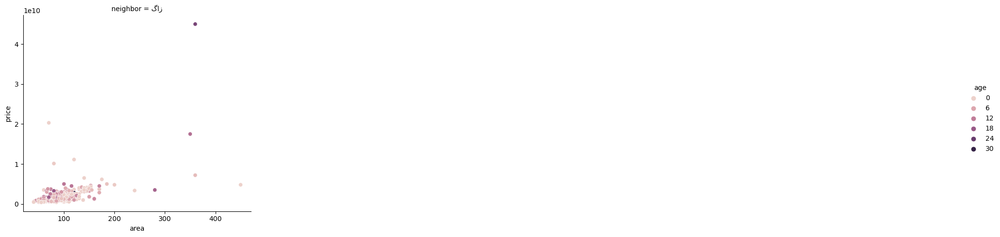

In [358]:
sns.relplot(x = "area", y = "price", data = region_3_aprt, col = "neighbor", col_wrap=4, hue = "age")

### --

In [359]:
region_3_aprt[(region_3_aprt.price > .8e10) | (region_3_aprt.area > 300) ].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
30416,فروش آپارتمان,450.0,منطقه 3 محله گاز خیابان رسالت,آپارتمان در رسالت میلان متری در پنج طبق...,36.303140,59.633800,0.0,5,5.0,4.800000e+09,3,گاز,رسالت,0
29829,فروش آپارتمان,360.0,منطقه 3 محله گاز خیابان رسالت,پنت هوس متری خوابه در نزدیکی حرم مطهر\r...,36.309300,59.642044,3.0,7,4.0,7.200000e+09,3,گاز,رسالت,0
22998,فروش آپارتمان,80.0,منطقه 3 محله گاز خیابان طبرسی شمالی,متر\r\nدارای گاز صفحه‌ای هود آب گرمکن پمپ ...,36.323210,59.627390,1.0,2,2.0,1.012000e+10,3,گاز,طبرسی شمالی,0
37019,فروش آپارتمان,120.0,منطقه 3 محله گاز خیابان فاطمیه,آپارتمان متری دوبلکس\r\nتا حرم دقیقه، آ...,36.302444,59.635670,0.0,5,2.0,1.111111e+10,3,گاز,فاطمیه,0
37366,فروش آپارتمان,350.0,منطقه 3 محله گاز خیابان طبرسی جنوبی,آپارتمان تمام اسکلت\r\nآپارتمان تمام اسکلت در...,36.301040,59.636330,14.0,2,2.0,1.750000e+10,3,گاز,طبرسی جنوبی,0
6249,فروش آپارتمان,70.0,منطقه 3 محله گاز خیابان فاطمیه,آپارتمان متری نوساز\r\nکف کامل سرامیک. کاب...,36.314380,59.626030,0.0,1,2.0,2.030000e+10,3,گاز,فاطمیه,0
29851,فروش آپارتمان,360.0,منطقه 3 محله گاز خیابان طبرسی جنوبی,فروش هتل آپارتمان در طبرسی\r\nاز اولین بازدید...,36.301040,59.636330,22.0,4,5.0,4.500000e+10,3,گاز,طبرسی جنوبی,1


In [360]:
train_data.drop(region_3_aprt[(region_3_aprt.price > .8e10) | (region_3_aprt.area > 300) ].index, inplace=True)

### other

In [361]:
region_3_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 3)]  

## 4

In [362]:
region_4_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 4)]  

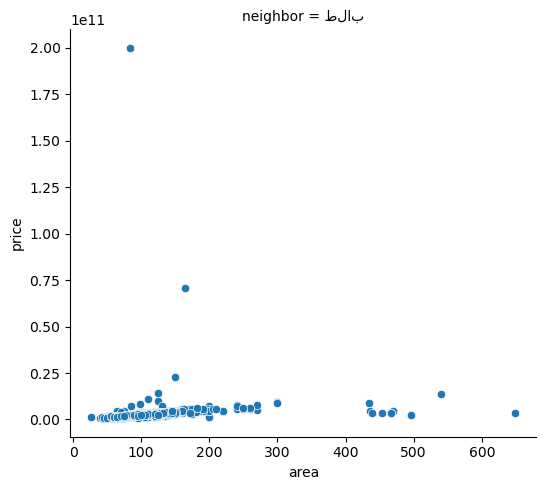

In [363]:
sns.relplot(x = "area", y = "price", data = region_4_aprt, col = "neighbor", col_wrap=4)

### ---

In [364]:
region_4_aprt[ ((region_4_aprt.area < 150) & (region_4_aprt.price > .55e10)) | ((region_4_aprt.area > 400) & (region_4_aprt.price < .5e10))].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
35186,فروش آپارتمان,496.0,منطقه 4 و 5 محله طلاب خیابان مفتح,متری سند دار/نزدیک حاشیه اصلی بولوار\r\n꧁کا...,36.296030,59.643700,5.0,2,2.0,2.200000e+09,4,طلاب,مفتح,0
4647,فروش آپارتمان,454.0,منطقه 4 و 5 محله طلاب خیابان مفتح,متر/ اسماعیل پور\r\n◑کارگزاری املاک آزادی◑...,36.296030,59.643700,1.0,3,2.0,3.240000e+09,4,طلاب,مفتح,0
26978,فروش آپارتمان,439.0,منطقه 4 و 5 محله طلاب خیابان مفتح,متری(امیری)بافت جدید اسماعیل پور\r\n꧁کارگز...,36.296030,59.643700,0.0,3,2.0,3.250000e+09,4,طلاب,مفتح,0
42679,فروش آپارتمان,649.0,منطقه 4 و 5 محله طلاب خیابان مفتح,متری/تک واحدی خشنودی/سند تک برگ\r\n◾◼️⬛کار...,36.296030,59.643700,2.0,3,2.0,3.531000e+09,4,طلاب,مفتح,0
18079,فروش آپارتمان,467.0,منطقه 4 و 5 محله طلاب خیابان مفتح,متری/برند مطرح منطقه اسماعیل پور/وام مسکن\...,36.296030,59.643700,1.0,5,3.0,3.547500e+09,4,طلاب,مفتح,0
10868,فروش آپارتمان,467.0,منطقه 4 و 5 محله طلاب خیابان مفتح,متری/سوپرسازه برند منطقه/اسماعیل پور\r\n◾◼...,36.296030,59.643700,0.0,3,2.0,3.680000e+09,4,طلاب,مفتح,0
12855,فروش آپارتمان,436.0,منطقه 4 و 5 محله طلاب خیابان مفتح,متری/حاشیه اصلی بولوار/آزادی\r\n꧁کارگزاری ...,36.296030,59.643700,0.0,4,3.0,4.350000e+09,4,طلاب,مفتح,0
6658,فروش آپارتمان,469.0,منطقه 4 و 5 محله طلاب خیابان مفتح,متری/حاشیه اصلی بولوار/میرزاکوچک خان\r\n꧁ک...,36.296030,59.643700,0.0,3,3.0,4.500000e+09,4,طلاب,مفتح,0
8307,فروش آپارتمان,469.0,منطقه 4 و 5 محله طلاب خیابان مفتح,آپارتمان متر شاهکار معماری منطقه/آزادی\r\n꧁...,36.296030,59.643700,0.0,3,2.0,4.560000e+09,4,طلاب,مفتح,0
21356,فروش آپارتمان,85.0,منطقه 4 و 5 محله طلاب خیابان علیمردانی,آپارتمان متر دو‌خوابه\r\nآپارتمان داری مترا...,36.286898,59.645816,8.0,4,2.0,7.000000e+09,4,طلاب,علیمردانی,0


In [365]:
train_data.drop(region_4_aprt[ ((region_4_aprt.area < 150) & (region_4_aprt.price > .55e10)) | ((region_4_aprt.area > 400) & (region_4_aprt.price < .5e10)) | (region_4_aprt.price > 2e10)].index, inplace=True)

### other

In [366]:
region_4_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 4)]  

In [367]:
region_4_aprt[(region_4_aprt.area < 100) & (region_4_aprt.price > 3.7e9)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
15505,فروش آپارتمان,65.0,منطقه 4 و 5 محله طلاب خیابان وحید,آپارتمان متری خواب\r\nباسلام. آپارتمان ...,36.30289,59.65058,22.0,4,1.0,4.300000e+09,4,طلاب,وحید,0
26756,فروش آپارتمان,75.0,منطقه 4 و 5 محله طلاب خیابان مفتح,آپارتمان طبقه\r\n✅ آپارتمان شیک و تمیز \n...,36.29603,59.64370,12.0,3,3.0,4.300000e+09,4,طلاب,مفتح,0
29988,فروش آپارتمان,70.0,منطقه 4 و 5 محله طلاب خیابان مفتح,اپارتمان متر یه خواب\r\nسلام‌ سه طبقه رو پ...,36.29603,59.64370,0.0,3,1.0,3.900000e+09,4,طلاب,مفتح,0


In [368]:
region_4_aprt[((region_4_aprt.area > 190) & (region_4_aprt.price < .2e10)) | ((region_4_aprt.area > 400))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
10489,فروش آپارتمان,435.0,منطقه 4 و 5 محله طلاب خیابان مفتح,زمین با متر بنا در طبقه\r\nطبقه همکف ...,36.301451,59.660397,3.0,1,5.0,8.800000e+09,4,طلاب,مفتح,0
29315,فروش آپارتمان,200.0,منطقه 4 و 5 محله طلاب خیابان مفتح,آپارتمان متری فول /سنددار/\r\nبه نام خدا\...,36.296030,59.643700,0.0,5,3.0,1.111111e+09,4,طلاب,مفتح,0
38288,فروش آپارتمان,540.0,منطقه 4 و 5 محله طلاب خیابان مفتح,فروش یا معاوضه واحد اپارتمان صفر\r\n⚜️به نا...,36.296030,59.643700,0.0,4,3.0,1.350000e+10,4,طلاب,مفتح,0


In [369]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 4) & 
                ((train_data.area > 190) & (train_data.price < .2e10)) | ((train_data.area > 400))].index, inplace=True)

In [370]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 4) & 
                (train_data.area < 100) & (train_data.price > 3.7e9)].index, inplace=True)

## 6

In [371]:
region_6_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 6)]  

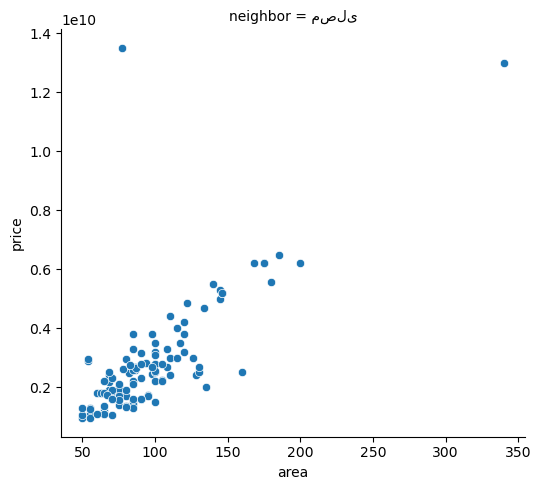

In [372]:
sns.relplot(x = "area", y = "price", data = region_6_aprt, col = "neighbor", col_wrap=4)

In [373]:
region_6_aprt[(region_6_aprt.price > .77e10) ]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
2461,فروش آپارتمان,340.0,منطقه 6 محله مصلی خیابان مصلی,ساختمان واحدی نوساز واقع در مصلی \r\nبا سل...,36.278910,59.62851,1.0,4,5.0,1.300000e+10,6,مصلی,مصلی,0
24533,فروش آپارتمان,77.0,منطقه 6 محله مصلی خیابان محمد آباد,تجاری مسکونی\r\nمناسب برای سرمایه گذاری\n م...,36.263996,59.63482,30.0,1,2.0,1.350000e+10,6,مصلی,محمد آباد,0


In [374]:
train_data.drop(region_6_aprt[(region_6_aprt.price > .77e10) ].index, inplace=True)

## 7

In [375]:
region_7_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 7)]  

In [376]:
region_7_aprt[(region_7_aprt.price > 1e11)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
5619,فروش آپارتمان,65.0,منطقه 7 محله سیدی خیابان کوشش,آپارتمان متری یک خواب شیک نوساز\r\nبا سلام...,36.265280,59.609260,0.0,0,1.0,1.111111e+11,7,سیدی,کوشش,0
13739,فروش آپارتمان,107.0,منطقه 7 محله 17 شهریور خیابان هفده شهریور,آپارتمان دوخوابه قطار شهری مشهد\r\nبا سلام خد...,36.276045,59.617282,3.0,4,2.0,3.350000e+11,7,17 شهریور,هفده شهریور,0


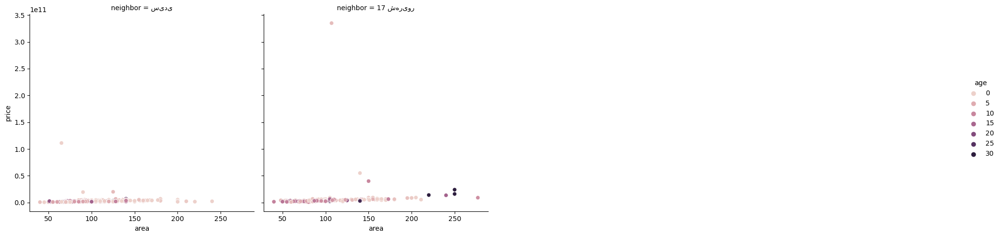

In [377]:
sns.relplot(x = "area", y = "price", data = region_7_aprt, col = "neighbor", col_wrap=4, hue = "age")

### ---

In [378]:
# sns.boxplot(x = "type", y = "price", data = train_data[ (train_data.neighbor == "17 شهریور")])

In [379]:
# show_description(region_7_aprt[(region_7_aprt.price > 1.4e10) & (region_7_aprt.area < 200 )])

In [380]:
# region_7_aprt[(region_7_aprt.area > 300)]

<Axes: xlabel='type', ylabel='price'>

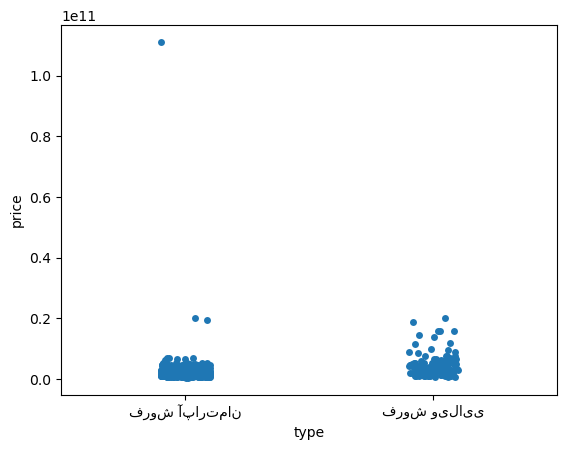

In [381]:
sns.stripplot(x = "type", y = "price", data = train_data[ (train_data.street == "کوشش")])

In [382]:
train_data.drop(region_7_aprt[((region_7_aprt.price > 1e11) | (region_7_aprt.area > 300))  | ((region_7_aprt.price > 1.4e10) & (region_7_aprt.area < 200))].index, inplace=True)

In [383]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 7)] .price.nlargest(1).index, inplace=True)

### other

In [384]:
region_7_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 7)] 

In [385]:
(region_7_aprt[(region_7_aprt.area > 217)])

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
4493,فروش آپارتمان,240.0,منطقه 7 محله سیدی خیابان کوشش,آپارتمان خوش نقشه شیک وبزرگ\r\nسلام معاوضه یا...,36.265280,59.609260,0.0,5,3.0,2.300000e+09,7,سیدی,کوشش,0
9801,فروش آپارتمان,220.0,منطقه 7 محله 17 شهریور خیابان هفده شهریور,متر زمین متر زیر بنا\r\nملک تجاری ومس...,36.264084,59.619410,30.0,1,1.0,1.400000e+10,7,17 شهریور,هفده شهریور,0
11187,فروش آپارتمان,220.0,منطقه 7 محله سیدی خیابان کوشش,آپارتمان سه خواب سندار وکالتی\r\nسلام \nآدرس ...,36.265280,59.609260,0.0,4,3.0,1.600000e+09,7,سیدی,کوشش,0
33555,فروش آپارتمان,277.0,منطقه 7 محله 17 شهریور خیابان پروین اعتصامی,سند شش دنگ تک برگ برای هر طبقه +پایان‌کار تفک...,36.260050,59.611900,9.0,3,5.0,9.000000e+09,7,17 شهریور,پروین اعتصامی,0
37676,فروش آپارتمان,240.0,منطقه 7 محله 17 شهریور خیابان هفده شهریور,(اپارتمان طبقه واحدی ملکی خ یاران)\r\n((باسل...,36.276045,59.617282,16.0,4,5.0,1.350000e+10,7,17 شهریور,هفده شهریور,0
40421,فروش آپارتمان,250.0,منطقه 7 محله 17 شهریور خیابان پروین اعتصامی,ویلایی سه طبقه کلنگی پروین اعتصامی\r\nبا سلام...,36.260050,59.611900,30.0,3,3.0,1.600000e+10,7,17 شهریور,پروین اعتصامی,0


In [386]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 7) & 
(train_data.area > 230)].index, inplace = True)

In [387]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 7) & 
(train_data.area > 217)].index, inplace = True)

## 8

In [388]:
region_8_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 8)]  

In [389]:
region_8_aprt[(region_8_aprt.price > 0.4e11) & (region_8_aprt.area < 500)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
5534,فروش آپارتمان,375.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,مجموعه واحدی خ امام رضا طلوع یزدی\r\nکارگزار...,36.272780,59.602730,5.0,5,5.0,5.000000e+10,8,چهارراه لشکر,امام رضا,0
12547,فروش آپارتمان,251.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,سوییت اپارتمان و مغازه تجاری دائم(حرم مطهر)\r...,36.272780,59.602730,4.0,1,5.0,6.000000e+10,8,چهارراه لشکر,امام رضا,1
22322,فروش آپارتمان,320.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,مهمان پذیر امام رضای یک\r\nبا عرض سلام و اراد...,36.272780,59.602730,22.0,3,5.0,9.500000e+10,8,چهارراه لشکر,امام رضا,1
29565,فروش آپارتمان,170.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,فروش سوئیت اپارتمان متری\r\nبا سلام و احت...,36.272780,59.602730,4.0,1,5.0,7.300000e+10,8,چهارراه لشکر,امام رضا,1
32820,فروش آپارتمان,110.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,مجموعه هتلی/امام رضا/حرم مطهر\r\nبه نام خدا\n...,36.272780,59.602730,3.0,5,2.0,6.500000e+10,8,چهارراه لشکر,امام رضا,1
34789,فروش آپارتمان,126.0,منطقه 8 محله چهارراه لشکر خیابان آخوند خراسانی,مهمانپذیر خوابه کوچه سرشور\r\nساختمان مهما...,36.286574,59.603002,13.0,6,5.0,4.500000e+10,8,چهارراه لشکر,آخوند خراسانی,0
43100,فروش آپارتمان,135.0,منطقه 8 محله چهارراه لشکر خیابان بلوار امام خ...,آپارتمان متری صفرامام خمینی/تک‌واحدی\r\n⚜...,36.288100,59.600600,1.0,2,3.0,5.940000e+10,8,چهارراه لشکر,بلوار امام خمینی,0


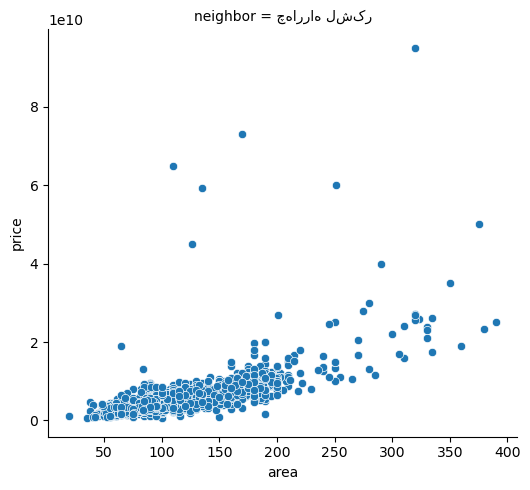

In [390]:
sns.relplot(x = "area", y = "price", data = region_8_aprt, col = "neighbor", col_wrap=4)

### ---

In [391]:
region_8_aprt[((region_8_aprt.price > 0.4e11) & (region_8_aprt.area < 500)) | (region_8_aprt.area >= 750)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
34789,فروش آپارتمان,126.0,منطقه 8 محله چهارراه لشکر خیابان آخوند خراسانی,مهمانپذیر خوابه کوچه سرشور\r\nساختمان مهما...,36.286574,59.603002,13.0,6,5.0,4.500000e+10,8,چهارراه لشکر,آخوند خراسانی,0
5534,فروش آپارتمان,375.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,مجموعه واحدی خ امام رضا طلوع یزدی\r\nکارگزار...,36.272780,59.602730,5.0,5,5.0,5.000000e+10,8,چهارراه لشکر,امام رضا,0
43100,فروش آپارتمان,135.0,منطقه 8 محله چهارراه لشکر خیابان بلوار امام خ...,آپارتمان متری صفرامام خمینی/تک‌واحدی\r\n⚜...,36.288100,59.600600,1.0,2,3.0,5.940000e+10,8,چهارراه لشکر,بلوار امام خمینی,0
12547,فروش آپارتمان,251.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,سوییت اپارتمان و مغازه تجاری دائم(حرم مطهر)\r...,36.272780,59.602730,4.0,1,5.0,6.000000e+10,8,چهارراه لشکر,امام رضا,1
32820,فروش آپارتمان,110.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,مجموعه هتلی/امام رضا/حرم مطهر\r\nبه نام خدا\n...,36.272780,59.602730,3.0,5,2.0,6.500000e+10,8,چهارراه لشکر,امام رضا,1
29565,فروش آپارتمان,170.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,فروش سوئیت اپارتمان متری\r\nبا سلام و احت...,36.272780,59.602730,4.0,1,5.0,7.300000e+10,8,چهارراه لشکر,امام رضا,1
22322,فروش آپارتمان,320.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,مهمان پذیر امام رضای یک\r\nبا عرض سلام و اراد...,36.272780,59.602730,22.0,3,5.0,9.500000e+10,8,چهارراه لشکر,امام رضا,1


<Axes: xlabel='type', ylabel='price'>

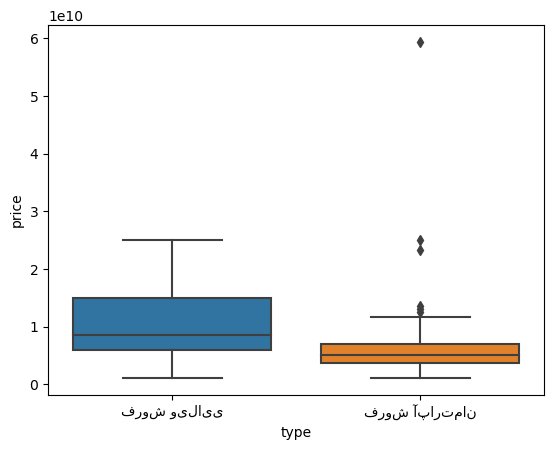

In [392]:
sns.boxplot(x = "type", y = "price", data = train_data[ (train_data.street == "بلوار امام خمینی")])

In [393]:
# show_description(region_8_aprt[(region_8_aprt.price > 0.4e11) & (region_8_aprt.area < 500)])

In [394]:
region_8_aprt[(region_8_aprt.area > 1500)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


<Axes: xlabel='type', ylabel='area'>

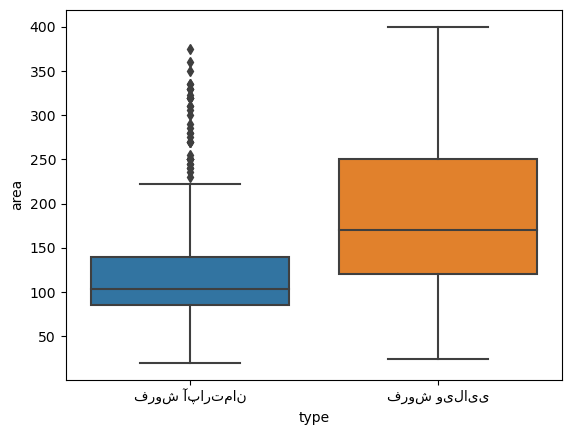

In [395]:
sns.boxplot(x = "type", y = "area", data = train_data[ (train_data.street == "امام رضا")])

In [396]:
# show_description(region_8_aprt[(region_8_aprt.area > 1500)])

In [397]:
region_8_aprt[(region_8_aprt.area >= 750) & (region_8_aprt.area <= 1500)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [398]:
train_data.drop(region_8_aprt[((region_8_aprt.price > 0.4e11) & (region_8_aprt.area < 500)) | (region_8_aprt.area >= 750)].index, inplace=True)

### other

In [399]:
region_8_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 8)]  

In [400]:
# region_8_aprt[(region_8_aprt.price > 1.6e10)].sort_values("price").iloc[1:]

In [401]:
region_8_aprt[(region_8_aprt.price > 2e10)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
26136,فروش آپارتمان,270.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,متر سراسر نور بلوار سجاد\r\n<<جامع ترین س...,36.272780,59.60273,0.0,5,3.0,2.060000e+10,8,چهارراه لشکر,امام رضا,0
35672,فروش آپارتمان,330.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,آپارتمان متری/صفر/در عدالت\r\nتک واحدی با ف...,36.272780,59.60273,0.0,2,3.0,2.100000e+10,8,چهارراه لشکر,امام رضا,0
31337,فروش آپارتمان,300.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,پنت هاوس متر مشاعات هتلینگ ابرسازه بیهمتا و...,36.272780,59.60273,0.0,6,4.0,2.200000e+10,8,چهارراه لشکر,امام رضا,0
42791,فروش آپارتمان,330.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,* سجاد آپارتمان متری طبقات بالا بدون مشرف...,36.272780,59.60273,0.0,5,4.0,2.300000e+10,8,چهارراه لشکر,امام رضا,0
2915,فروش آپارتمان,380.0,منطقه 8 محله چهارراه لشکر خیابان بلوار امام خ...,یک واحد متری و یک واحد متری با هم واگ...,36.288100,59.60060,0.0,6,NaN,2.322000e+10,8,چهارراه لشکر,بلوار امام خمینی,0
24630,فروش آپارتمان,330.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,فروش سوئیت آپارتمان/سرشور/سند ملکی/\r\nکارشنا...,36.272780,59.60273,5.0,2,5.0,2.380000e+10,8,چهارراه لشکر,امام رضا,1
11885,فروش آپارتمان,310.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,متر سال یاسمن سجاد( متر تراس)\r\n م...,36.272780,59.60273,2.0,5,4.0,2.400000e+10,8,چهارراه لشکر,امام رضا,0
28598,فروش آپارتمان,245.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,ملک‌ اباد متر* تهاتر\r\n﷽\n\nمشاورین املاک ...,36.272780,59.60273,0.0,5,3.0,2.450000e+10,8,چهارراه لشکر,امام رضا,0
43696,فروش آپارتمان,390.0,منطقه 8 محله چهارراه لشکر خیابان بلوار امام خ...,واحد آپارتمان\r\nقابل توجه هیئت های مذهبی ...,36.285164,59.60178,12.0,4,5.0,2.500000e+10,8,چهارراه لشکر,بلوار امام خمینی,0
22103,فروش آپارتمان,250.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,آپارتمان طبقه واحدی\r\nعرصه متر\nدرسه ط...,36.272780,59.60273,17.0,3,5.0,2.500000e+10,8,چهارراه لشکر,امام رضا,0


In [402]:
region_8_aprt[(region_8_aprt.price > 1.5e10) & (region_8_aprt.description.notna()) & (region_8_aprt.description.str.contains("امام رضا") == False)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
21010,فروش آپارتمان,310.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,سجاد* متر* ارزنده* فروشنده واقعی\r\nبا سلا...,36.272780,59.60273,14.0,1,4.0,1.581000e+10,8,چهارراه لشکر,امام رضا,0
34970,فروش آپارتمان,190.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,متر آپارتمان » تراس بزرگ » صفر » شیک » احم...,36.272780,59.60273,0.0,4,3.0,1.590000e+10,8,چهارراه لشکر,امام رضا,0
36450,فروش آپارتمان,210.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,ملک آباد/ متر/ کلاسیک\r\nهـَـترا \n\nHATRA ...,36.272780,59.60273,4.0,3,3.0,1.600000e+10,8,چهارراه لشکر,امام رضا,0
17135,فروش آپارتمان,215.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,هفت تیر متر تک واحدی طبقه \r\nدپارتمان ام...,36.272780,59.60273,0.0,4,3.0,1.659000e+10,8,چهارراه لشکر,امام رضا,0
12304,فروش آپارتمان,180.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,متر فول امکانات\r\nسلام\n________________...,36.272780,59.60273,0.0,3,3.0,1.662500e+10,8,چهارراه لشکر,امام رضا,0
14377,فروش آپارتمان,270.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,یک واحد متری و یک واحد متری با هم واگذ...,36.272780,59.60273,0.0,6,3.0,1.665000e+10,8,چهارراه لشکر,امام رضا,0
16129,فروش آپارتمان,270.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,یک واحد متری و یک واحد متری با هم واگذ...,36.272780,59.60273,0.0,6,3.0,1.665000e+10,8,چهارراه لشکر,امام رضا,0
39367,فروش آپارتمان,306.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,متر آپارتمان فول امکانات/مجموعه آبی/سجادنی...,36.272780,59.60273,12.0,1,4.0,1.700000e+10,8,چهارراه لشکر,امام رضا,0
34850,فروش آپارتمان,180.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,آپارتمان متر،صفر،مرجان\r\nساختمانی پاژ طبقه...,36.272780,59.60273,0.0,2,3.0,1.800000e+10,8,چهارراه لشکر,امام رضا,0
10692,فروش آپارتمان,65.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,مترسندملکی\r\nسلام\n مترسندملکی\nپارکینگ‌‌...,36.272780,59.60273,7.0,2,2.0,1.900000e+10,8,چهارراه لشکر,امام رضا,0


In [403]:
region_8_aprt[(region_8_aprt.price > 1e10) & (region_8_aprt.area < 100)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
10692,فروش آپارتمان,65.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,مترسندملکی\r\nسلام\n مترسندملکی\nپارکینگ‌‌...,36.27278,59.60273,7.0,2,2.0,1.900000e+10,8,چهارراه لشکر,امام رضا,0
16696,فروش آپارتمان,84.0,منطقه 8 محله چهارراه لشکر خیابان بلوار امام خ...,دو واحد آپارتمان +همکف مغازه\r\nهمکف مغازه به...,36.28810,59.60060,30.0,2,3.0,1.302000e+10,8,چهارراه لشکر,بلوار امام خمینی,0


In [404]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 8) & 
                   (train_data.price > 1e10) & (train_data.area < 100)].index, inplace = True)

In [405]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 8) & 
                   (train_data.price > 1.5e10) & (train_data.description.notna()) & (train_data.description.str.contains("امام رضا") == False)].index, inplace = True)

In [406]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 8) & 
                   (train_data.price > 1.6e10)].iloc[1:].index, inplace = True)

In [407]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 8) & 
                   (train_data.price > 2e10)].index, inplace = True)

## 9

In [408]:
region_9_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 9)]  

In [409]:
region_9_aprt[(region_9_aprt.price > .9e11) & (region_9_aprt.area < 500)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
8724,فروش آپارتمان,200.0,منطقه 9 محله هنرستان خیابان هاشمیه,متر خواب صفر تکواحدی(هاشمیه/لاله)\r\nبا س...,36.310605,59.504477,0.0,4,3.0,1.111111e+11,9,هنرستان,هاشمیه,0
10320,فروش آپارتمان,220.0,منطقه 9 محله هنرستان خیابان هفت تیر,آپارتمان متری، سه خوابه\r\n طبقه \nپیلوت د...,36.319780,59.494770,0.0,1,3.0,1.210000e+11,9,هنرستان,هفت تیر,0
23208,فروش آپارتمان,120.0,منطقه 9 محله آب و برق خیابان برونسی,فروش آپارتمان/ متری/ اوایل فرهنگ/فول\r\n⚜️...,36.326765,59.463926,16.0,2,2.0,5.500000e+11,9,آب و برق,برونسی,0
45643,فروش آپارتمان,230.0,منطقه 9 محله آب و برق خیابان برونسی,متر/ خواب/ مستر/برند\r\nبا سلام\n.______ ....,36.326765,59.463926,0.0,2,4.0,1.350000e+11,9,آب و برق,برونسی,0


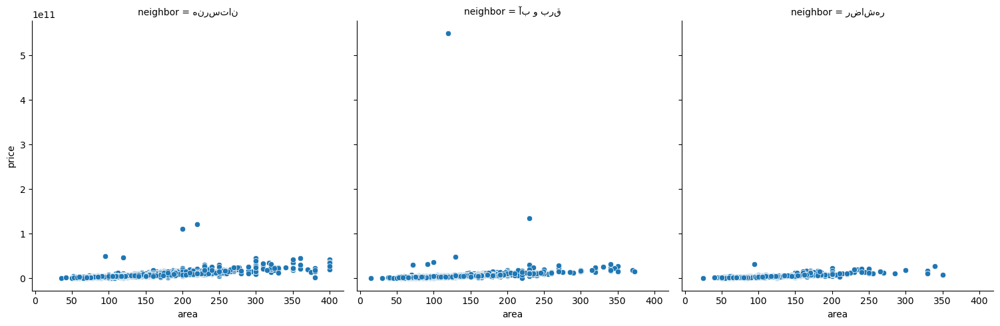

In [410]:
sns.relplot(x = "area", y = "price", data = region_9_aprt, col = "neighbor", col_wrap=4)

### ---

In [411]:
region_9_aprt[((region_9_aprt.price > 3e10) & (region_9_aprt.neighbor.str.contains("آب و برق"))) | 
((region_9_aprt.price > 3e10) & (region_9_aprt.area < 200) & (region_9_aprt.neighbor.str.contains("هنرستان"))) | 
((region_9_aprt.price > 3e10) & (region_9_aprt.area < 200) & (region_9_aprt.neighbor.str.contains("رضاشهر"))) |
((((region_9_aprt.price > .99e11) & (region_9_aprt.area < 500)) | ( (region_9_aprt.area > 600)) ))].sort_values("price", ascending=False)

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
23208,فروش آپارتمان,120.0,منطقه 9 محله آب و برق خیابان برونسی,فروش آپارتمان/ متری/ اوایل فرهنگ/فول\r\n⚜️...,36.326765,59.463926,16.0,2,2.0,5.500000e+11,9,آب و برق,برونسی,0
45643,فروش آپارتمان,230.0,منطقه 9 محله آب و برق خیابان برونسی,متر/ خواب/ مستر/برند\r\nبا سلام\n.______ ....,36.326765,59.463926,0.0,2,4.0,1.350000e+11,9,آب و برق,برونسی,0
10320,فروش آپارتمان,220.0,منطقه 9 محله هنرستان خیابان هفت تیر,آپارتمان متری، سه خوابه\r\n طبقه \nپیلوت د...,36.319780,59.494770,0.0,1,3.0,1.210000e+11,9,هنرستان,هفت تیر,0
8724,فروش آپارتمان,200.0,منطقه 9 محله هنرستان خیابان هاشمیه,متر خواب صفر تکواحدی(هاشمیه/لاله)\r\nبا س...,36.310605,59.504477,0.0,4,3.0,1.111111e+11,9,هنرستان,هاشمیه,0
35313,فروش آپارتمان,95.0,منطقه 9 محله هنرستان خیابان هاشمیه,آپارتمان ، متر، متر حیاط\r\nفوق العاده خ...,36.310605,59.504477,0.0,0,2.0,5.000000e+10,9,هنرستان,هاشمیه,0
28475,فروش آپارتمان,130.0,منطقه 9 محله آب و برق خیابان اقبال لاهوری,اپارتمان متری اوایل اقبال\r\nاپارتمان \n ...,36.332903,59.469986,7.0,3,2.0,4.850000e+10,9,آب و برق,اقبال لاهوری,0
11691,فروش آپارتمان,120.0,منطقه 9 محله هنرستان خیابان هفت تیر,متری نسترن فول دانگ\r\nبازسازی صفرتاصد\n...,36.319780,59.494770,17.0,1,2.0,4.650000e+10,9,هنرستان,هفت تیر,0
39949,فروش آپارتمان,100.0,منطقه 9 محله آب و برق خیابان اقبال لاهوری,اقبال بنفشه متر طبقه بدون اسانسور\r\nمجت...,36.333313,59.464245,13.0,3,2.0,3.700000e+10,9,آب و برق,اقبال لاهوری,0
649,فروش آپارتمان,92.0,منطقه 9 محله آب و برق خیابان اقبال لاهوری,اوایل اقبال لاهوری\r\n متر\n خواب\nاسانسور د...,36.332903,59.469986,14.0,4,2.0,3.250000e+10,9,آب و برق,اقبال لاهوری,0
28630,فروش آپارتمان,94.0,منطقه 9 محله رضاشهر خیابان ارغوان,آپاتمان متری دوخواب\r\nدولاین آسانسور.گرمای...,36.266450,59.538387,5.0,8,2.0,3.210000e+10,9,رضاشهر,ارغوان,0


In [412]:
region_9_aprt[(((region_9_aprt.price > .99e11) & (region_9_aprt.area < 500)) | ( (region_9_aprt.area > 600)) )].sort_values("area", ascending=False)

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
45643,فروش آپارتمان,230.0,منطقه 9 محله آب و برق خیابان برونسی,متر/ خواب/ مستر/برند\r\nبا سلام\n.______ ....,36.326765,59.463926,0.0,2,4.0,1.350000e+11,9,آب و برق,برونسی,0
10320,فروش آپارتمان,220.0,منطقه 9 محله هنرستان خیابان هفت تیر,آپارتمان متری، سه خوابه\r\n طبقه \nپیلوت د...,36.319780,59.494770,0.0,1,3.0,1.210000e+11,9,هنرستان,هفت تیر,0
8724,فروش آپارتمان,200.0,منطقه 9 محله هنرستان خیابان هاشمیه,متر خواب صفر تکواحدی(هاشمیه/لاله)\r\nبا س...,36.310605,59.504477,0.0,4,3.0,1.111111e+11,9,هنرستان,هاشمیه,0
23208,فروش آپارتمان,120.0,منطقه 9 محله آب و برق خیابان برونسی,فروش آپارتمان/ متری/ اوایل فرهنگ/فول\r\n⚜️...,36.326765,59.463926,16.0,2,2.0,5.500000e+11,9,آب و برق,برونسی,0


<Axes: xlabel='type', ylabel='price'>

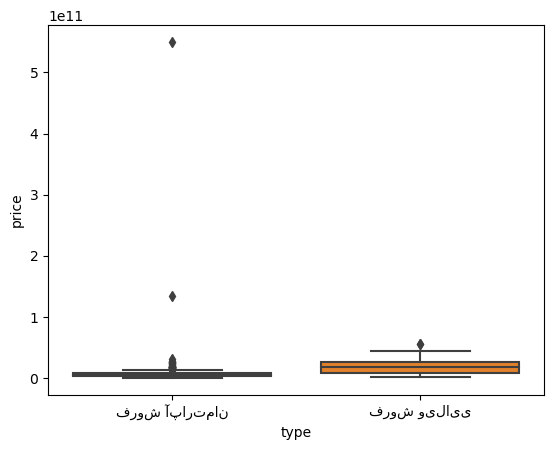

In [413]:
sns.boxplot(x = "type", y = "price", data = train_data[ (train_data.street == "برونسی")])

In [414]:
# show_description(region_9_aprt[(region_9_aprt.price > .99e11) & (region_9_aprt.area < 500)])

In [415]:
region_9_aprt[(region_9_aprt.area > 500)].sort_values("area", ascending=False)

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [416]:
train_data.loc[19291, "area"] = 170

<Axes: xlabel='type', ylabel='price'>

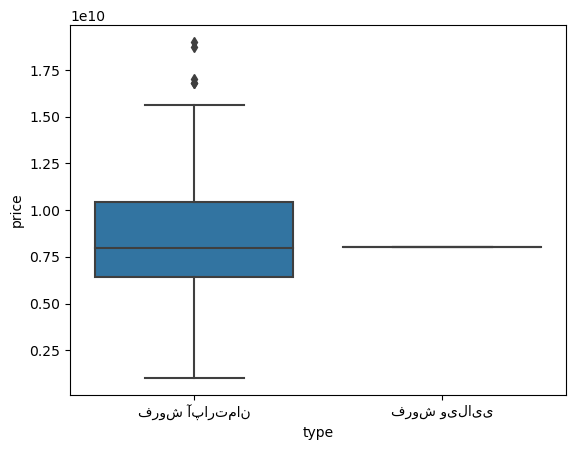

In [417]:
sns.boxplot(x = "type", y = "price", data = train_data[ (train_data.street == "هاشمیه") & (train_data.age == 0) & (train_data.area < 200) & (train_data.area > 100)])

In [418]:
train_data.drop(region_9_aprt[((region_9_aprt.price > 3e10) & (region_9_aprt.neighbor.str.contains("آب و برق"))) | 
((region_9_aprt.price > 3e10) & (region_9_aprt.area < 200) & (region_9_aprt.neighbor.str.contains("هنرستان"))) | 
((region_9_aprt.price > 3e10) & (region_9_aprt.area < 200) & (region_9_aprt.neighbor.str.contains("رضاشهر"))) |
((((region_9_aprt.price > .99e11) & (region_9_aprt.area < 500)) | ( (region_9_aprt.area > 600)) ))].index, inplace=True)

### other

In [419]:
region_9_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 9)]  

In [420]:
# train_data[(train_data.description.notna()) & (train_data.description.str.contains("ممر|دوممر|دونبش|دو نبش|سه نبش"))]

In [421]:
region_9_aprt[(region_9_aprt.neighbor.str.contains("رضاشهر")) &  (region_9_aprt.area > 300) ].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
32464,فروش آپارتمان,350.0,منطقه 9 محله رضاشهر خیابان باهنر,آپارتمان متری باهنر\r\nبنام خداوندبخشنده مه...,36.315256,59.525500,17.0,1.0,3.0,8.000000e+09,9.0,رضاشهر,باهنر,0.0
157,فروش آپارتمان,330.0,منطقه 9 محله رضاشهر خیابان سرافرازان,مجموعه واحدی آپارتمان\r\nآپارتمان دارای و...,36.290086,59.502946,6.0,1.0,2.0,1.100000e+10,9.0,رضاشهر,سرافرازان,0.0
27884,فروش آپارتمان,330.0,منطقه 9 محله رضاشهر خیابان سرافرازان,آپارتمان واحدی هر واحد متر\r\nخوش نقشه ...,36.290086,59.502946,6.0,1.0,2.0,1.100000e+10,9.0,رضاشهر,سرافرازان,0.0
46417,فروش آپارتمان,330.0,منطقه 9 محله رضاشهر خیابان رادان,NaN,36.289652,59.505883,16.0,1.0,3.0,1.150000e+10,9.0,رضاشهر,رادان,0.0
15364,فروش آپارتمان,330.0,منطقه 9 محله رضاشهر خیابان سرافرازان,فروش آپارتمان و یک باب مغازه\r\nآپارتمان وا...,36.290086,59.502946,6.0,0.0,2.0,1.650000e+10,9.0,رضاشهر,سرافرازان,0.0
46105,فروش آپارتمان,340.0,منطقه 9 محله رضاشهر خیابان باهنر,تریبلکس % فول فرنیش درجه A% معبر متری%\r...,36.315256,59.525500,8.0,5.0,4.0,2.700000e+10,9.0,رضاشهر,باهنر,0.0


In [422]:
region_9_aprt[(region_9_aprt.neighbor.str.contains("آب")) &  ((region_9_aprt.area < 30) | (region_9_aprt.price < .2e10) & (region_9_aprt.area > 200))].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
215,فروش آپارتمان,15.0,منطقه 9 محله آب و برق خیابان صابر,راه جدا,36.311730,59.473980,12.0,0.0,0.0,2.700000e+08,9.0,آب و برق,صابر,0.0
38050,فروش آپارتمان,220.0,منطقه 9 محله آب و برق خیابان صیاد شیرازی,متر صفر صیاد شیرازی نشیمن خصوصی\r\n...,36.332341,59.485542,0.0,4.0,3.0,1.050000e+09,9.0,آب و برق,صیاد شیرازی,0.0


In [423]:
region_9_aprt[(region_9_aprt.neighbor.str.contains("آب")) & (region_9_aprt.price > 2e10)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
11716,فروش آپارتمان,320.0,منطقه 9 محله آب و برق خیابان برونسی,پنت هاوس وکیل آباد یک قدم تا آسمان حیاط اخ...,36.326765,59.463926,0.0,8.0,4.0,2.080000e+10,9.0,آب و برق,برونسی,0.0
28819,فروش آپارتمان,346.0,منطقه 9 محله آب و برق خیابان برونسی,وکیل آباد * متر*صفر*حسن‌زاده\r\n❇️مشاور شم...,36.326765,59.463926,0.0,5.0,4.0,2.249000e+10,9.0,آب و برق,برونسی,0.0
5096,فروش آپارتمان,270.0,منطقه 9 محله آب و برق خیابان صیاد شیرازی,آپارتمان متر/صفر هتلینگ برج/تاپ لوکیشن صیاد...,36.332341,59.485542,0.0,18.0,4.0,2.300000e+10,9.0,آب و برق,صیاد شیرازی,0.0
26237,فروش آپارتمان,340.0,منطقه 9 محله آب و برق خیابان برونسی,آپارتمان متر سه نبش\r\nسلام\nآپارتمان ...,36.326765,59.463926,17.0,5.0,4.0,2.300000e+10,9.0,آب و برق,برونسی,0.0
18702,فروش آپارتمان,235.0,منطقه 9 محله آب و برق خیابان برونسی,متربرج مجلل+ مترتراس ط هفتم ویو بی بدیل\...,36.326765,59.463926,0.0,7.0,3.0,2.400000e+10,9.0,آب و برق,برونسی,0.0
42727,فروش آپارتمان,320.0,منطقه 9 محله آب و برق خیابان برونسی,متر روبه پارک نزدیک مترو\r\nبا سلام و عرض ...,36.326765,59.463926,0.0,3.0,4.0,2.490000e+10,9.0,آب و برق,برونسی,0.0
14919,فروش آپارتمان,330.0,منطقه 9 محله آب و برق خیابان برونسی,کاخ شاه‌نشین / متر خواب / کوچه بعد وکیل‌...,36.326765,59.463926,0.0,5.0,4.0,2.636000e+10,9.0,آب و برق,برونسی,0.0
41704,فروش آپارتمان,330.0,منطقه 9 محله آب و برق خیابان برونسی,ابتدای وکیل آباد/ خواب/ در حد هتل ستاره\...,36.326765,59.463926,0.0,5.0,4.0,2.640000e+10,9.0,آب و برق,برونسی,0.0
25689,فروش آپارتمان,350.0,منطقه 9 محله آب و برق خیابان برونسی,آپارتمان متری چهار خواب\r\n✍️مشهد مقدّس\n...,36.326765,59.463926,1.0,1.0,4.0,2.700000e+10,9.0,آب و برق,برونسی,0.0
14141,فروش آپارتمان,270.0,منطقه 9 محله آب و برق خیابان برونسی,برج حاشیه وکیل آباد برند\r\nبا سلام\nاولین بر...,36.326765,59.463926,0.0,7.0,3.0,2.862000e+10,9.0,آب و برق,برونسی,0.0


In [424]:
region_9_aprt[(region_9_aprt.neighbor.str.contains("هنرستان")) & (region_9_aprt.price < .5e10) & (region_9_aprt.area > 360)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
44154,فروش آپارتمان,380.0,منطقه 9 محله هنرستان خیابان هفت تیر,اپارتمان متری شاهکار در اول حافظ\r\n م...,36.31978,59.49477,0.0,6.0,4.0,2.550000e+09,9.0,هنرستان,هفت تیر,0.0


In [425]:
region_9_aprt[(region_9_aprt.neighbor.str.contains("هنرستان")) & (region_9_aprt.price > 3.7e10)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
33056,فروش آپارتمان,300.0,منطقه 9 محله هنرستان خیابان هفت تیر,آپارتمان/ متری/هفت تیر/بلوار کتاب\r\n هفت ت...,36.319780,59.494770,0.0,10.0,4.0,4.000000e+10,9.0,هنرستان,هفت تیر,0.0
17802,فروش آپارتمان,400.0,منطقه 9 محله هنرستان خیابان هاشمیه,متر آپارتمان/مجموعه آبی/صفر/دوکله/هاشمیه\r...,36.310605,59.504477,0.0,6.0,4.0,4.200000e+10,9.0,هنرستان,هاشمیه,0.0
43226,فروش آپارتمان,350.0,منطقه 9 محله هنرستان خیابان هنرستان,آپارتمان متر / گلشن / تک واحدی\r\nبنام خدا...,36.323196,59.506530,2.0,2.0,3.0,4.200000e+10,9.0,هنرستان,هنرستان,0.0
116,فروش آپارتمان,300.0,منطقه 9 محله هنرستان خیابان هاشمیه,برج الگانت (هاشمیه )\r\nبرج الگانت \nهاشمیه ...,36.310605,59.504477,2.0,8.0,4.0,4.500000e+10,9.0,هنرستان,هاشمیه,0.0
28399,فروش آپارتمان,360.0,منطقه 9 محله هنرستان خیابان هفت تیر,متر قصر واقعی‌/ویو شاهانه به آرمیتاژ/قلب ...,36.319780,59.494770,0.0,2.0,3.0,4.500000e+10,9.0,هنرستان,هفت تیر,0.0


In [426]:
# region_9_aprt[(region_9_aprt.neighbor.str.contains("هنرستان")) & (region_9_aprt.area > 250)].sort_values("price").price.plot.hist()

In [427]:
# region_9_aprt[(region_9_aprt.neighbor.str.contains("هنرستان")) & (region_9_aprt.price > 3e10)].sort_values("price")

In [428]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 9) &
                (train_data.neighbor.str.contains("هنرستان")) & (train_data.price < .5e10) & (train_data.area > 360)].index, inplace=True)

In [429]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 9) &
                (train_data.neighbor.str.contains("آب")) &  ((train_data.area < 30) | (train_data.price < .2e10) & (train_data.area > 200))].index, inplace=True)

## 10

In [430]:
region_10_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 10)]  

In [431]:
region_10_aprt[(region_10_aprt.price > 1e10) & (region_10_aprt.area < 220)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
2902,فروش آپارتمان,90.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,آپارتمان متری رفیعی مجتمع فجر \r\nاملاک ...,36.360020,59.517400,6.0,8.0,2.0,3.150000e+10,10.0,قاسم آباد,قاسم آباد,0.0
8284,فروش آپارتمان,90.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,١٣ واحد صفر نهضت تهاتر با خودرو و\r\n١٢واحد ٩...,36.360020,59.517400,0.0,1.0,5.0,5.000000e+10,10.0,قاسم آباد,قاسم آباد,0.0
10395,فروش آپارتمان,170.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,قاسم آباد تهاترچهارراه مخابرات واحدهای متر...,36.355070,59.517773,0.0,4.0,3.0,1.111111e+10,10.0,قاسم آباد,قاسم آباد,0.0
23299,فروش آپارتمان,96.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,آپارتمان سردونبش جنب مسجد، مقابل فضای سبز\r\n...,36.360020,59.517400,5.0,3.0,2.0,1.111111e+10,10.0,قاسم آباد,قاسم آباد,0.0
23703,فروش آپارتمان,200.0,منطقه 10 محله قاسم آباد خیابان شاهد,v/مسکونی-تجازی- \r\n مترزمین متر...,36.359129,59.515294,0.0,0.0,3.0,1.300000e+10,10.0,قاسم آباد,شاهد,0.0
26192,فروش آپارتمان,175.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,آپارتمان متری مدرس\r\n⭐بهترین ها را از ما...,36.349930,59.488358,0.0,4.0,3.0,1.275000e+10,10.0,قاسم آباد,قاسم آباد,0.0
44811,فروش آپارتمان,75.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,حسابی شمالی / متر باسازی شده\r\nبازسازی ...,36.360020,59.517400,14.0,3.0,2.0,2.050000e+10,10.0,قاسم آباد,قاسم آباد,0.0


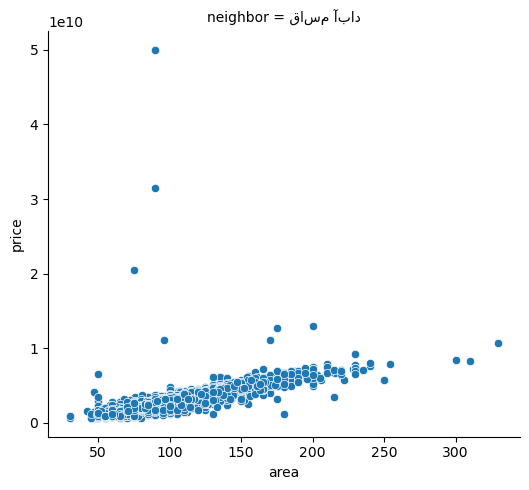

In [432]:
sns.relplot(x = "area", y = "price", data = region_10_aprt, col = "neighbor", col_wrap=4)

### ---

<Axes: xlabel='type', ylabel='price'>

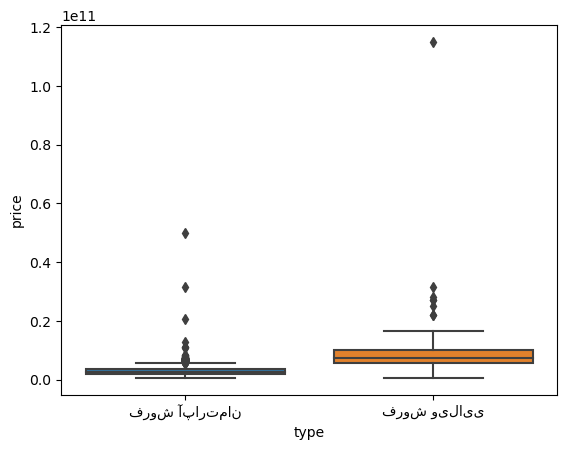

In [433]:
sns.boxplot(x = "type", y = "price", data = train_data[ (train_data.street == "قاسم آباد")])

In [434]:
# show_description(region_10_aprt[(region_10_aprt.price > 1e10) & (region_10_aprt.area < 220)])

In [435]:
region_10_aprt[(region_10_aprt.area > 600)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [436]:
region_10_aprt[((region_10_aprt.price > 1e10) & (region_10_aprt.area < 220)) | (region_10_aprt.area > 600)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
2902,فروش آپارتمان,90.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,آپارتمان متری رفیعی مجتمع فجر \r\nاملاک ...,36.360020,59.517400,6.0,8.0,2.0,3.150000e+10,10.0,قاسم آباد,قاسم آباد,0.0
8284,فروش آپارتمان,90.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,١٣ واحد صفر نهضت تهاتر با خودرو و\r\n١٢واحد ٩...,36.360020,59.517400,0.0,1.0,5.0,5.000000e+10,10.0,قاسم آباد,قاسم آباد,0.0
10395,فروش آپارتمان,170.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,قاسم آباد تهاترچهارراه مخابرات واحدهای متر...,36.355070,59.517773,0.0,4.0,3.0,1.111111e+10,10.0,قاسم آباد,قاسم آباد,0.0
23299,فروش آپارتمان,96.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,آپارتمان سردونبش جنب مسجد، مقابل فضای سبز\r\n...,36.360020,59.517400,5.0,3.0,2.0,1.111111e+10,10.0,قاسم آباد,قاسم آباد,0.0
23703,فروش آپارتمان,200.0,منطقه 10 محله قاسم آباد خیابان شاهد,v/مسکونی-تجازی- \r\n مترزمین متر...,36.359129,59.515294,0.0,0.0,3.0,1.300000e+10,10.0,قاسم آباد,شاهد,0.0
26192,فروش آپارتمان,175.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,آپارتمان متری مدرس\r\n⭐بهترین ها را از ما...,36.349930,59.488358,0.0,4.0,3.0,1.275000e+10,10.0,قاسم آباد,قاسم آباد,0.0
44811,فروش آپارتمان,75.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,حسابی شمالی / متر باسازی شده\r\nبازسازی ...,36.360020,59.517400,14.0,3.0,2.0,2.050000e+10,10.0,قاسم آباد,قاسم آباد,0.0


In [437]:
train_data.drop(region_10_aprt[((region_10_aprt.price > 1e10) & (region_10_aprt.area < 220)) | (region_10_aprt.area > 580)].index, inplace=True)

### other

In [438]:
region_10_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 10)]

In [439]:
region_10_aprt[(region_10_aprt.price > 6e9) & (region_10_aprt.area < 60)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
13148,فروش آپارتمان,50.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,فازتجاری ومسکونی متربنا\r\nباسلام وعرض ادب...,36.36002,59.5174,11.0,0.0,2.0,6.500000e+09,10.0,قاسم آباد,قاسم آباد,0.0


In [440]:
region_10_aprt[((region_10_aprt.area > 320) | ((region_10_aprt.area > 120) & (region_10_aprt.price < .13e10)))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
8990,فروش آپارتمان,130.0,منطقه 10 محله قاسم آباد خیابان شریعتی,v/آپارتمان-قاسم-آباد-یوسفیه-وآزاده-حیاط-وپارک...,36.355830,59.524980,0.0,0.0,1.0,1.200000e+09,10.0,قاسم آباد,شریعتی,0.0
13576,فروش آپارتمان,180.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,اپارتمان مشکینی فول معاوضه با دو طبقه یا ...,36.360020,59.517400,6.0,0.0,4.0,1.212121e+09,10.0,قاسم آباد,قاسم آباد,0.0
14799,فروش آپارتمان,330.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,اپارتمان طبق دو واحد وطبقه یو واحد\r\nچم...,36.360020,59.517400,2.0,3.0,2.0,1.070000e+10,10.0,قاسم آباد,قاسم آباد,0.0
45923,فروش آپارتمان,130.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,آپارتمان پارکینگ وحیاط دار،یوسفیه معاوضه ماشی...,36.351646,59.472496,9.0,4.0,1.0,1.200000e+09,10.0,قاسم آباد,قاسم آباد,0.0


In [441]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 10) & 
                ((train_data.area > 320) | ((train_data.area > 120) & (train_data.price < .13e10)))].index, inplace=True)

## 11

In [442]:
region_11_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 11)]  

In [443]:
region_11_aprt[(region_11_aprt.price > .3e11) & (region_11_aprt.area < 500)].sort_values("price", ascending=False)

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
9504,فروش آپارتمان,170.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,آپارتمان متری خوابه / صفر / جلال\r\nباس...,36.327540,59.52752,0.0,1.0,3.0,8.840000e+11,11.0,آزاد شهر,آزادشهر,0.0
18342,فروش آپارتمان,160.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,آپارتمان متری سروش قبل فرهنگ\r\nبا سلام و...,36.328550,59.51339,0.0,2.0,3.0,1.030000e+11,11.0,آزاد شهر,فرهنگ,0.0
8194,فروش آپارتمان,175.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,متر جنوبی جلال/سروش\r\nتوضیحات\n\nلوکیشن آ...,36.327540,59.52752,0.0,3.0,3.0,8.400000e+10,11.0,آزاد شهر,آزادشهر,0.0
38297,فروش آپارتمان,162.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,متر/نوساز/مطبخ/خوشنقشه/اوایل دانش آموز\r\n...,36.328550,59.51339,0.0,1.0,3.0,7.490000e+10,11.0,آزاد شهر,فرهنگ,0.0
18176,فروش آپارتمان,170.0,منطقه 11 محله دانشجو خیابان دانشجو,آپارتمان واحدی دانشجو تهاتر با زمین برای سا...,36.331839,59.50351,1.0,6.0,3.0,4.600000e+10,11.0,دانشجو,دانشجو,0.0
19505,فروش آپارتمان,360.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,مسکونی تجاری اوایل استقلال\r\nعرصه متر موق...,36.327540,59.52752,21.0,1.0,2.0,3.500000e+10,11.0,آزاد شهر,آزادشهر,0.0
25336,فروش آپارتمان,160.0,منطقه 11 محله دانشجو خیابان دانشجو,فروش واحد اپارتمان متری دانشجو \r\nلوک...,36.331839,59.50351,12.0,2.0,3.0,3.150000e+10,11.0,دانشجو,دانشجو,0.0


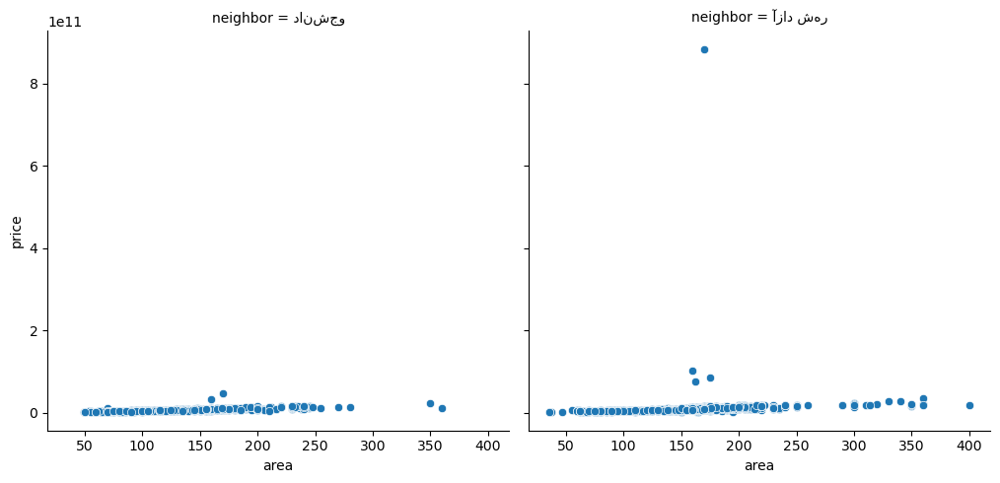

In [444]:
sns.relplot(x = "area", y = "price", data = region_11_aprt, col = "neighbor", col_wrap=4)

### ---

<Axes: xlabel='type', ylabel='price'>

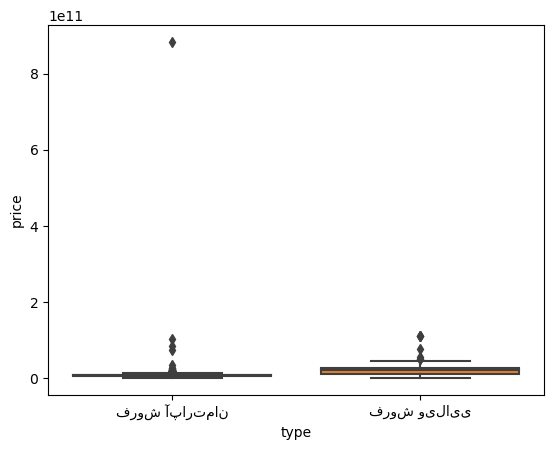

In [445]:
sns.boxplot(x = "type", y = "price", data = train_data[train_data.neighbor == "آزاد شهر"])

In [446]:
# show_description(region_11_aprt[(region_11_aprt.price > .3e11) & (region_11_aprt.area < 500)].sort_values("price", ascending=False))

In [447]:
region_11_aprt[ (region_11_aprt.area > 750)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


<Axes: xlabel='type', ylabel='area'>

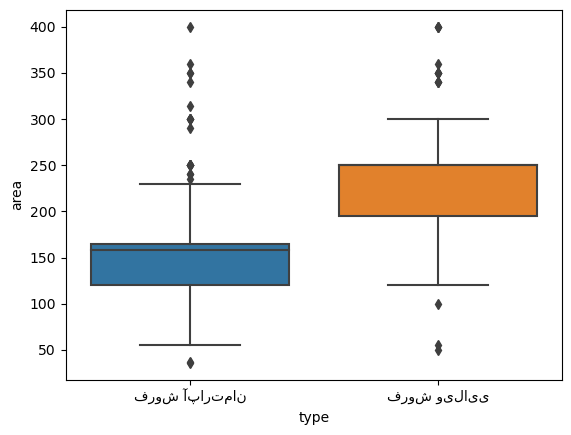

In [448]:
sns.boxplot(x = "type", y = "area", data = train_data[train_data.street == "آزادشهر"])

In [449]:
# show_description(region_11_aprt[ (region_11_aprt.area > 750)])

In [450]:
train_data.drop(region_11_aprt[((region_11_aprt.price > .3e11) & (region_11_aprt.area < 500)) |  (region_11_aprt.area > 750)].index, inplace=True)

### other

In [451]:
region_11_aprt = train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 11)]  

In [452]:
region_11_aprt[(region_11_aprt.neighbor.str.contains("آزاد")) & (region_11_aprt.area > 100) & (region_11_aprt.price < .3e10)].sort_values("price").iloc[:-4]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
31183,فروش آپارتمان,110.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,واحد همکف ، بازسازی شده ،\r\nواحد همکف راه جد...,36.32855,59.513390,12.0,0.0,2.0,5.000000e+08,11.0,آزاد شهر,فرهنگ,0.0
33802,فروش آپارتمان,164.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,متری/تک واحدی/قلب آزادشهر/اوج هنر معماری\r...,36.32754,59.527520,1.0,2.0,3.0,9.000000e+08,11.0,آزاد شهر,آزادشهر,0.0
5113,فروش آپارتمان,150.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,متر خواب امامت زیباشهر معاوضه با خواب\...,36.33280,59.536392,16.0,4.0,3.0,1.111111e+09,11.0,آزاد شهر,آزادشهر,0.0
13187,فروش آپارتمان,195.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,متر جلال معاوضه با ویلایی\r\nباسلام \n✅️ ...,36.32754,59.527520,0.0,6.0,3.0,1.111111e+09,11.0,آزاد شهر,آزادشهر,0.0
29713,فروش آپارتمان,150.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,تجربه زندگی مدیترانه ای در قبرس شمالی/ متر\...,36.32754,59.527520,0.0,2.0,2.0,1.500000e+09,11.0,آزاد شهر,آزادشهر,0.0
37540,فروش آپارتمان,165.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,قرعه کشی آپارتمان\r\nفروش یک آپارتمان خواب ...,36.32855,59.513390,0.0,2.0,3.0,2.000000e+09,11.0,آزاد شهر,فرهنگ,0.0
14190,فروش آپارتمان,135.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,اپارتمان شخصی ساز تهاتر با ملک در مشهد\r\nآپـ...,36.32754,59.527520,1.0,3.0,2.0,2.550000e+09,11.0,آزاد شهر,آزادشهر,0.0


In [453]:
region_11_aprt[(region_11_aprt.neighbor.str.contains("دانش")) & ((region_11_aprt.area < 80) & (region_11_aprt.price > 1e10) | (region_11_aprt.area > 350))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
8432,فروش آپارتمان,360.0,منطقه 11 محله دانشجو خیابان آموزگار(فرد از 39...,پکیج دارد / دو طبقه - و همکف به فروش میرسد /...,36.34219,59.5133,12.0,0.0,2.0,1.180000e+10,11.0,دانشجو,آموزگار(فرد از 39 زوج از42),0.0
35292,فروش آپارتمان,70.0,منطقه 11 محله دانشجو خیابان معلم(فرداز 37-زوج...,معاوضه با ویلایی در محدوده یا با آپارتمان نصف...,36.33486,59.5100,15.0,4.0,2.0,1.050000e+10,11.0,دانشجو,معلم(فرداز 37-زوج از 30),0.0


In [454]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 11) & 
                (train_data.neighbor.str.contains("آزاد")) & (train_data.area > 100) & (train_data.price < .3e10)].sort_values("price").iloc[:-4].index, inplace=True)

In [455]:
train_data.drop(train_data[(train_data.type.str.contains("تمان")) & (train_data.region == 11) & 
                (train_data.neighbor.str.contains("دانش")) & ((train_data.area < 80) & (train_data.price > 1e10) | (train_data.area > 350))].index, inplace=True)

## Vilaee

In [456]:
train_data = train_data.dropna(subset = train_data.drop(["description", "age", "bedrooms"], axis = 1).columns).copy()

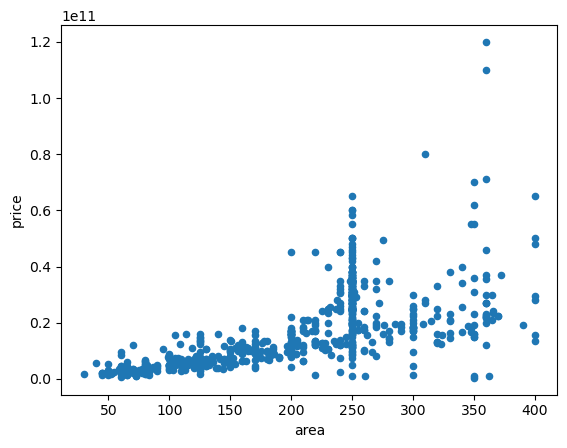

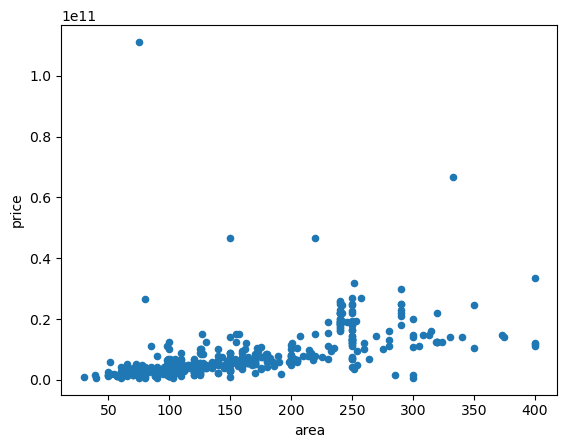

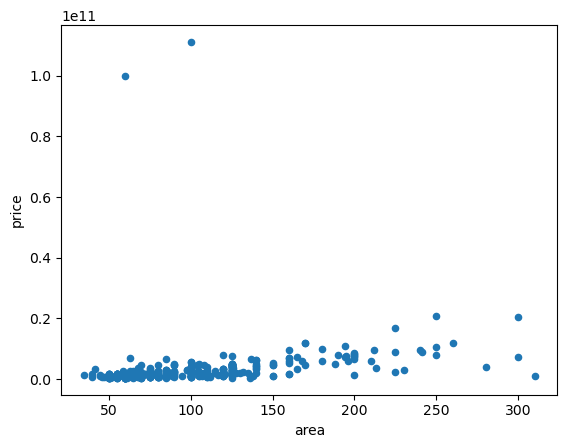

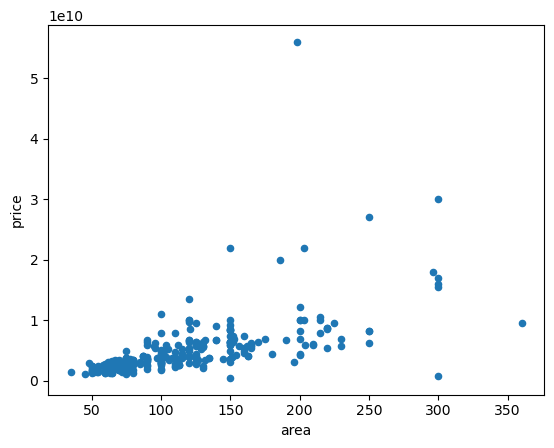

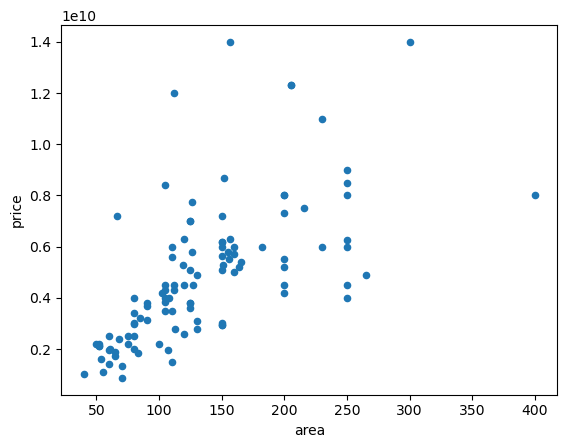

...

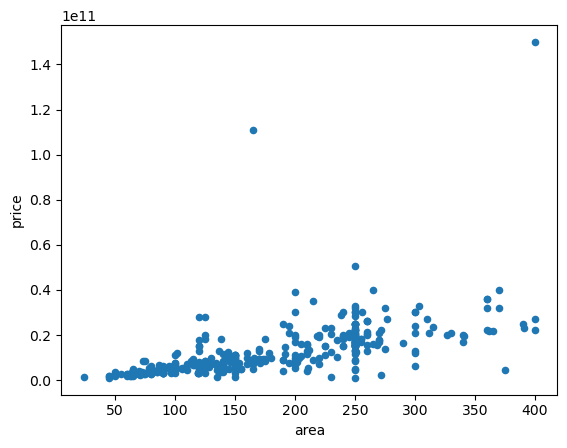

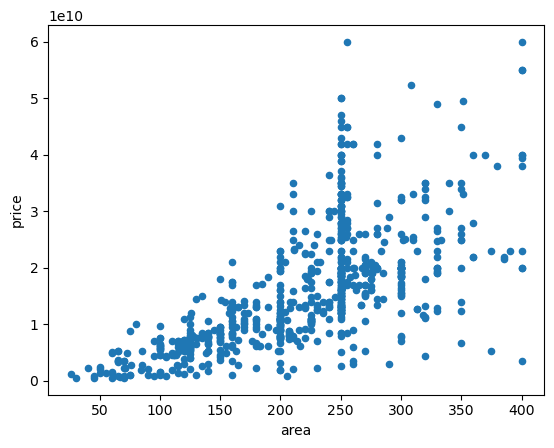

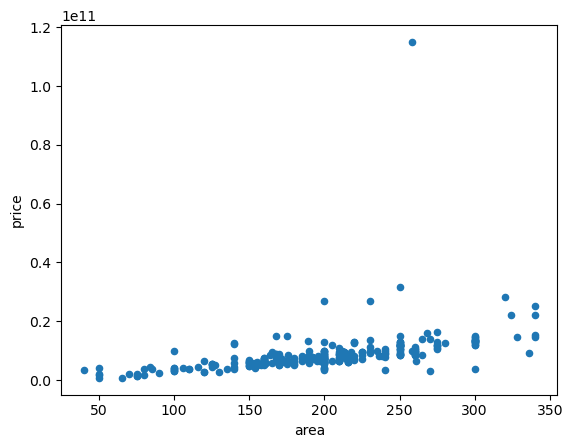

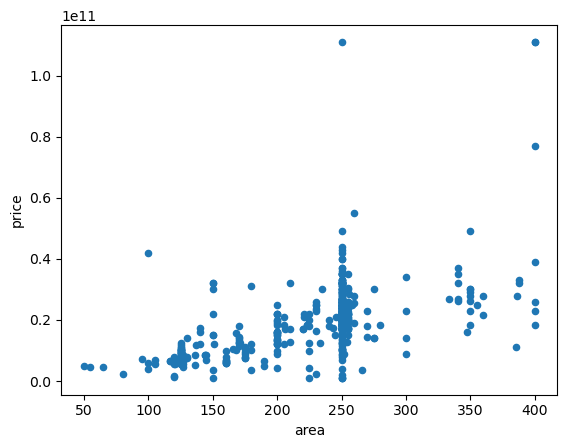

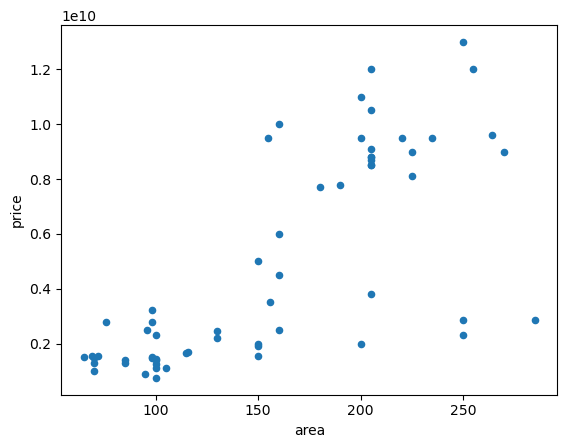

In [457]:
train_data[(train_data.type.str.contains("ویلا"))].groupby(["region"])[["area", "price"]].plot.scatter(x = "area", y = "price")
plt.show()

In [458]:
train_data.groupby("type").age.median()

type
فروش آپارتمان     4.0
فروش ویلایی      17.0
Name: age, dtype: float64

## 1

In [459]:
region_1_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1)]

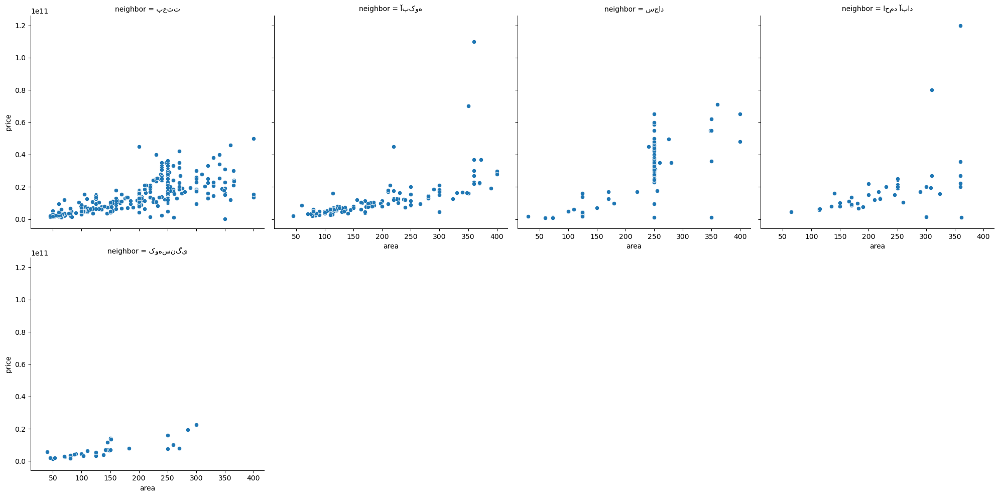

In [460]:
sns.relplot(data = region_1_vila, x = "area", y = "price", col = "neighbor", col_wrap=4)

In [461]:
region_1_vila[(region_1_vila.neighbor.str.contains("سجاد")) & (region_1_vila.price > 4e10) &  (region_1_vila.area > 260) &  (region_1_vila.price < 5e10) ]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
30964,فروش ویلایی,275.0,منطقه 1 محله سجاد خیابان ملک اباد,ویلایی متر حاشیه ملک اباد\r\nدرود فراوان\...,36.307550,59.552210,30.0,0.0,5.0,4.950000e+10,1.0,سجاد,ملک اباد,0.0
44705,فروش ویلایی,400.0,منطقه 1 محله سجاد خیابان سجاد,ویلایی طبقه بنادار حاشیه فردوسی\r\nلوکیشن عال...,36.318036,59.551475,17.0,0.0,5.0,4.800000e+10,1.0,سجاد,سجاد,0.0


In [462]:
region_1_vila[(region_1_vila.neighbor.str.contains("سجاد")) & (region_1_vila.price > 6.8e10) ].sort_values("price", ascending=False)

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
21153,فروش ویلایی,360.0,منطقه 1 محله سجاد خیابان ملک اباد,ویلای متری حاشیه لوکیشن ملک اباد\r\nویلایی...,36.30755,59.55221,15.0,0.0,4.0,7.100000e+10,1.0,سجاد,ملک اباد,0.0


In [463]:
# train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1) & 
# (region_1_vila.neighbor.str.contains("سجاد")) & ((region_1_vila.price > 4e10) &  (region_1_vila.area > 260) &  (region_1_vila.price < 5e10)) | 
# ((region_1_vila.price > 6.8e10) )].index,inplace=True)

### --

In [464]:
region_1_vila.neighbor.value_counts()

neighbor
بعثت         348
آبکوه        126
سجاد         122
احمد آباد     45
کوهسنگی       32
Name: count, dtype: int64

In [465]:
region_1_vila[(region_1_vila.area >= 1500) & (region_1_vila.age < 10) ]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [466]:
train_data.drop(region_1_vila[(region_1_vila.area >= 1500) & (region_1_vila.age < 10) ].index, inplace=True)

In [467]:
region_1_vila[region_1_vila.price > 2.5e11]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [468]:
train_data.drop(region_1_vila[region_1_vila.price > 2.5e11].index, inplace=True)

In [469]:
region_1_vila[(region_1_vila.area >= 1000) & (region_1_vila.neighbor == "بعثت")].sort_values("price").iloc[:-1]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [470]:
train_data.drop(region_1_vila[(region_1_vila.area >= 1000) & (region_1_vila.neighbor == "بعثت")].index, inplace=True)

In [471]:
region_1_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1)]

In [472]:
region_1_vila[(region_1_vila.neighbor.str.contains("سجاد")) & (region_1_vila.area >= 600)].sort_values("price").iloc[:-4]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [473]:
train_data.drop(region_1_vila[(region_1_vila.neighbor.str.contains("سجاد")) & (region_1_vila.area >= 600)].sort_values("price").iloc[:-4].index, inplace=True)

In [474]:
region_1_vila[(region_1_vila.neighbor.str.contains("احمد آباد")) & (region_1_vila.price > 0.6e11)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
20748,فروش ویلایی,360.0,منطقه 1 محله احمد آباد خیابان سناباد,حاشیه سناباد /تجاری /مسکونی\r\n⚜️⚜️کارگذاری ا...,36.30176,59.58274,17.0,0.0,5.0,1.200000e+11,1.0,احمد آباد,سناباد,0.0
39449,فروش ویلایی,310.0,منطقه 1 محله احمد آباد خیابان سناباد,حاشیه سناباد تجاری\r\nملک در بهترین موقعیت تج...,36.30176,59.58274,27.0,0.0,5.0,8.000000e+10,1.0,احمد آباد,سناباد,0.0


In [475]:
train_data.drop(region_1_vila[(region_1_vila.neighbor.str.contains("احمد آباد")) & (region_1_vila.price > 0.6e11)].index, inplace=True)

In [476]:
region_1_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1)]

### other

In [477]:
region_1_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1)]

In [478]:
region_1_vila[(region_1_vila.price < .1e11) & (region_1_vila.area > 250) & (region_1_vila.neighbor.str.contains("بعثت"))].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
3234,فروش ویلایی,350.0,منطقه 1 محله بعثت خیابان رضا,ویلایی متری /رضاشهر/تراکم بالا\r\nدرود و م...,36.291085,59.565186,22.0,0.0,5.0,3.200000e+08,1.0,بعثت,رضا,0.0
11259,فروش ویلایی,261.0,منطقه 1 محله بعثت خیابان رضا,ویلایی. متر.رضاشهر\r\n متر\nانوری رضاشهر...,36.291085,59.565186,30.0,0.0,3.0,1.111111e+09,1.0,بعثت,رضا,0.0
38585,فروش ویلایی,300.0,منطقه 1 محله بعثت خیابان رضا,متر/باپروانه/پیروزی\r\nتمام ویلاییهای منطق...,36.291085,59.565186,7.0,0.0,3.0,9.500000e+09,1.0,بعثت,رضا,0.0


In [479]:
region_1_vila[(region_1_vila.neighbor.str.contains("بعثت"))  & (region_1_vila.area > 590)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [480]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1) &
(train_data.price < .1e11) & (train_data.area > 250) & (train_data.neighbor.str.contains("بعثت"))].index,inplace=True) 

In [481]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1) &
(train_data.area > 590) & (train_data.neighbor.str.contains("بعثت"))].sort_values("price").iloc[-4:].index,inplace=True) 

In [482]:
region_1_vila[  (region_1_vila.area > 620) & (region_1_vila.neighbor.str.contains("سجاد"))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [483]:
region_1_vila[ (region_1_vila.price < .2e11) & (region_1_vila.area > 250) & (region_1_vila.neighbor.str.contains("سجاد"))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
28410,فروش ویلایی,350.0,منطقه 1 محله سجاد خیابان سجاد,مسکونی تجارتی پزشکی حاشیه بهارستان\r\nعرصه ...,36.318036,59.551475,27.0,0.0,5.0,1.000000e+09,1.0,سجاد,سجاد,0.0
48036,فروش ویلایی,255.0,منطقه 1 محله سجاد خیابان سجاد,ویلایی، واحد مستقل،پشت حاشیه وکیل آباد\r\n<<<...,36.325280,59.545155,22.0,0.0,5.0,1.750000e+10,1.0,سجاد,سجاد,0.0


In [484]:
region_1_vila[(region_1_vila.neighbor.str.contains("سجاد")) & ((region_1_vila.area > 620) | ((region_1_vila.price < .2e11) & (region_1_vila.area > 250)))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
28410,فروش ویلایی,350.0,منطقه 1 محله سجاد خیابان سجاد,مسکونی تجارتی پزشکی حاشیه بهارستان\r\nعرصه ...,36.318036,59.551475,27.0,0.0,5.0,1.000000e+09,1.0,سجاد,سجاد,0.0
48036,فروش ویلایی,255.0,منطقه 1 محله سجاد خیابان سجاد,ویلایی، واحد مستقل،پشت حاشیه وکیل آباد\r\n<<<...,36.325280,59.545155,22.0,0.0,5.0,1.750000e+10,1.0,سجاد,سجاد,0.0


In [485]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1) &
(train_data.neighbor.str.contains("سجاد")) & ((train_data.area > 620) | ((train_data.price < .2e11) & (train_data.area > 250)))].index,inplace=True) 

In [486]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1) &
(train_data.street.str.contains("بهارستان"))].index,inplace=True) 

In [487]:
region_1_vila[ (region_1_vila.price < 0.1e11) & (region_1_vila.area > 200) & (region_1_vila.neighbor.str.contains("احمد "))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
6839,فروش ویلایی,362.0,منطقه 1 محله احمد آباد خیابان راهنمایی,ویلایی عرض با پروانه، مشارکت معاوضه و فروش...,36.30047,59.5678,30.0,0.0,5.0,1.000000e+09,1.0,احمد آباد,راهنمایی,0.0
20347,فروش ویلایی,300.0,منطقه 1 محله احمد آباد خیابان راهنمایی,متر ««زشک زیبا »»\r\nبا سلام \n ...,36.30047,59.5678,7.0,0.0,1.0,1.300000e+09,1.0,احمد آباد,راهنمایی,0.0


In [488]:
region_1_vila[ (region_1_vila.area > 400) & (region_1_vila.neighbor.str.contains("احمد "))].sort_values("price").iloc[:2]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [489]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1) &
(train_data.price < 0.1e11) & (train_data.area > 200) & (train_data.neighbor.str.contains("احمد "))].index,inplace=True) 

In [490]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1) &
(train_data.area > 400) & (train_data.neighbor.str.contains("احمد "))].iloc[:2].index,inplace=True) 

In [491]:
region_1_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1) ]

In [492]:
region_1_vila[(region_1_vila.neighbor.str.contains("آبکوه")) & (region_1_vila.price > .4e11)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
1287,فروش ویلایی,360.0,منطقه 1 محله آبکوه خیابان کلاهدوز,ویلایی ، متر زمین ، متر بنا ، کلاهدوز...,36.29994,59.57479,17.0,0.0,3.0,1.100000e+11,1.0,آبکوه,کلاهدوز,1.0
11686,فروش ویلایی,220.0,منطقه 1 محله آبکوه خیابان کلاهدوز,حاشیه کلاهدوز تجاری مسکونی\r\nبا سلام\n واحد...,36.29994,59.57479,22.0,0.0,5.0,4.500000e+10,1.0,آبکوه,کلاهدوز,0.0
38985,فروش ویلایی,350.0,منطقه 1 محله آبکوه خیابان آبکوه,ویلایی صفر خواب جزیره زیبای کیش تهاتر\r\nویل...,36.30685,59.57511,0.0,0.0,5.0,7.000000e+10,1.0,آبکوه,آبکوه,0.0


In [493]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1) &
(train_data.neighbor.str.contains("آبکوه")) & (train_data.price > .4e11)].index,inplace=True) 

### other 2

In [494]:
region_1_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1)]

<Axes: xlabel='longitude', ylabel='latitude'>

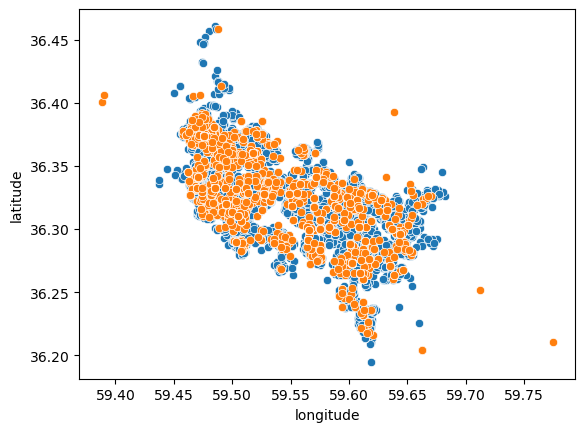

In [495]:
sns.scatterplot(x = "longitude", y = "latitude", data = train_data)
sns.scatterplot(x = "longitude", y = "latitude", data = test_data)

In [496]:
test_data[test_data.longitude > 59.70]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price
1341,فروش آپارتمان,85.0,منطقه 9 محله رضاشهر خیابان باهنر,متری،تکبرگ سند،شیک،تازه ساخت\r\nمجموعه وا...,36.210130,59.774284,0,3,2,NaN
2622,فروش آپارتمان,88.0,منطقه 12 محله الهیه خیابان مهدیه,NaN,36.251365,59.712503,9,2,2,NaN


In [497]:
region_1_vila[(region_1_vila.neighbor.str.contains("بعثت")) &  ((region_1_vila.price > 4e10) | ((region_1_vila.area < 220) & (region_1_vila.price > 4e10)))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
9200,فروش ویلایی,270.0,منطقه 1 محله بعثت خیابان احمدآباد,ویلایی احمدآباد ٪ تهاتر\r\nبه نام مالک زمی...,36.29935,59.56544,30.0,0.0,4.0,4.200000e+10,1.0,بعثت,احمدآباد,0.0
11386,فروش ویلایی,360.0,منطقه 1 محله بعثت خیابان احمدآباد,متر/ویلایی منطقه احمدآباد دادگر/معبر \r\n...,36.29935,59.56544,22.0,0.0,5.0,4.600000e+10,1.0,بعثت,احمدآباد,0.0
19340,فروش ویلایی,400.0,منطقه 1 محله بعثت خیابان کوهسنگی,ویلایی کلنگی تجاری مسکونی متری(کوهسنگی)\r\n...,36.28718,59.57472,31.0,0.0,3.0,5.000000e+10,1.0,بعثت,کوهسنگی,0.0
33376,فروش ویلایی,200.0,منطقه 1 محله بعثت خیابان احمدآباد,ویلایی متری پشت بازار موبایل احمد اباد\r\n...,36.29935,59.56544,30.0,0.0,3.0,4.500000e+10,1.0,بعثت,احمدآباد,0.0


In [498]:
# region_1_vila[(region_1_vila.neighbor.str.contains("سجاد")) &  (region_1_vila.area >= 350)].sort_values("price")

In [499]:
region_1_vila[(region_1_vila.neighbor.str.contains("سجاد")) & (region_1_vila.price < .9e10) & (region_1_vila.area > 100)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
14562,فروش ویلایی,250.0,منطقه 1 محله سجاد خیابان سجاد,ویلایی متر سجاد\r\n متر شمالی \nتراکم ...,36.318036,59.551475,22.0,0.0,5.0,1.111111e+09,1.0,سجاد,سجاد,0.0
15910,فروش ویلایی,150.0,منطقه 1 محله سجاد خیابان سجاد,درمانگاه آموزشگاه مجموعه نانوایی فروش یکجا حا...,36.318036,59.551475,4.0,0.0,4.0,7.000000e+09,1.0,سجاد,سجاد,0.0
32519,فروش ویلایی,110.0,منطقه 1 محله سجاد خیابان فلسطین,ویلایی دو طبقه فلسطین\r\n⚜بنام یگانه معمار هس...,36.301950,59.564170,17.0,0.0,2.0,6.200000e+09,1.0,سجاد,فلسطین,0.0


In [500]:
train_data.drop( train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1) & 
                (train_data.neighbor.str.contains("سجاد")) & (train_data.price < .9e10) & (train_data.area > 100)].index[:2], inplace=True)

In [501]:
train_data.drop( train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1) & 
                (train_data.neighbor.str.contains("بعثت")) &  ((train_data.price > 4e10) | ((train_data.area < 220) & (train_data.price > 4e10)))].index, inplace=True)

### other 3

In [502]:
region_1_vila[(region_1_vila.neighbor.str.contains("سجاد")) & (region_1_vila.area  > 340)&(region_1_vila.area  < 360)  & (region_1_vila.price < 6.5e10)].sort_values("area").iloc[-2:]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
27186,فروش ویلایی,350.0,منطقه 1 محله سجاد خیابان ملک اباد,متر ساختمان در طبقه سوبلکس اوایل سه راه...,36.307550,59.552210,21.0,0.0,5.0,6.200000e+10,1.0,سجاد,ملک اباد,0.0
34806,فروش ویلایی,350.0,منطقه 1 محله سجاد خیابان سجاد,ویلایی با متر تجاری مناسب ساخت و ساز\r\nتر...,36.318036,59.551475,12.0,0.0,5.0,5.500000e+10,1.0,سجاد,سجاد,0.0


In [503]:
train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1) & 
                (train_data.neighbor.str.contains("سجاد")) & (train_data.area  > 340)&(train_data.area  < 360)  & (train_data.price < 6.5e10)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
8795,فروش ویلایی,348.0,منطقه 1 محله سجاد خیابان سجاد,ویلایی خواب/ سند تکبرگ/ تراکم بالا/\r\nباس...,36.318036,59.551475,12.0,0.0,4.0,5.500000e+10,1.0,سجاد,سجاد,0.0
13394,فروش ویلایی,350.0,منطقه 1 محله سجاد خیابان سجاد,متر/دونبش جنوبی/سجاد\r\nاملاک آپادانا \n\...,36.318036,59.551475,15.0,0.0,5.0,3.600000e+10,1.0,سجاد,سجاد,0.0
27186,فروش ویلایی,350.0,منطقه 1 محله سجاد خیابان ملک اباد,متر ساختمان در طبقه سوبلکس اوایل سه راه...,36.307550,59.552210,21.0,0.0,5.0,6.200000e+10,1.0,سجاد,ملک اباد,0.0
34806,فروش ویلایی,350.0,منطقه 1 محله سجاد خیابان سجاد,ویلایی با متر تجاری مناسب ساخت و ساز\r\nتر...,36.318036,59.551475,12.0,0.0,5.0,5.500000e+10,1.0,سجاد,سجاد,0.0


In [504]:
train_data.drop( train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 1) & 
                (train_data.neighbor.str.contains("سجاد")) & (train_data.area  > 340)&(train_data.area  < 360)  & (train_data.price < 6.5e10)].index, inplace=True)

## 2

In [505]:
region_2_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 2)]

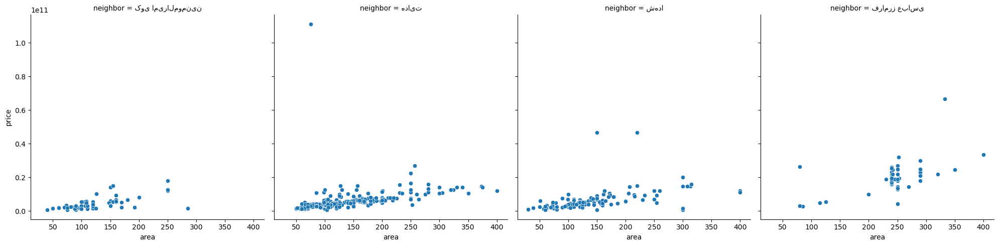

In [506]:
sns.relplot(data = region_2_vila, x = "area", y = "price", col = "neighbor")

### -

In [507]:
region_2_vila[(region_2_vila.price > .4e11 )].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
44765,فروش ویلایی,75.0,منطقه 2 محله هدایت خیابان مطهری شمالی,خانه ویلایی مسکونی تجاری\r\nبا سلام خانه ویلا...,36.316310,59.608390,22.0,0.0,2.0,1.111111e+11,2.0,هدایت,مطهری شمالی,0.0
21765,فروش ویلایی,150.0,منطقه 2 محله شهدا خیابان هاشمی نژاد,واحد آپارتمان ،صفر،میدان شهدا\r\nموقعیت مکا...,36.301280,59.614650,0.0,0.0,5.0,4.680000e+10,2.0,شهدا,هاشمی نژاد,0.0
41964,فروش ویلایی,220.0,منطقه 2 محله شهدا خیابان شیرازی,ویلایی واحدی *صفر* نزدیک به حرم\r\nبا عرض س...,36.293575,59.615646,0.0,0.0,5.0,4.680000e+10,2.0,شهدا,شیرازی,0.0
31507,فروش ویلایی,333.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,خانه ویلایی حاشیه بلوار فردوسی\r\nسلام\nحاشیه...,36.327670,59.548380,30.0,0.0,5.0,6.660000e+10,2.0,فرامرز عباسی,فرامرز عباسی,0.0


In [508]:
train_data.drop(region_2_vila[(region_2_vila.price > .4e11 )].sort_values("area").index[:4],inplace=True)

In [509]:
region_2_vila[(region_2_vila.area >= 800)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [510]:
train_data.drop(region_2_vila[(region_2_vila.area >= 800)].index,inplace=True)

In [511]:
region_2_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 2)]

### other

In [512]:
region_2_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 2)]

In [513]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 2) & 
((train_data.neighbor.str.contains("شهدا")) & (train_data.price < 1e10) & (train_data.area > 280)) | 
((train_data.neighbor.str.contains("هدایت")) & (train_data.price > 2e10)) |
((train_data.neighbor.str.contains("کوی")) & (train_data.area > 250))].index, inplace = True)

In [514]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 2) & 
((train_data.neighbor.str.contains("فرامرز")) & (train_data.area < 150 ))].iloc[-2:].index, inplace = True)

### other 2

In [515]:
region_2_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 2)]

In [516]:
# region_2_vila[(region_2_vila.neighbor.str.contains("فرامرز")) & (region_2_vila.area >= 250) & (region_2_vila.price < .5e10) | ].sort_values("price")

In [517]:
# region_2_vila[(region_2_vila.neighbor.str.contains("فرامرز")) & (region_2_vila.area < 150)].sort_values("price").iloc[:1]

In [518]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 2) & 
(train_data.neighbor.str.contains("فرامرز")) & (train_data.area >= 250) & (train_data.price < .5e10)].index,inplace = True)

## 3

In [519]:
region_3_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 3)]

In [520]:
region_3_vila[(region_3_vila.age < 3) & (region_3_vila.area > 300)].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
46194,فروش ویلایی,310.0,منطقه 3 محله گاز خیابان رسالت,خانه ویلایی دوخوابه زیر بنا متر تمیز ومرت...,36.30314,59.6338,2.0,0.0,2.0,1.000000e+09,3.0,گاز,رسالت,0.0


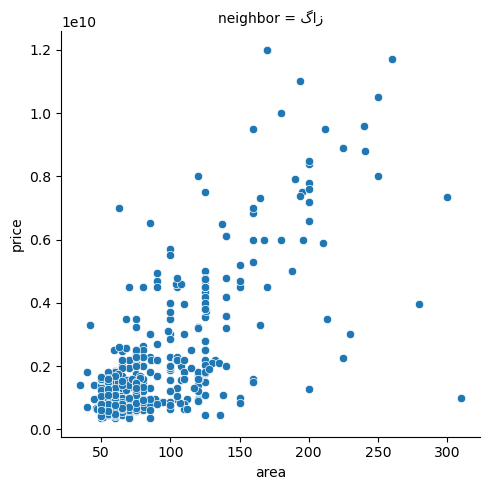

In [521]:
sns.relplot(data = region_3_vila.drop(region_3_vila[(region_3_vila.price > 1.5e10)].sort_values("price").index), x = "area", y = "price", col = "neighbor")

### --

In [522]:
region_3_vila[(region_3_vila.price >.8e11) | ((region_3_vila.area > 300) & (region_3_vila.price < .2e11))].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
13244,فروش ویلایی,60.0,منطقه 3 محله گاز خیابان رسالت,خانه ویلایی در رسالت متراژ \r\nقیمت توافقی ...,36.30314,59.633800,20.0,0.0,2.0,1.000000e+11,3.0,گاز,رسالت,0.0
27062,فروش ویلایی,100.0,منطقه 3 محله گاز خیابان گاز,خانه کلنگی\r\nخانه کلنگی ولی قابل نشیمن مناسب...,36.32071,59.628742,30.0,0.0,3.0,1.111111e+11,3.0,گاز,گاز,0.0
46194,فروش ویلایی,310.0,منطقه 3 محله گاز خیابان رسالت,خانه ویلایی دوخوابه زیر بنا متر تمیز ومرت...,36.30314,59.633800,2.0,0.0,2.0,1.000000e+09,3.0,گاز,رسالت,0.0


In [523]:
train_data.drop(region_3_vila[(region_3_vila.price >.8e11) | ((region_3_vila.area > 300) & (region_3_vila.price < .2e11))].index, inplace=True)

In [524]:
region_3_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 3)]

### other

In [525]:
region_3_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 3)]

In [526]:
region_3_vila[(region_3_vila.price > .8e10)].sort_values("price").iloc[-4:]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
21504,فروش ویلایی,170.0,منطقه 3 محله گاز خیابان طبرسی جنوبی,ویلایی متر داخل حاشیه طبرسی متر مغازه تجا...,36.309113,59.649284,16.0,0.0,4.0,1.200000e+10,3.0,گاز,طبرسی جنوبی,0.0
42707,فروش ویلایی,225.0,منطقه 3 محله گاز خیابان فاطمیه,حاشیه بلوار گاز\r\nملک حاشیه بلوار گاز است ده...,36.314380,59.626030,23.0,0.0,3.0,1.666667e+10,3.0,گاز,فاطمیه,0.0
25028,فروش ویلایی,300.0,منطقه 3 محله گاز خیابان گاز,حاشیه خیابان گاز هفتاد مترتجا ری دائم\r\nحاشی...,36.315080,59.632800,20.0,0.0,4.0,2.050000e+10,3.0,گاز,گاز,0.0
5429,فروش ویلایی,250.0,منطقه 3 محله گاز خیابان گاز,نمایشگاه اتومبیل\r\nمنزل ویلایی دوطبقه به همر...,36.315080,59.632800,22.0,0.0,3.0,2.070000e+10,3.0,گاز,گاز,0.0


In [527]:
train_data.loc[train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 3) & (train_data.price > .8e10)].sort_values("price").iloc[-4:].index]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
21504,فروش ویلایی,170.0,منطقه 3 محله گاز خیابان طبرسی جنوبی,ویلایی متر داخل حاشیه طبرسی متر مغازه تجا...,36.309113,59.649284,16.0,0.0,4.0,1.200000e+10,3.0,گاز,طبرسی جنوبی,0.0
42707,فروش ویلایی,225.0,منطقه 3 محله گاز خیابان فاطمیه,حاشیه بلوار گاز\r\nملک حاشیه بلوار گاز است ده...,36.314380,59.626030,23.0,0.0,3.0,1.666667e+10,3.0,گاز,فاطمیه,0.0
25028,فروش ویلایی,300.0,منطقه 3 محله گاز خیابان گاز,حاشیه خیابان گاز هفتاد مترتجا ری دائم\r\nحاشی...,36.315080,59.632800,20.0,0.0,4.0,2.050000e+10,3.0,گاز,گاز,0.0
5429,فروش ویلایی,250.0,منطقه 3 محله گاز خیابان گاز,نمایشگاه اتومبیل\r\nمنزل ویلایی دوطبقه به همر...,36.315080,59.632800,22.0,0.0,3.0,2.070000e+10,3.0,گاز,گاز,0.0


In [528]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 3) & (train_data.price > .8e10)].sort_values("price").iloc[-4:].index, inplace=True)

## 4

In [529]:
region_4_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 4)]

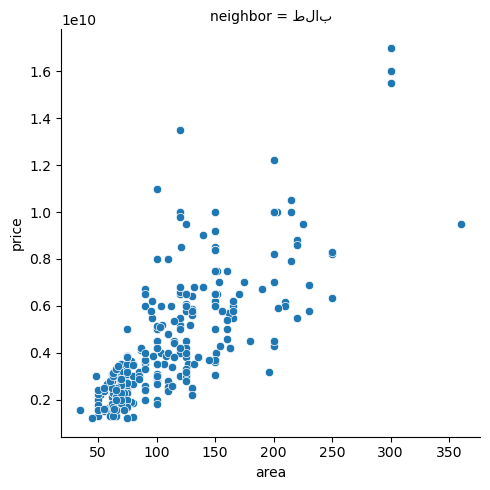

In [530]:
sns.relplot(data = region_4_vila.drop(region_4_vila[((region_4_vila.area  > 149) & (region_4_vila.price< .1e10)) | ((region_4_vila.price > 1.7e10) )].sort_values("price").index), x = "area", y = "price", col = "neighbor")

### --

In [531]:
region_4_vila[(region_4_vila.area > 800) ].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [532]:
train_data.drop(region_4_vila[(region_4_vila.area > 800) ].index, inplace=True)

In [533]:
# sns.kdeplot(train_data[(train_data.type.str.contains("ویلایی"))], x = "area", hue = "age")

In [534]:
region_4_vila[(region_4_vila.area > 500) & (region_4_vila.area <= 800) ].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [535]:
train_data.drop(region_4_vila[(region_4_vila.area > 500) & (region_4_vila.area <= 800) ].index, inplace=True)

In [536]:
region_4_vila[(region_4_vila.price > .4e11) ]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
20849,فروش ویلایی,198.0,منطقه 4 و 5 محله طلاب خیابان مفتح,خانه ویلایی سی متری طلاب\r\nموقعیت جغرافیایی ...,36.29603,59.6437,30.0,0.0,4.0,5.600000e+10,4.0,طلاب,مفتح,0.0


In [537]:
region_4_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 4)]

In [538]:
train_data.drop(region_4_vila[(region_4_vila.price > .4e11) ].index, inplace=True)

In [539]:
region_4_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 4)]

In [540]:
train_data.drop(region_4_vila[ ((region_4_vila.price > 1.9e10) | (region_4_vila.area >= 290) ) & (region_4_vila.description.notna()) & (region_4_vila.description.str.contains("تجاری"))].index, inplace=True)

### other

In [541]:
region_4_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 4)]

In [542]:
(region_4_vila[(region_4_vila.price > 1.7e10) ].sort_values("price"))

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
22128,فروش ویلایی,186.0,منطقه 4 و 5 محله طلاب خیابان مفتح,ویلایی طبقه روی همکف سند صفر هر واحد خواب\r\...,36.29603,59.64370,1.0,0.0,5.0,2.000000e+10,4.0,طلاب,مفتح,0.0
4542,فروش ویلایی,250.0,منطقه 4 و 5 محله طلاب خیابان علیمردانی,طبقه یکجاطلاب علیمردانی فول امکانات نزدیک به...,36.29977,59.63709,0.0,0.0,5.0,2.700000e+10,4.0,طلاب,علیمردانی,0.0


In [543]:
region_4_vila[(region_4_vila.area  > 149) & (region_4_vila.price< .1e10)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
16216,فروش ویلایی,150.0,منطقه 4 و 5 محله طلاب خیابان مفتح,خانه ویلایی متری\r\nبا سلام\nویلایی م...,36.29603,59.6437,27.0,0.0,4.0,500000000.0,4.0,طلاب,مفتح,0.0
16803,فروش ویلایی,300.0,منطقه 4 و 5 محله طلاب خیابان مفتح,ویلایی متری\r\n متر زمین متر زیربنا...,36.29603,59.6437,5.0,0.0,2.0,900000000.0,4.0,طلاب,مفتح,0.0


In [544]:
region_4_vila[((region_4_vila.area  > 149) & (region_4_vila.price< .1e10)) | ((region_4_vila.price > 1.7e10) )].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
16216,فروش ویلایی,150.0,منطقه 4 و 5 محله طلاب خیابان مفتح,خانه ویلایی متری\r\nبا سلام\nویلایی م...,36.29603,59.64370,27.0,0.0,4.0,5.000000e+08,4.0,طلاب,مفتح,0.0
16803,فروش ویلایی,300.0,منطقه 4 و 5 محله طلاب خیابان مفتح,ویلایی متری\r\n متر زمین متر زیربنا...,36.29603,59.64370,5.0,0.0,2.0,9.000000e+08,4.0,طلاب,مفتح,0.0
22128,فروش ویلایی,186.0,منطقه 4 و 5 محله طلاب خیابان مفتح,ویلایی طبقه روی همکف سند صفر هر واحد خواب\r\...,36.29603,59.64370,1.0,0.0,5.0,2.000000e+10,4.0,طلاب,مفتح,0.0
4542,فروش ویلایی,250.0,منطقه 4 و 5 محله طلاب خیابان علیمردانی,طبقه یکجاطلاب علیمردانی فول امکانات نزدیک به...,36.29977,59.63709,0.0,0.0,5.0,2.700000e+10,4.0,طلاب,علیمردانی,0.0


In [545]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 4) &
                (((train_data.area  > 149) & (train_data.price< .1e10)) | ((train_data.price > 1.7e10)))].index, inplace = True)

### other 2

In [546]:
region_4_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 4)]

## 6

In [547]:
region_6_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 6)]

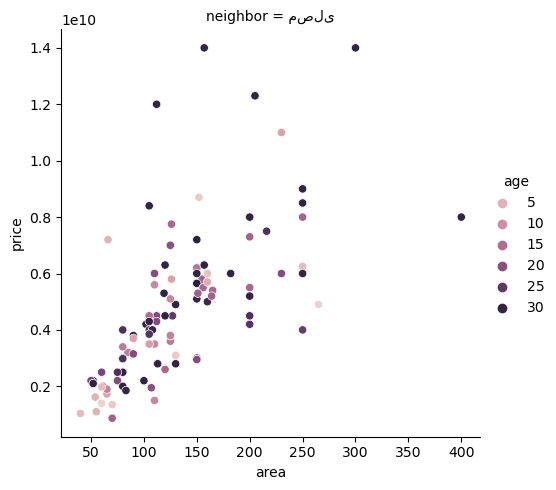

In [548]:
sns.relplot(data = region_6_vila, x = "area", y = "price", col = "neighbor", hue = "age")

### ----

In [549]:
region_6_vila[(region_6_vila.price > 1e10) ].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
37086,فروش ویلایی,230.0,منطقه 6 محله مصلی خیابان شیرودی,متر سرنبش\r\nسلام خانه ویلایی مترسرنب...,36.272680,59.622610,7.0,0.0,1.0,1.100000e+10,6.0,مصلی,شیرودی,0.0
25616,فروش ویلایی,112.0,منطقه 6 محله مصلی خیابان شیرودی,ویلایی دوبلکس،نزدیک حرم\r\nویلایی دوبلکس،یک خ...,36.269676,59.628660,30.0,0.0,3.0,1.200000e+10,6.0,مصلی,شیرودی,0.0
14512,فروش ویلایی,205.0,منطقه 6 محله مصلی خیابان مصلی,منزل ویلایی واقع درمصلی \r\nباسلام.منزل ویلا...,36.270720,59.635040,30.0,0.0,2.0,1.230000e+10,6.0,مصلی,مصلی,0.0
18150,فروش ویلایی,205.0,منطقه 6 محله مصلی خیابان مصلی,منزل ویلایی منطقه تجاری\r\nمنزل ویلایی مسکونی...,36.270720,59.635040,30.0,0.0,2.0,1.230000e+10,6.0,مصلی,مصلی,0.0
6113,فروش ویلایی,157.0,منطقه 6 محله مصلی خیابان مصلی,متر با متر حاشیه اصلی بلوار\r\n متر ز...,36.270720,59.635040,30.0,0.0,3.0,1.400000e+10,6.0,مصلی,مصلی,0.0
6737,فروش ویلایی,300.0,منطقه 6 محله مصلی خیابان مصلی,مسکونی تجاری واحدی با مغازه تجاری دائم\r\...,36.279697,59.629967,30.0,0.0,5.0,1.400000e+10,6.0,مصلی,مصلی,0.0


In [550]:
region_6_vila[(region_6_vila.area > 300) ]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
14601,فروش ویلایی,400.0,منطقه 6 محله مصلی خیابان محمد آباد,منزل مسکونی متر،دو ممر.\r\nسلام. این منزل ...,36.266567,59.637306,30.0,0.0,5.0,8.000000e+09,6.0,مصلی,محمد آباد,0.0


In [551]:
train_data.drop(region_6_vila[(region_6_vila.price > 1e10) | (region_6_vila.area >= 500)  ].index, inplace=True)

In [552]:
region_6_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 6)]

### other

In [553]:
region_6_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 6)]

In [554]:
region_6_vila[(region_6_vila.area < 100) & (region_6_vila.price > 7e9)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
40386,فروش ویلایی,66.0,منطقه 6 محله مصلی خیابان مصلی,خانه ویلایی پنج طبقه یکجا با هم\r\nسند تک برگ...,36.279976,59.628277,5.0,0.0,5.0,7.200000e+09,6.0,مصلی,مصلی,1.0


In [555]:
region_6_vila[(region_6_vila.description.notna()) & (region_6_vila.description.str.contains("تجاری"))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
27,فروش ویلایی,250.0,منطقه 6 محله مصلی خیابان مصلی,مصلی(بنی هاشم) مترتجاری دائم\r\nباسلام \nقو...,36.270720,59.635040,24.0,0.0,5.0,4.000000e+09,6.0,مصلی,مصلی,0.0
3384,فروش ویلایی,60.0,منطقه 6 محله مصلی خیابان کارمندان,ویلایی دوطبقه دربست رستمی \r\nبه نام خدا\nفر...,36.267352,59.645822,22.0,0.0,2.0,2.500000e+09,6.0,مصلی,کارمندان,0.0
4218,فروش ویلایی,200.0,منطقه 6 محله مصلی خیابان مصلی,متر تجاری مسکونی تراکم بالا مصلی \r\n ...,36.270720,59.635040,30.0,0.0,3.0,8.000000e+09,6.0,مصلی,مصلی,0.0
9005,فروش ویلایی,80.0,منطقه 6 محله مصلی خیابان مصلی,متر چهارراه مصلی آماده ی ساخت\r\nملک مورد...,36.277893,59.630974,27.0,0.0,2.0,4.000000e+09,6.0,مصلی,مصلی,0.0
14884,فروش ویلایی,120.0,منطقه 6 محله مصلی خیابان مصلی,خانه ویلایی مصلی (حاشیه)\r\n(توضیحات مهم)،...,36.270720,59.635040,30.0,0.0,2.0,6.300000e+09,6.0,مصلی,مصلی,0.0
30222,فروش ویلایی,126.0,منطقه 6 محله مصلی خیابان مصلی,ویلایی طبقه ماشین رو\r\nسلام \nلطفا با دقت ...,36.270720,59.635040,16.0,0.0,4.0,7.750000e+09,6.0,مصلی,مصلی,0.0
38582,فروش ویلایی,105.0,منطقه 6 محله مصلی خیابان محمد آباد,منزل ویلایی\r\nباسلام خدمت دوستان یک خانه دوط...,36.263507,59.638753,8.0,0.0,0.0,3.500000e+09,6.0,مصلی,محمد آباد,0.0
41782,فروش ویلایی,250.0,منطقه 6 محله مصلی خیابان مصلی,متر جنوبی، مصلی\r\nسلام\nملک جنوبی\n م...,36.270720,59.635040,30.0,0.0,3.0,9.000000e+09,6.0,مصلی,مصلی,0.0
42794,فروش ویلایی,250.0,منطقه 6 محله مصلی خیابان مصلی,منزل مسکونی واقع درمکانی نزدیک به حرم\r\nمنزل...,36.270720,59.635040,30.0,0.0,5.0,8.500000e+09,6.0,مصلی,مصلی,0.0
47781,فروش ویلایی,105.0,منطقه 6 محله مصلی خیابان مصلی,متر ویلایی نزدیک مصلی ٪ جواز تجاری و سا...,36.270720,59.635040,30.0,0.0,2.0,8.400000e+09,6.0,مصلی,مصلی,0.0


In [556]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 6) & 
((train_data.description.notna()) & (train_data.description.str.contains("تجاری")))].index,inplace = True)

In [557]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 6) & ((train_data.area < 100) & (train_data.price > 7e9))].index, inplace=True)

## 7

In [558]:
region_7_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 7)]

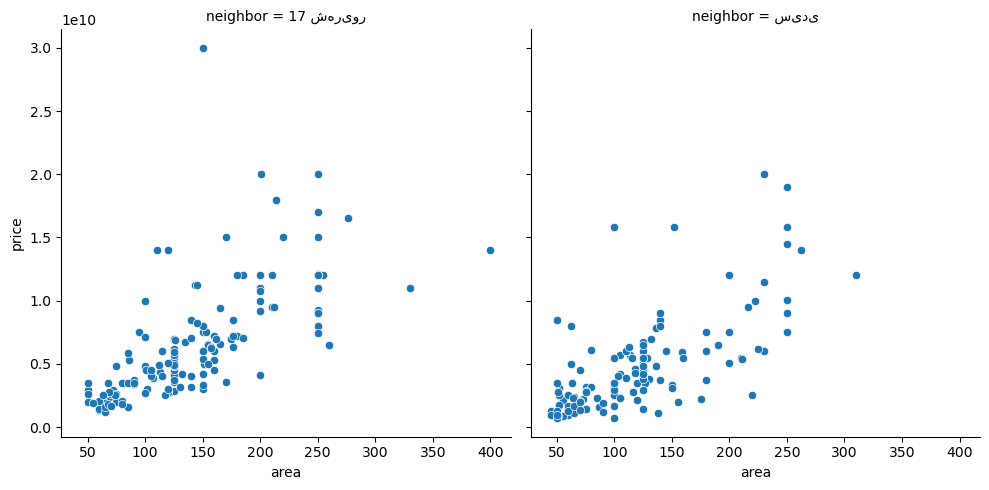

In [559]:
sns.relplot(data = region_7_vila, x = "area", y = "price", col = "neighbor")

### ---

In [560]:
region_7_vila[(region_7_vila.price > 2.7e10) | (region_7_vila.area > 600)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
3368,فروش ویلایی,150.0,منطقه 7 محله 17 شهریور خیابان هفده شهریور,ویلایی متر- شهریور-ضلع جنوبی بازاررضا\r\n*...,36.276045,59.617282,30.0,0.0,5.0,3.000000e+10,7.0,17 شهریور,هفده شهریور,0.0


In [561]:
region_7_vila[(region_7_vila.area > 600)].sort_values("area")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [562]:
train_data.drop(region_7_vila[(region_7_vila.price > 2.7e10) | (region_7_vila.area > 600)].index, inplace=True)

In [563]:
region_7_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 7)]

### other

In [564]:
region_7_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 7)]

In [565]:
region_7_vila[(region_7_vila.price > 1.25e10) & (region_7_vila.neighbor.str.contains("سیدی"))].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
26592,فروش ویلایی,262.0,منطقه 7 محله سیدی خیابان کوشش,خانه قاعم سند دار\r\nقاعم متراژ زمین ...,36.265280,59.609260,16.0,0.0,2.0,1.400000e+10,7.0,سیدی,کوشش,0.0
24575,فروش ویلایی,250.0,منطقه 7 محله سیدی خیابان کوشش,درکوشش زمین متر شمال با متر تجارتی\r...,36.265280,59.609260,12.0,0.0,4.0,1.450000e+10,7.0,سیدی,کوشش,0.0
27863,فروش ویلایی,100.0,منطقه 7 محله سیدی خیابان کوشش,مجموعه کوشش \r\nمجموعه واحدی \nچهار طبقه و...,36.265280,59.609260,5.0,0.0,2.0,1.580000e+10,7.0,سیدی,کوشش,0.0
43329,فروش ویلایی,152.0,منطقه 7 محله سیدی خیابان کوشش,ویلایی متر/مغازه تجاری / قباد\r\nسلام \...,36.266145,59.603182,30.0,0.0,2.0,1.580000e+10,7.0,سیدی,کوشش,0.0
43396,فروش ویلایی,250.0,منطقه 7 محله سیدی خیابان کوشش,خانه ویلایی متری با دو باب مغازه خیابان ...,36.265280,59.609260,10.0,0.0,4.0,1.580000e+10,7.0,سیدی,کوشش,0.0
40962,فروش ویلایی,250.0,منطقه 7 محله سیدی خیابان کوشش,ویلایی متر ، امام رضا \r\nویلایی\n م...,36.271618,59.604520,30.0,0.0,5.0,1.900000e+10,7.0,سیدی,کوشش,0.0
45926,فروش ویلایی,230.0,منطقه 7 محله سیدی خیابان کوشش,متر ویلایی در دو طبقه و متر تجاری دائم...,36.249954,59.597800,19.0,0.0,4.0,2.000000e+10,7.0,سیدی,کوشش,0.0


In [566]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 7) & 
(train_data.area < 70)].sort_values("price").iloc[-2:].index, inplace = True)

In [567]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 7) & 
((train_data.price > 1.25e10) & (train_data.neighbor.str.contains("سیدی")))].index, inplace = True)

### other 2

In [568]:
region_7_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 7)]

In [569]:
region_7_vila[(region_7_vila.neighbor.str.contains("17")) & (region_7_vila.price > 1.75e10)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
1247,فروش ویلایی,201.0,منطقه 7 محله 17 شهریور خیابان نواب صفوی,ویلایی متر نزدیک حرم مطهر و مجتمع تجاری آ...,36.284370,59.623318,30.0,0.0,2.0,2.000000e+10,7.0,17 شهریور,نواب صفوی,0.0
16497,فروش ویلایی,250.0,منطقه 7 محله 17 شهریور خیابان هفده شهریور,خانه ویلایی تمیز متری\r\nویلایی دلباز تمی...,36.270851,59.615579,21.0,0.0,3.0,2.000000e+10,7.0,17 شهریور,هفده شهریور,0.0
17066,فروش ویلایی,214.0,منطقه 7 محله 17 شهریور خیابان عنصری,زمین ویلایی خیابان امام رضا \r\nفروش نقدی م...,36.271771,59.607719,30.0,0.0,2.0,1.800000e+10,7.0,17 شهریور,عنصری,0.0
27741,فروش ویلایی,214.0,منطقه 7 محله 17 شهریور خیابان عنصری,زمین ویلایی خیابان امام رضا \r\nفروش نقدی م...,36.271771,59.607719,30.0,0.0,2.0,1.800000e+10,7.0,17 شهریور,عنصری,0.0


In [570]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 7) & 
               (train_data.neighbor.str.contains("17")) & (train_data.price > 1.75e10) ].index, inplace=True)

## 8

In [571]:
region_8_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 8)]

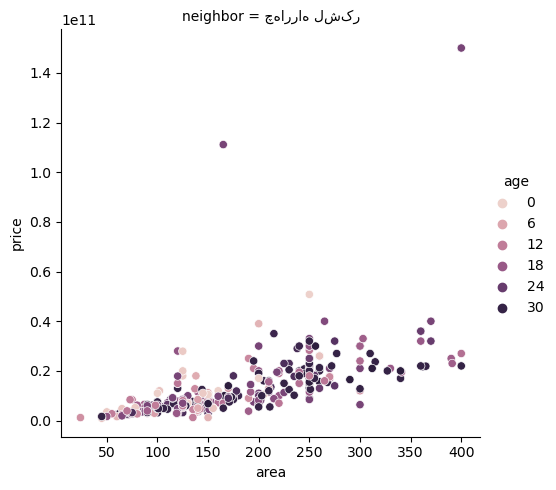

In [572]:
sns.relplot(data = region_8_vila.drop(region_8_vila[(region_8_vila.price < 0.5e10) & (region_8_vila.area > 200)].index), x = "area", y = "price", col = "neighbor", hue = "age")

### other3

In [573]:
region_8_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 8)]

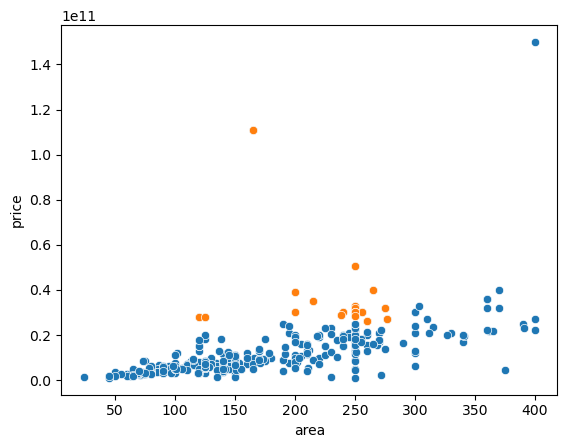

In [574]:
plot_area_price(region_8_vila, region_8_vila[(region_8_vila.price > 2.5e10) & (region_8_vila.area < 300)].sort_values("price", ascending=False))

### ---

In [575]:
train_data.drop(region_8_vila[(region_8_vila.price > 1e11)].index, inplace = True)

In [576]:
region_8_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 8)]

In [577]:
region_8_vila[(region_8_vila.area >= 750)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [578]:
train_data.drop(region_8_vila[(region_8_vila.area >= 750)].index, inplace=True)

In [579]:
region_8_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 8)]

### other

In [580]:
region_8_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 8)]

In [581]:
region_8_vila[(region_8_vila.price < 0.5e10) & (region_8_vila.area > 200)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
38381,فروش ویلایی,250.0,منطقه 8 محله چهارراه لشکر خیابان بلوار امام خ...,خانه متر با پروانه ساخت امام خمینی\r\nخانه ...,36.288100,59.600600,30.0,0.0,4.0,1.111111e+09,8.0,چهارراه لشکر,بلوار امام خمینی,0.0
45644,فروش ویلایی,230.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,خانه متر خیابان امام رضا\r\nسند ملکی \nتر...,36.272780,59.602730,30.0,0.0,3.0,1.200000e+09,8.0,چهارراه لشکر,امام رضا,0.0
41106,فروش ویلایی,272.0,منطقه 8 محله چهارراه لشکر خیابان بلوار امام خ...,متر ویلایی خیابان بهار ملک الشعرا\r\nقابل...,36.288100,59.600600,30.0,0.0,5.0,2.200000e+09,8.0,چهارراه لشکر,بلوار امام خمینی,0.0
47777,فروش ویلایی,210.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,خانه ویلایی\r\nخونه ویلایی دارای یه طبقه_ دار...,36.272780,59.602730,11.0,0.0,4.0,4.150000e+09,8.0,چهارراه لشکر,امام رضا,0.0
27180,فروش ویلایی,375.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,ملک درقم میباشد معاوضه با ملک مشهد دارم\r\nجه...,36.272780,59.602730,1.0,0.0,4.0,4.250000e+09,8.0,چهارراه لشکر,امام رضا,0.0
28383,فروش ویلایی,250.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,متری جنوبی سندملکی حاشیه \r\nمشاورین امل...,36.256534,59.621917,31.0,0.0,2.0,4.500000e+09,8.0,چهارراه لشکر,امام رضا,0.0
21500,فروش ویلایی,250.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,بسیج متر زمین ویلایی\r\nبسیج \nپلاک ...,36.272780,59.602730,28.0,0.0,3.0,4.800000e+09,8.0,چهارراه لشکر,امام رضا,0.0


In [582]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 8) & 
                ((train_data.price < 0.5e10) & (train_data.area > 200))].index, inplace = True)

In [583]:
region_8_vila.price.nlargest(1)

16242    5.080000e+10
Name: price, dtype: float64

In [584]:
# train_data.drop(10179, inplace=True)

In [585]:
region_8_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 8)]

### other 2

In [586]:
region_8_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 8)]

In [587]:
region_8_vila[region_8_vila.price > 3.8e10].iloc[:-1]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
10146,فروش ویلایی,265.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,سوئیت اپارتمان متر زمین با مغازه تجاری\r\n...,36.27278,59.60273,21.0,0.0,5.0,4.000000e+10,8.0,چهارراه لشکر,امام رضا,1.0
16242,فروش ویلایی,250.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,فروش یکجا/ واحد/خیابان امام رضا/\r\nکارشناسا...,36.27278,59.60273,0.0,0.0,5.0,5.080000e+10,8.0,چهارراه لشکر,امام رضا,0.0
29903,فروش ویلایی,200.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,هتل آپارتمان واحدی دو نبش\r\nسلام. \nاملاک ...,36.27278,59.60273,4.0,0.0,5.0,3.900000e+10,8.0,چهارراه لشکر,امام رضا,0.0


In [588]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 8) & 
(region_8_vila.price > 3.8e10)].iloc[:-1].index, inplace = True)

## 9

In [589]:
region_9_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9)]

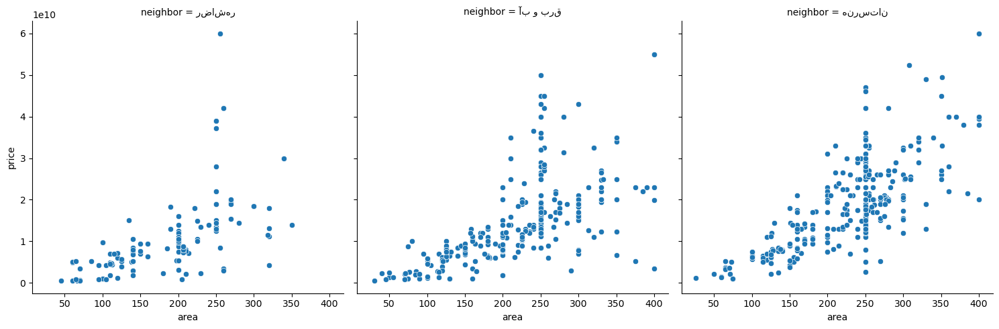

In [590]:
sns.relplot(data = region_9_vila, x = "area", y = "price", col = "neighbor")

In [591]:
region_9_vila[(region_9_vila.neighbor.str.contains("هنر")) & (region_9_vila.price > 4.3e10)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
17370,فروش ویلایی,350.0,منطقه 9 محله هنرستان خیابان هفت تیر,هفت تیر * ویلایی متری * مجموعه آبی\r\nبلو...,36.319780,59.494770,12.0,0.0,5.0,4.500000e+10,9.0,هنرستان,هفت تیر,0.0
36586,فروش ویلایی,250.0,منطقه 9 محله هنرستان خیابان کوثر جنوبی,باهنر مترزمین متر بنا\r\n متر زمین ...,36.306322,59.507546,12.0,0.0,5.0,4.600000e+10,9.0,هنرستان,کوثر جنوبی,0.0
27909,فروش ویلایی,250.0,منطقه 9 محله هنرستان خیابان کوثر جنوبی,ویلایی باهنر\r\nبهترین میلان باهنر \n متر ...,36.306322,59.507546,12.0,0.0,5.0,4.700000e+10,9.0,هنرستان,کوثر جنوبی,0.0
38127,فروش ویلایی,330.0,منطقه 9 محله هنرستان خیابان هاشمیه,ویلایی دوبلکس شاهکار،اول هاشمیه،لاله\r\nتاپ ل...,36.310605,59.504477,13.0,0.0,5.0,4.900000e+10,9.0,هنرستان,هاشمیه,0.0
1121,فروش ویلایی,351.0,منطقه 9 محله هنرستان خیابان هفت تیر,ویلایی متری(با واحد متری)اوایل حافظ\r\n{{...,36.319780,59.494770,12.0,0.0,4.0,4.950000e+10,9.0,هنرستان,هفت تیر,0.0
6516,فروش ویلایی,308.0,منطقه 9 محله هنرستان خیابان کوثر جنوبی,ویلایی اوایل کوثر، باهنر، لاله، هاشمیه - وکیل...,36.306322,59.507546,21.0,0.0,4.0,5.230000e+10,9.0,هنرستان,کوثر جنوبی,1.0
1050,فروش ویلایی,400.0,منطقه 9 محله هنرستان خیابان هاشمیه,هاشمیه ویلایی با پروانه\r\nبهترین لوکیشن هاشم...,36.310605,59.504477,27.0,0.0,4.0,6.000000e+10,9.0,هنرستان,هاشمیه,0.0


### -

In [592]:
# region_9_vila[(region_9_vila.area > 600)].sort_values("price")

In [593]:
region_9_vila[(region_9_vila.area >= 600) & (region_9_vila.neighbor.str.contains("آب و برق")) & (region_9_vila.price < 1.7e10)].sort_values("price")
region_9_vila[(region_9_vila.area >= 400) & (region_9_vila.neighbor == "هنرستان") & (region_9_vila.price < 0.3e10)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [594]:
region_9_vila[(region_9_vila.area >= 400) & (region_9_vila.neighbor == "هنرستان") & (region_9_vila.price < 0.3e10)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [595]:
region_9_vila[(region_9_vila.area >= 600) & (region_9_vila.neighbor == "هنرستان") & (region_9_vila.price < .32e11)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [596]:
train_data.drop(region_9_vila[(region_9_vila.area >= 600) & (region_9_vila.neighbor == "هنرستان") & (region_9_vila.price < .32e11)].index,
               inplace=True)

In [597]:
region_9_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9)]

In [598]:
region_9_vila[(region_9_vila.price >= .75e11) & (region_9_vila.neighbor == "هنرستان")].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [599]:
train_data.drop(region_9_vila[(region_9_vila.price >= .75e11) & (region_9_vila.neighbor == "هنرستان")].index, inplace=True)

In [600]:
region_9_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9)]

In [601]:
region_9_vila[(region_9_vila.price >= 1.25e11) & (region_9_vila.neighbor == "آب و برق")].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [602]:
train_data.drop(region_9_vila[(region_9_vila.price >= 1.25e11) & (region_9_vila.neighbor == "آب و برق")].index, inplace=True)

In [603]:
region_9_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9)]

In [604]:
region_9_vila[(region_9_vila.area >= 600) & (region_9_vila.neighbor.str.contains("آب و برق")) & (region_9_vila.price < 1.7e10)].sort_values("price")
region_9_vila[(region_9_vila.area >= 400) & (region_9_vila.neighbor == "هنرستان") & (region_9_vila.price < 0.3e10)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [605]:
train_data.drop(region_9_vila[(region_9_vila.area >= 600) & (region_9_vila.neighbor.str.contains("آب و برق")) & (region_9_vila.price < 1.7e10)].index,inplace=True)

In [606]:
region_9_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9)]

In [607]:
train_data.drop(region_9_vila[(region_9_vila.area >= 400) & (region_9_vila.neighbor == "هنرستان") & (region_9_vila.price < 0.3e10)].index,inplace=True)

### other

In [608]:
region_9_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9)]

In [609]:
# show_description(region_9_vila[(region_9_vila.neighbor.str.contains("آب")) & ((region_9_vila.area > 200) &  (region_9_vila.area < 300)) & (region_9_vila.price > 2.3e10)].sort_values("price"))

In [610]:
region_9_vila[(region_9_vila.neighbor.str.contains("آب")) & ((region_9_vila.area > 800) |  (region_9_vila.price > 8e10))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [611]:
region_9_vila[(region_9_vila.neighbor.str.contains("رضاشهر")) & (((region_9_vila.price < .5e10) & (region_9_vila.area > 400)) | (region_9_vila.price > 3.5e10))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
370,فروش ویلایی,260.0,منطقه 9 محله رضاشهر خیابان باهنر,ویلایی تراکم زیاد دونبش\r\nبنام خداوندبخشنده ...,36.315256,59.525500,28.0,0.0,2.0,4.200000e+10,9.0,رضاشهر,باهنر,0.0
3287,فروش ویلایی,260.0,منطقه 9 محله رضاشهر خیابان باهنر,ویلایی تراکم زیاد دونبش\r\nبنام خداوندبخشنده ...,36.315256,59.525500,17.0,0.0,3.0,4.200000e+10,9.0,رضاشهر,باهنر,0.0
3369,فروش ویلایی,250.0,منطقه 9 محله رضاشهر خیابان باهنر,ویلایی متری نزدیک حاشیه باهنر\r\nبا سلام ...,36.315256,59.525500,17.0,0.0,4.0,3.720000e+10,9.0,رضاشهر,باهنر,0.0
8857,فروش ویلایی,250.0,منطقه 9 محله رضاشهر خیابان باهنر,متر ویلایی /دوبلکس/اول کوثر شمالی/باهنرمعا...,36.315256,59.525500,26.0,0.0,4.0,3.900000e+10,9.0,رضاشهر,باهنر,0.0
21251,فروش ویلایی,250.0,منطقه 9 محله رضاشهر خیابان باهنر,ویلایی متری باهنر با پروانه\r\nبا سلام \n...,36.315256,59.525500,17.0,0.0,5.0,3.900000e+10,9.0,رضاشهر,باهنر,0.0
33369,فروش ویلایی,255.0,منطقه 9 محله رضاشهر خیابان رضاشهر,ویلایی واحدی -صفر-فول-رضوی\r\nسلام عرض ادب\n...,36.293081,59.535418,0.0,0.0,5.0,6.000000e+10,9.0,رضاشهر,رضاشهر,0.0


In [612]:
region_9_vila[(region_9_vila.neighbor.str.contains("هنرس")) & (region_9_vila.area > 600)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [613]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9) & 
((train_data.neighbor.str.contains("آب")) & ((train_data.area > 800) |  (train_data.price > 8e10)))].index,inplace = True)

In [614]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9) & 
((train_data.neighbor.str.contains("رضاشهر")) & (((train_data.price < .5e10) & (train_data.area > 400)) | (train_data.price > 3.5e10)))].index,inplace = True)

In [615]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9) & 
((train_data.neighbor.str.contains("هنرس")) & (train_data.area > 600))].index,inplace = True)

### other 2

In [616]:
region_9_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9)]

In [617]:
region_9_vila[(region_9_vila.neighbor.str.contains("هنرستان")) & ((region_9_vila.price > 5.5e10) | (region_9_vila.area < 60))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
1050,فروش ویلایی,400.0,منطقه 9 محله هنرستان خیابان هاشمیه,هاشمیه ویلایی با پروانه\r\nبهترین لوکیشن هاشم...,36.310605,59.504477,27.0,0.0,4.0,6.000000e+10,9.0,هنرستان,هاشمیه,0.0
25727,فروش ویلایی,26.0,منطقه 9 محله هنرستان خیابان هفت تیر,دوبلکس سند شش دانگ معاوضه با خودرو\r\nسلام\nم...,36.311234,59.480824,7.0,0.0,1.0,1.250000e+09,9.0,هنرستان,هفت تیر,0.0
29594,فروش ویلایی,50.0,منطقه 9 محله هنرستان خیابان هفت تیر,متردونبش ویلاهفت تیر\r\n متر زمین دونبش \n...,36.319780,59.494770,0.0,0.0,1.0,2.100000e+09,9.0,هنرستان,هفت تیر,0.0


In [618]:
region_9_vila[(region_9_vila.neighbor.str.contains("رضا")) & (region_9_vila.price > 2.5e10)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
33054,فروش ویلایی,340.0,منطقه 9 محله رضاشهر خیابان سرافرازان,متر خ متر تجاری دائم\r\n⚜️کارگزاری املا...,36.290086,59.502946,7.0,0.0,3.0,3.000000e+10,9.0,رضاشهر,سرافرازان,0.0
34648,فروش ویلایی,250.0,منطقه 9 محله رضاشهر خیابان باهنر,ویلایی اوایل باهنر\r\nبنام خداوندبخنشده مهربا...,36.315256,59.525500,16.0,0.0,3.0,2.800000e+10,9.0,رضاشهر,باهنر,0.0


In [619]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9) & 
(train_data.neighbor.str.contains("هنرستان")) & ((train_data.price > 5.5e10) | (train_data.area < 60))].index, inplace = True)

In [620]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9) & 
(train_data.neighbor.str.contains("رضا")) & (train_data.price > 2.5e10)].index, inplace = True)

### other 3

In [621]:
region_9_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9)]

In [622]:
region_9_vila[(region_9_vila.description.notna()) & (region_9_vila.neighbor.str.contains("برق")) & (region_9_vila.area > 300) & (region_9_vila.price < 1e10)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
27627,فروش ویلایی,400.0,منطقه 9 محله آب و برق خیابان برونسی,متر\r\nهاشیه آبرده یلاق روبروی. ستوران...,36.326765,59.463926,2.0,0.0,1.0,3.500000e+09,9.0,آب و برق,برونسی,0.0
15357,فروش ویلایی,375.0,منطقه 9 محله آب و برق خیابان برونسی,مجتمع پرستو،ویلای نوساز استخردار\r\nمحیطی امن...,36.326765,59.463926,0.0,0.0,2.0,5.200000e+09,9.0,آب و برق,برونسی,0.0
11590,فروش ویلایی,350.0,منطقه 9 محله آب و برق خیابان صیاد شیرازی,فکوری صیاد متر ویلایی دربست طبقه\r\n واحدی...,36.332341,59.485542,20.0,0.0,5.0,6.700000e+09,9.0,آب و برق,صیاد شیرازی,0.0


In [623]:
region_9_vila[(region_9_vila.description.notna()) & (region_9_vila.street.str.contains("کوثر جنوبی")) & (region_9_vila.description.str.contains("کوثر شمالی"))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
4219,فروش ویلایی,250.0,منطقه 9 محله هنرستان خیابان کوثر جنوبی,ویلایی متر ، کوثر شمالی، با پروانه\r\n***...,36.306322,59.507546,22.0,0.0,5.0,4.200000e+10,9.0,هنرستان,کوثر جنوبی,0.0
6470,فروش ویلایی,150.0,منطقه 9 محله هنرستان خیابان کوثر جنوبی,ویلایی حاشیه کوثر شمالی همراه با متر مغازه...,36.310733,59.510761,17.0,0.0,5.0,1.800000e+10,9.0,هنرستان,کوثر جنوبی,0.0
6516,فروش ویلایی,308.0,منطقه 9 محله هنرستان خیابان کوثر جنوبی,ویلایی اوایل کوثر، باهنر، لاله، هاشمیه - وکیل...,36.306322,59.507546,21.0,0.0,4.0,5.230000e+10,9.0,هنرستان,کوثر جنوبی,1.0
7701,فروش ویلایی,265.0,منطقه 9 محله هنرستان خیابان کوثر جنوبی,ویلایی دوبلکس متر/قلب کوثر شمالی/روف گارد...,36.306322,59.507546,17.0,0.0,5.0,2.600000e+10,9.0,هنرستان,کوثر جنوبی,0.0
11333,فروش ویلایی,270.0,منطقه 9 محله هنرستان خیابان کوثر جنوبی,هایپر سازه ویلایی *کوثرشمالی/دوبلکس\r\nبه نام...,36.306322,59.507546,0.0,0.0,5.0,2.600000e+10,9.0,هنرستان,کوثر جنوبی,0.0
12891,فروش ویلایی,255.0,منطقه 9 محله هنرستان خیابان کوثر جنوبی,ویلایی متری-دونبش-تراکم زیاد-کوثر شمالی\r\n...,36.306322,59.507546,27.0,0.0,5.0,3.250000e+10,9.0,هنرستان,کوثر جنوبی,0.0
14206,فروش ویلایی,370.0,منطقه 9 محله هنرستان خیابان کوثر جنوبی,ویلایی متر حاشیه کوثر شمالی معاوضه با واحد...,36.313675,59.512142,17.0,0.0,2.0,4.000000e+10,9.0,هنرستان,کوثر جنوبی,0.0
14959,فروش ویلایی,127.0,منطقه 9 محله هنرستان خیابان کوثر جنوبی,خانه ویلایی دو طبقه نوساز شیک\r\nامتیازات جدا...,36.306322,59.507546,0.0,0.0,4.0,8.100000e+09,9.0,هنرستان,کوثر جنوبی,0.0
18814,فروش ویلایی,255.0,منطقه 9 محله هنرستان خیابان کوثر جنوبی,* متر ویلایی * اوایل کوثر شمالی *\r\nسلام...,36.306322,59.507546,12.0,0.0,5.0,3.300000e+10,9.0,هنرستان,کوثر جنوبی,0.0
22502,فروش ویلایی,160.0,منطقه 9 محله هنرستان خیابان کوثر جنوبی,ویلایی کوثر شمالی\r\n زمین در دوطبقه \nهمکف...,36.306322,59.507546,24.0,0.0,4.0,1.050000e+10,9.0,هنرستان,کوثر جنوبی,0.0


In [624]:
region_9_vila[(region_9_vila.neighbor.str.contains("هنر")) & (region_9_vila.area > 360) & (region_9_vila.price < 3e10)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
24878,فروش ویلایی,385.0,منطقه 9 محله هنرستان خیابان هنرستان,فروش ویلایی در فکوری (نسترن)\r\nبا سلام خدمت...,36.313811,59.500077,22.0,0.0,2.0,2.150000e+10,9.0,هنرستان,هنرستان,0.0
43087,فروش ویلایی,400.0,منطقه 9 محله هنرستان خیابان هاشمیه,خریدار ویلایی یازمین\r\nخریدار نقدی \nاز می...,36.310605,59.504477,4.0,0.0,3.0,2.000000e+10,9.0,هنرستان,هاشمیه,0.0


In [625]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9) & 
(train_data.description.notna()) & (train_data.neighbor.str.contains("برق")) & ((train_data.price > 3e10) | ( (train_data.area > 300) & (train_data.price < 1e10)))].index, inplace = True)

In [626]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9) & 
(train_data.description.notna()) & (train_data.street.str.contains("کوثر جنوبی")) & (train_data.description.str.contains("کوثر شمالی"))].index, inplace = True)

In [627]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 9) & 
(train_data.neighbor.str.contains("هنر")) & (train_data.area > 360) & (train_data.price < 3e10)].index, inplace = True)

In [628]:
train_data.drop(21209,inplace=True)

## 10

In [629]:
region_10_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 10)]

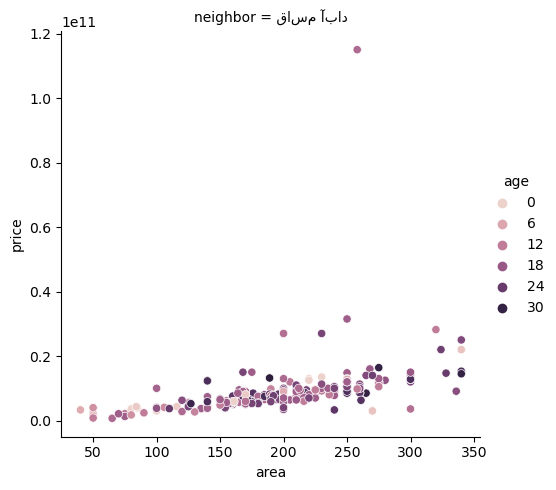

In [630]:
sns.relplot(data = region_10_vila, x = "area", y = "price", col = "neighbor",hue = "age")

### ---

In [631]:
# region_10_vila[(region_10_vila.area < 300)].sort_values("price", ascending=False).head(20)

In [632]:
region_10_vila[(region_10_vila.price > .2e11)].drop(11431)

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
2761,فروش ویلایی,340.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,ویلایی حاشیه متر دونبش\r\nسلام دوست عزیز ...,36.36002,59.5174,2.0,0.0,3.0,2.200000e+10,10.0,قاسم آباد,قاسم آباد,0.0
5561,فروش ویلایی,230.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,متر زمین / دارای سقف پروانه /بلوار شری...,36.36002,59.5174,22.0,0.0,5.0,2.700000e+10,10.0,قاسم آباد,قاسم آباد,1.0
10828,فروش ویلایی,320.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,ویلایی واحد+ واحدمغازه تجاری حاشیه اصلی دانگ\...,36.36002,59.5174,12.0,0.0,5.0,2.820000e+10,10.0,قاسم آباد,قاسم آباد,0.0
16880,فروش ویلایی,258.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,اندیشه دومَمر متر سقف پروانه\r\n♦️فروش یام...,36.36002,59.5174,15.0,0.0,5.0,1.150000e+11,10.0,قاسم آباد,قاسم آباد,0.0
38531,فروش ویلایی,250.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,مترعرصه شمالی تراکم زیاداوایل هاشمیه قبل ص...,36.36002,59.5174,17.0,0.0,5.0,3.150000e+10,10.0,قاسم آباد,قاسم آباد,0.0
39525,فروش ویلایی,324.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,دانگ ملکی\r\n متر تجاری داِِیم در دو دهنه...,36.36002,59.5174,23.0,0.0,2.0,2.200000e+10,10.0,قاسم آباد,قاسم آباد,0.0
43414,فروش ویلایی,200.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,ویلایی با متر تجاری دائم/چهارراه مخابرات\r\n...,36.36002,59.5174,14.0,0.0,2.0,2.700000e+10,10.0,قاسم آباد,قاسم آباد,0.0


In [633]:
train_data.drop(region_10_vila[(region_10_vila.price > .2e11)].drop(11431).index, inplace=True)

In [634]:
region_10_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 10)]

In [635]:
region_10_vila[(region_10_vila.area >= 500)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [636]:
train_data.drop(region_10_vila[(region_10_vila.area >= 500)].index, inplace=True)

### other

In [637]:
region_10_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 10)]

In [638]:
region_10_vila[(region_10_vila.area > 400)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [639]:
region_10_vila[(region_10_vila.price > 2e10)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
11431,فروش ویلایی,340.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,ویلایی دربست سه طبقه/ حاشیه بلوار فلاحی\r\n✔️...,36.36002,59.5174,21.0,0.0,5.0,2.500000e+10,10.0,قاسم آباد,قاسم آباد,0.0


In [640]:
region_10_vila[(region_10_vila.price > .9e10) & (region_10_vila.area < 200)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
16784,فروش ویلایی,165.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,متر /سر نبش\r\nبا سلام.\n\n متر سر نبش...,36.36002,59.5174,18.0,0.0,4.0,9.500000e+09,10.0,قاسم آباد,قاسم آباد,0.0
22125,فروش ویلایی,190.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,متر بنا / ممر / معاوضه ای\r\nویلایی \n ...,36.36002,59.5174,11.0,0.0,3.0,9.800000e+09,10.0,قاسم آباد,قاسم آباد,0.0
19556,فروش ویلایی,100.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,ساختمان واحدی یکجا + متر تجاری / حاشیه ن...,36.36002,59.5174,16.0,0.0,5.0,1.000000e+10,10.0,قاسم آباد,قاسم آباد,0.0
31853,فروش ویلایی,140.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,متر دوممر با پروانه سقف\r\nسلام ملک فوق...,36.36002,59.5174,27.0,0.0,2.0,1.230000e+10,10.0,قاسم آباد,قاسم آباد,0.0
15432,فروش ویلایی,140.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,پروانه تصویه شده\r\n متر زمین\n متر بنا...,36.36002,59.5174,7.0,0.0,3.0,1.250000e+10,10.0,قاسم آباد,قاسم آباد,0.0
35951,فروش ویلایی,189.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,منز تجاری و مسکونی\r\nمنزل ویلایی قدیمی ساز ق...,36.36002,59.5174,31.0,0.0,2.0,1.320000e+10,10.0,قاسم آباد,قاسم آباد,0.0
24563,فروش ویلایی,175.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,واحد مسکونی و واحد تجاری یکجا،فروش یا معاوضه...,36.36002,59.5174,17.0,0.0,5.0,1.500000e+10,10.0,قاسم آباد,قاسم آباد,0.0
45967,فروش ویلایی,168.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,متر ویلایی دو کله حاشیه شریعتی قاسم آباد ...,36.36002,59.5174,22.0,0.0,4.0,1.500000e+10,10.0,قاسم آباد,قاسم آباد,0.0


### other 2

In [641]:
region_10_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 10)]

## 11

In [642]:
region_11_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 11)]

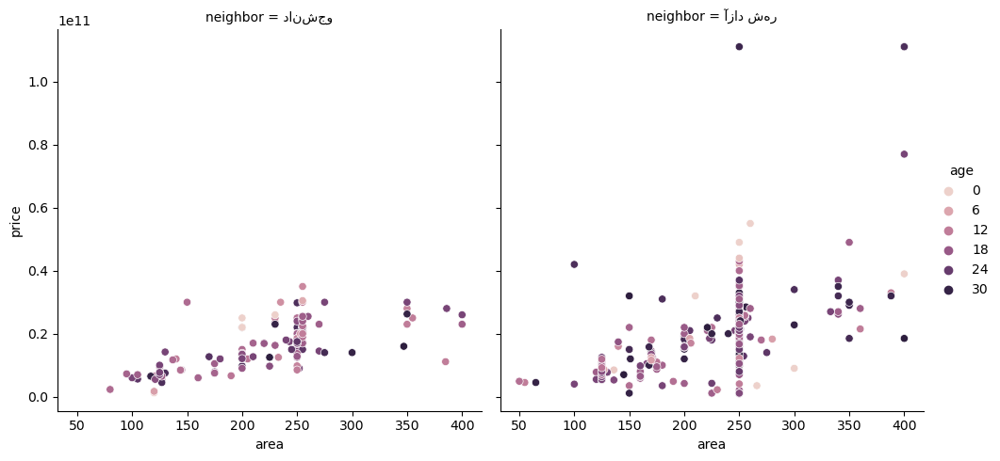

In [643]:
sns.relplot(data = region_11_vila, x = "area", y = "price", col = "neighbor", hue = "age")

In [644]:
region_11_vila[(region_11_vila.description.notna()) & (region_11_vila.description.str.contains("تراکم زیاد"))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
410,فروش ویلایی,250.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,متر فرهنگ معاوضه با آپارتمان/تراکم زیاد عر...,36.328550,59.513390,27.0,0.0,5.0,1.850000e+10,11.0,آزاد شهر,فرهنگ,0.0
487,فروش ویلایی,250.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,متری دانش اموز جنوبی تراکم زیاد تهاتر کام...,36.340786,59.514538,21.0,0.0,5.0,2.000000e+10,11.0,آزاد شهر,فرهنگ,0.0
923,فروش ویلایی,250.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,متر تراکم زیاد گونه شمالی/جلال قبل ازآمو...,36.327540,59.527520,17.0,0.0,3.0,2.050000e+10,11.0,آزاد شهر,آزادشهر,0.0
1070,فروش ویلایی,250.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,ویلایی جلال/جنوبی/تراکم زیاد\r\nبا سلام\n\n ...,36.328550,59.513390,22.0,0.0,3.0,2.100000e+10,11.0,آزاد شهر,فرهنگ,0.0
2036,فروش ویلایی,355.0,منطقه 11 محله دانشجو خیابان فارغ التحصیلان,متر ویلایی فارغ التحصیلان در سه طبقه\r\nوی...,36.341128,59.470517,12.0,0.0,5.0,2.500000e+10,11.0,دانشجو,فارغ التحصیلان,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46635,فروش ویلایی,255.0,منطقه 11 محله دانشجو خیابان دانشجو,ویلایی متر/تراکم زیاد قابل سکونت/ابوالفضل ...,36.328518,59.509500,17.0,0.0,3.0,2.550000e+10,11.0,دانشجو,دانشجو,0.0
46906,فروش ویلایی,95.0,منطقه 11 محله دانشجو خیابان صدف,ویلایی دانگ تراکمزیادمیلان متراسکلت آهن بلوا...,36.340256,59.495407,16.0,0.0,2.0,7.250000e+09,11.0,دانشجو,صدف,0.0
47296,فروش ویلایی,340.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,ویلایی متر/جلال با متر حاشیه تراکم زی...,36.328550,59.513390,29.0,0.0,4.0,3.500000e+10,11.0,آزاد شهر,فرهنگ,0.0
47591,فروش ویلایی,125.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,متر زمین متر بنا شمالی تراکم زیاد سید...,36.328550,59.513390,20.0,0.0,2.0,8.000000e+09,11.0,آزاد شهر,فرهنگ,0.0


In [645]:
# show_description(region_11_vila[(region_11_vila.neighbor.str.contains("آزاد شهر")) & (region_11_vila.price > 3.5e10)].sort_values("price"))

### --

In [646]:
region_11_vila[(region_11_vila.area >= 600) & (region_11_vila.neighbor == "آزاد شهر") & (region_11_vila.price < .2e11)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [647]:
train_data.drop(region_11_vila[(region_11_vila.area >= 600) & (region_11_vila.neighbor == "آزاد شهر") & (region_11_vila.price < .2e11)].index, inplace=True)

In [648]:
region_11_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 11)]

In [649]:
region_11_vila[(region_11_vila.neighbor == "آزاد شهر") & (region_11_vila.price > .6e11)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
9156,فروش ویلایی,400.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,ویلایی مترزیربنا/حاشیه معلم/مناسب کلیه مشاغ...,36.327540,59.52752,22.0,0.0,5.0,7.700000e+10,11.0,آزاد شهر,آزادشهر,0.0
9028,فروش ویلایی,400.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,ویلایی دونبش تجاری دائم وکیل آباد \r\nسلام عل...,36.320206,59.52849,30.0,0.0,5.0,1.111111e+11,11.0,آزاد شهر,آزادشهر,0.0
22984,فروش ویلایی,250.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,ویلایی متری امامت فروشی\r\nویلایی متری ...,36.327540,59.52752,29.0,0.0,3.0,1.111111e+11,11.0,آزاد شهر,آزادشهر,0.0
31108,فروش ویلایی,400.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,ویلایی متر دونبش ( اواسط جلال سروش معاوضه...,36.328550,59.51339,27.0,0.0,5.0,1.111111e+11,11.0,آزاد شهر,فرهنگ,0.0


In [650]:
train_data.drop(region_11_vila[(region_11_vila.neighbor == "آزاد شهر") & (region_11_vila.price > .6e11)].index, inplace=True)

### other

In [651]:
region_11_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 11)]

<Axes: ylabel='Frequency'>

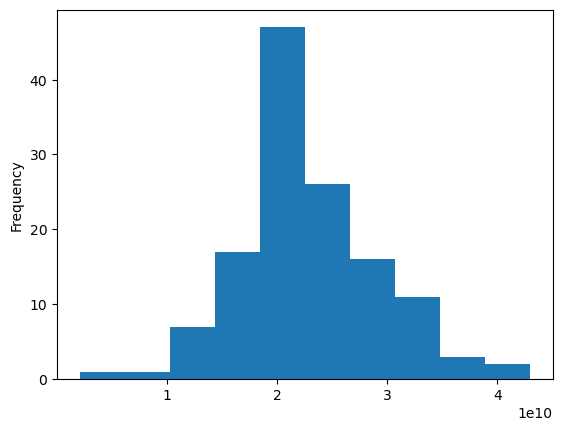

In [652]:
region_11_vila[(region_11_vila.neighbor.str.contains("آزاد")) & (region_11_vila.area > 230) & (region_11_vila.area < 270) & (region_11_vila.description.notna()) & (region_11_vila.description.str.contains("تراکم"))].price.plot.hist()

In [653]:
# show_description(region_11_vila[(region_11_vila.description.notna()) & (region_11_vila.description.str.contains("تراکم"))].sort_values("price"),
#                 sample_=10)

In [654]:
# show_description(region_11_vila[(region_11_vila.neighbor.str.contains("آزاد")) & (region_11_vila.area > 220) & (region_11_vila.area < 280) & (region_11_vila.price > 4e10)].sort_values("price"))

In [655]:
region_11_vila[(region_11_vila.neighbor.str.contains("آزاد")) & (region_11_vila.price < .5e10) & (region_11_vila.area > 120)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
13330,فروش ویلایی,250.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,ویلایی جنوبی سرنبش سقف پروانه تسویه شده\r\nد...,36.328550,59.513390,21.0,0.0,4.0,1.000000e+09,11.0,آزاد شهر,فرهنگ,0.0
13239,فروش ویلایی,250.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,خریدار ویلایی کلنگی متر به بالا محدوده وکیل...,36.331060,59.511284,2.0,0.0,5.0,1.111111e+09,11.0,آزاد شهر,فرهنگ,0.0
15786,فروش ویلایی,225.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,متر ویلایی کلنگی فرهنگ \r\nحاشیه فرهنگ\...,36.329094,59.513023,17.0,0.0,3.0,1.111111e+09,11.0,آزاد شهر,فرهنگ,0.0
46589,فروش ویلایی,150.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,ویلا متری حاشیه فرهنگ متر تجاری دائم\r...,36.327305,59.523952,30.0,0.0,3.0,1.111111e+09,11.0,آزاد شهر,فرهنگ,0.0
47203,فروش ویلایی,250.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,ویلایی متری\r\nویلایی متری ،شمالی،دو ...,36.328550,59.513390,21.0,0.0,2.0,1.111111e+09,11.0,آزاد شهر,فرهنگ,0.0
8843,فروش ویلایی,250.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,/ویلایی مناسب ساخت وساز /محدوده سیدرضی\r\nبا ...,36.328550,59.513390,18.0,0.0,4.0,2.050000e+09,11.0,آزاد شهر,فرهنگ,0.0
36437,فروش ویلایی,230.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,پیچ ساغروان/ متر/مسکونی تجاری\r\nسلام و درو...,36.327540,59.527520,12.0,0.0,1.0,2.222222e+09,11.0,آزاد شهر,آزادشهر,0.0
554,فروش ویلایی,180.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,ویلایی. متری سید رضی \...,36.328550,59.513390,22.0,0.0,2.0,3.500000e+09,11.0,آزاد شهر,فرهنگ,0.0
24940,فروش ویلایی,150.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,* * * خواب اَندیشه)\r\n♦️ ♦️ ♦️ ♦️...,36.345190,59.539207,14.0,0.0,3.0,3.500000e+09,11.0,آزاد شهر,آزادشهر,0.0
45537,فروش ویلایی,266.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,سه طبقه سفت کاری شده با استخر سند پیانکارابرد...,36.327540,59.527520,0.0,0.0,3.0,3.500000e+09,11.0,آزاد شهر,آزادشهر,0.0


In [656]:
region_11_vila[(region_11_vila.neighbor.str.contains("دانش")) &  (region_11_vila.area > 600)].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet


In [657]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 11) & 
((train_data.neighbor.str.contains("آزاد")) & (train_data.price < .5e10) & (train_data.area > 120))].index, inplace = True)

In [658]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 11) & 
((train_data.neighbor.str.contains("دانش")) &  (train_data.area > 600))].index, inplace = True)

### other 2

In [659]:
region_11_vila = train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 11)]

In [660]:
region_11_vila[(region_11_vila.neighbor.str.contains("آزاد")) & (region_11_vila.price < 1e10) & (region_11_vila.area >= 300)]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
39587,فروش ویلایی,300.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,ویلا واقع در شمال منطقه بلویچ نرسیده به چمستا...,36.32754,59.52752,0.0,0.0,3.0,9.000000e+09,11.0,آزاد شهر,آزادشهر,0.0


In [661]:
region_11_vila[(region_11_vila.neighbor.str.contains("آزاد")) & (region_11_vila.price < 2e10) & ((region_11_vila.area >= 350) | (region_11_vila.area <= 55))].sort_values("price")

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
921,فروش ویلایی,55.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,ویلایی دربست سیدرضی با تجاری و مسکونی\r\nب...,36.32754,59.52752,12.0,0.0,2.0,4.500000e+09,11.0,آزاد شهر,آزادشهر,0.0
20651,فروش ویلایی,50.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,چهار طبقه بنا دربست سیدرضی قبل آموزگار سند شش...,36.32754,59.52752,14.0,0.0,2.0,4.900000e+09,11.0,آزاد شهر,آزادشهر,0.0
11632,فروش ویلایی,400.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,تراکم زیاد دو نبش معاوضه با واحد\r\nسازندگان ...,36.32855,59.51339,31.0,0.0,5.0,1.850000e+10,11.0,آزاد شهر,فرهنگ,0.0
21241,فروش ویلایی,350.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,متر ویلایی آزادشهر ** قبل از فرهنگ **\r\n...,36.32754,59.52752,28.0,0.0,4.0,1.850000e+10,11.0,آزاد شهر,آزادشهر,0.0


In [662]:
region_11_vila[(region_11_vila.neighbor.str.contains("آزاد")) & (region_11_vila.price > 4e10)].sort_values("price").iloc[1:]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
30891,فروش ویلایی,100.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,دانش اموز جنوبی عرض \r\nدانش اموز فرد \nجنو...,36.32855,59.51339,27.0,0.0,0.0,4.200000e+10,11.0,آزاد شهر,فرهنگ,0.0
22017,فروش ویلایی,250.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,ویلایی متری اوایل امامت لوکیشن\r\nزمین ...,36.32754,59.52752,14.0,0.0,5.0,4.300000e+10,11.0,آزاد شهر,آزادشهر,0.0
47121,فروش ویلایی,250.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,خریدار مجموعه مسکونی یا واحدی دربست\r\nمح...,36.32855,59.51339,2.0,0.0,3.0,4.400000e+10,11.0,آزاد شهر,فرهنگ,0.0
23007,فروش ویلایی,250.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,واحد صفر سند آماده تک واحد فروش یا معاوضه\r...,36.32754,59.52752,0.0,0.0,5.0,4.900000e+10,11.0,آزاد شهر,آزادشهر,0.0
24625,فروش ویلایی,350.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,ویلایی تراکم بالا+ متر تجاری دائم ابتداامامت...,36.32754,59.52752,17.0,0.0,5.0,4.900000e+10,11.0,آزاد شهر,آزادشهر,0.0
42661,فروش ویلایی,260.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,مترویلایی با پروانه/ مترتجاری/دائم کله/م...,36.32855,59.51339,0.0,0.0,3.0,5.500000e+10,11.0,آزاد شهر,فرهنگ,0.0


In [663]:
region_11_vila[(region_11_vila.neighbor.str.contains("دانشجو")) & (((region_11_vila.price < .3e10) & (region_11_vila.area < 140)) | ((region_11_vila.price < 2e10) & (region_11_vila.area >= 300)) |
                                                                  ((region_11_vila.price > 2.8e10) & (region_11_vila.area < 200)))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
14497,فروش ویلایی,120.0,منطقه 11 محله دانشجو خیابان دانشجو,آپارتمان نقلی شیک صفردرمنطقه کوهستانی زشک\r\n...,36.331839,59.503510,1.0,0.0,1.0,1.250000e+09,11.0,دانشجو,دانشجو,0.0
23349,فروش ویلایی,150.0,منطقه 11 محله دانشجو خیابان دانشجو,مترزمین متربنا شمالی تراکم متوسط حاشیه ...,36.331839,59.503510,15.0,0.0,3.0,3.000000e+10,11.0,دانشجو,دانشجو,0.0
30482,فروش ویلایی,300.0,منطقه 11 محله دانشجو خیابان نمایشگاه,مترزمین متربنا دومعبر تراکم متوسط معلم\...,36.345145,59.462374,30.0,0.0,2.0,1.400000e+10,11.0,دانشجو,نمایشگاه,0.0
38229,فروش ویلایی,347.0,منطقه 11 محله دانشجو خیابان ستاری,متر زمین متر بنا جنوبی تراکم متوسط آموز...,36.340634,59.483621,31.0,0.0,3.0,1.600000e+10,11.0,دانشجو,ستاری,0.0
42011,فروش ویلایی,80.0,منطقه 11 محله دانشجو خیابان صدف,ویلایی فکوری \r\nیک باب منزل ویلایی واقع در...,36.332240,59.493860,15.0,0.0,1.0,2.300000e+09,11.0,دانشجو,صدف,0.0
42142,فروش ویلایی,385.0,منطقه 11 محله دانشجو خیابان صدف,متر ویلایی دونبش ،صدف ، قبل فرهنگ\r\n----...,36.332240,59.493860,12.0,0.0,4.0,1.111111e+10,11.0,دانشجو,صدف,0.0
43064,فروش ویلایی,120.0,منطقه 11 محله دانشجو خیابان دانشجو,ابرده علیا متر دوبلکس\r\nکل زمین متر....,36.331839,59.503510,7.0,0.0,1.0,1.700000e+09,11.0,دانشجو,دانشجو,0.0


In [664]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 11) & 
                (train_data.neighbor.str.contains("دانشجو")) & (((train_data.price < .3e10) & (train_data.area < 140)) | ((train_data.price < 2e10) & (train_data.area >= 300)) |
                                                                  ((train_data.price > 2.8e10) & (train_data.area < 200)))].index ,inplace=True)

In [665]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 11) & 
                (train_data.neighbor.str.contains("آزاد")) & (train_data.price < 2e10) & ((train_data.area >= 350) | (train_data.area <= 55))].index ,inplace=True)

In [666]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 11) & 
                (train_data.neighbor.str.contains("آزاد")) & (train_data.price > 4e10)].sort_values("price").iloc[1:].index ,inplace=True)

In [667]:
train_data.drop(train_data[(train_data.type.str.contains("ویلایی")) & (train_data.region == 11) & 
                (train_data.neighbor.str.contains("آزاد")) & (train_data.price < 1e10) & (train_data.area >= 300)].index ,inplace=True)

## --

In [668]:
train_data.describe()

,area,latitude,longitude,age,floor,bedrooms,price,region,seet
count,44406.000000,44406.000000,44406.000000,43984.000000,44406.000000,44405.000000,4.440600e+04,44406.000000,44406.000000
mean,125.179712,36.331489,59.529092,7.016983,2.415777,2.350028,5.462955e+09,7.990677,0.005450
std,54.462445,0.033250,0.053625,7.570052,1.733412,0.795426,5.169892e+09,3.974131,0.073622
min,20.000000,36.194744,59.437214,0.000000,-1.000000,0.000000,3.500000e+08,1.000000,0.000000
25%,85.000000,36.310605,59.475820,0.000000,1.000000,2.000000,2.650000e+09,4.000000,0.000000
50%,110.000000,36.327670,59.514865,5.000000,2.000000,2.000000,3.850000e+09,9.000000,0.000000
75%,154.000000,36.365047,59.570921,12.000000,4.000000,3.000000,6.450000e+09,11.000000,0.000000
max,400.000000,36.460888,59.681915,41.000000,30.000000,5.000000,7.100000e+10,12.000000,1.000000


In [669]:
train_data[train_data.age > 32]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,seet
13627,فروش آپارتمان,187.0,منطقه 1 محله احمد آباد خیابان سلمان فارسی,در صورت فروش فوری درصد کمیسیون پرداخت میشود,36.302245,59.576949,40.0,3.0,3.0,6.800000e+09,1.0,احمد آباد,سلمان فارسی,0.0
32770,فروش آپارتمان,105.0,منطقه 1 محله احمد آباد خیابان دانشگاه,NaN,36.293832,59.593750,38.0,3.0,2.0,2.600000e+09,1.0,احمد آباد,دانشگاه,0.0
34600,فروش آپارتمان,80.0,منطقه 9 محله آب و برق خیابان صابر,درحال بازسازی,36.311730,59.473980,40.0,1.0,1.0,1.200000e+09,9.0,آب و برق,صابر,0.0
36699,فروش آپارتمان,120.0,منطقه 8 محله چهارراه لشکر خیابان آخوند خراسانی,زیر بنا حدودی اعلام شده است./معاوضه باویلایی,36.286574,59.603002,41.0,3.0,2.0,5.000000e+09,8.0,چهارراه لشکر,آخوند خراسانی,0.0
40532,فروش آپارتمان,185.0,منطقه 1 محله بعثت خیابان کوهسنگی,NaN,36.290054,59.582405,40.0,4.0,3.0,6.670000e+09,1.0,بعثت,کوهسنگی,0.0


In [670]:
train_data.drop(train_data[train_data.age > 32].index, inplace=True)

In [671]:
train_data.drop("seet", axis = 1, inplace=True)

In [672]:
obj_cols = train_data.select_dtypes("object").columns

In [673]:
train_data[obj_cols] = train_data[obj_cols].apply(lambda x : x.str.strip())

In [674]:
train_data.drop(train_data[train_data.floor > 25].index, inplace = True)

## Adding New house feature (❌ but it may used after trial and error making the first models ❌)

In [675]:
def split_last_line(x) :
    splitlines_ =  x.splitlines()
    if len(splitlines_) > 0 :
        return splitlines_[-1]
    return "None"

In [676]:
aprt, vila = train_data[train_data.type.str.contains("تمان")] , train_data[train_data.type.str.contains("ویلایی")]

In [677]:
aprt.isna().sum()

type               0
area               0
neighborhood       0
description     2274
latitude           0
longitude          0
age              384
floor              0
bedrooms           1
price              0
region             0
neighbor           0
street             0
dtype: int64

In [678]:
train_data2 = train_data.copy()

In [679]:
train_data2.loc[(train_data2.description.notna()) & (train_data2.description.str.contains("با آسانسور|آسانسور تا|آسانسور دار|آسانسور دارد")),
"elevator"] = 1
train_data2.loc[(train_data2.description.notna()) & (train_data2.description.str.contains("بدون آسانسور|آسانسور ندارد")), "elevator"] = 0

In [680]:
train_data2.loc[(train_data2.description.notna()) & (train_data2.description.str.contains("پارکینگ دارد")), "parking"] = 1
train_data2.loc[(train_data2.description.notna()) & (train_data2.description.str.contains("بدون پارکینگ|پارکینگ ندارد")), "parking"] = 0

In [681]:
train_data2.loc[(train_data2.description.notna()) & (train_data2.description.str.contains("انباری دارد")), "storage"] = 1
train_data2.loc[(train_data2.description.notna()) & (train_data2.description.str.contains("بدون انباری|انباری ندارد")), "storage"] = 0

In [682]:
train_data2.loc[(train_data2.type.str.contains("ویلایی")) & (train_data2.description.notna()) 
& (train_data2.description.str.contains("روف گاردن")) & (train_data2.description.str.contains("آسانسور")), "elevator"] = 1

In [683]:
other_aprt = aprt[(aprt.description.notna()) & (aprt.description.str.contains("بدون انباری|انباری ندارد|انباری دارد|بدون پارکینگ|پارکینگ ندارد|پارکینگ دارد|بدون آسانسور|آسانسور ندارد|با آسانسور|آسانسور تا|آسانسور دار|آسانسور دارد") == False) ]

In [684]:
other_vila = vila[(vila.description.notna()) & (vila.description.str.contains("بدون انباری|انباری ندارد|انباری دارد|بدون پارکینگ|پارکینگ ندارد|پارکینگ دارد|بدون آسانسور|آسانسور ندارد|با آسانسور|آسانسور تا|آسانسور دار|آسانسور دارد") == False) ]
other_vila

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street


In [685]:
def cut_data(x,y):
    index = x.find(y)
    return x[index - 12 : index + 12]

In [686]:
el_na = train_data2[(train_data2.elevator.isna())& (train_data2.description.notna()) & (train_data2.description.str.contains("آسانسور"))]

In [687]:
el_na.loc[:,"elevator"] = el_na.description.apply(lambda x : cut_data(x, "آسانسور"))

In [688]:
train_data2.loc[el_na[(el_na.elevator.str.contains("نصب"))].index, "elevator"] = 0

In [689]:
train_data2.loc[el_na[(el_na.elevator.str.contains("آسانسور"))].index, "elevator"] = 1

In [690]:
st_na = train_data2[(train_data2.storage.isna())& (train_data2.description.notna()) & (train_data2.description.str.contains("انباری"))]

In [691]:
train_data2.loc[st_na.index, "storage"] = 1

In [692]:
prk_na = train_data2[(train_data2.parking.isna())& (train_data2.description.notna()) & (train_data2.description.str.contains("پارکینگ"))]

In [693]:
train_data2.loc[prk_na.index, "parking"] = 1

In [694]:
train_data2.isna().sum()

type               0
area               0
neighborhood       0
description     2276
latitude           0
longitude          0
age              422
floor              0
bedrooms           1
price              0
region             0
neighbor           0
street             0
elevator        7684
parking         3387
storage         3461
dtype: int64

<Axes: >

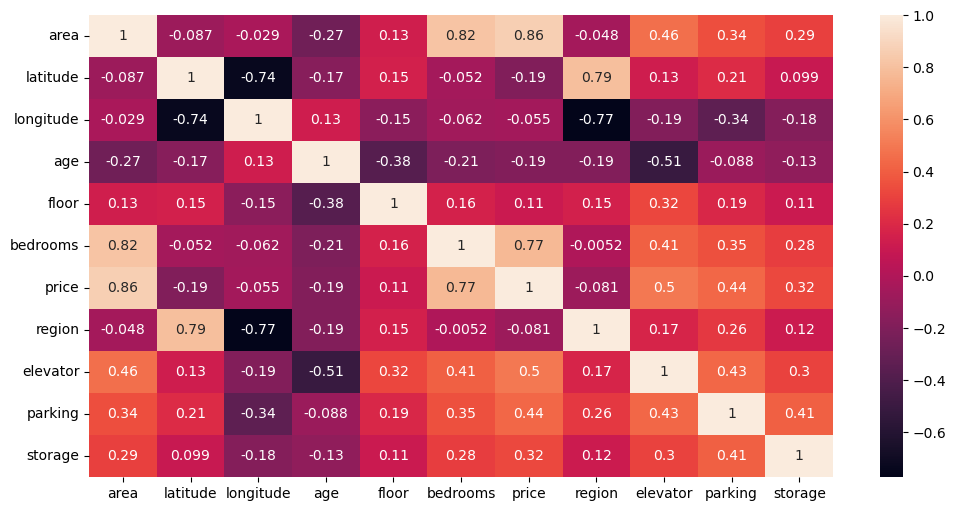

In [695]:
plt.figure(figsize=(12,6))
sns.heatmap(train_data2.select_dtypes(include="number").corr(method = "spearman"), annot=True)

## Missing For Train Data 2

In [696]:
train_data2.isna().sum()

type               0
area               0
neighborhood       0
description     2276
latitude           0
longitude          0
age              422
floor              0
bedrooms           1
price              0
region             0
neighbor           0
street             0
elevator        7684
parking         3387
storage         3461
dtype: int64

In [697]:
train_data2[(train_data2.elevator.notna())].type.value_counts()

type
فروش آپارتمان    36660
فروش ویلایی         56
Name: count, dtype: int64

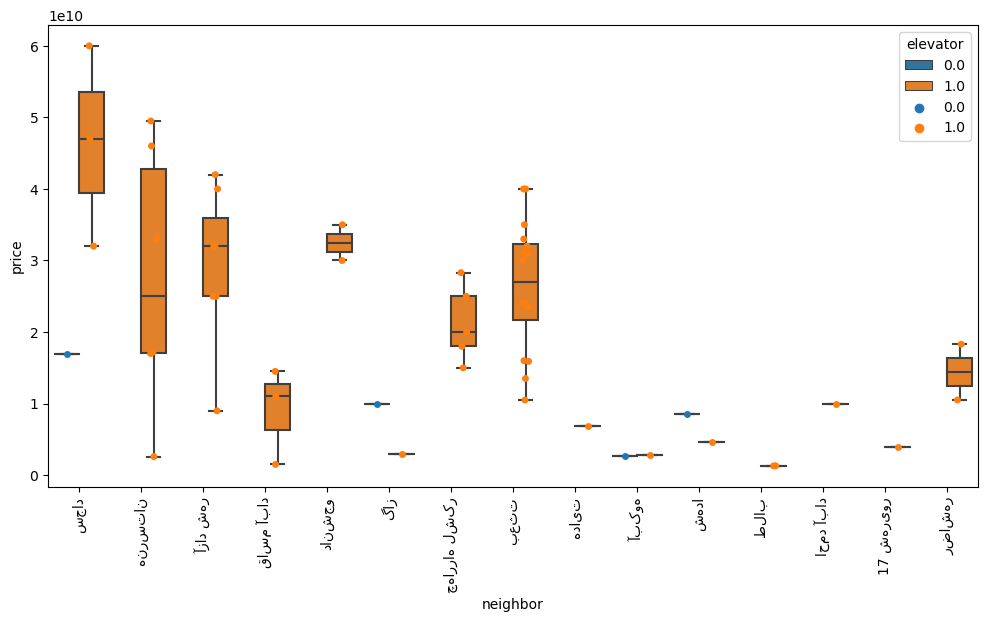

In [698]:
plt.figure(figsize=(12,6))
sns.boxplot(data = train_data2[(train_data2.elevator.notna()) & (train_data2.type.str.contains("ویلایی"))], x = "neighbor", y = "price", hue  = "elevator")
sns.stripplot(data = train_data2[(train_data2.elevator.notna()) & (train_data2.type.str.contains("ویلایی"))], x = "neighbor", y = "price", hue  = "elevator", dodge=True)
plt.xticks(rotation = 90)
plt.show()

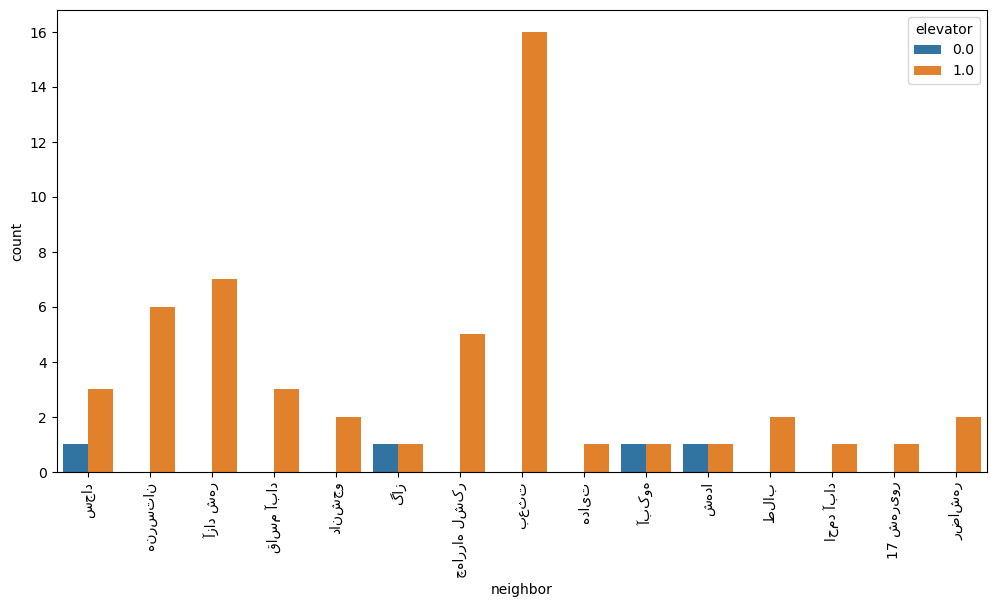

In [699]:
plt.figure(figsize=(12,6))
sns.countplot(data = train_data2[(train_data2.elevator.notna()) & (train_data2.type.str.contains("ویلایی"))], x = "neighbor", hue  = "elevator")
plt.xticks(rotation = 90)
plt.show()

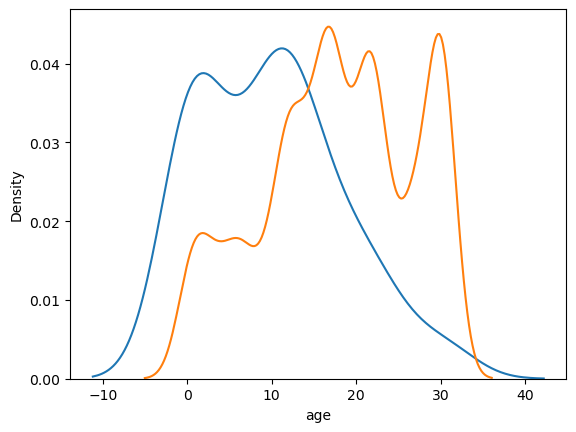

In [700]:
sns.kdeplot(data = train_data2[(train_data2.elevator.notna()) & (train_data2.type.str.contains("ویلایی"))], x = "age", )
sns.kdeplot(data = train_data2[(train_data2.elevator.isna()) & (train_data2.type.str.contains("ویلایی"))], x = "age", )
plt.show()

In [701]:
# show_description(train_data2[(train_data2.elevator.notna()) & (train_data2.type.str.contains("ویلایی")) & (train_data2.description.notna()) & (train_data2.description.str.contains("آپارتمان"))])

<Axes: ylabel='Frequency'>

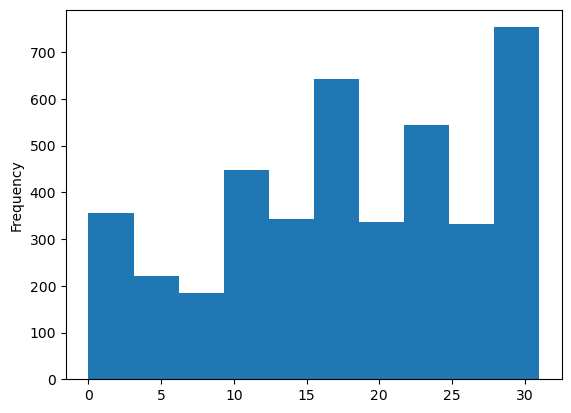

In [702]:
train_data2[(train_data2.elevator.isna()) & (train_data2.type.str.contains("ویلایی"))].age.plot.hist()

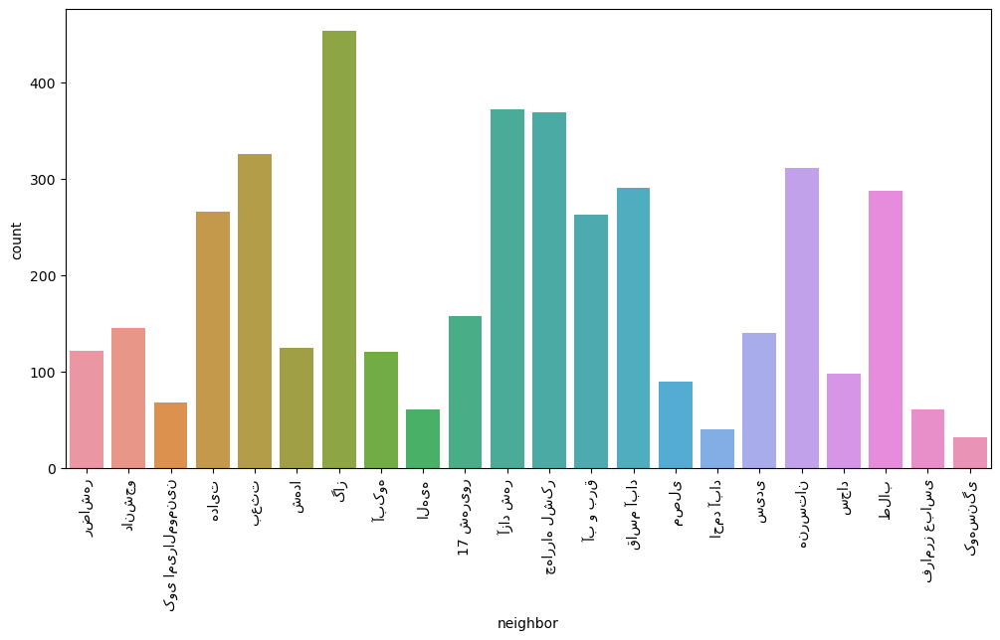

In [703]:
plt.figure(figsize=(12,6))
sns.countplot(data = train_data2[(train_data2.elevator.isna()) & (train_data2.type.str.contains("ویلایی"))], x = "neighbor")
plt.xticks(rotation = 90)
plt.show()

In [704]:
train_data2.loc[(train_data2.elevator.isna()) & (train_data2.type.str.contains("ویلایی")), "elevator"] = 0

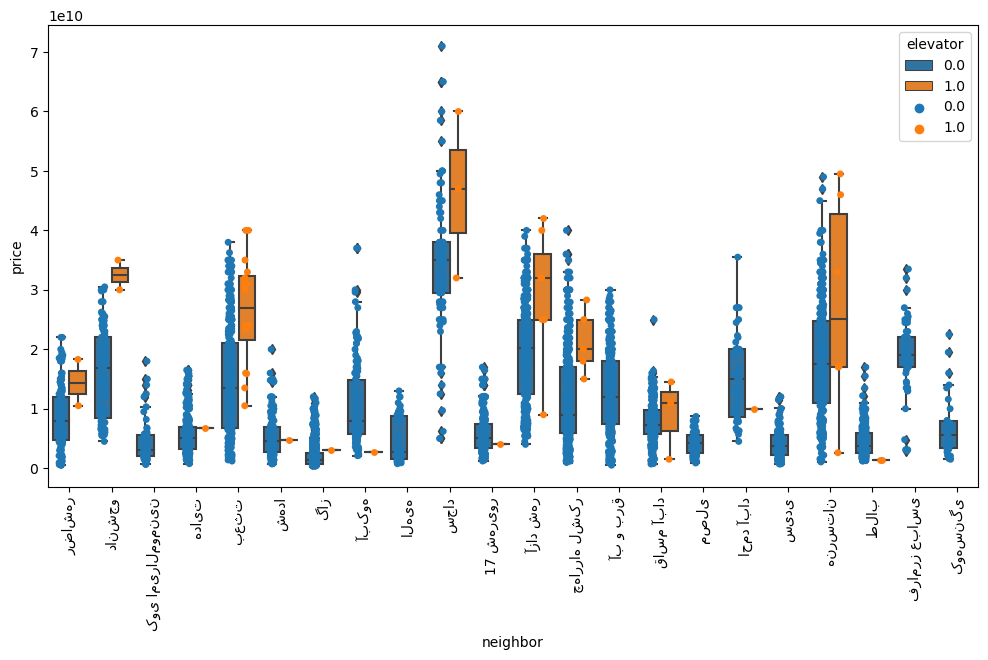

In [705]:
plt.figure(figsize=(12,6))
sns.boxplot(data = train_data2[(train_data2.elevator.notna()) & (train_data2.type.str.contains("ویلایی"))], x = "neighbor", y  = "price", hue = "elevator")
sns.stripplot(data = train_data2[(train_data2.elevator.notna()) & (train_data2.type.str.contains("ویلایی"))], x = "neighbor", y  = "price", hue = "elevator", dodge=True)
plt.xticks(rotation = 90)
plt.show()

In [706]:
train_data2.isna().sum()

type               0
area               0
neighborhood       0
description     2276
latitude           0
longitude          0
age              422
floor              0
bedrooms           1
price              0
region             0
neighbor           0
street             0
elevator        3487
parking         3387
storage         3461
dtype: int64

In [707]:
train_data2[(train_data2.elevator.notna()) & (train_data2.type.str.contains("آپارتمان"))].elevator.value_counts()

elevator
1.0    28318
0.0     8342
Name: count, dtype: int64

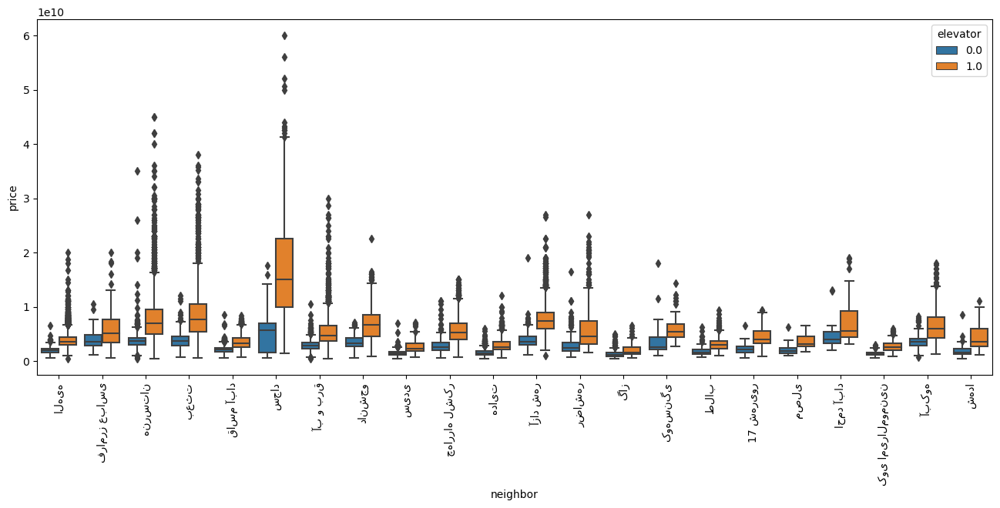

In [708]:
plt.figure(figsize=(16,6))
sns.boxplot(x = "neighbor", y = "price", data = train_data2[(train_data2.elevator.notna()) & (train_data2.type.str.contains("آپارتمان"))],
           hue = "elevator")
plt.xticks(rotation = 90)
plt.show()

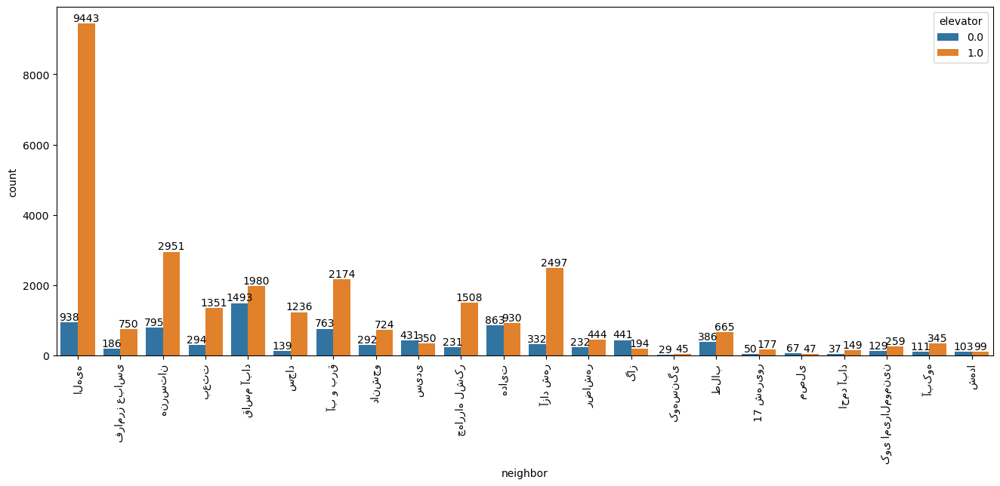

In [709]:
plt.figure(figsize=(16,6))
ax = sns.countplot(data = train_data2[(train_data2.elevator.notna()) & (train_data2.type.str.contains("آپارتمان"))], x = "neighbor", hue = "elevator")
for cont in ax.containers:
    ax.bar_label(cont)
plt.xticks(rotation = 90)
plt.show()

<Axes: ylabel='Frequency'>

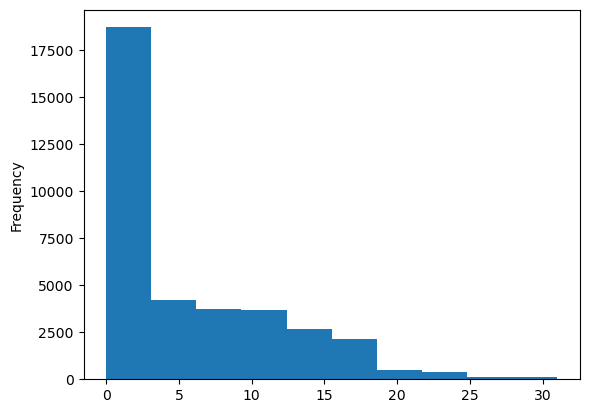

In [710]:
train_data2[(train_data2.elevator.notna()) & (train_data2.type.str.contains("آپارتمان"))].age.plot.hist()

<Axes: ylabel='Frequency'>

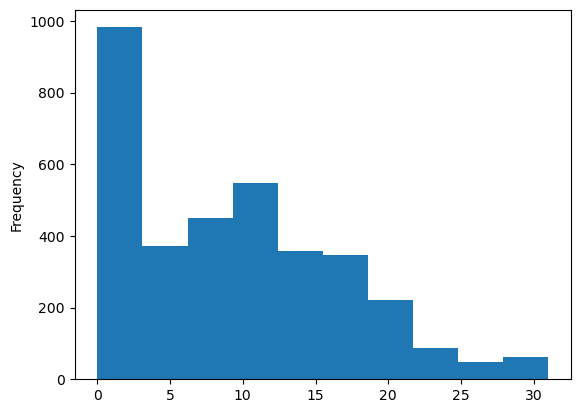

In [711]:
train_data2[(train_data2.elevator.isna()) & (train_data2.type.str.contains("آپارتمان"))].age.plot.hist()

<Axes: xlabel='neighbor'>

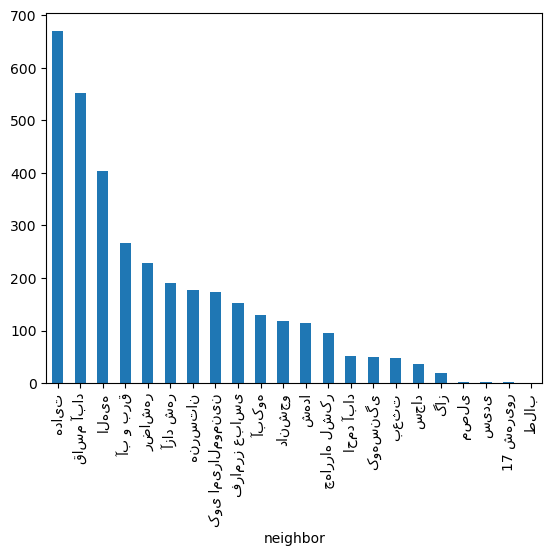

In [712]:
train_data2[(train_data2.elevator.isna()) & (train_data2.type.str.contains("آپارتمان"))].neighbor.value_counts().plot.bar()

In [713]:
show_description(train_data2.loc[[48055]])

پکیج و چیلر دارد / شامل استخر ، سونا ،سالن ورزشی  ، سالن اجتماعات
------------------------------
48055


In [714]:
train_data2[(train_data2.storage.isna())].type.value_counts()

type
فروش آپارتمان    3459
فروش ویلایی         2
Name: count, dtype: int64

In [715]:
train_data2[(train_data2.parking.isna())].type.value_counts()

type
فروش آپارتمان    3385
فروش ویلایی         2
Name: count, dtype: int64

In [716]:
train_data2.loc[(train_data2.storage.isna()) & (train_data2.parking.isna()) & (train_data2.type.str.contains("ویلایی")), ["parking", "storage"]] = 1

In [717]:
train_data2.isna().sum()

type               0
area               0
neighborhood       0
description     2276
latitude           0
longitude          0
age              422
floor              0
bedrooms           1
price              0
region             0
neighbor           0
street             0
elevator        3487
parking         3385
storage         3459
dtype: int64

In [718]:
train_data2[(train_data2.type.str.contains("تمان")) & (train_data2.description.notna()) & (train_data2.description.str.contains("روف گاردن"))].isna().sum()

type             0
area             0
neighborhood     0
description      0
latitude         0
longitude        0
age             14
floor            0
bedrooms         0
price            0
region           0
neighbor         0
street           0
elevator        15
parking         10
storage         16
dtype: int64

In [719]:
train_data2[(train_data2.parking.isna()) | (train_data2.storage.isna()) | (train_data2.elevator.isna())]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,elevator,parking,storage
9,فروش آپارتمان,81.0,منطقه 10 محله قاسم آباد خیابان حجاب,NaN,36.362122,59.521521,23.0,4.0,1.0,2.250000e+09,10.0,قاسم آباد,حجاب,NaN,NaN,NaN
10,فروش آپارتمان,86.0,منطقه 12 محله الهیه خیابان اقدسیه,NaN,36.377129,59.480647,10.0,1.0,2.0,2.500000e+09,12.0,الهیه,اقدسیه,NaN,NaN,NaN
31,فروش آپارتمان,145.0,منطقه 12 محله الهیه خیابان امیریه,فقط معاوضه/مبلغ میلیون در رهن است تا سال آینده,36.380667,59.484676,1.0,3.0,3.0,4.640000e+09,12.0,الهیه,امیریه,NaN,NaN,NaN
82,فروش آپارتمان,75.0,منطقه 11 محله آزاد شهر خیابان سیدرضی,NaN,36.333702,59.520849,16.0,4.0,2.0,2.700000e+09,11.0,آزاد شهر,سیدرضی,NaN,NaN,NaN
128,فروش آپارتمان,80.0,منطقه 9 محله هنرستان خیابان هاشمیه,v/واحداپارتمان- -متری-درهاشمیه- \r\n ...,36.310605,59.504477,0.0,0.0,2.0,3.680000e+09,9.0,هنرستان,هاشمیه,NaN,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48042,فروش آپارتمان,75.0,منطقه 1 محله آبکوه خیابان شهید صادقی,آب و گاز واحدی/ متر حیاط,36.315900,59.575810,13.0,0.0,1.0,2.700000e+09,1.0,آبکوه,شهید صادقی,NaN,NaN,NaN
48048,فروش آپارتمان,90.0,منطقه 11 محله دانشجو خیابان وکیل آباد فرداز 27,معاوضه با خودرو / راه جدا,36.326080,59.507990,10.0,0.0,2.0,1.850000e+09,11.0,دانشجو,وکیل آباد فرداز 27,NaN,NaN,NaN
48055,فروش آپارتمان,180.0,منطقه 2 محله فرامرز عباسی خیابان جانباز,پکیج و چیلر دارد / شامل استخر ، سونا ،سالن ورز...,36.335880,59.557710,0.0,6.0,3.0,1.134000e+10,2.0,فرامرز عباسی,جانباز,NaN,NaN,NaN
48062,فروش آپارتمان,135.0,منطقه 9 محله هنرستان خیابان هاشمیه,متر حیاط دارد/معاوضه با ویلایی/ با قولنامه واگ...,36.310605,59.504477,0.0,0.0,2.0,6.750000e+09,9.0,هنرستان,هاشمیه,NaN,NaN,NaN


In [720]:
neighbor_mode_facilities = train_data2[(train_data2.type.str.contains("تمان"))].groupby("neighbor")[["elevator", "parking", "storage"]].apply(lambda x : x.mode())

In [721]:
k_data_new = train_data2.copy()

In [722]:
for neighbor,y in k_data_new[(k_data_new.type.str.contains("تمان"))].groupby("neighbor")[["elevator", "parking", "storage"]].apply(lambda x : x.mode()).iterrows():
    k_data_new.loc[(k_data_new.neighbor == neighbor[0]) & (k_data_new.elevator.isna()), "elevator"] = y[0]
    k_data_new.loc[(k_data_new.neighbor == neighbor[0]) & (k_data_new.parking.isna()), "parking"] = y[1]
    k_data_new.loc[(k_data_new.neighbor == neighbor[0]) & (k_data_new.storage.isna()), "storage"] = y[2]

In [723]:
k_data_new.isna().sum()

type               0
area               0
neighborhood       0
description     2276
latitude           0
longitude          0
age              422
floor              0
bedrooms           1
price              0
region             0
neighbor           0
street             0
elevator           0
parking            0
storage            0
dtype: int64

In [724]:
def handle_msvs (df, filling_other_age_na = False, remove_other_age_na = False):
    
    data = df.copy()
    data = data.dropna(subset="bedrooms")
    age_na = data[data.age.isna()]
    tazesakht = age_na[(age_na.description.notna()) & (age_na.description.str.contains("نیمه ساز|هوایی|هوای|صفر|نوساز|تازه ساخت|کلید نخورده")) & (age_na.description.str.contains("بازسازی|نوسازی شده|بازسازی شده") == False)]
    data.loc[tazesakht.index, "age"] = data.loc[tazesakht.index, "age"].apply(lambda x : np.random.choice((0,1, 2), 1, p = [.6, .3, .1])[0])
    if filling_other_age_na:
        msv_values = data.groupby(["type", "neighbor"])["age"].describe().sort_values("50%")[["50%"]]
        for groups, med_value in zip(msv_values.index, msv_values.values):
            data.loc[(data.type == groups[0]) & (data.neighbor == groups[1]), "age"] =  np.floor(med_value[0])
        return data
    else : 
        return data.drop(age_na.drop(tazesakht.index).index) if remove_other_age_na else data
    

In [725]:
def remove_redundant_features(df, cols):
    data = df.copy()
    return data.drop(cols, axis = 1)

## Missing For Train Data With New Features (el, st, park) 

In [726]:
train_data2.head()

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,elevator,parking,storage
0,فروش آپارتمان,73.0,منطقه 12 محله الهیه خیابان الهیه,متر امیریه/سند آماده/آسانسور پارکینگ/فول\r\nلو...,36.373776,59.475820,11.0,1.0,2.0,2.200000e+09,12.0,الهیه,الهیه,1.0,1.0,1.0
1,فروش آپارتمان,100.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,آپارتمان متر/فول/خوش نقشه/فرامرز\r\nباسلام\n...,36.327670,59.548380,7.0,1.0,2.0,4.800000e+09,2.0,فرامرز عباسی,فرامرز عباسی,1.0,1.0,1.0
2,فروش آپارتمان,140.0,منطقه 9 محله هنرستان خیابان هاشمیه,متر در هاشمیه\r\n⚜️⚜️⚜️کارگزاری املاک هورا ⚜️⚜...,36.310605,59.504477,0.0,2.0,2.0,1.020000e+10,9.0,هنرستان,هاشمیه,1.0,1.0,1.0
4,فروش آپارتمان,200.0,منطقه 12 محله الهیه خیابان الهیه,/ متر*همکف*فول* مترحیاط باامکانات کامل\r\n⚜وق...,36.373776,59.475820,0.0,0.0,3.0,5.350000e+09,12.0,الهیه,الهیه,1.0,1.0,1.0
6,فروش آپارتمان,120.0,منطقه 1 محله بعثت خیابان کوهسنگی,آپارتمان متری اکبری خیابان کوهسنگی\r\nکارش...,36.287180,59.574720,10.0,4.0,2.0,5.200000e+09,1.0,بعثت,کوهسنگی,1.0,1.0,1.0


In [727]:
k_data_new.head()

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,elevator,parking,storage
0,فروش آپارتمان,73.0,منطقه 12 محله الهیه خیابان الهیه,متر امیریه/سند آماده/آسانسور پارکینگ/فول\r\nلو...,36.373776,59.475820,11.0,1.0,2.0,2.200000e+09,12.0,الهیه,الهیه,1.0,1.0,1.0
1,فروش آپارتمان,100.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,آپارتمان متر/فول/خوش نقشه/فرامرز\r\nباسلام\n...,36.327670,59.548380,7.0,1.0,2.0,4.800000e+09,2.0,فرامرز عباسی,فرامرز عباسی,1.0,1.0,1.0
2,فروش آپارتمان,140.0,منطقه 9 محله هنرستان خیابان هاشمیه,متر در هاشمیه\r\n⚜️⚜️⚜️کارگزاری املاک هورا ⚜️⚜...,36.310605,59.504477,0.0,2.0,2.0,1.020000e+10,9.0,هنرستان,هاشمیه,1.0,1.0,1.0
4,فروش آپارتمان,200.0,منطقه 12 محله الهیه خیابان الهیه,/ متر*همکف*فول* مترحیاط باامکانات کامل\r\n⚜وق...,36.373776,59.475820,0.0,0.0,3.0,5.350000e+09,12.0,الهیه,الهیه,1.0,1.0,1.0
6,فروش آپارتمان,120.0,منطقه 1 محله بعثت خیابان کوهسنگی,آپارتمان متری اکبری خیابان کوهسنگی\r\nکارش...,36.287180,59.574720,10.0,4.0,2.0,5.200000e+09,1.0,بعثت,کوهسنگی,1.0,1.0,1.0


In [728]:
k_data_new2 = handle_msvs(k_data_new,remove_other_age_na=True)

In [729]:
train_data2 = handle_msvs(train_data2)

## Missing Value

In [730]:
msv_percentage(train_data)

,percentage,count
description,5.126126,2276
age,0.950450,422
bedrooms,0.002252,1
type,0.000000,0
area,0.000000,0
neighborhood,0.000000,0
latitude,0.000000,0
longitude,0.000000,0
floor,0.000000,0
price,0.000000,0


### Bedrooms

In [731]:
train_data[train_data.bedrooms.isna()]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
25622,فروش آپارتمان,70.0,منطقه 10 محله قاسم آباد خیابان آزاده,همکف مغازه,36.354289,59.476176,11.0,3.0,NaN,1.460000e+09,10.0,قاسم آباد,آزاده


In [732]:
train_data.dropna(subset="bedrooms", inplace=True)

### Age

In [733]:
train_data.select_dtypes(include="number").corr(method="spearman")

,area,latitude,longitude,age,floor,bedrooms,price,region
area,1.000000,-0.087039,-0.029200,-0.266453,0.134711,0.818946,0.863176,-0.048342
latitude,-0.087039,1.000000,-0.736395,-0.166182,0.147870,-0.052237,-0.191945,0.792699
longitude,-0.029200,-0.736395,1.000000,0.127467,-0.154761,-0.062390,-0.054771,-0.773769
age,-0.266453,-0.166182,0.127467,1.000000,-0.377211,-0.212131,-0.190464,-0.185059
floor,0.134711,0.147870,-0.154761,-0.377211,1.000000,0.155222,0.106753,0.149701
bedrooms,0.818946,-0.052237,-0.062390,-0.212131,0.155222,1.000000,0.769966,-0.005209
price,0.863176,-0.191945,-0.054771,-0.190464,0.106753,0.769966,1.000000,-0.080891
region,-0.048342,0.792699,-0.773769,-0.185059,0.149701,-0.005209,-0.080891,1.000000


In [734]:
age_na = train_data[train_data.age.isna()]
age_na

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
37,فروش آپارتمان,100.0,منطقه 3 محله گاز خیابان طبرسی شمالی,اپارتمان صد متری\r\nاسکلت\nسقف بتن شده\nخاک کچ...,36.323210,59.627390,NaN,3.0,2.0,9.500000e+08,3.0,گاز,طبرسی شمالی
95,فروش آپارتمان,172.0,منطقه 9 محله آب و برق خیابان صیاد شیرازی,صیاد شیرازی تک واحد\r\n***ملک سر دونبش غرق...,36.332341,59.485542,NaN,2.0,3.0,8.500000e+09,9.0,آب و برق,صیاد شیرازی
110,فروش ویلایی,250.0,منطقه 12 محله الهیه خیابان امیریه,ویلاتازه ساخت فروشی\r\nبه نام خدا\nسلام\nویلا ...,36.380667,59.484676,NaN,0.0,1.0,2.850000e+09,12.0,الهیه,امیریه
396,فروش آپارتمان,150.0,منطقه 3 محله گاز خیابان طبرسی شمالی,اپارتمان دوبلکس طبرسی \r\nبرق گاز جدا آب مشت...,36.323210,59.627390,NaN,3.0,2.0,1.400000e+09,3.0,گاز,طبرسی شمالی
483,فروش آپارتمان,145.0,منطقه 2 محله کوی امیرالمومنین خیابان کوی امیر...,آپارتمان صفر سه خواب خیام نیلوفر\r\nسلام\n\...,36.339603,59.586190,NaN,2.0,3.0,3.450000e+09,2.0,کوی امیرالمومنین,کوی امیرالمومنین
...,...,...,...,...,...,...,...,...,...,...,...,...,...
47872,فروش آپارتمان,106.0,منطقه 4 و 5 محله طلاب خیابان مفتح,آپارتمان متری نور پذیرایی و خوابها\r\nطبرس...,36.302906,59.639893,NaN,2.0,2.0,2.650000e+09,4.0,طلاب,مفتح
47908,فروش آپارتمان,130.0,منطقه 7 محله سیدی خیابان کوشش,اپارتمان صفر شیک قائم سیدی\r\nسلام اپارتمان ...,36.249725,59.594093,NaN,5.0,2.0,2.800000e+09,7.0,سیدی,کوشش
47977,فروش آپارتمان,145.0,منطقه 12 محله الهیه خیابان الهیه,متر سند اماده صفر\r\nموفعیت مکانی عالی\nصفر \n...,36.373776,59.475820,NaN,5.0,3.0,4.500000e+09,12.0,الهیه,الهیه
48000,فروش آپارتمان,130.0,منطقه 2 محله هدایت خیابان مطهری شمالی,آپارتمان نوساز متری مطهری شمالی\r\nسلام \nآ...,36.316310,59.608390,NaN,5.0,2.0,3.100000e+09,2.0,هدایت,مطهری شمالی


In [735]:
taze_sakht = age_na[(age_na.description.notna()) & (age_na.description.str.contains("نیمه ساز|هوایی|هوای|صفر|نوساز|تازه ساخت|کلید نخورده")) & (age_na.description.str.contains("بازسازی|نوسازی شده|بازسازی شده") == False)]
taze_sakht

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
110,فروش ویلایی,250.0,منطقه 12 محله الهیه خیابان امیریه,ویلاتازه ساخت فروشی\r\nبه نام خدا\nسلام\nویلا ...,36.380667,59.484676,NaN,0.0,1.0,2.850000e+09,12.0,الهیه,امیریه
483,فروش آپارتمان,145.0,منطقه 2 محله کوی امیرالمومنین خیابان کوی امیر...,آپارتمان صفر سه خواب خیام نیلوفر\r\nسلام\n\...,36.339603,59.586190,NaN,2.0,3.0,3.450000e+09,2.0,کوی امیرالمومنین,کوی امیرالمومنین
729,فروش ویلایی,100.0,منطقه 3 محله گاز خیابان رسالت,ساختمان دوطبقه بالا دوبلکس\r\nسلام \nطبقه پایی...,36.303140,59.633800,NaN,0.0,2.0,1.950000e+09,3.0,گاز,رسالت
1068,فروش آپارتمان,140.0,منطقه 4 و 5 محله طلاب خیابان مفتح,اپارتمان سه خوابه نوساز فول امکانات\r\nاپارتما...,36.296030,59.643700,NaN,5.0,3.0,3.500000e+09,4.0,طلاب,مفتح
1322,فروش آپارتمان,101.0,منطقه 2 محله کوی امیرالمومنین خیابان خیام شمالی,آپارتمان متری چراغچی \r\nسلام آپارتمان ...,36.324510,59.570100,NaN,3.0,2.0,1.370000e+09,2.0,کوی امیرالمومنین,خیام شمالی
...,...,...,...,...,...,...,...,...,...,...,...,...,...
47724,فروش آپارتمان,170.0,منطقه 11 محله آزاد شهر خیابان آزادشهر,آپارتمان،سه خواب،شیک\r\n✔آپارتمان شیک و دلباز\...,36.327540,59.527520,NaN,4.0,3.0,8.700000e+09,11.0,آزاد شهر,آزادشهر
47872,فروش آپارتمان,106.0,منطقه 4 و 5 محله طلاب خیابان مفتح,آپارتمان متری نور پذیرایی و خوابها\r\nطبرس...,36.302906,59.639893,NaN,2.0,2.0,2.650000e+09,4.0,طلاب,مفتح
47908,فروش آپارتمان,130.0,منطقه 7 محله سیدی خیابان کوشش,اپارتمان صفر شیک قائم سیدی\r\nسلام اپارتمان ...,36.249725,59.594093,NaN,5.0,2.0,2.800000e+09,7.0,سیدی,کوشش
47977,فروش آپارتمان,145.0,منطقه 12 محله الهیه خیابان الهیه,متر سند اماده صفر\r\nموفعیت مکانی عالی\nصفر \n...,36.373776,59.475820,NaN,5.0,3.0,4.500000e+09,12.0,الهیه,الهیه


In [736]:
train_data.loc[taze_sakht.index, "age"] = train_data.loc[taze_sakht.index, "age"].apply(lambda x : np.random.choice((0,1), 1, p = [.6, .4])[0])

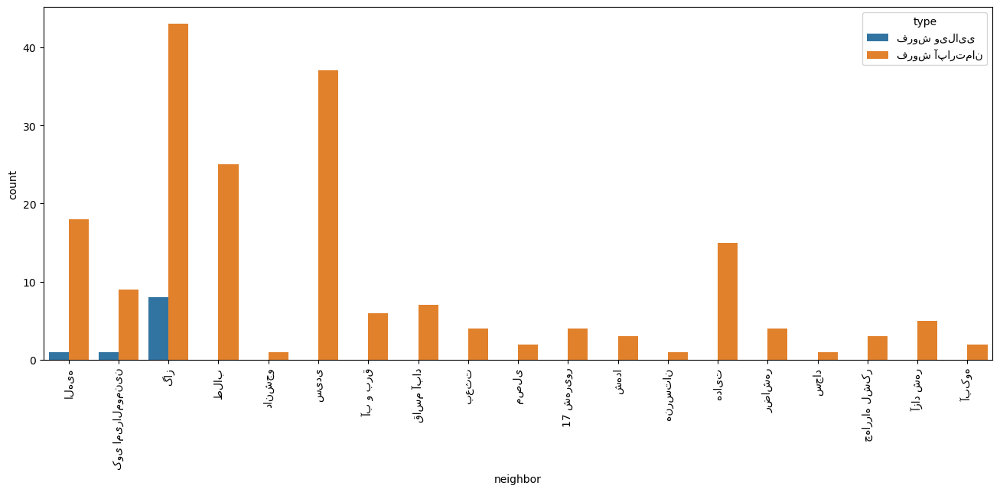

In [737]:
plt.figure(figsize=(16,6))
sns.countplot(data = taze_sakht , x = "neighbor", hue = "type")
plt.xticks(rotation = 90)
plt.show()

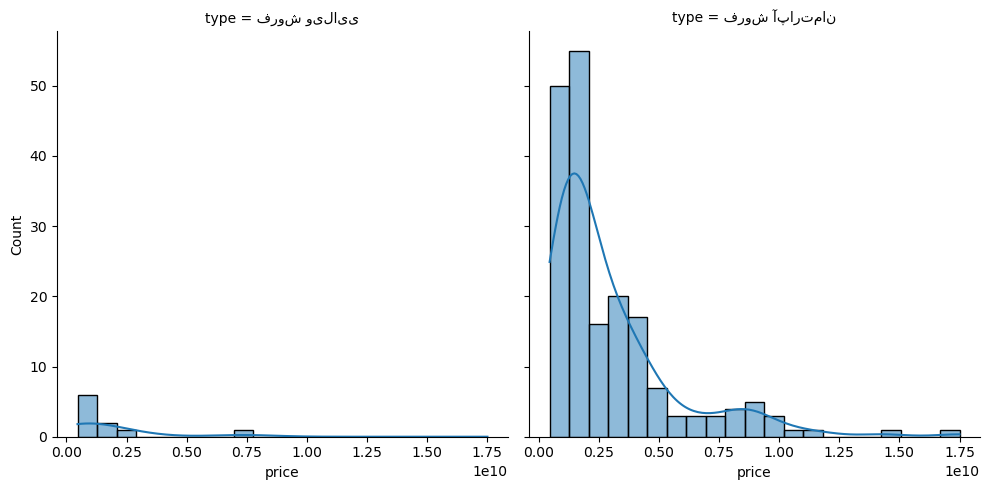

In [738]:
sns.displot(x = "price",data = taze_sakht, kde = True, col = "type")

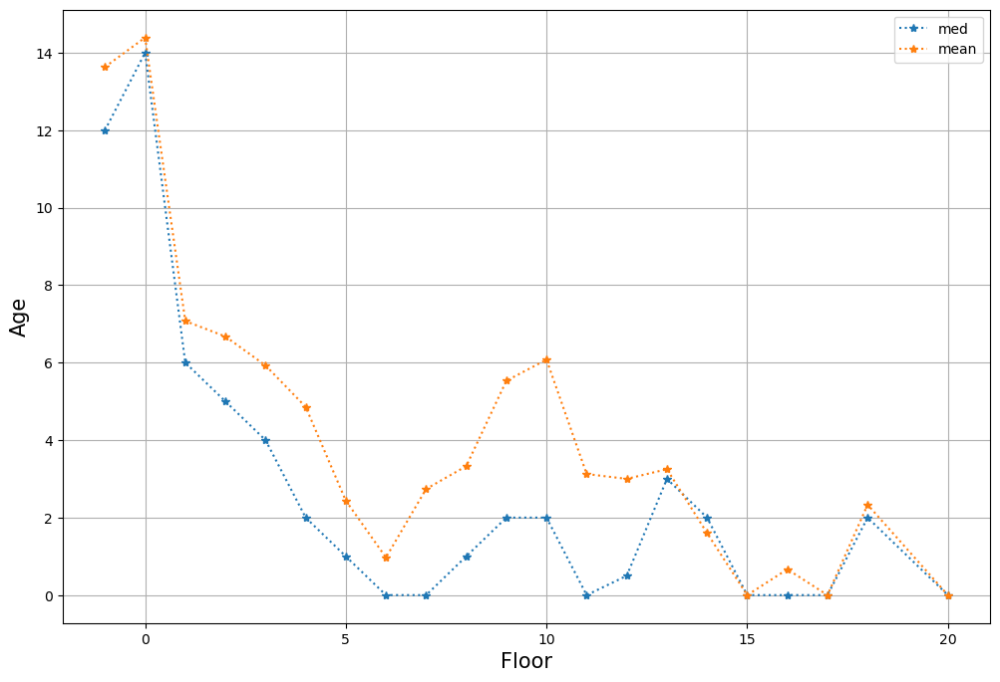

In [739]:
plt.figure(figsize = (12,8))
train_data.groupby("floor").age.median().plot(ls = ":", marker = "*", label = "med")
train_data.groupby("floor").age.mean().plot(ls = ":", marker = "*", label = "mean")
plt.ylabel("Age", size = 15)
plt.xlabel("Floor",size = 15)
plt.legend()
plt.grid()
plt.show()

<Axes: xlabel='age', ylabel='Density'>

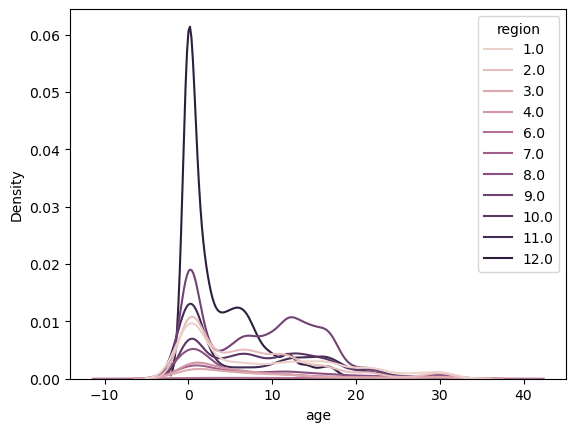

In [740]:
sns.kdeplot(x = "age", hue = "region", data = train_data)

In [741]:
other_age_na = age_na.drop(taze_sakht.index)
other_age_na

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street
37,فروش آپارتمان,100.0,منطقه 3 محله گاز خیابان طبرسی شمالی,اپارتمان صد متری\r\nاسکلت\nسقف بتن شده\nخاک کچ...,36.323210,59.627390,NaN,3.0,2.0,9.500000e+08,3.0,گاز,طبرسی شمالی
95,فروش آپارتمان,172.0,منطقه 9 محله آب و برق خیابان صیاد شیرازی,صیاد شیرازی تک واحد\r\n***ملک سر دونبش غرق...,36.332341,59.485542,NaN,2.0,3.0,8.500000e+09,9.0,آب و برق,صیاد شیرازی
396,فروش آپارتمان,150.0,منطقه 3 محله گاز خیابان طبرسی شمالی,اپارتمان دوبلکس طبرسی \r\nبرق گاز جدا آب مشت...,36.323210,59.627390,NaN,3.0,2.0,1.400000e+09,3.0,گاز,طبرسی شمالی
501,فروش آپارتمان,100.0,منطقه 3 محله گاز خیابان طبرسی شمالی,آپارتمان متر دو خواب همکف\r\nبا سلام \nیک ...,36.323210,59.627390,NaN,0.0,2.0,1.550000e+09,3.0,گاز,طبرسی شمالی
1145,فروش آپارتمان,105.0,منطقه 7 محله سیدی خیابان ایمان,متر مربع\r\nدوخوابه .فول امکانات.نور گیر عالی ...,36.252194,59.593689,NaN,3.0,2.0,2.730000e+09,7.0,سیدی,ایمان
...,...,...,...,...,...,...,...,...,...,...,...,...,...
47217,فروش آپارتمان,90.0,منطقه 2 محله هدایت خیابان ابوطالب,متر دوخواب سفت کاری فروش معاوضه خودرو عبدالمطل...,36.318450,59.587680,NaN,5.0,2.0,7.000000e+08,2.0,هدایت,ابوطالب
47570,فروش آپارتمان,50.0,منطقه 7 محله سیدی خیابان کوشش,اپارتمان متری\r\nطبقه همکف ..کف سرامیک ..ام...,36.265280,59.609260,NaN,0.0,1.0,9.000000e+08,7.0,سیدی,کوشش
47646,فروش آپارتمان,75.0,منطقه 11 محله دانشجو خیابان وکیل آباد فرداز 27,NaN,36.326080,59.507990,NaN,3.0,2.0,2.530000e+09,11.0,دانشجو,وکیل آباد فرداز 27
47853,فروش ویلایی,50.0,منطقه 3 محله گاز خیابان رسالت,منزل ویلایی دوبلکس\r\nمنزل ویلایی بسیار شیک نز...,36.303140,59.633800,NaN,0.0,1.0,6.000000e+08,3.0,گاز,رسالت


<Axes: ylabel='Frequency'>

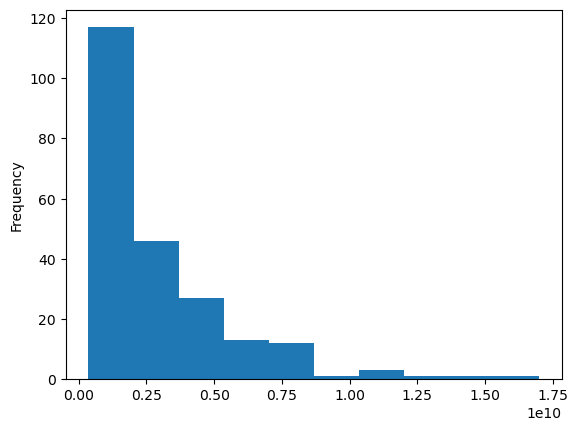

In [742]:
other_age_na.price.plot.hist()

In [743]:
other_age_na.floor.value_counts()

floor
 0.0     47
 3.0     44
 1.0     41
 2.0     39
 4.0     24
 5.0     13
 6.0      8
 7.0      4
 11.0     1
-1.0      1
Name: count, dtype: int64

In [744]:
other_age_na.neighbor.value_counts()

neighbor
گاز                 73
سیدی                32
طلاب                20
الهیه               13
هدایت               12
قاسم آباد            9
آب و برق             8
شهدا                 7
بعثت                 6
مصلی                 6
فرامرز عباسی         5
هنرستان              5
رضاشهر               4
سجاد                 4
چهارراه لشکر         3
آبکوه                3
17 شهریور            3
کوی امیرالمومنین     3
آزاد شهر             2
احمد آباد            2
کوهسنگی              1
دانشجو               1
Name: count, dtype: int64

<Axes: xlabel='neighbor'>

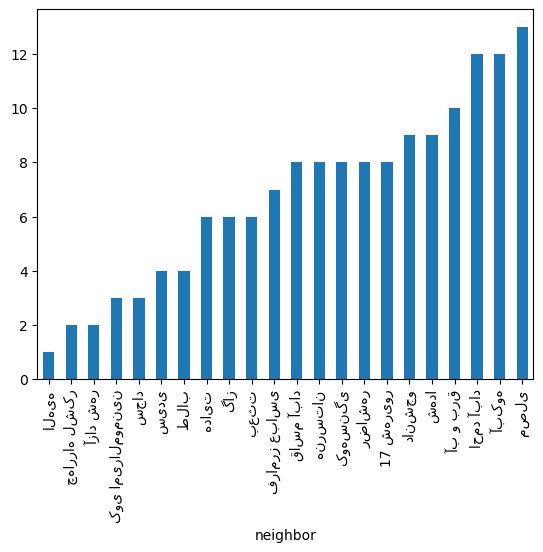

In [745]:
train_data.groupby("neighbor").age.median().sort_values().plot.bar()

In [746]:
msv_values = train_data.groupby(["type", "neighbor"])["age"].describe().sort_values("50%")[["50%"]]

In [747]:
train_data.select_dtypes(include = "number").corr()

,area,latitude,longitude,age,floor,bedrooms,price,region
area,1.000000,-0.119521,-0.030568,-0.063673,0.070516,0.775944,0.834441,-0.102750
latitude,-0.119521,1.000000,-0.721263,-0.182904,0.123766,-0.053033,-0.200156,0.602111
longitude,-0.030568,-0.721263,1.000000,0.126724,-0.148697,-0.097928,-0.005916,-0.762183
age,-0.063673,-0.182904,0.126724,1.000000,-0.393352,-0.057977,0.029335,-0.153133
floor,0.070516,0.123766,-0.148697,-0.393352,1.000000,0.089015,-0.007129,0.116540
bedrooms,0.775944,-0.053033,-0.097928,-0.057977,0.089015,1.000000,0.674511,-0.002972
price,0.834441,-0.200156,-0.005916,0.029335,-0.007129,0.674511,1.000000,-0.152868
region,-0.102750,0.602111,-0.762183,-0.153133,0.116540,-0.002972,-0.152868,1.000000


In [748]:
# msv_values

In [749]:
imputed_nan = other_age_na.copy()

In [750]:
imputed_nan_for_new_k_data = k_data_new.copy()

In [751]:
for groups, med_value in zip(msv_values.index, msv_values.values):
    imputed_nan.loc[(imputed_nan.type == groups[0]) & (imputed_nan.neighbor == groups[1]), "age"] =  np.floor(med_value[0])
    imputed_nan_for_new_k_data.loc[(imputed_nan_for_new_k_data.type == groups[0]) & (imputed_nan_for_new_k_data.neighbor == groups[1]), "age"] =  np.floor(med_value[0])

In [752]:
train_data_new = train_data.copy()

In [753]:
train_data_new.drop(other_age_na.index, inplace=True)

In [754]:
train_data_filled_age = train_data.copy()

In [755]:
train_data_filled_age.loc[imputed_nan.index] = imputed_nan

# Feature Engineering

In [756]:
train_data["built_year"] = train_data.age.apply(lambda age : (1402 - age))

### other fe

In [757]:
f_data = train_data.copy()

In [758]:
f_data.loc[(f_data.description.notna()) & ((f_data.description.str.contains("حاشیه|حومه|نزدیک")) &
                                                     (f_data.description.str.contains("حرم مطهر|وکیل آباد|وکیل اباد|ملک آباد|ملک اباد")))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,built_year
90,فروش آپارتمان,93.0,منطقه 9 محله آب و برق خیابان برونسی,آپارتمان متری نقلی صفر پشت حاشیه وکیل آباد\...,36.328868,59.490500,0.0,0.0,2.0,5.500000e+09,9.0,آب و برق,برونسی,1402.0
170,فروش ویلایی,200.0,منطقه 9 محله آب و برق خیابان برونسی,ویلایی //دوبلکس\r\n❇️ به نام یگانه سازنده هستی...,36.326765,59.463926,7.0,0.0,4.0,2.300000e+10,9.0,آب و برق,برونسی,1395.0
175,فروش ویلایی,70.0,منطقه 8 محله چهارراه لشکر خیابان امام رضا,ویلائی نقلی در چند قدمی حرم مطهر\r\nنزدیک به ح...,36.272780,59.602730,13.0,0.0,4.0,2.900000e+09,8.0,چهارراه لشکر,امام رضا,1389.0
272,فروش آپارتمان,93.0,منطقه 2 محله شهدا خیابان کامیاب,اپارتمان راه اهن کامیاب سند ملکی\r\nاپارتمان ...,36.306610,59.619040,9.0,1.0,2.0,3.150000e+09,2.0,شهدا,کامیاب,1393.0
289,فروش آپارتمان,140.0,منطقه 9 محله آب و برق خیابان برونسی,آپارتمان متری صفر اول اقبال\r\nایــام به کـ...,36.326765,59.463926,0.0,3.0,2.0,5.800000e+09,9.0,آب و برق,برونسی,1402.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48018,فروش آپارتمان,75.0,منطقه 9 محله آب و برق خیابان صیاد شیرازی,آپارتمان متری فول بازسازی شده ابتدای صیاد\r...,36.332341,59.485542,12.0,1.0,2.0,3.500000e+09,9.0,آب و برق,صیاد شیرازی,1390.0
48026,فروش آپارتمان,83.0,منطقه 9 محله آب و برق خیابان برونسی,اپارتمان متر طبقه پله وکیل اباد \r\nبدون اس...,36.326765,59.463926,15.0,2.0,2.0,3.600000e+09,9.0,آب و برق,برونسی,1387.0
48037,فروش آپارتمان,160.0,منطقه 9 محله آب و برق خیابان برونسی,متر دوکله صفر تکواحدی ادیب جنوبی*ویودار*معاوضه...,36.326765,59.463926,0.0,6.0,3.0,5.600000e+09,9.0,آب و برق,برونسی,1402.0
48109,فروش آپارتمان,160.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,آپارتمان متری صفر فرامرز عباسی\r\nاملاک سرا...,36.327670,59.548380,0.0,4.0,3.0,1.040000e+10,2.0,فرامرز عباسی,فرامرز عباسی,1402.0


In [759]:
f_data.loc[(f_data.description.notna()) & ((f_data.description.str.contains("حاشیه|حومه|نزدیک")) &
                                                     (f_data.description.str.contains("حرم مطهر|حرم امام رضا|حرم")))].price.describe()

count    9.230000e+02
mean     4.486014e+09
std      3.641144e+09
min      4.100000e+08
25%      2.200000e+09
50%      3.500000e+09
75%      5.600000e+09
max      3.000000e+10
Name: price, dtype: float64

### mamar

In [760]:
f_data = train_data.copy()
    
f_data["nabsh"] = 1
f_data.loc[(f_data.description.notna())  & (f_data.description.str.contains("دو کله|دوکله|دوکله|دو ممر|دوممر|دو نبش|دونبش")),
"nabsh"] = 2
f_data.loc[(f_data.description.notna())  & (f_data.description.str.contains("سه کله|سهکله|سهنبش|سه نبش|سنبش|سه ممر|سهممر")),
"nabsh"] = 3
f_data.loc[(f_data.description.notna())  & (f_data.description.str.contains("چهارکله|چهار کله|چهارنبش|چهار نبش|چهارممر|چهار ممر")),
"nabsh"] = 4

In [761]:
f_data["mamar"] = 0

In [762]:
f_data.loc[(f_data.description.notna())  & (f_data.description.str.contains("دو ممر|دوممر|دوکله|دو کله")), "mamar"] = 1

In [763]:
f_data["nabsh"] = 0

In [764]:
f_data["nabsh"] = 0
f_data.loc[(f_data.description.notna())  & (f_data.description.str.contains("دو نبش|دونبش")), "nabsh"] = 1

In [765]:
f_data.groupby("mamar").agg({"price" : ["mean", "count"]})

price       
               mean  count
mamar                     
0      5.436601e+09  43092
1      6.339130e+09   1307

In [766]:
f_data.groupby("nabsh").agg({"price" : ["mean", "count"]})


price       
               mean  count
nabsh                     
0      5.428747e+09  41495
1      5.955022e+09   2904

### tarakom

In [767]:
f_data = train_data.copy()

In [768]:
f_data.loc[(f_data.description.notna()) & ( (f_data.description.str.contains("تراکم :زیاد|تراکم: زیاد|تراکم : زیاد|تراکم زیاد|تراکم  زیاد")))]

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,built_year
33,فروش ویلایی,250.0,منطقه 1 محله بعثت خیابان احمدآباد,فلسطین ویلایی متر دوبلکس\r\nسلام \nزمین ...,36.299350,59.565440,10.0,0.0,4.0,3.400000e+10,1.0,بعثت,احمدآباد,1392.0
382,فروش ویلایی,170.0,منطقه 1 محله احمد آباد خیابان راهنمایی,ویلایی بلوار راهنمایی/ مناسب ساخت و سکوت\r\n ...,36.300470,59.567800,17.0,0.0,4.0,1.350000e+10,1.0,احمد آباد,راهنمایی,1385.0
410,فروش ویلایی,250.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,متر فرهنگ معاوضه با آپارتمان/تراکم زیاد عرض \...,36.328550,59.513390,27.0,0.0,5.0,1.850000e+10,11.0,آزاد شهر,فرهنگ,1375.0
451,فروش ویلایی,278.0,منطقه 9 محله هنرستان خیابان هنرستان,زمین ویلایی فکوری ( هنرستان وهفت تیر)\r\nزمین...,36.313811,59.500077,22.0,0.0,4.0,2.050000e+10,9.0,هنرستان,هنرستان,1380.0
472,فروش ویلایی,250.0,منطقه 1 محله سجاد خیابان سجاد,متر زیر بنا/تهاتر-فروش/سجاد\r\nاملاک آپادانا \...,36.318036,59.551475,13.0,0.0,5.0,2.790000e+10,1.0,سجاد,سجاد,1389.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46668,فروش ویلایی,232.0,منطقه 1 محله بعثت خیابان احمدآباد,ویلایی/بلوار رضا/ متر/تراکم متوسط\r\nکارگزا...,36.294495,59.567997,30.0,0.0,5.0,2.550000e+10,1.0,بعثت,احمدآباد,1372.0
46906,فروش ویلایی,95.0,منطقه 11 محله دانشجو خیابان صدف,ویلایی دانگ تراکمزیادمیلان متراسکلت آهن بلوار...,36.340256,59.495407,16.0,0.0,2.0,7.250000e+09,11.0,دانشجو,صدف,1386.0
47296,فروش ویلایی,340.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,ویلایی متر/جلال با متر حاشیه تراکم زیا...,36.328550,59.513390,29.0,0.0,4.0,3.500000e+10,11.0,آزاد شهر,فرهنگ,1373.0
47591,فروش ویلایی,125.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,متر زمین متر بنا شمالی تراکم زیاد سید رضی\...,36.328550,59.513390,20.0,0.0,2.0,8.000000e+09,11.0,آزاد شهر,فرهنگ,1382.0


### tejari

In [769]:
f_data = train_data.copy()

In [770]:
f_data["commercial1"] = 0

In [771]:
f_data.loc[(f_data.description.notna()) & (f_data.description.str.contains("مغازه|تجاری")), "commercial1"] = 1

In [772]:
f_data["commercial2"] = 0

In [773]:
f_data.loc[(f_data.description.notna()) & (f_data.description.str.contains("مسکونی")) & (f_data.description.str.contains("مغازه|تجاری")), "commercial2"] = 1

In [774]:
f_data.groupby("commercial1").price.mean()

commercial1
0    5.421900e+09
1    6.851163e+09
Name: price, dtype: float64

In [775]:
f_data.groupby("commercial2").price.mean()

commercial2
0    5.445978e+09
1    9.151248e+09
Name: price, dtype: float64

<Axes: xlabel='commercial1', ylabel='price'>

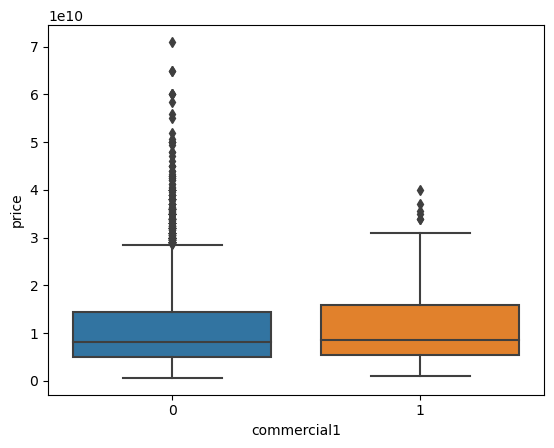

In [776]:
sns.boxplot(x = "commercial1", y = "price", data = f_data[f_data.region == 1])

<Axes: xlabel='commercial2', ylabel='price'>

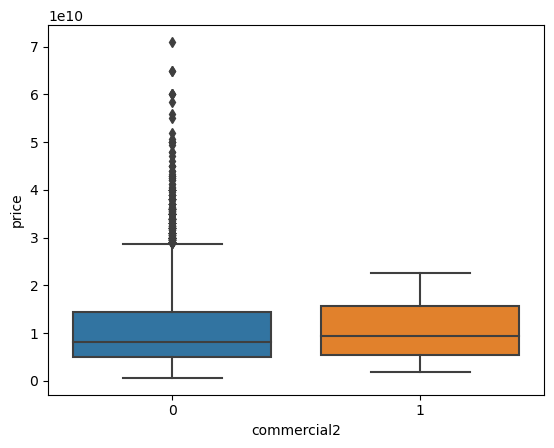

In [777]:
sns.boxplot(x = "commercial2", y = "price", data = f_data[f_data.region == 1])

### sanad

In [778]:
f_data = train_data.copy()

In [779]:
# f_data["pool1"] = 0
# f_data.loc[(f_data.description.notna()) & ((f_data.description.str.contains("استخر|سونا|جکوزی|مجموعه  ابی|مجموعه ابی|مجموعه آبی|مجموعه  آبی"))), "pool1"] = 1
# f_data["pool2"] = 0
# f_data.loc[(f_data.description.notna()) & ((f_data.description.str.contains("مجموعه  ابی|مجموعه ابی|مجموعه آبی|مجموعه  آبی"))), "pool2"] = 1

In [780]:
# sns.boxplot(x = "pool2", y = "price", data = f_data[f_data.neighbor.str.contains("شهدا")])
# sns.stripplot(x = "pool2", y = "price", data = f_data[f_data.neighbor.str.contains("شهدا")])

### parvane

In [781]:
f_data = train_data.copy()

In [782]:
f_data[(f_data.description.notna()) & (f_data.description.str.contains("پروانه"))].price.describe()

count    4.080000e+02
mean     1.596418e+10
std      1.019133e+10
min      7.400000e+08
25%      6.850000e+09
50%      1.595000e+10
75%      2.450000e+10
max      4.500000e+10
Name: price, dtype: float64

<Axes: ylabel='Frequency'>

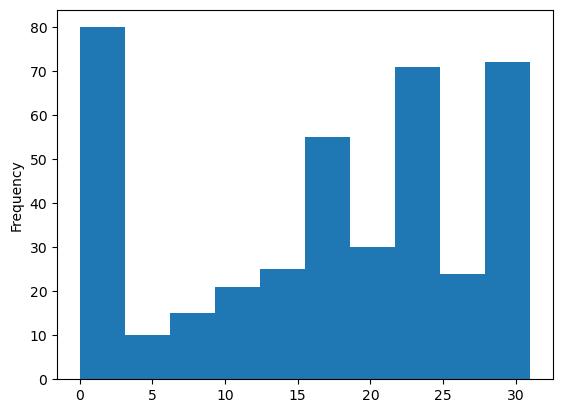

In [783]:
f_data[(f_data.description.notna()) & (f_data.description.str.contains("پروانه"))].age.plot.hist()

<Axes: xlabel='neighbor'>

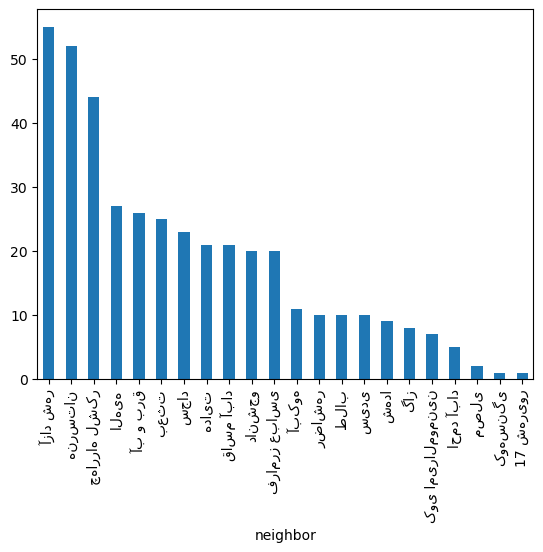

In [784]:
f_data[(f_data.description.notna()) & (f_data.description.str.contains("پروانه"))].neighbor.value_counts().plot.bar()

<Axes: ylabel='Frequency'>

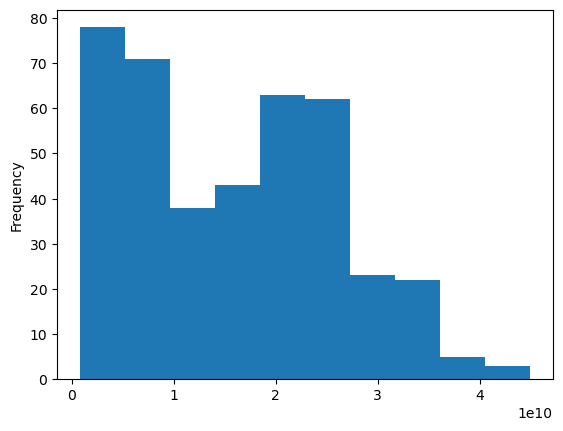

In [785]:
f_data[(f_data.description.notna()) & (f_data.description.str.contains("پروانه"))].price.plot.hist()

In [786]:
# show_description(f_data[(f_data.description.notna()) & (f_data.description.str.contains("پروانه"))], sample_=4)

In [787]:
f_data["buildingـpermit"] = 0
f_data.loc[(f_data.description.notna()) & (f_data.description.str.contains("پروانه")), "buildingـpermit"] = 1

<Axes: xlabel='buildingـpermit', ylabel='price'>

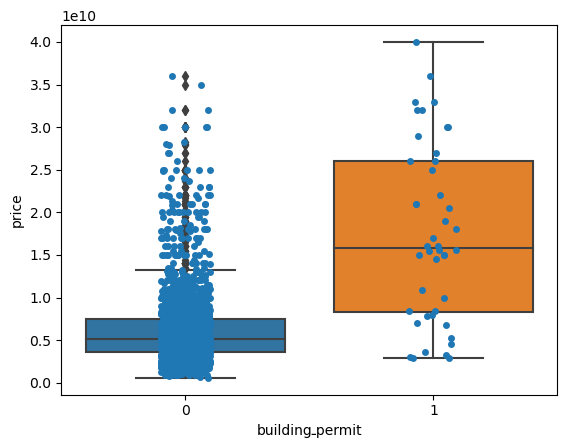

In [788]:
sns.boxplot(x = "buildingـpermit", y = "price", data = f_data[f_data.neighbor.str.contains("چها")])
sns.stripplot(x = "buildingـpermit", y = "price", data = f_data[f_data.neighbor.str.contains("چها")])

### ---

In [789]:
def feature_engineering2(df):
    
    data = df.copy()
    
    data["nabsh2"] = 1
    data.loc[(data.description.notna())  & (data.description.str.contains("دو نبش|دونبش")),
    "nabsh2"] = 2
    data.loc[(data.description.notna())  & (data.description.str.contains("سهنبش|سه نبش|سهنبش")), 
    "nabsh2"] = 3

    # data["nabsh"] = 0
    # data.loc[(data.description.notna())  & (data.description.str.contains("سهنبش|سه نبش|سنبش|دو نبش|دونبش")), "nabsh"] = 1
    data["mamar"] = 0
    data.loc[(data.description.notna())  & (data.description.str.contains("دو ممر|دوممر|دوکله|دو کله")), "mamar"] = 1
    
    data["Proximity"] = 0
    data.loc[(data.description.notna()) & ((data.description.str.contains("حاشیه|حومه|نزدیک")) &
                                                     (data.description.str.contains("وکیل آباد|وکیل اباد|ملک آباد|ملک اباد"))),
    "Proximity"] = 1
    
    data["Density"] = 0
    data.loc[(data.description.notna()) & ( (data.description.str.contains("تراکم : بالا|تراکم :بالا|تراکم: بالا|تراکم  بالا|تراکم بالا|تراکم :زیاد|تراکم: زیاد|تراکم : زیاد|تراکم زیاد|تراکم  زیاد"))), 
    "Density"] = 1

    data["pool"] = 0
    # # data.loc[(data.description.notna()) & ((data.description.str.contains("استخر|سونا|جکوزی|مجموعه  ابی|مجموعه ابی|مجموعه آبی|مجموعه  آبی"))), "pool"] = 1
    data.loc[(data.description.notna()) & ((data.description.str.contains("مجموعه  ابی|مجموعه ابی|مجموعه آبی|مجموعه  آبی"))), "pool"] = 1

    data["commercial"] = 0
    data.loc[(data.description.notna()) & ((data.description.str.contains("مسکونی")) & (data.description.str.contains("مغازه|تجاری"))), "commercial"] = 1
    # data.loc[(data.description.notna()) & (data.description.str.contains("مغازه|تجاری")), "commercial"] = 1

    # data["buildingـpermit"] = 0
    # data.loc[(data.description.notna()) & (data.description.str.contains("پروانه")), "buildingـpermit"] = 1
    
    return data

In [790]:
def add_new_features_test(df):
    global neighbor_mode_facilities
    
    test_data = df.copy()
    
    test_data.loc[(test_data.description.notna()) & (test_data.description.str.contains("با آسانسور|آسانسور تا|آسانسور دار|آسانسور دارد")),
    "elevator"] = 1
    test_data.loc[(test_data.description.notna()) & (test_data.description.str.contains("بدون آسانسور|آسانسور ندارد")), "elevator"] = 0
    
    test_data.loc[(test_data.description.notna()) & (test_data.description.str.contains("پارکینگ دارد")), "parking"] = 1
    test_data.loc[(test_data.description.notna()) & (test_data.description.str.contains("بدون پارکینگ|پارکینگ ندارد")), "parking"] = 0
    
    test_data.loc[(test_data.description.notna()) & (test_data.description.str.contains("انباری دارد")), "storage"] = 1
    test_data.loc[(test_data.description.notna()) & (test_data.description.str.contains("بدون انباری|انباری ندارد")), "storage"] = 0

    el_na = test_data[(test_data.elevator.isna())& (test_data.description.notna()) & (test_data.description.str.contains("آسانسور"))]
    el_na.loc[:,"elevator"] = el_na.description.apply(lambda x : cut_data(x, "آسانسور"))
    test_data.loc[el_na[(el_na.elevator.str.contains("نصب"))].index, "elevator"] = 0
    test_data.loc[el_na[(el_na.elevator.str.contains("آسانسور"))].index, "elevator"] = 1
    st_na = test_data[(test_data.storage.isna())& (test_data.description.notna()) & (test_data.description.str.contains("انباری"))]
    test_data.loc[st_na.index, "storage"] = 1
    prk_na = test_data[(test_data.parking.isna())& (test_data.description.notna()) & (test_data.description.str.contains("پارکینگ"))]
    test_data.loc[prk_na.index, "parking"] = 1

    test_data.loc[(test_data.elevator.isna()) & (test_data.type.str.contains("ویلایی")), "elevator"] = 0
    test_data.loc[(test_data.storage.isna()) & (test_data.parking.isna()) & (test_data.type.str.contains("ویلایی")),["parking", "storage"]] = 1

    for neighbor,y in neighbor_mode_facilities.iterrows():
        test_data.loc[(test_data.neighbor == neighbor[0]) & (test_data.elevator.isna()), "elevator"] = y[0]
        test_data.loc[(test_data.neighbor == neighbor[0]) & (test_data.parking.isna()), "parking"] = y[1]
        test_data.loc[(test_data.neighbor == neighbor[0]) & (test_data.storage.isna()), "storage"] = y[2]
        
    test_data = feature_engineering2(test_data)
    return test_data

In [791]:
def test_clean(df):
    
    df_test = df.copy()
    df_test["region"] =  df_test.neighborhood.dropna().apply(lambda x : (x[:x.find("محله")].replace("منطقه", "").strip()))
    df_test["neighbor"] = df_test.neighborhood.dropna().apply(lambda x : (x[x.find("محله") : x.find("خیابان")].replace("محله", "").strip()))
    df_test["street"] =  df_test.neighborhood.dropna().apply(lambda x : (x[x.find("خیابان") : ].replace("خیابان", "").strip()))
    df_test.loc[df_test.region == "4 و 5", "region"] = 4
    df_test.region = df_test.region.astype(int)
    
    df_test = add_new_features_test(df_test)
    df_test.drop(["price", "description", "neighborhood", "street"], axis = 1, inplace = True)
    df_test = pd.get_dummies(df_test, columns=["type", "neighbor"])

    return df_test

In [792]:
# k_data_new2 = feature_engineering1(k_data_new2)
k_data_new2 = feature_engineering2(k_data_new2)

In [793]:
# k_data_new2.drop("buildingـpermit", axis = 1, inplace=True)

# EDA

In [794]:
def return_correct_format(x):
    return x.apply(lambda k : per_text(k))

In [795]:
data_eda = train_data.copy()

In [796]:
# data_eda[["neighbor", "street"]] = data_eda[[ "neighbor", "street"]].apply(return_correct_format)

In [797]:
data_eda.head()

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,built_year
0,فروش آپارتمان,73.0,منطقه 12 محله الهیه خیابان الهیه,متر امیریه/سند آماده/آسانسور پارکینگ/فول\r\nلو...,36.373776,59.475820,11.0,1.0,2.0,2.200000e+09,12.0,الهیه,الهیه,1391.0
1,فروش آپارتمان,100.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,آپارتمان متر/فول/خوش نقشه/فرامرز\r\nباسلام\n...,36.327670,59.548380,7.0,1.0,2.0,4.800000e+09,2.0,فرامرز عباسی,فرامرز عباسی,1395.0
2,فروش آپارتمان,140.0,منطقه 9 محله هنرستان خیابان هاشمیه,متر در هاشمیه\r\n⚜️⚜️⚜️کارگزاری املاک هورا ⚜️⚜...,36.310605,59.504477,0.0,2.0,2.0,1.020000e+10,9.0,هنرستان,هاشمیه,1402.0
4,فروش آپارتمان,200.0,منطقه 12 محله الهیه خیابان الهیه,/ متر*همکف*فول* مترحیاط باامکانات کامل\r\n⚜وق...,36.373776,59.475820,0.0,0.0,3.0,5.350000e+09,12.0,الهیه,الهیه,1402.0
6,فروش آپارتمان,120.0,منطقه 1 محله بعثت خیابان کوهسنگی,آپارتمان متری اکبری خیابان کوهسنگی\r\nکارش...,36.287180,59.574720,10.0,4.0,2.0,5.200000e+09,1.0,بعثت,کوهسنگی,1392.0


<Axes: xlabel='built_year'>

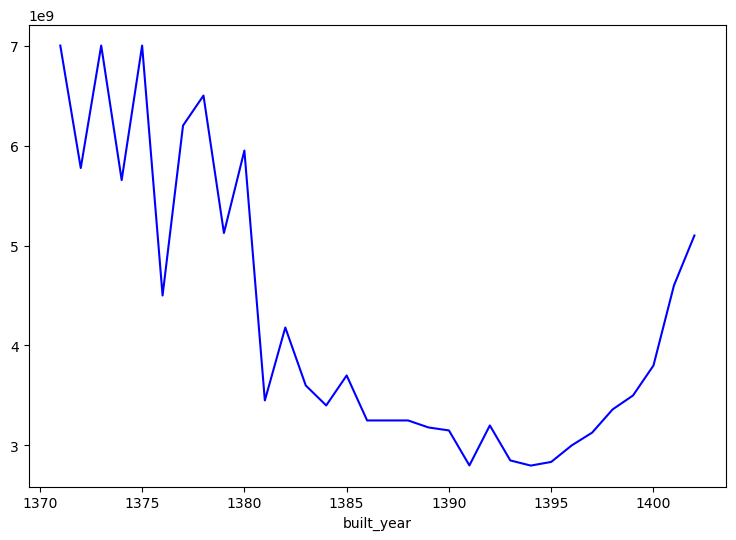

In [798]:
plt.figure(figsize = (9,6))
data_eda.groupby("built_year").price.median().plot(color = "b")

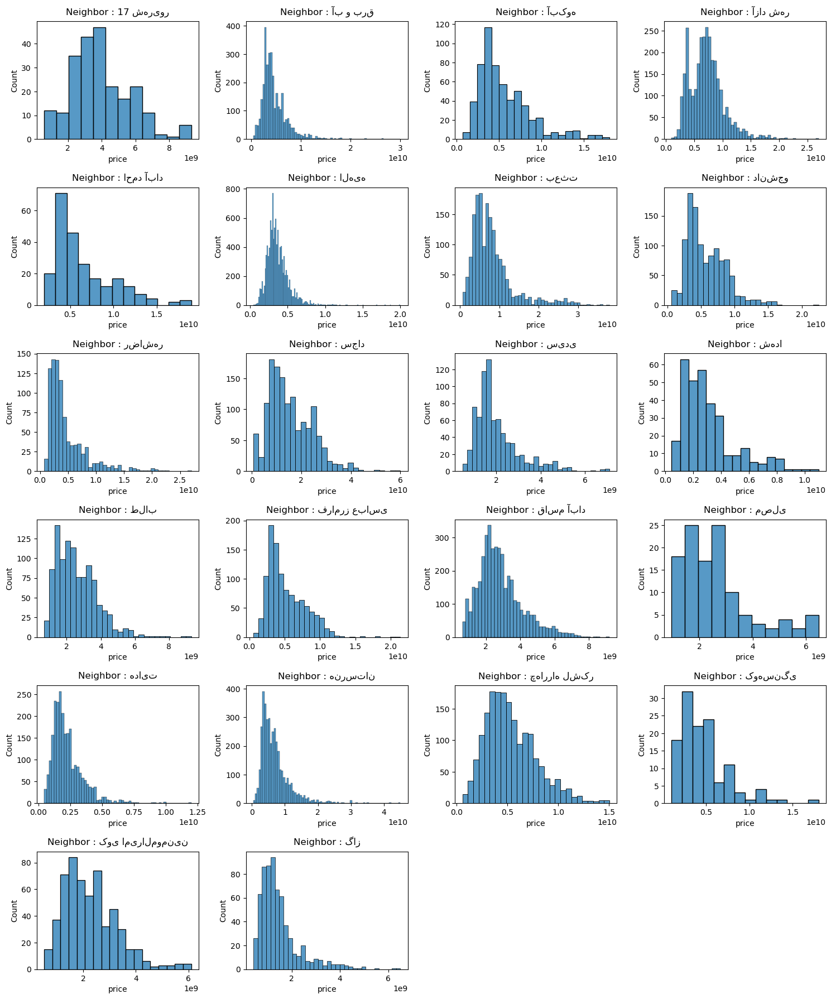

In [799]:
plt.figure(figsize = (15,18))
for idx, neighbor in enumerate(train_data.neighbor.value_counts().sort_index().keys()):
    plt.subplot(6,4,idx + 1)
    sns.histplot(x = "price", data =  train_data[(train_data.neighbor == neighbor) & (train_data.type.str.contains("تمان"))])
    # data_eda[(train_data.neighbor == neighbor) & (train_data.type.str.contains("تمان"))].groupby("built_year").price.median().plot(color = "b")
    plt.title(f"Neighbor : {neighbor}", y = 1.02)
    
plt.tight_layout()
plt.show()

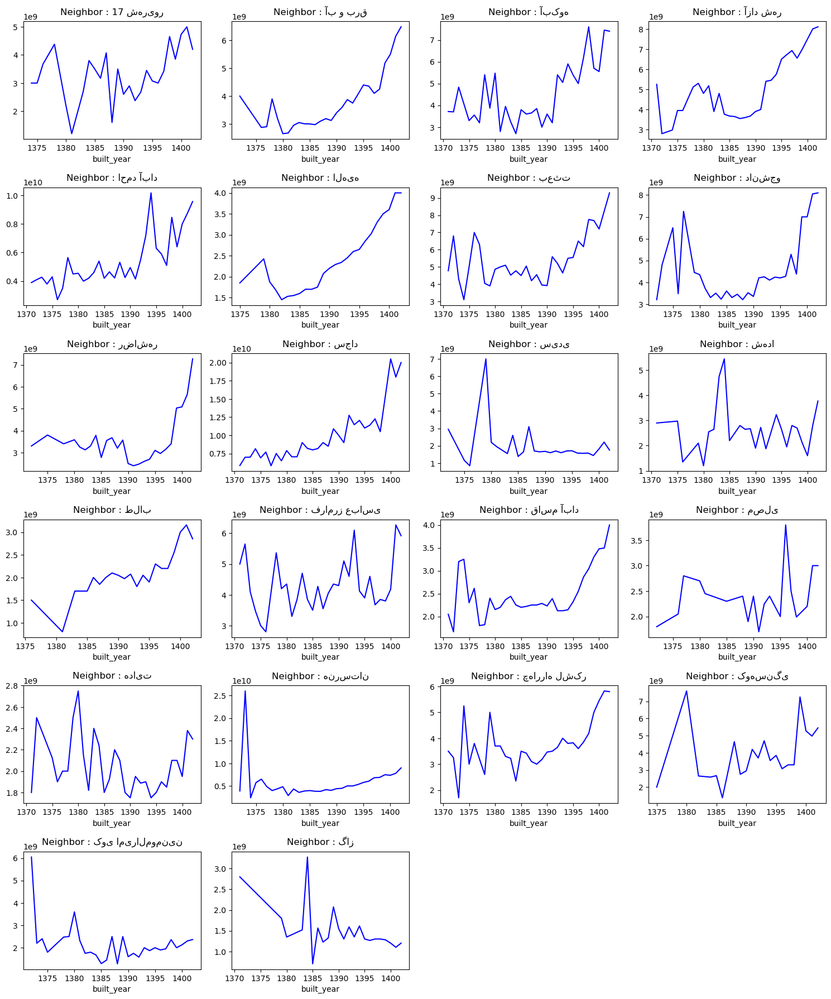

In [800]:
plt.figure(figsize = (15,18))
for idx, neighbor in enumerate(data_eda.neighbor.value_counts().sort_index().keys()):
    plt.subplot(6,4,idx + 1)
    data_eda[(data_eda.neighbor == neighbor) & (data_eda.type.str.contains("تمان"))].groupby("built_year").price.median().plot(color = "b")
    plt.title(f"Neighbor : {neighbor}", y = 1.02)
    
plt.tight_layout()
plt.show()

In [801]:
data_eda

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,built_year
0,فروش آپارتمان,73.0,منطقه 12 محله الهیه خیابان الهیه,متر امیریه/سند آماده/آسانسور پارکینگ/فول\r\nلو...,36.373776,59.475820,11.0,1.0,2.0,2.200000e+09,12.0,الهیه,الهیه,1391.0
1,فروش آپارتمان,100.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,آپارتمان متر/فول/خوش نقشه/فرامرز\r\nباسلام\n...,36.327670,59.548380,7.0,1.0,2.0,4.800000e+09,2.0,فرامرز عباسی,فرامرز عباسی,1395.0
2,فروش آپارتمان,140.0,منطقه 9 محله هنرستان خیابان هاشمیه,متر در هاشمیه\r\n⚜️⚜️⚜️کارگزاری املاک هورا ⚜️⚜...,36.310605,59.504477,0.0,2.0,2.0,1.020000e+10,9.0,هنرستان,هاشمیه,1402.0
4,فروش آپارتمان,200.0,منطقه 12 محله الهیه خیابان الهیه,/ متر*همکف*فول* مترحیاط باامکانات کامل\r\n⚜وق...,36.373776,59.475820,0.0,0.0,3.0,5.350000e+09,12.0,الهیه,الهیه,1402.0
6,فروش آپارتمان,120.0,منطقه 1 محله بعثت خیابان کوهسنگی,آپارتمان متری اکبری خیابان کوهسنگی\r\nکارش...,36.287180,59.574720,10.0,4.0,2.0,5.200000e+09,1.0,بعثت,کوهسنگی,1392.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48115,فروش آپارتمان,110.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,متر / حاشیه فرهنگ / سال ساخت\r\nباسلام\nمفتخر...,36.328550,59.513390,4.0,4.0,2.0,5.100000e+09,11.0,آزاد شهر,فرهنگ,1398.0
48116,فروش آپارتمان,110.0,منطقه 12 محله الهیه خیابان الهیه,اپارتمان متری سه نبش(تهاتر)\r\nتوجه!!!!!! ...,36.371452,59.484620,4.0,3.0,2.0,4.100000e+09,12.0,الهیه,الهیه,1398.0
48117,فروش آپارتمان,140.0,منطقه 9 محله هنرستان خیابان هفت تیر,متر ، خواب ، هفت تیر ، بازسازی شده\r\nموق...,36.319780,59.494770,15.0,1.0,2.0,5.500000e+09,9.0,هنرستان,هفت تیر,1387.0
48118,فروش آپارتمان,130.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,(( مــِـتر رَفـیـعـی ))\r\n❄️❄️❄️❄️❄️❄️❄️❄️...,36.349873,59.488426,4.0,2.0,3.0,4.100000e+09,10.0,قاسم آباد,قاسم آباد,1398.0


<Axes: ylabel='Count'>

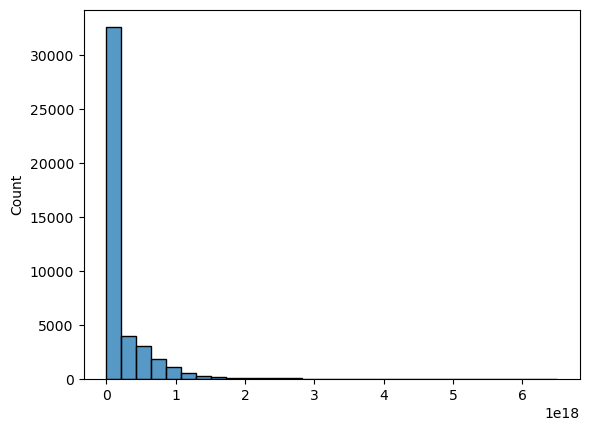

In [802]:
sns.histplot(x = data_eda.price / (data_eda.age + 1e-8), bins = 30)

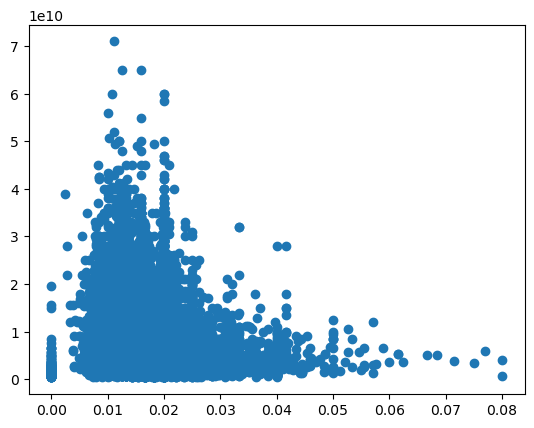

In [803]:
plt.scatter(data_eda.bedrooms / data_eda.area, data_eda.price)

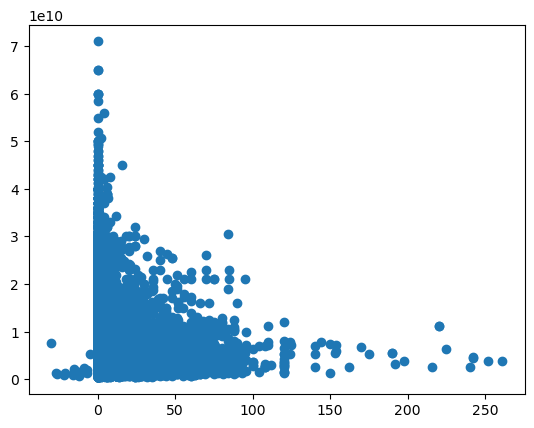

In [804]:
plt.scatter(data_eda.age * data_eda.floor, data_eda.price)

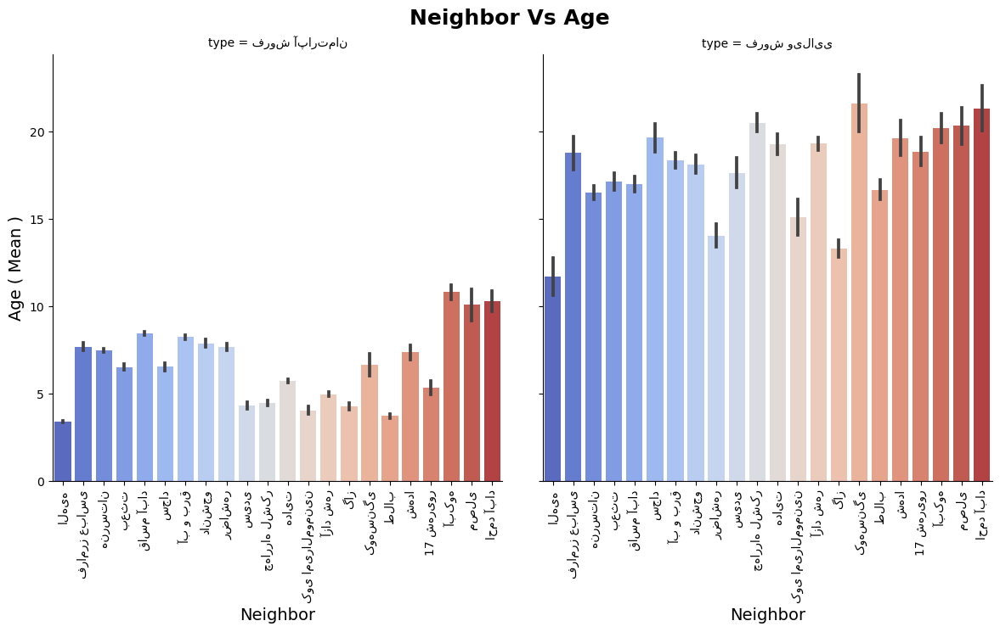

In [805]:
ax = sns.catplot(x = "neighbor", y = "age", estimator="mean", data  = data_eda, col = "type", kind = "bar",  height=6, errorbar="se", palette="coolwarm")
for ax in ax.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
    ax.set_ylabel("Age ( Mean )", size = 14)
    ax.set_xlabel("Neighbor", size = 14)
    
plt.suptitle("Neighbor Vs Age", size = 18, fontweight = "bold", y = 1.03)
plt.show()

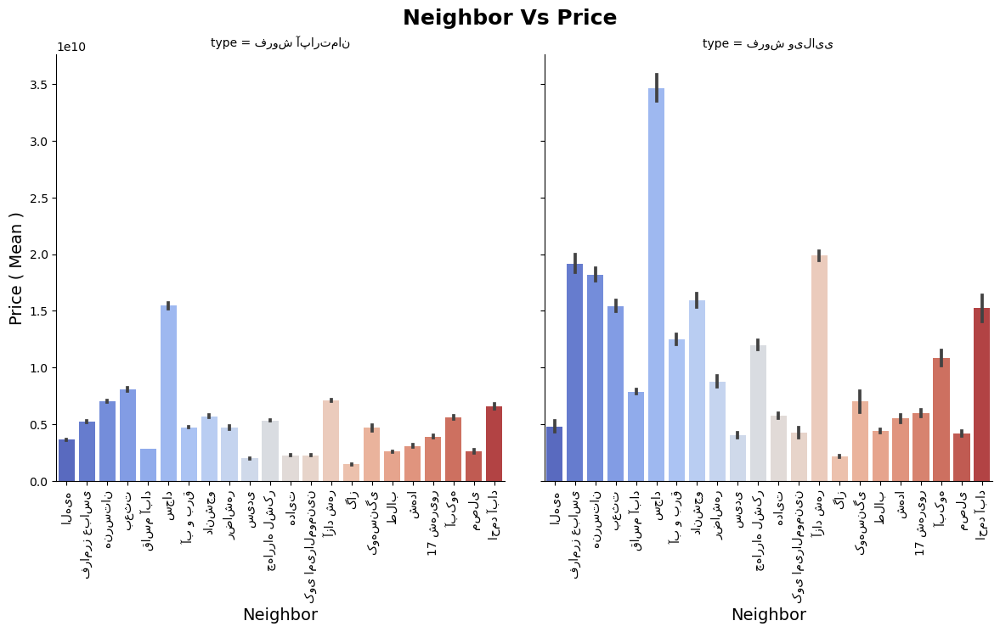

In [806]:
ax = sns.catplot(x = "neighbor", y = "price", estimator="mean", data  = data_eda, col = "type", kind = "bar",  height=6, errorbar="se", palette="coolwarm")
for ax in ax.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
    ax.set_ylabel("Price ( Mean )", size = 14)
    ax.set_xlabel("Neighbor", size = 14)
    
plt.suptitle("Neighbor Vs Price", size = 18, fontweight = "bold", y = 1.03)
plt.show()

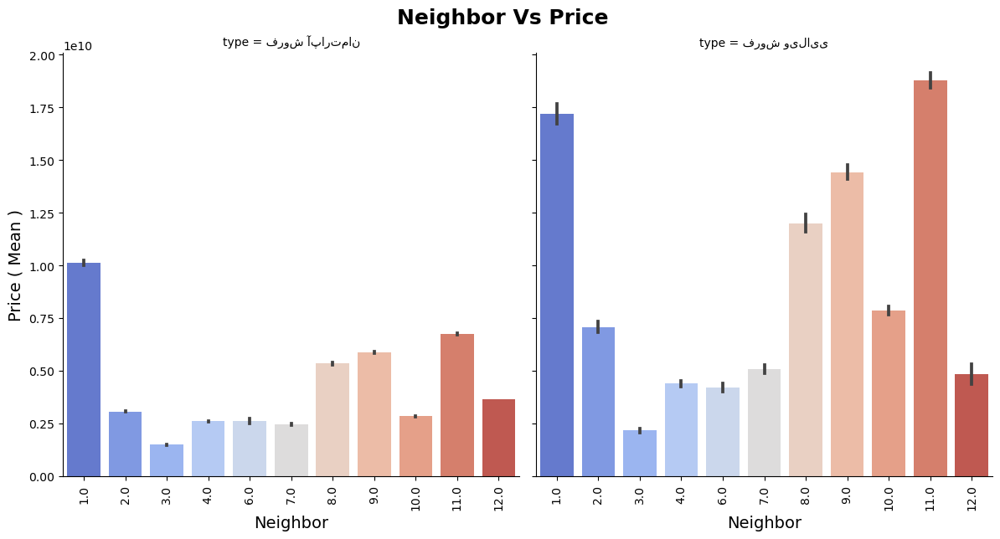

In [807]:
ax = sns.catplot(x = "region", y = "price", estimator="mean", data  = data_eda, col = "type", kind = "bar",  height=6, errorbar="se", palette="coolwarm")
for ax in ax.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
    ax.set_ylabel("Price ( Mean )", size = 14)
    ax.set_xlabel("Neighbor", size = 14)
    
plt.suptitle("Neighbor Vs Price", size = 18, fontweight = "bold", y = 1.03)
plt.show()

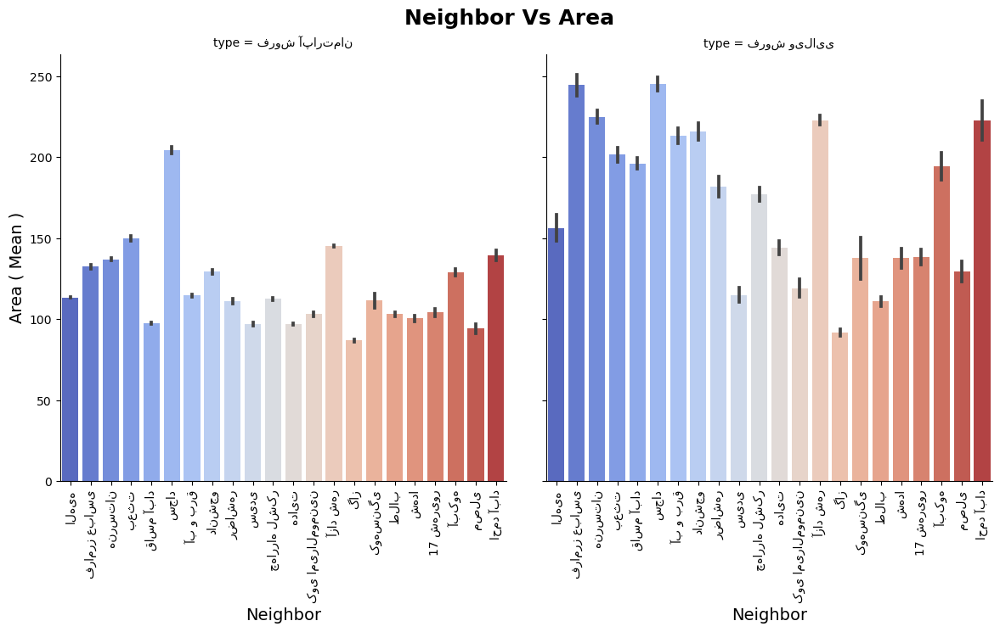

In [808]:
ax = sns.catplot(x = "neighbor", y = "area", estimator="mean", data  = data_eda, col = "type", kind = "bar",  height=6, errorbar="se", palette="coolwarm")
for ax in ax.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
    ax.set_ylabel("Area ( Mean )", size = 14)
    ax.set_xlabel("Neighbor", size = 14)
    
plt.suptitle("Neighbor Vs Area", size = 18, fontweight = "bold", y = 1.03)
plt.show()

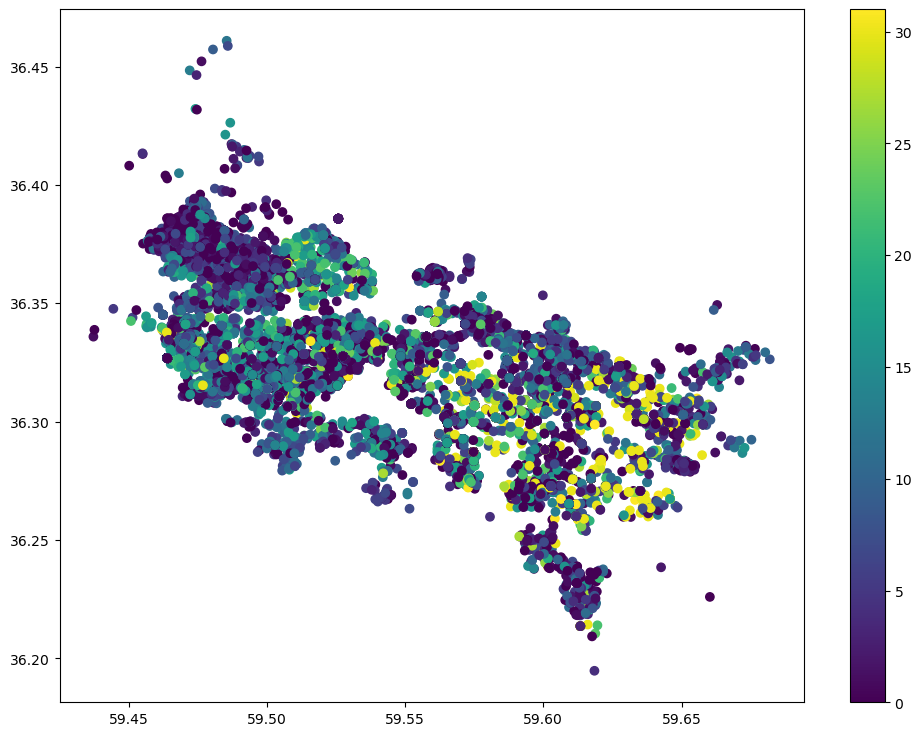

In [809]:
fig, ax = plt.subplots(figsize = (12,9))
im = ax.scatter("longitude" ,"latitude", c="age", data = data_eda)
fig.colorbar(im, ax=ax)

plt.show()

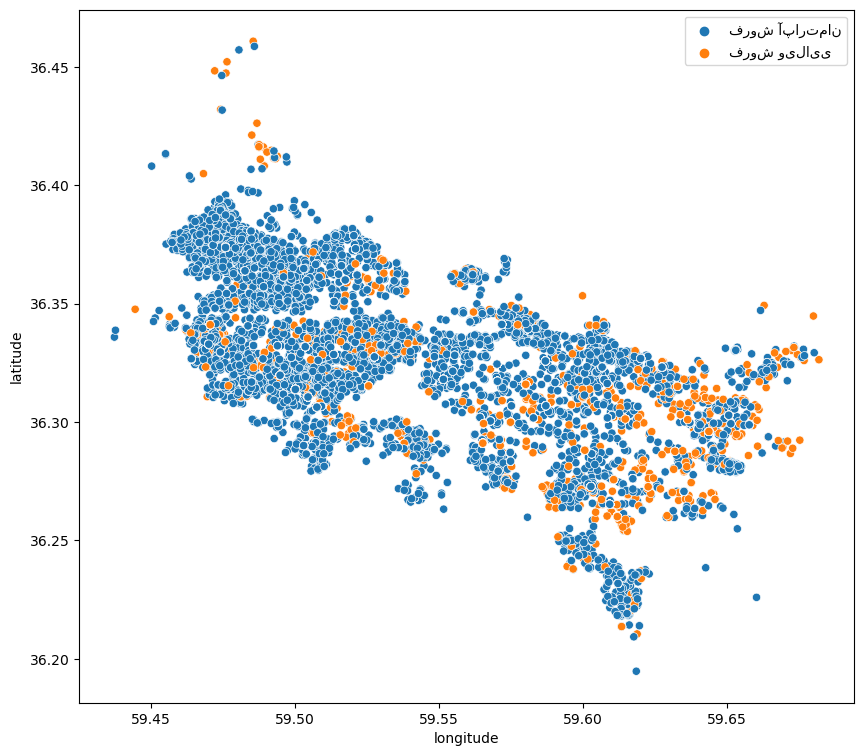

In [810]:
fig =  plt.figure(figsize = (10,9))
ax = sns.scatterplot(x = "longitude", y = "latitude", data = data_eda, hue = "type")
plt.legend(loc= 1)

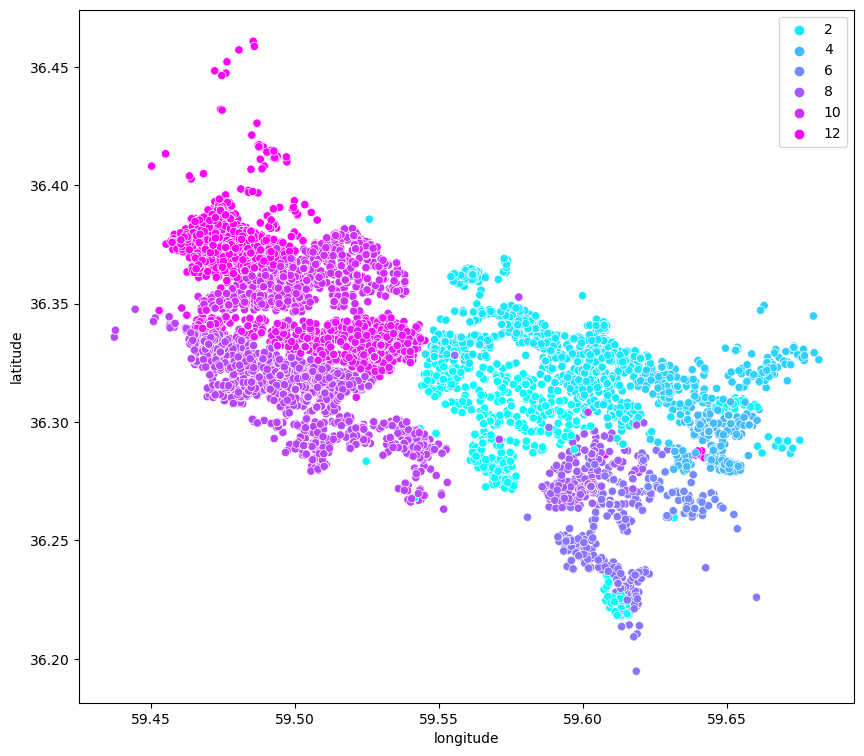

In [811]:
fig =  plt.figure(figsize = (10,9))
ax = sns.scatterplot(x = "longitude", y = "latitude", data = data_eda,hue = "region", palette="cool")

plt.legend(loc= 1)

<Axes: xlabel='area', ylabel='price'>

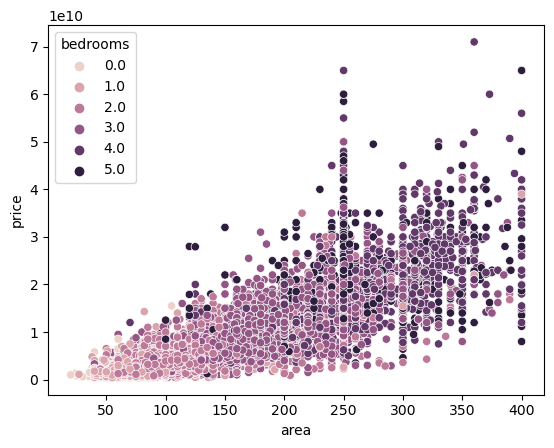

In [812]:
sns.scatterplot(x = "area", y = "price", hue = "bedrooms", data = data_eda)

<Axes: ylabel='count'>

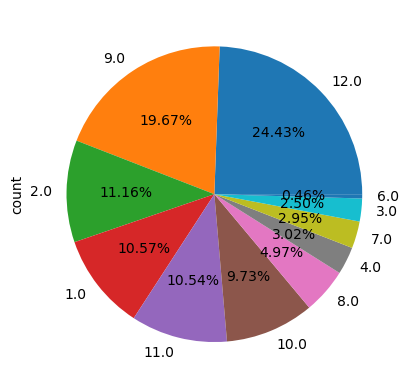

In [813]:
data_eda.region.value_counts().plot.pie(autopct = "%.2f%%")

In [814]:
data_eda

,type,area,neighborhood,description,latitude,longitude,age,floor,bedrooms,price,region,neighbor,street,built_year
0,فروش آپارتمان,73.0,منطقه 12 محله الهیه خیابان الهیه,متر امیریه/سند آماده/آسانسور پارکینگ/فول\r\nلو...,36.373776,59.475820,11.0,1.0,2.0,2.200000e+09,12.0,الهیه,الهیه,1391.0
1,فروش آپارتمان,100.0,منطقه 2 محله فرامرز عباسی خیابان فرامرز عباسی,آپارتمان متر/فول/خوش نقشه/فرامرز\r\nباسلام\n...,36.327670,59.548380,7.0,1.0,2.0,4.800000e+09,2.0,فرامرز عباسی,فرامرز عباسی,1395.0
2,فروش آپارتمان,140.0,منطقه 9 محله هنرستان خیابان هاشمیه,متر در هاشمیه\r\n⚜️⚜️⚜️کارگزاری املاک هورا ⚜️⚜...,36.310605,59.504477,0.0,2.0,2.0,1.020000e+10,9.0,هنرستان,هاشمیه,1402.0
4,فروش آپارتمان,200.0,منطقه 12 محله الهیه خیابان الهیه,/ متر*همکف*فول* مترحیاط باامکانات کامل\r\n⚜وق...,36.373776,59.475820,0.0,0.0,3.0,5.350000e+09,12.0,الهیه,الهیه,1402.0
6,فروش آپارتمان,120.0,منطقه 1 محله بعثت خیابان کوهسنگی,آپارتمان متری اکبری خیابان کوهسنگی\r\nکارش...,36.287180,59.574720,10.0,4.0,2.0,5.200000e+09,1.0,بعثت,کوهسنگی,1392.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48115,فروش آپارتمان,110.0,منطقه 11 محله آزاد شهر خیابان فرهنگ,متر / حاشیه فرهنگ / سال ساخت\r\nباسلام\nمفتخر...,36.328550,59.513390,4.0,4.0,2.0,5.100000e+09,11.0,آزاد شهر,فرهنگ,1398.0
48116,فروش آپارتمان,110.0,منطقه 12 محله الهیه خیابان الهیه,اپارتمان متری سه نبش(تهاتر)\r\nتوجه!!!!!! ...,36.371452,59.484620,4.0,3.0,2.0,4.100000e+09,12.0,الهیه,الهیه,1398.0
48117,فروش آپارتمان,140.0,منطقه 9 محله هنرستان خیابان هفت تیر,متر ، خواب ، هفت تیر ، بازسازی شده\r\nموق...,36.319780,59.494770,15.0,1.0,2.0,5.500000e+09,9.0,هنرستان,هفت تیر,1387.0
48118,فروش آپارتمان,130.0,منطقه 10 محله قاسم آباد خیابان قاسم آباد,(( مــِـتر رَفـیـعـی ))\r\n❄️❄️❄️❄️❄️❄️❄️❄️...,36.349873,59.488426,4.0,2.0,3.0,4.100000e+09,10.0,قاسم آباد,قاسم آباد,1398.0


In [815]:
data_eda[(data_eda.neighbor == "ﯽﺳﺎﺒﻋ ﺯﺮﻣﺍﺮﻓ")].nunique()

type            0
area            0
neighborhood    0
description     0
latitude        0
longitude       0
age             0
floor           0
bedrooms        0
price           0
region          0
neighbor        0
street          0
built_year      0
dtype: int64

In [816]:
data_eda.nunique()

type                2
area              337
neighborhood      272
description     41389
latitude         5727
longitude        5779
age                32
floor              21
bedrooms            6
price            2594
region             11
neighbor           22
street            272
built_year         32
dtype: int64

In [817]:
# sns.boxplot(x = "dis_to_hls", y = "price", data = train_data)

# Feature Encoding

In [818]:
k_data_new2 = k_data_new2.astype({"floor" :int , "bedrooms" : int, "region" : int})

In [819]:
k_data_new3 = remove_redundant_features(k_data_new2, ["neighborhood","description","street"])

In [820]:
k_data_new3.drop_duplicates(inplace=True)

In [821]:
k_data_new4 = k_data_new3.copy()

### other

In [822]:
# train_data_new = remove_redundant_features(train_data_new, ["neighborhood","description","street"])

In [823]:
# train_data_new.drop_duplicates(inplace=True)

# Model Building

In [824]:
from sklearn.metrics import mean_absolute_percentage_error, r2_score, mean_absolute_error, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import  RandomizedSearchCV
from sklearn.metrics import make_scorer
import lightgbm as lgb
import xgboost as xgb
from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor

In [825]:
def range_accuracy(y_true, y_pred):
    
    return (len([1 for lower_bound, upper_bound, y_pr in zip(y_true - (y_true * 20/100),
                                                                       y_true + (y_true* 20/100),
                                                                       y_pred) if y_pr >= lower_bound and y_pr <= upper_bound] )/ len(y_pred)) * 100

In [826]:
def eval(y_true_test, y_pred_test, y_true_train, y_pred_train) :
    global X_val

    fig, ax = plt.subplots(1,2, figsize = (15,5))
    ax[0].scatter(x = y_true_test, y = y_pred_test, color = "b")
    ax[0].set_title("y_true VS. y_pred", size = 15, y = 1.02)
    ax[0].set_ylabel("y_pred")
    ax[0].set_xlabel("y_true")
    ax[0].grid()
    ax[1].plot(range(len(y_true_test)) , y_true_test - y_pred_test, color = "r")
    ax[1].set_title("Residuals", size = 15, y = 1.02)
    ax[1].set_ylabel("y_true - y_pred")
    ax[1].set_xlabel("iteratoins")
    ax[1].grid()
    plt.show()

    mape_test, mape_train = mean_absolute_percentage_error(y_true_test, y_pred_test), mean_absolute_percentage_error(y_true_train, y_pred_train)
    rangeAccuracy_test, rangeAccuracy_train = range_accuracy(y_true_test, y_pred_test), range_accuracy(y_true_train, y_pred_train)
    r2_test, r2_train = r2_score(y_true_test, y_pred_test), r2_score(y_true_train, y_pred_train)
    MRR_Mean_test, MRR_Mean_train = np.mean([(1-mape_test), rangeAccuracy_test/100, r2_test]) * 100, np.mean([(1-mape_train), rangeAccuracy_train/100, r2_train]) * 100
    mae_test, mae_train = mean_absolute_error(y_true_test, y_pred_test), mean_absolute_error(y_true_train, y_pred_train)
    metrics_df = pd.DataFrame({"MAPE" : [mape_test, mape_train],
                              "Range_Accuracy" : [rangeAccuracy_test, rangeAccuracy_train],
                              "R2" : [r2_test, r2_train], 
                              "MRR_Mean" : [MRR_Mean_test, MRR_Mean_train], 
                              "MAE" : [mae_test, mae_train]}, index = ["Test", "Train"])
    

    return metrics_df
    

In [827]:
def get_result(y_val, y_pred, X_val):
    neighbor = [key.split("_")[1]  for idx in y_val.index for key, value in X_val.loc[idx, X_val.columns.str.contains("neighbor")].items() if value > 0]
    type_ = [key.split()[1]  for idx in y_val.index for key, value in X_val.loc[idx, X_val.columns.str.contains("type")].items() if value > 0]
    results = pd.DataFrame([y_val.to_numpy(), y_pred, y_val.to_numpy() - y_pred, neighbor, type_],
            index = ["y_val", "y_pred", "residuals", "neighbor", "type"]).T.astype({"y_pred" : float, "y_val" : float, "residuals" : float})
    return results

In [828]:
def show_desc_y(y_train, y_val):
    print(y_train.describe(),y_val.describe(), sep = "\n")
    y_train.plot.hist()
    y_val.plot.hist()

In [829]:
def plot_model_result(y_val, y_pred, X_val, limit = (5e9, 5e9)):
    
    res = get_result(y_val, y_pred, X_val)
    sns.relplot(x = "y_val", y = "y_pred", hue = "neighbor", data = res, col = "type")
    plt.show()
    sns.relplot(x = "y_val", y = "y_pred", row = "neighbor", data = res, col = "type")
    plt.show()
    res[(res.residuals >= limit[0]) | (res.residuals <= -limit[1])].groupby(["type"]).neighbor.value_counts().to_frame().plot.bar(figsize = (12,6))
    plt.show()

In [830]:
def split_data(df, bins = 8, random_state = 0, scale = True,test_size=.2):
    
    price_bins = pd.cut(df.price , bins)
    X_train, X_val, y_train, y_val = train_test_split(df.drop(["price"], axis = 1), df.price, random_state=random_state, stratify=price_bins,
                                                     test_size=test_size)
    show_desc_y(y_train, y_val)
    if scale :
        scaler = StandardScaler()
        X_train_s = pd.DataFrame(scaler.fit_transform(X_train), columns=scaler.feature_names_in_)
        X_val_s = pd.DataFrame(scaler.transform(X_val), columns=scaler.feature_names_in_)
        return X_train, X_val, y_train, y_val, X_train_s, X_val_s, scaler
    return X_train, X_val, y_train, y_val

In [831]:
def feature_importance(model):
    
    importances = pd.DataFrame(model.feature_importances_, index  = model.feature_names_in_, columns=["importance"]).sort_values("importance", ascending=False)
    importances.plot.bar(figsize = (12,6), color = "b")
    plt.title("Feature Importances", size = 15, fontweight = "bold",y = 1.04)
    plt.xlabel("Features", size = 13)
    plt.ylabel("score", size = 13)
    plt.show()
    

In [832]:
k_data_new3 = pd.get_dummies(k_data_new3, columns=["type", "neighbor"])

In [834]:
# raise ValueError("csddcs")

# GradientBoostingRegressor

### 1

In [ ]:
X_train, X_val, y_train, y_val, X_train_s, X_val_s, scaler = split_data(k_data_new3, random_state=41) 

In [ ]:
gb_model1 = GradientBoostingRegressor(n_estimators=300, max_depth=20, min_samples_split=10, 
                                      min_samples_leaf=2, learning_rate=.02, random_state=0, max_features="sqrt",
                                     loss = "huber")
gb_model1.fit(X_train_s,y_train)
y_pred = gb_model1.predict(X_val_s)
y_pred_train = gb_model1.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

In [ ]:
# test_data = pd.read_csv("test.csv")
# test_data_ans22 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans22), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_model1.predict(X_test_s)
# X_test_s.to_csv("test_answer22.csv", index=False)

In [ ]:
feature_importance(gb_model1)

### 2

In [ ]:
k_data_new4 = pd.get_dummies(k_data_new4, columns=["type", "neighbor"])

In [ ]:
X_train, X_val, y_train, y_val, X_train_s, X_val_s, scaler = split_data(k_data_new4, random_state=100, test_size=.15) 

#### other

In [ ]:
# gb_model2 = GradientBoostingRegressor(n_estimators=300, max_depth=20, min_samples_split=10, 
#                                       min_samples_leaf=3, learning_rate=.02, random_state=0, max_features="sqrt",
#                                      loss = "huber")
# gb_model2.fit(X_train_s,y_train)
# y_pred = gb_model2.predict(X_val_s)
# y_pred_train = gb_model2.predict(X_train_s)
# eval(y_val, y_pred, y_train, y_pred_train)

In [ ]:
# test_data = pd.read_csv("test.csv")
# test_data_ans23 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans23), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_model2.predict(X_test_s)
# X_test_s.to_csv("test_answer23.csv", index=False)

In [ ]:
# plot_model_result(y_val, y_pred, X_val)

In [ ]:
# gb_model3 = GradientBoostingRegressor(n_estimators=300, max_depth=20, min_samples_split=10, 
#                                       min_samples_leaf=2, learning_rate=.02, random_state=0, max_features="sqrt",
#                                      loss = "huber")
# gb_model3.fit(X_train_s,y_train)
# y_pred = gb_model3.predict(X_val_s)
# y_pred_train = gb_model3.predict(X_train_s)
# eval(y_val, y_pred, y_train, y_pred_train)

In [ ]:
# test_data = pd.read_csv("test.csv")
# test_data_ans24 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans24), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_model3.predict(X_test_s)
# X_test_s.to_csv("test_answer24.csv", index=False)

In [ ]:
# plot_model_result(y_val, y_pred, X_val)

In [ ]:
# gb_model4 = GradientBoostingRegressor(n_estimators=300, max_depth=18, min_samples_split=12,
#                                       min_samples_leaf=2, learning_rate=.02, random_state=0, max_features="sqrt",
#                                      loss = "huber")
# gb_model4.fit(X_train_s,y_train)
# y_pred = gb_model4.predict(X_val_s)
# y_pred_train = gb_model4.predict(X_train_s)
# eval(y_val, y_pred, y_train, y_pred_train)

In [ ]:
# test_data = pd.read_csv("test.csv")
# test_data_ans27 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans27), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_model4.predict(X_test_s)
# X_test_s.to_csv("test_answer27.csv", index=False)

86.436

#### With huber loss Alpha

##### the best one

In [ ]:
gb_model5 = GradientBoostingRegressor(n_estimators=300, max_depth=20, min_samples_split=9, 
                                      min_samples_leaf=2, learning_rate=.02, random_state=0, max_features="sqrt",
                                     loss = "huber", alpha=0.6)
gb_model5.fit(X_train_s,y_train)
y_pred = gb_model5.predict(X_val_s)
y_pred_train = gb_model5.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

In [ ]:
# test_data = pd.read_csv("test.csv")
# test_data_ans25 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans25), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_model5.predict(X_test_s)
# X_test_s.to_csv("test_answer25.csv", index=False)

86.713

In [ ]:
# test_data = pd.read_csv("test.csv")
# test_data_ans31 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans31), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_model5.predict(X_test_s)
# X_test_s.to_csv("test_answer31.csv", index=False)

86.761

In [ ]:
feature_importance(gb_model5)

In [ ]:
k_data_new4.price.quantile(.2)

In [ ]:
plot_model_result(y_val, y_pred, X_val, (y_val.quantile(.2), -1 * y_val.quantile(.2)))

In [ ]:
y_train.quantile(.2)

In [ ]:
gb_model6 = GradientBoostingRegressor(n_estimators=300, max_depth=25, min_samples_split=8, 
                                      min_samples_leaf=2, learning_rate=.02, random_state=0, max_features="sqrt",
                                     loss = "huber", alpha=0.3)
gb_model6.fit(X_train_s,y_train)
y_pred2 = gb_model6.predict(X_val_s)
y_pred_train2 = gb_model6.predict(X_train_s)
eval(y_val, y_pred2, y_train, y_pred_train2)

In [ ]:
# test_data = pd.read_csv("test.csv")
# test_data_ans32 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans32), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_model6.predict(X_test_s)
# X_test_s.to_csv("test_answer32.csv", index=False)

In [ ]:
# %%time
# gb_model6 = GradientBoostingRegressor(n_estimators=350, max_depth=18, min_samples_split=12,
#                                       min_samples_leaf=2, learning_rate=.02, random_state=0, max_features="sqrt",
#                                      loss = "huber", alpha = .8)
# gb_model6.fit(X_train_s,y_train)
# y_pred = gb_model6.predict(X_val_s)
# y_pred_train = gb_model6.predict(X_train_s)
# eval(y_val, y_pred, y_train, y_pred_train)

In [ ]:
# test_data = pd.read_csv("test.csv")
# test_data_ans26 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans26), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_model6.predict(X_test_s)
# X_test_s.to_csv("test_answer26.csv", index=False)

86.547

In [ ]:
# gb_model7 = GradientBoostingRegressor(n_estimators=300, max_depth=18, min_samples_split=12,
#                                       min_samples_leaf=2, learning_rate=.02, random_state=0, max_features="sqrt",
#                                      loss = "huber", alpha = .7)
# gb_model7.fit(X_train_s,y_train)
# y_pred = gb_model7.predict(X_val_s)
# y_pred_train = gb_model7.predict(X_train_s)
# eval(y_val, y_pred, y_train, y_pred_train)

In [ ]:
# test_data = pd.read_csv("test.csv")
# test_data_ans28 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans28), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_model7.predict(X_test_s)
# X_test_s.to_csv("test_answer28.csv", index=False)

86.641

In [ ]:
y_val.quantile(.4), y_train.quantile(.5)

In [ ]:
# gb_model8 = GradientBoostingRegressor(n_estimators=300, max_depth=18, min_samples_split=12,
#                                       min_samples_leaf=2, learning_rate=.02, random_state=0, max_features="sqrt",
#                                      loss = "huber", alpha = .8)
# gb_model8.fit(X_train_s,y_train)
# y_pred = gb_model8.predict(X_val_s)
# y_pred_train = gb_model8.predict(X_train_s)
# eval(y_val, y_pred, y_train, y_pred_train)

In [ ]:
# test_data = pd.read_csv("test.csv")
# test_data_ans31 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans31), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_model8.predict(X_test_s)
# X_test_s.to_csv("test_answer31.csv", index=False)

In [ ]:
# gb_model9 = GradientBoostingRegressor(n_estimators=400, learning_rate=.08, random_state=0, max_features="sqrt",
#                                      loss = "huber", alpha = .7,min_samples_split=6, max_depth=12, min_samples_leaf=2)
# gb_model9.fit(X_train_s,y_train)
# y_pred = gb_model9.predict(X_val_s)
# y_pred_train = gb_model9.predict(X_train_s)
# eval(y_val, y_pred, y_train, y_pred_train)

In [ ]:
# gb_model9 = GradientBoostingRegressor(n_estimators=400, learning_rate=.07, random_state=0, max_features="sqrt",
#                                      loss = "huber", alpha = .6,min_samples_split=7, max_depth=12, min_samples_leaf=2)
# gb_model9.fit(X_train_s,y_train)
# y_pred = gb_model9.predict(X_val_s)
# y_pred_train = gb_model9.predict(X_train_s)
# eval(y_val, y_pred, y_train, y_pred_train)

In [ ]:
# gb_model9 = GradientBoostingRegressor(n_estimators=400, learning_rate=.06, random_state=0, max_features="sqrt",
#                                      loss = "huber", alpha = .6,min_samples_split=10, max_depth=15, min_samples_leaf=2)
# gb_model9.fit(X_train_s,y_train)
# y_pred = gb_model9.predict(X_val_s)
# y_pred_train = gb_model9.predict(X_train_s)
# eval(y_val, y_pred, y_train, y_pred_train)

### other

##### The new Best One 86.833

In [836]:
k_data_new4 = pd.get_dummies(k_data_new4, columns=["type", "neighbor"])

count    3.817800e+04
mean     5.498928e+09
std      5.230065e+09
min      3.500000e+08
25%      2.600000e+09
50%      3.850000e+09
75%      6.500000e+09
max      7.100000e+10
Name: price, dtype: float64
count    4.242000e+03
mean     5.505522e+09
std      5.182107e+09
min      4.000000e+08
25%      2.660000e+09
50%      3.900000e+09
75%      6.500000e+09
max      5.500000e+10
Name: price, dtype: float64


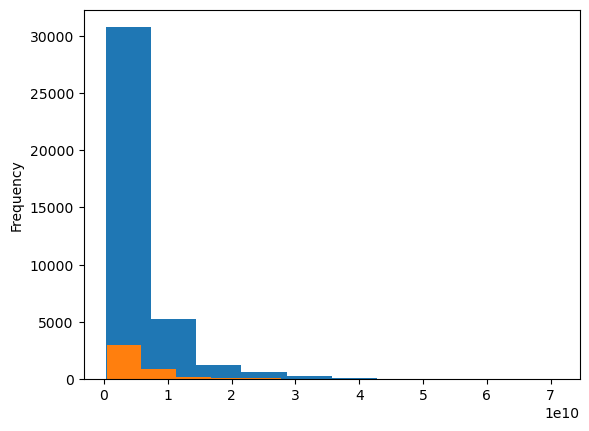

In [849]:
X_train, X_val, y_train, y_val, X_train_s, X_val_s, scaler = split_data(k_data_new4, random_state=100, test_size=.1) 

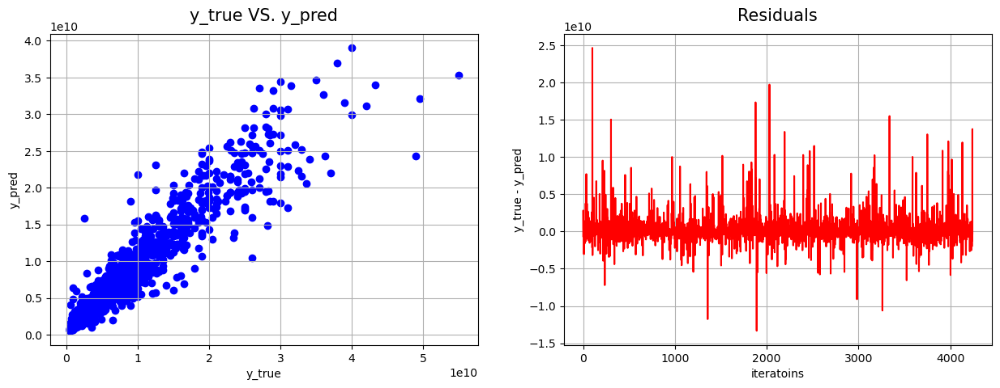

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.133637,81.94248,0.907731,86.450633,7.331749e+08
Train,0.076234,92.26256,0.953803,93.339793,4.490000e+08


In [850]:
gb_model7 = GradientBoostingRegressor(n_estimators=300, max_depth=20, min_samples_split=9, 
                                      min_samples_leaf=2, learning_rate=.02, random_state=0, max_features="sqrt",
                                     loss = "huber", alpha=0.6)
gb_model7.fit(X_train_s,y_train)
y_pred = gb_model7.predict(X_val_s)
y_pred_train = gb_model7.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

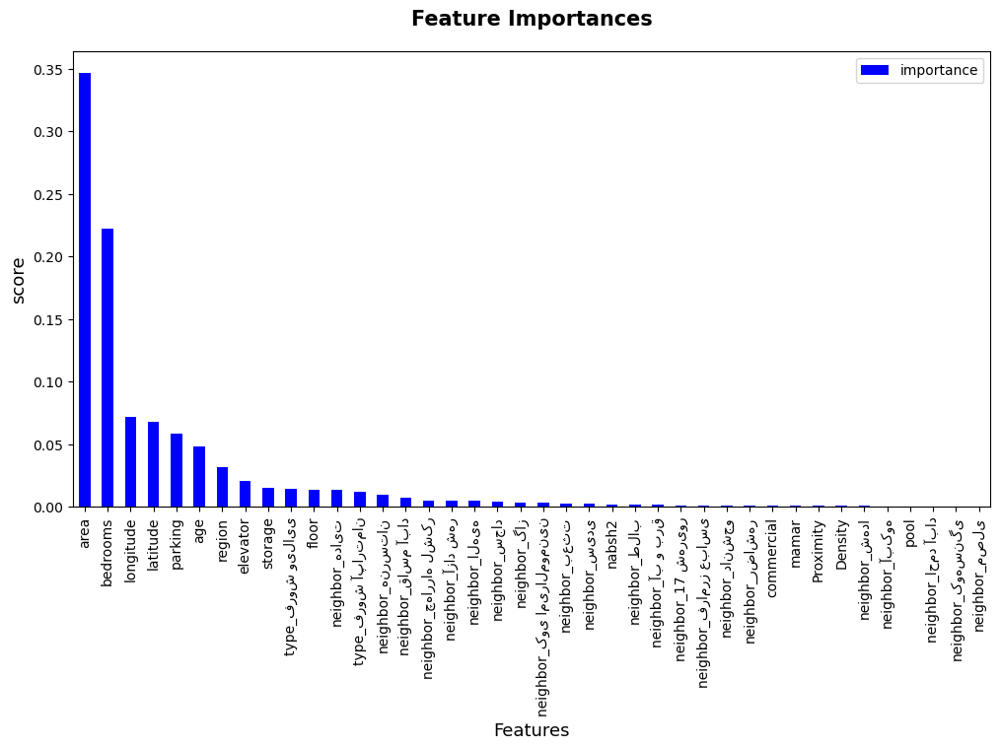

In [957]:
feature_importance(gb_model7)

In [853]:
# test_data = pd.read_csv("test.csv")
# test_data_ans32 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans32), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_model7.predict(X_test_s)
# X_test_s.to_csv("test_answer32.csv", index=False)

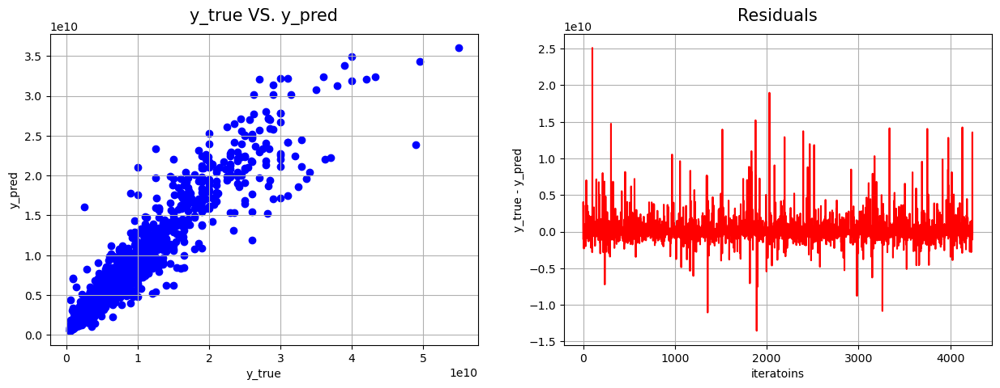

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.140406,79.820839,0.905542,85.444814,7.543673e+08
Train,0.126748,83.160459,0.923334,87.606367,6.815285e+08


In [955]:
gb_model8 = GradientBoostingRegressor(n_estimators=300, max_depth=10, min_samples_split=4, 
                                      min_samples_leaf=1, learning_rate=.02, random_state=0, max_features="sqrt",
                                     loss = "huber", alpha=0.6)
gb_model8.fit(X_train_s,y_train)
y_pred = gb_model8.predict(X_val_s)
y_pred_train = gb_model8.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

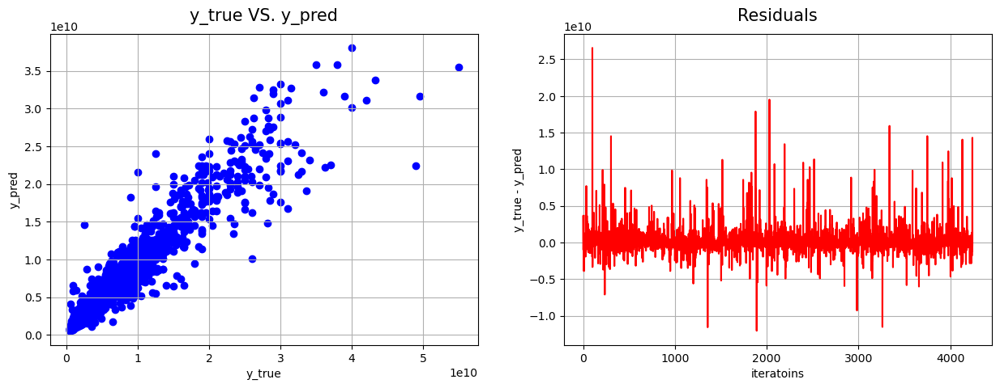

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.133779,81.471004,0.907177,86.270274,7.304777e+08
Train,0.086022,90.785269,0.947903,92.324437,4.955153e+08


In [960]:
gb_model8 = GradientBoostingRegressor(n_estimators=300, max_depth=18, min_samples_split=11, 
                                      min_samples_leaf=2, learning_rate=.02, random_state=0, max_features="sqrt",
                                     loss = "huber", alpha=0.6)
gb_model8.fit(X_train_s,y_train)
y_pred = gb_model8.predict(X_val_s)
y_pred_train = gb_model8.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

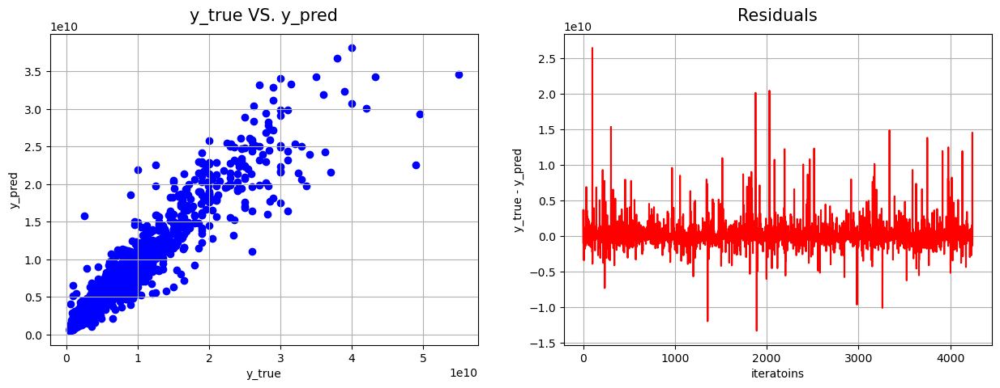

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.133769,82.107496,0.906956,86.475379,7.295002e+08
Train,0.084720,91.005291,0.948656,92.466282,4.897380e+08


In [963]:
gb_model8 = GradientBoostingRegressor(n_estimators=300, max_depth=18, min_samples_split=10, 
                                      min_samples_leaf=2, learning_rate=.02, random_state=0, max_features="sqrt",
                                     loss = "huber", alpha=0.6)
gb_model8.fit(X_train_s,y_train)
y_pred = gb_model8.predict(X_val_s)
y_pred_train = gb_model8.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

In [964]:
# test_data = pd.read_csv("test.csv")
# test_data_ans33 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans33), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_model8.predict(X_test_s)
# X_test_s.to_csv("test_answer33.csv", index=False)

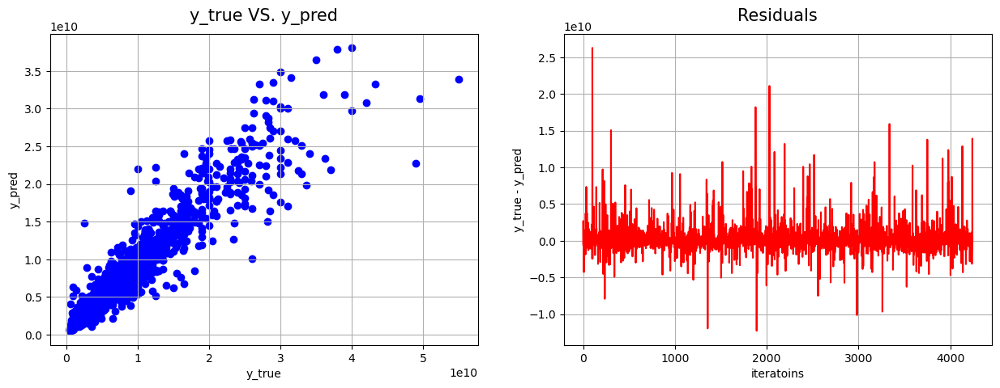

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.133831,81.588873,0.905146,86.240110,7.349159e+08
Train,0.068225,93.150506,0.958325,94.053508,4.087921e+08


In [966]:
gb_model8 = GradientBoostingRegressor(n_estimators=300, max_depth=25, min_samples_split=10, 
                                      min_samples_leaf=2, learning_rate=.02, random_state=0, max_features="sqrt",
                                     loss = "huber", alpha=0.5)
gb_model8.fit(X_train_s,y_train)
y_pred = gb_model8.predict(X_val_s)
y_pred_train = gb_model8.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

#### n_estimator 450

In [918]:
# params = {"n_estimators" : [150, 200, 300, 450], 
#          "alpha" : [.1, .3, .6, .7, .9],
#          "learning_rate" : [0.01, 0.02, 0.05,0.1,0.5,0.8]}
# gs_model = GridSearchCV(GradientBoostingRegressor(loss="huber", max_features="sqrt", random_state=0), param_grid=params,
#                        n_jobs=-1, verbose=1, scoring=make_scorer(range_accuracy))

In [919]:
# gs_model.fit(X_train_s, y_train)

In [895]:
gs_model.best_score_, gs_model.best_params_

(75.68757956572166, {'alpha': 0.6, 'learning_rate': 0.5, 'n_estimators': 450})

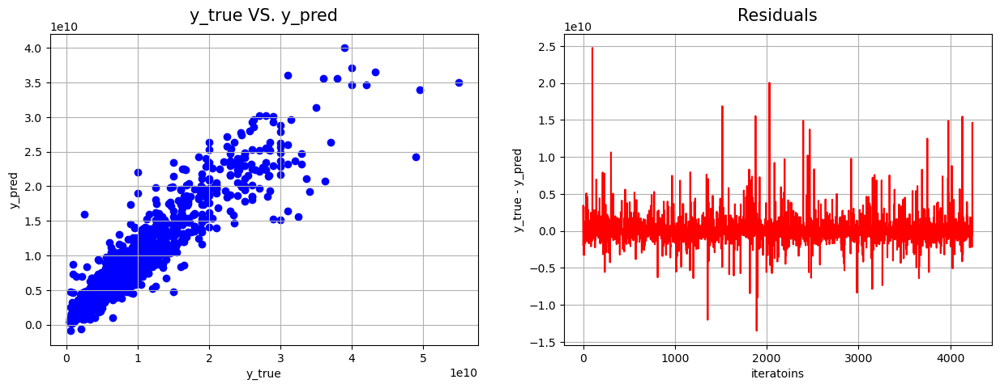

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.155383,76.803395,0.904001,83.888388,8.056536e+08
Train,0.151286,77.885169,0.903488,84.368477,7.900292e+08


In [898]:
gb_model9 = GradientBoostingRegressor(n_estimators=450, max_features="sqrt",
                                     loss = "huber", alpha=0.6,learning_rate = .5,random_state=0)
gb_model9.fit(X_train_s,y_train)
y_pred = gb_model9.predict(X_val_s)
y_pred_train = gb_model9.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

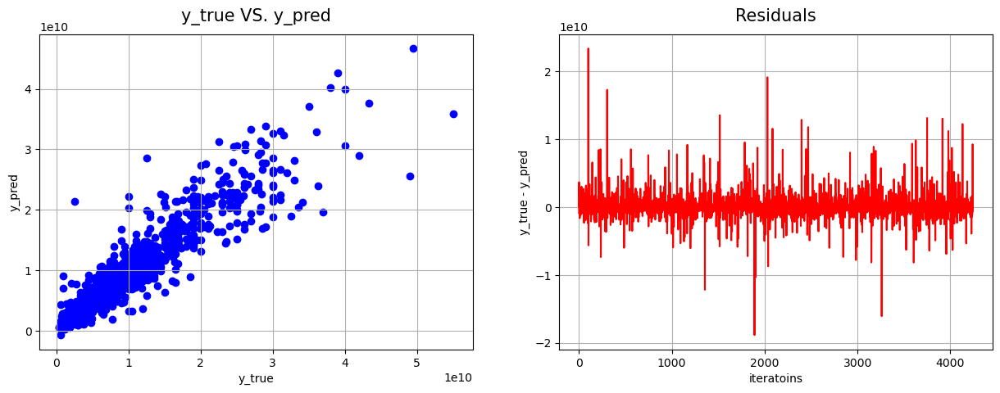

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.150003,77.817067,0.903722,84.396320,7.889893e+08
Train,0.124866,83.034732,0.935423,88.030168,6.374909e+08


In [901]:
gb_model9 = GradientBoostingRegressor(n_estimators=450, max_features="sqrt",
                                     loss = "huber", alpha=0.6,learning_rate = .5,random_state=0, max_depth = 5)
gb_model9.fit(X_train_s,y_train)
y_pred = gb_model9.predict(X_val_s)
y_pred_train = gb_model9.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

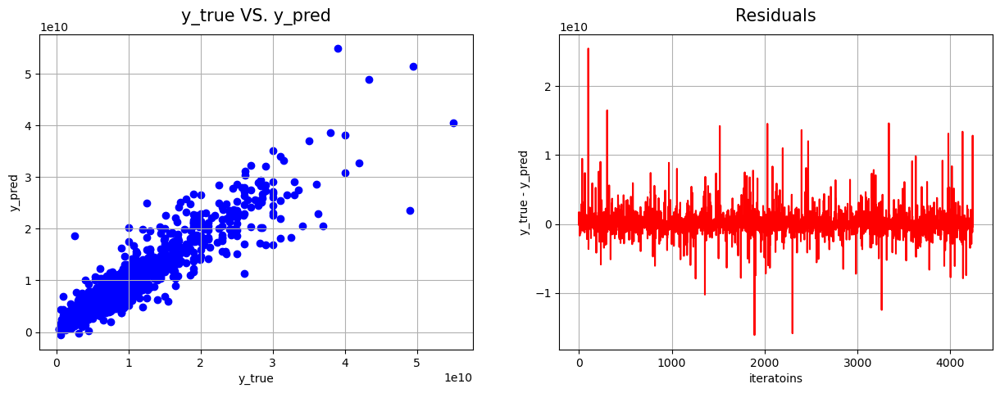

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.148842,78.288543,0.904717,84.625318,7.909622e+08
Train,0.111423,85.900257,0.946103,89.789417,5.670988e+08


In [902]:
gb_model9 = GradientBoostingRegressor(n_estimators=450, max_features="sqrt",
                                     loss = "huber", alpha=0.6,learning_rate = .5,random_state=0, max_depth = 6)
gb_model9.fit(X_train_s,y_train)
y_pred = gb_model9.predict(X_val_s)
y_pred_train = gb_model9.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

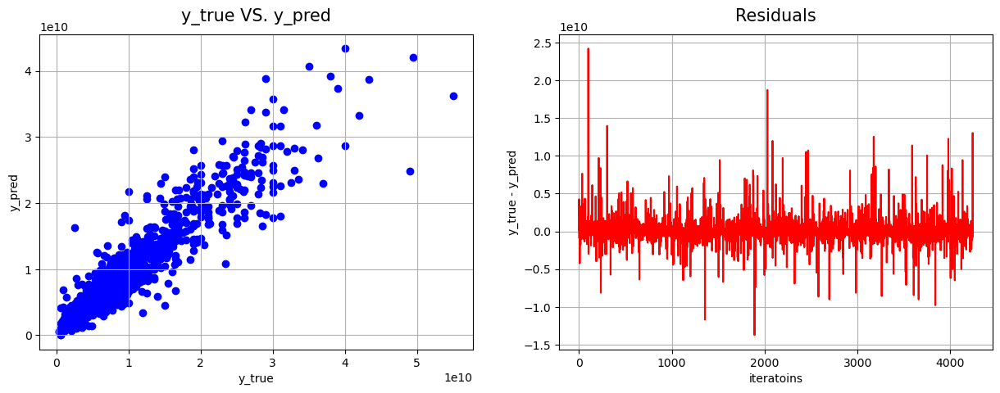

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.140852,80.009430,0.911075,85.677255,7.591942e+08
Train,0.074415,91.929907,0.970795,93.855981,3.788872e+08


In [920]:
gb_model9 = GradientBoostingRegressor(n_estimators=450, max_features="sqrt",
                                     loss = "huber", alpha=0.6,learning_rate = .2,random_state=0, max_depth = 10,
                                     min_samples_split=3)
gb_model9.fit(X_train_s,y_train)
y_pred = gb_model9.predict(X_val_s)
y_pred_train = gb_model9.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

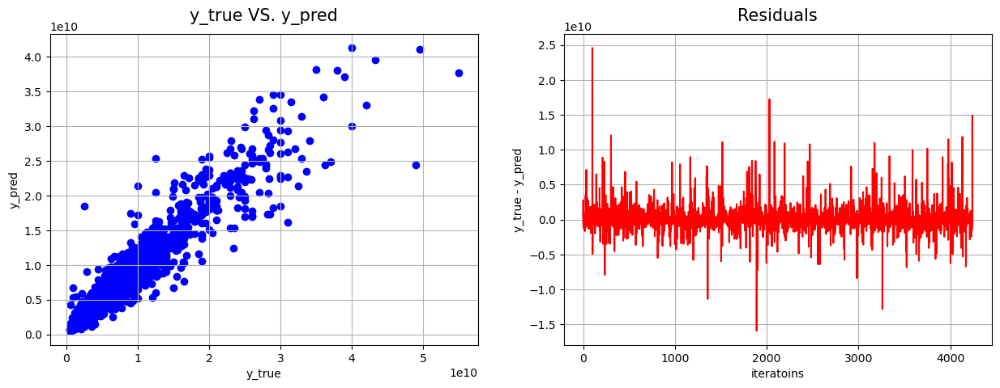

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.136308,80.598774,0.916829,86.216957,7.289303e+08
Train,0.092076,89.475614,0.960804,92.116141,4.705723e+08


In [924]:
gb_model9 = GradientBoostingRegressor(n_estimators=450, max_features="sqrt",
                                     loss = "huber", alpha=0.6,learning_rate = .1,random_state=0, max_depth = 10,
                                     min_samples_split=4)
gb_model9.fit(X_train_s,y_train)
y_pred = gb_model9.predict(X_val_s)
y_pred_train = gb_model9.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

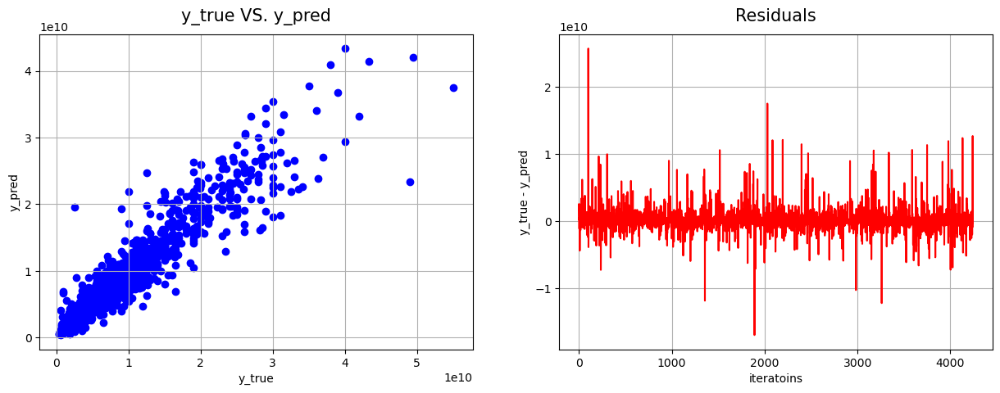

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.136706,81.164545,0.915002,86.331370,7.317062e+08
Train,0.090828,89.664205,0.961680,92.249823,4.636831e+08


In [925]:
gb_model9 = GradientBoostingRegressor(n_estimators=450, max_features="sqrt",
                                     loss = "huber", alpha=0.6,learning_rate = .1,random_state=0, max_depth = 10,
                                     min_samples_split=3)
gb_model9.fit(X_train_s,y_train)
y_pred = gb_model9.predict(X_val_s)
y_pred_train = gb_model9.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

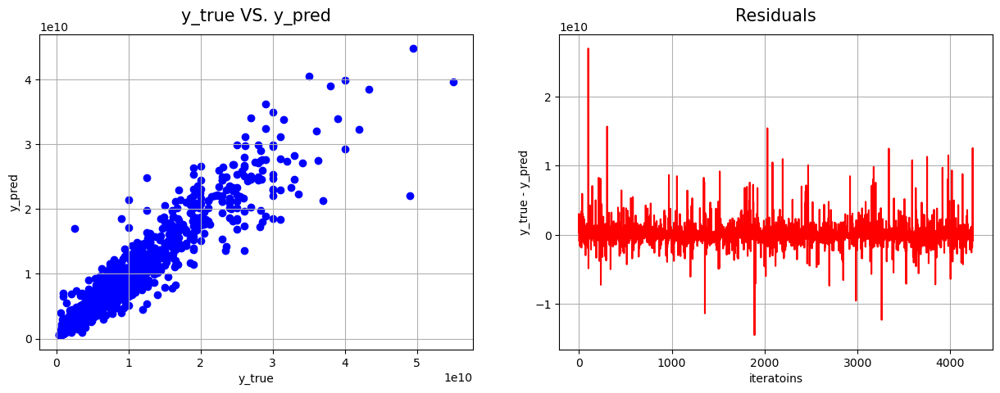

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.135657,81.258840,0.916788,86.457305,7.251663e+08
Train,0.078894,91.709885,0.966532,93.491226,4.109726e+08


In [930]:
gb_model9 = GradientBoostingRegressor(n_estimators=450, max_features="sqrt",
                                     loss = "huber", alpha=0.6,learning_rate = .07,random_state=0, max_depth = 12,
                                     min_samples_split=4)
gb_model9.fit(X_train_s,y_train)
y_pred = gb_model9.predict(X_val_s)
y_pred_train = gb_model9.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

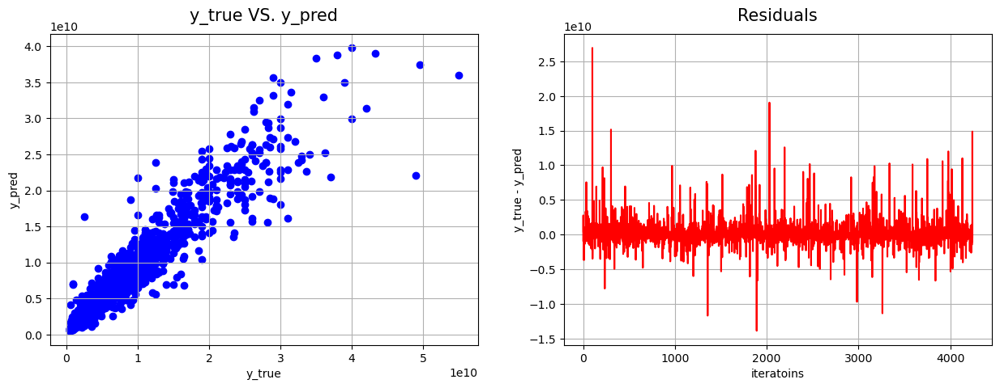

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.134409,81.471004,0.913742,86.468129,7.272198e+08
Train,0.085104,90.774792,0.963764,92.880242,4.437381e+08


In [932]:
gb_model9 = GradientBoostingRegressor(n_estimators=450, max_features="sqrt",
                                     loss = "huber", alpha=0.6,learning_rate = .05,random_state=0, max_depth = 12,
                                     min_samples_split=3)
gb_model9.fit(X_train_s,y_train)
y_pred = gb_model9.predict(X_val_s)
y_pred_train = gb_model9.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

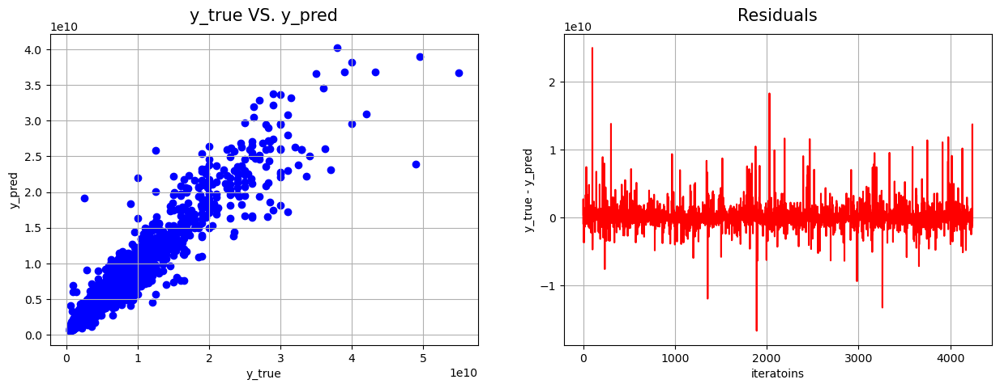

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.135361,81.706742,0.915772,86.582624,7.246022e+08
Train,0.082049,91.288176,0.967356,93.272929,4.237983e+08


In [936]:
gb_model9 = GradientBoostingRegressor(n_estimators=450, max_features="sqrt",
                                     loss = "huber", alpha=0.6,learning_rate = .05,random_state=0, max_depth = 12,
                                     min_samples_split=2)
gb_model9.fit(X_train_s,y_train)
y_pred = gb_model9.predict(X_val_s)
y_pred_train = gb_model9.predict(X_train_s)
eval(y_val, y_pred, y_train, y_pred_train)

In [938]:
# test_data = pd.read_csv("test.csv")
# test_data_ans33 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans33), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_model9.predict(X_test_s)
# X_test_s.to_csv("test_answer33.csv", index=False)

In [942]:
# gb_model9 = GradientBoostingRegressor(n_estimators=450, max_features="sqrt",
#                                      loss = "huber", alpha=0.6,learning_rate = .02,random_state=0, max_depth = 20,
#                                      min_samples_split=2)
# gb_model9.fit(X_train_s,y_train)
# y_pred = gb_model9.predict(X_val_s)
# y_pred_train = gb_model9.predict(X_train_s)
# eval(y_val, y_pred, y_train, y_pred_train)

### other 2

count    3.817800e+04
mean     5.498928e+09
std      5.230065e+09
min      3.500000e+08
25%      2.600000e+09
50%      3.850000e+09
75%      6.500000e+09
max      7.100000e+10
Name: price, dtype: float64
count    4.242000e+03
mean     5.505522e+09
std      5.182107e+09
min      4.000000e+08
25%      2.660000e+09
50%      3.900000e+09
75%      6.500000e+09
max      5.500000e+10
Name: price, dtype: float64


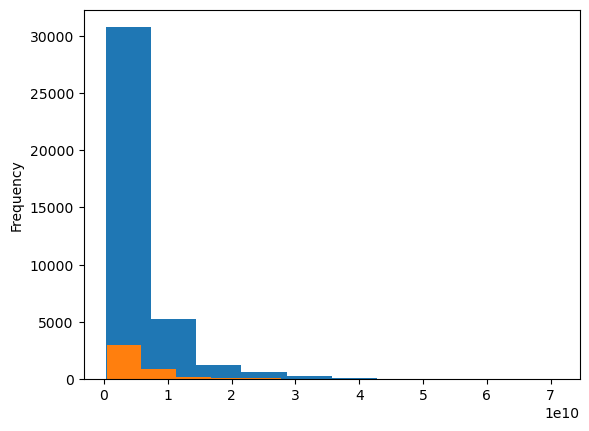

In [988]:
X_train2, X_val2, y_train2, y_val2, X_train_s2, X_val_s2, scaler2 = split_data(k_data_new4, random_state=100, test_size=.1) 

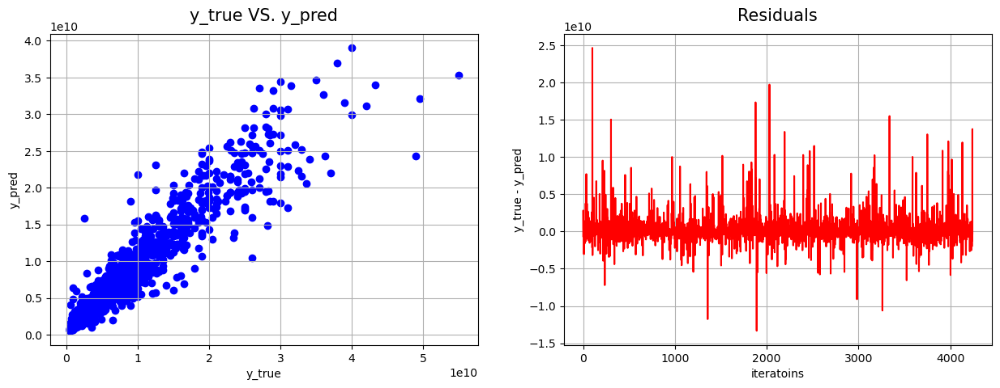

,MAPE,Range_Accuracy,R2,MRR_Mean,MAE
Test,0.133637,81.94248,0.907731,86.450633,7.331749e+08
Train,0.076234,92.26256,0.953803,93.339793,4.490000e+08


In [993]:
gb_model10 = GradientBoostingRegressor(n_estimators=300, max_depth=20, min_samples_split=9, 
                                      min_samples_leaf=2, learning_rate=.02, random_state=0, max_features="sqrt",
                                     loss = "huber", alpha=0.6)
gb_model10.fit(X_train_s2,y_train2)
y_pred2 = gb_model10.predict(X_val_s2)
y_pred_train2 = gb_model10.predict(X_train_s2)
eval(y_val2, y_pred2, y_train2, y_pred_train2)

In [986]:
# test_data = pd.read_csv("test.csv")
# test_data_ans34 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans34), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_model10.predict(X_test_s)
# X_test_s.to_csv("test_answer34.csv", index=False)

In [ ]:
# pip install scikit-optimize

In [ ]:
# from skopt import BayesSearchCV
# from skopt.space import Real, Integer

# # Define the hyperparameter search space
# param_space = {
#     'n_estimators': [200, 300, 500],
#     'learning_rate': [0.02, 0.05,0.1],
#     'max_depth': [10, 20, 30],
#     'min_samples_split': [10, 20, 30],
#     'min_samples_leaf': [2, 4, 7],
# }

# # Create a GradientBoostingRegressor
# gbm = GradientBoostingRegressor()

# # # Create a BayesSearchCV object
# bayesian_search = BayesSearchCV(
#     gbm, search_spaces=param_space,  scoring=make_scorer(r2_score), n_jobs=-1, cv=3, random_state=42)

# # # Fit the Bayesian search to your data
# bayesian_search.fit(X_train_s, y_train)


In [ ]:
# bayesian_search.best_score_, bayesian_search.best_params_

(0.8978278215504785,
 OrderedDict([('learning_rate', 0.11626413952845077),
              ('max_depth', 5),
              ('min_samples_leaf', 20),
              ('min_samples_split', 20),
              ('n_estimators', 500)]))

In [ ]:
# gb_mode5 = GradientBoostingRegressor(n_estimators = 500,)
# gb_mode5.fit(X_train_s,y_train)
# y_pred = gb_mode5.predict(X_val_s)
# y_pred_train = gb_mode5.predict(X_train_s)
# eval(y_val, y_pred, y_train, y_pred_train)

In [ ]:
# test_data = pd.read_csv("test.csv")
# test_data_ans16 = test_clean(test_data)
# X_test_s = pd.DataFrame(scaler.transform(test_data_ans16), columns = scaler.feature_names_in_)
# X_test_s["price"] = gb_mode5.predict(X_test_s)
# X_test_s.to_csv("test_answer16.csv", index=False)